In [1]:
from textblob import TextBlob
import csv
import sys
import statistics 
import re
import operator
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import re
import operator
from sklearn.metrics import f1_score,accuracy_score,confusion_matrix,recall_score,precision_score
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import stopwords 
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
!{sys.executable} -m pip install pyspellchecker
from spellchecker import SpellChecker

In [2]:
def getHistogram(tweets_sorted):
    x = [d['polarity'] for d in tweets_sorted]
    num_bins = 21
    n, bins, patches = plt.hist(x, num_bins, facecolor='green', alpha=0.5)
    plt.xlabel('Polarity')
    plt.ylabel('Probability')
    plt.title(r'Histogram of polarity')
    plt.subplots_adjust(left=0.15)
    plt.show()


In [3]:
def lemmatize(sentence):
    lemmatizer = WordNetLemmatizer() 
    words=word_tokenize(sentence)
    s=""
    for i in words:
        temp=lemmatizer.lemmatize(i)
        s=s+temp+' '
    return s

In [4]:
    
def removeStopWords(sentence):
    stp=list(set(stopwords.words('english')))
    words=word_tokenize(sentence)
    s=""
    for i in words:
        if i not in stp:
            s=s+i+' '
    return s

In [5]:
    
def putCalculatedValues(clusters,a,b,c):
    calSentiments=[]
    for i in clusters:
        if(i==a):
            calSentiments.append('positive')
        elif(i==b):
            calSentiments.append('neutral')
        else:
            calSentiments.append('negative')
    return calSentiments

In [6]:
def findIndex(word,l):
    i=0
    while(i<len(l)):
        if(l[i] == word):
            return i
        i=i+1
    return -1

In [7]:
def barGraph(count,apps):
    y_pos = np.arange(len(apps))
    plt.bar(y_pos,count, align='center', alpha=0.5)
    plt.xticks(y_pos,apps)
    plt.ylabel('No of tweets for each App')
    plt.title('APPS')
    plt.show()

In [8]:
def getPieChart(positive_tweets,negative_tweets,neutral_tweets):
    pos = len(positive_tweets)
    neu = len(negative_tweets)
    neg = len(neutral_tweets)
    labels = 'Positive', 'Neutral', 'Negative'
    sizes = [pos, neu, neg]
    colors = ['yellowgreen', 'gold', 'lightcoral']
    plt.pie(sizes, labels=labels, colors=colors,
            autopct='%1.1f%%', shadow=True, startangle=90)
    plt.axis('equal')
    plt.show()

In [9]:
def strip_non_ascii(string):
    ''' Returns the string without non ASCII characters'''
    stripped = (c for c in string if 0 < ord(c) < 127)
    return ''.join(stripped)



In [10]:
def determineAccuracy(calSentiment,actualSentiment):
    count=0
    i=0
    for j in calSentiment:
        if j == actualSentiment[i]: 
            count=count+1
        i=i+1
    length=len(actualSentiment)
    res=count*100
    res=res/length
    return res

In [11]:

def correctSpelling(sentence):
    spell = SpellChecker()
    words=word_tokenize(sentence)
    misspelled = list(spell.unknown(words))
    l=[]
    for word in misspelled:
        correctSpelling=spell.correction(word)
        l.append(correctSpelling)
    s=""
    for word in words:
        if word in misspelled:
            index=findIndex(word,misspelled)
            word=l[index]
        s=s+word+' '
    return s

In [12]:


def Metrics(calSentiment,actualSentiment):
    print("The f1Score is = ",f1_score(actualSentiment,calSentiment,average='macro'),"\n")
    print("The Confusion Matix is = \n",confusion_matrix(actualSentiment,calSentiment),"\n")
    print("The accuracy is = ",accuracy_score(actualSentiment,calSentiment),"\n")
    print("The recall is = ",recall_score(actualSentiment,calSentiment, average="macro"),"\n")
    print("The Precision is = ",precision_score(actualSentiment,calSentiment, average="macro"),"\n")



In [13]:

def polarity(tweets,actualSentiment):
    calSentiment=[]
    for tweet in tweets:
        tweet['polarity'] = float(tweet['TextBlob'].sentiment.polarity)
        tweet['subjectivity'] = float(tweet['TextBlob'].sentiment.subjectivity)
        if tweet['polarity'] >= 0.1:
            tweet['sentiment'] = 'positive'
        elif tweet['polarity'] <= -0.1:
            tweet['sentiment'] = 'negative'
        else:
            tweet['sentiment'] = 'neutral'
        calSentiment.append(tweet['sentiment'])
    tweets_sorted = sorted(tweets, key=lambda k: k['polarity'])
    negative_tweets = [d for d in tweets_sorted if d['sentiment'] == 'negative']
    positive_tweets = [d for d in tweets_sorted if d['sentiment'] == 'positive']
    neutral_tweets = [d for d in tweets_sorted if d['sentiment'] == 'neutral']
    Metrics(calSentiment,actualSentiment)
    #getHistogram(tweets_sorted)
    getPieChart(positive_tweets,negative_tweets,neutral_tweets)



In [14]:


def everything(actualSentiment,tweets):
        reader = pd.read_csv('../data/sentiment/playstore.csv')
        reader=reader.dropna()
        for index,row in reader.iterrows():
                tweet={}
                tweet['orig'] = row['Translated_Review']
                if re.match(r'^RT.*', tweet['orig']):
                    continue

                tweet['clean'] = tweet['orig']

                tweet['clean'] = strip_non_ascii(tweet['clean'])

                tweet['clean'] = tweet['clean'].lower()
                
                #tweet['clean'] = lemmatize(tweet['clean'])
                
                #tweet['clean'] = removeStopWords(tweet['clean'])
                
                tweet['TextBlob'] = TextBlob(tweet['clean'])
                tweet['clean'] = re.sub(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', tweet['clean'])

                tweet['clean'] = re.sub(r'\bthats\b', 'that is', tweet['clean'])
                tweet['clean'] = re.sub(r'\bive\b', 'i have', tweet['clean'])
                tweet['clean'] = re.sub(r'\bim\b', 'i am', tweet['clean'])
                tweet['clean'] = re.sub(r'\bya\b', 'yeah', tweet['clean'])
                tweet['clean'] = re.sub(r'\bcant\b', 'can not', tweet['clean'])
                tweet['clean'] = re.sub(r'\bwont\b', 'will not', tweet['clean'])
                tweet['clean'] = re.sub(r'\bid\b', 'i would', tweet['clean'])
                tweet['clean'] = re.sub(r'wtf', 'what the fuck', tweet['clean'])
                tweet['clean'] = re.sub(r'\bwth\b', 'what the hell', tweet['clean'])
                tweet['clean'] = re.sub(r'\br\b', 'are', tweet['clean'])
                tweet['clean'] = re.sub(r'\bu\b', 'you', tweet['clean'])
                tweet['clean'] = re.sub(r'\bk\b', 'OK', tweet['clean'])
                tweet['clean'] = re.sub(r'\bsux\b', 'sucks', tweet['clean'])
                tweet['clean'] = re.sub(r'\bno+\b', 'no', tweet['clean'])
                tweet['clean'] = re.sub(r'\bcoo+\b', 'cool', tweet['clean'])
                
                tweet['clean'] = correctSpelling(tweet['clean'])
                      
                tweets.append(tweet)
                actualSentiment.append(row['Sentiment'].lower())
        polarity(tweets,actualSentiment)

In [15]:


def forEachApp(tweets):
        reader = pd.read_csv('../data/sentiment/playstore.csv')
        reader=reader.dropna()
        totalTweetCount=[]
        AllApps=reader.App.unique()
        for app in AllApps:
            df = reader[reader.App == app]
            actualSentiment=[]
            for index,row in df.iterrows():
                    tweet= dict()
                    tweet['orig'] = row['Translated_Review']
                    if re.match(r'^RT.*', tweet['orig']):
                        continue
                    tweet['clean'] = tweet['orig']

                    tweet['clean'] = strip_non_ascii(tweet['clean'])

                    tweet['clean'] = tweet['clean'].lower()
                    
                    tweet['clean'] = re.sub(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', tweet['clean'])

                    tweet['clean'] = re.sub(r'\bthats\b', 'that is', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bive\b', 'i have', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bim\b', 'i am', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bya\b', 'yeah', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bcant\b', 'can not', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bwont\b', 'will not', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bid\b', 'i would', tweet['clean'])
                    tweet['clean'] = re.sub(r'wtf', 'what the fuck', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bwth\b', 'what the hell', tweet['clean'])
                    tweet['clean'] = re.sub(r'\br\b', 'are', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bu\b', 'you', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bk\b', 'OK', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bsux\b', 'sucks', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bno+\b', 'no', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bcoo+\b', 'cool', tweet['clean'])
                    
                    #tweet['clean'] = correctSpelling(tweet['clean'])
                    
                    tweet['TextBlob'] = TextBlob(tweet['clean'])
                    tweets.append(tweet)
                    actualSentiment.append(row['Sentiment'].lower())
            totalTweetCount.append(len(tweets))
            polarity(tweets,actualSentiment)
            tweets.clear()
        barGraph(totalTweetCount,AllApps)
        topFiveApps=[]
        topFiveTweets=[]
        i=0
        while(i<5):
            index1, Maxvalue1 = max(enumerate(totalTweetCount), key=operator.itemgetter(1))
            topFiveApps.append(AllApps[index1])
            topFiveTweets.append(Maxvalue1)
            totalTweetCount.pop(index1)
            #AllApps=delete(AllApps,index1)
            i=i+1
        barGraph(topFiveTweets,topFiveApps)



In [16]:
        
def kMeans(actualSentiments,tweets):
        reader = pd.read_csv('../data/sentiment/playstore.csv')
        reader=reader.dropna()
        reader=reader.head(5000)
        q=[]
        for index,row in reader.iterrows():
                tweet={}
                tweet['orig'] = row['Translated_Review']
                
                if re.match(r'^RT.*', tweet['orig']):
                    continue

                tweet['clean'] = tweet['orig']

                tweet['clean'] = strip_non_ascii(tweet['clean'])

                tweet['clean'] = tweet['clean'].lower()
                tweet['clean'] = lemmatize(tweet['clean'])
                
                tweet['clean'] = removeStopWords(tweet['clean'])
                
                tweet['clean'] = re.sub(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', tweet['clean'])

                tweet['clean'] = re.sub(r'\bthats\b', 'that is', tweet['clean'])
                tweet['clean'] = re.sub(r'\bive\b', 'i have', tweet['clean'])
                tweet['clean'] = re.sub(r'\bim\b', 'i am', tweet['clean'])
                tweet['clean'] = re.sub(r'\bya\b', 'yeah', tweet['clean'])
                tweet['clean'] = re.sub(r'\bcant\b', 'can not', tweet['clean'])
                tweet['clean'] = re.sub(r'\bwont\b', 'will not', tweet['clean'])
                tweet['clean'] = re.sub(r'\bid\b', 'i would', tweet['clean'])
                tweet['clean'] = re.sub(r'wtf', 'what the fuck', tweet['clean'])
                tweet['clean'] = re.sub(r'\bwth\b', 'what the hell', tweet['clean'])
                tweet['clean'] = re.sub(r'\br\b', 'are', tweet['clean'])
                tweet['clean'] = re.sub(r'\bu\b', 'you', tweet['clean'])
                tweet['clean'] = re.sub(r'\bk\b', 'OK', tweet['clean'])
                tweet['clean'] = re.sub(r'\bsux\b', 'sucks', tweet['clean'])
                tweet['clean'] = re.sub(r'\bno+\b', 'no', tweet['clean'])
                tweet['clean'] = re.sub(r'\bcoo+\b', 'cool', tweet['clean'])
                
                tweet['clean'] = correctSpelling(tweet['clean'])
                    
                tweet['actual'] = row['Sentiment'].lower()
                actualSentiments.append(row['Sentiment'].lower())
                tweets.append(tweet['clean'])
                q.append(tweet['actual'])
        tf_idf_vect = CountVectorizer(analyzer='word',ngram_range=(1,1),stop_words='english', min_df = 0.0001)
        tf_idf_vect.fit(tweets)
        desc_matrix = tf_idf_vect.transform(tweets)
        
        num_clusters = 3
        km = KMeans(n_clusters=num_clusters)
        km.fit(desc_matrix)
        clusters = km.labels_.tolist()
        m = statistics.mode(clusters)
        if(m==0):
            calSentiments=putCalculatedValues(clusters,0,1,2)
        elif(m==1):
            calSentiments=putCalculatedValues(clusters,1,2,0)
        else:
            calSentiments=putCalculatedValues(clusters,2,0,1)
        Metrics(calSentiments,actualSentiments)  

In [27]:
def tweetAsAnInput(sentence):
                    tweet= {}
                    tweet['orig'] = sentence
                    if re.match(r'^RT.*', tweet['orig']):
                        return "Not a proper Tweet"
                    tweet['clean'] = tweet['orig']

                    tweet['clean'] = strip_non_ascii(tweet['clean'])

                    tweet['clean'] = tweet['clean'].lower()
                    
                    tweet['clean'] = lemmatize(tweet['clean'])
                    
                    #tweet['clean'] = removeStopWords(tweet['clean'])
                    tweet['clean'] = re.sub(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', tweet['clean'])

                    tweet['clean'] = re.sub(r'\bthats\b', 'that is', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bive\b', 'i have', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bim\b', 'i am', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bya\b', 'yeah', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bcant\b', 'can not', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bwont\b', 'will not', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bid\b', 'i would', tweet['clean'])
                    tweet['clean'] = re.sub(r'wtf', 'what the fuck', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bwth\b', 'what the hell', tweet['clean'])
                    tweet['clean'] = re.sub(r'\br\b', 'are', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bu\b', 'you', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bk\b', 'OK', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bsux\b', 'sucks', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bno+\b', 'no', tweet['clean'])
                    tweet['clean'] = re.sub(r'\bcoo+\b', 'cool', tweet['clean'])
                    tweet['clean'] = correctSpelling(tweet['clean'])
                    tweet['TextBlob'] = TextBlob(tweet['clean'])
                    tweet['polarity'] = float(tweet['TextBlob'].sentiment.polarity)
                    if tweet['polarity'] >= 0.1:
                        tweet['sentiment'] = 'positive'
                    elif tweet['polarity'] <= -0.1:
                        tweet['sentiment'] = 'negative'
                    else:
                        tweet['sentiment'] = 'neutral'
                    return tweet['sentiment']
                    
    

In [23]:
calSentiment=[]
actualSentiment=[]
tweets=[]

The f1Score is =  0.8027033015125141 

The Confusion Matix is = 
 [[ 5835  2436     0]
 [    0  5155     3]
 [    1  3108 20889]] 

The accuracy is =  0.851764768749833 

The recall is =  0.8584476280766866 

The Precision is =  0.8271685950116159 



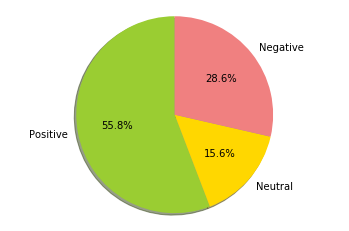

In [19]:
everything(actualSentiment,tweets)

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 10   0   0]
 [  0  22   0]
 [  0   0 162]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



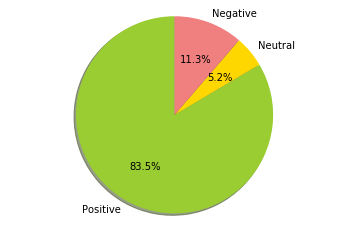

The f1Score is =  0.9518518518518517 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  8  0]
 [ 0  2 29]] 

The accuracy is =  0.95 

The recall is =  0.978494623655914 

The Precision is =  0.9333333333333332 



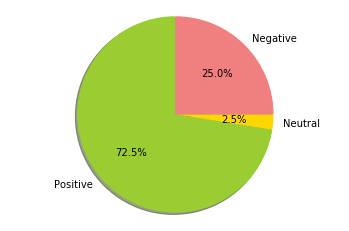

The f1Score is =  0.8686868686868686 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0  9  0]
 [ 0  2 21]] 

The accuracy is =  0.8974358974358975 

The recall is =  0.875776397515528 

The Precision is =  0.8974358974358975 



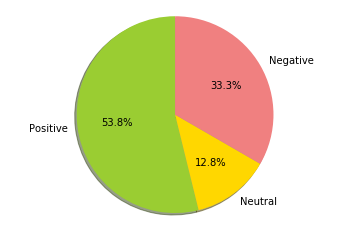

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0 10  0]
 [ 0  0 64]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



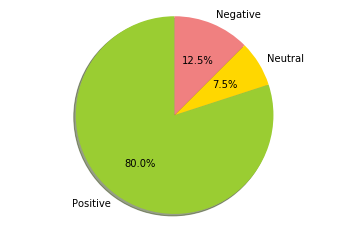

The f1Score is =  0.9038461538461539 

The Confusion Matix is = 
 [[ 8  0  0]
 [ 0  3  0]
 [ 0  2 25]] 

The accuracy is =  0.9473684210526315 

The recall is =  0.9753086419753086 

The Precision is =  0.8666666666666667 



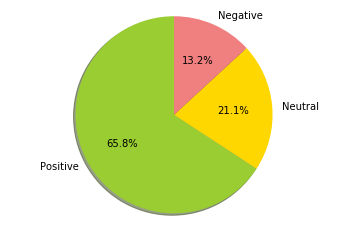

The f1Score is =  0.9675562532705388 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  6  0]
 [ 0  1 24]] 

The accuracy is =  0.96875 

The recall is =  0.9866666666666667 

The Precision is =  0.9523809523809524 



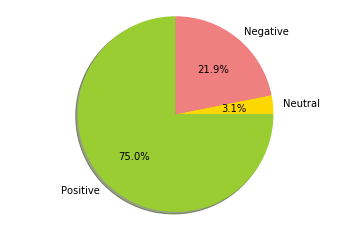

The f1Score is =  0.5999757663879802 

The Confusion Matix is = 
 [[ 4  6  0]
 [ 0  2  0]
 [ 0  5 63]] 

The accuracy is =  0.8625 

The recall is =  0.7754901960784313 

The Precision is =  0.717948717948718 



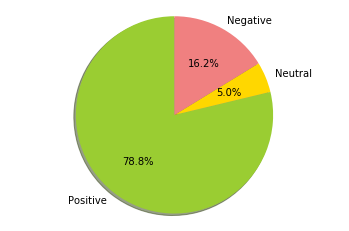

The f1Score is =  0.8841025641025642 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  5  0]
 [ 0  2 24]] 

The accuracy is =  0.9210526315789473 

The recall is =  0.9267399267399267 

The Precision is =  0.875 



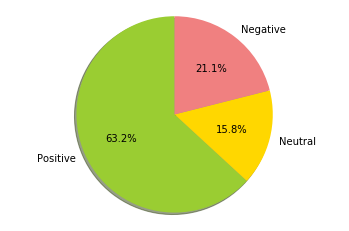

The f1Score is =  0.885925925925926 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0 11  0]
 [ 0  1 22]] 

The accuracy is =  0.925 

The recall is =  0.8743961352657005 

The Precision is =  0.9285714285714285 



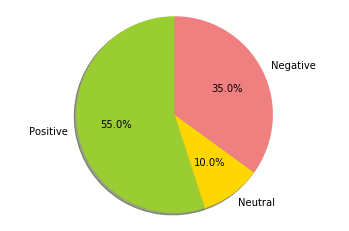

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  6  0]
 [ 0  0 31]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



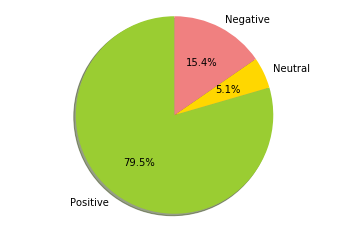

The f1Score is =  0.9248366013071895 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0 16  0]
 [ 0  0 17]] 

The accuracy is =  0.95 

The recall is =  0.9047619047619048 

The Precision is =  0.9629629629629629 



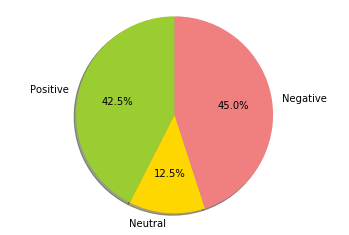

The f1Score is =  0.7332112332112333 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  2  0]
 [ 0  2 25]] 

The accuracy is =  0.9032258064516129 

The recall is =  0.808641975308642 

The Precision is =  0.7999999999999999 



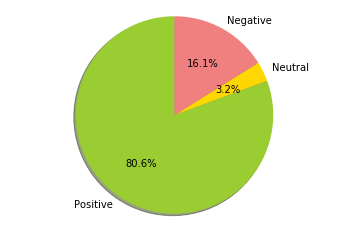

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0]
 [0 5]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



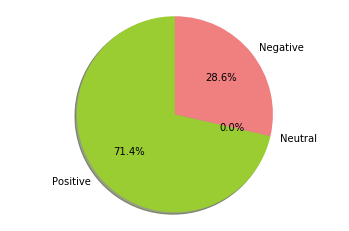

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



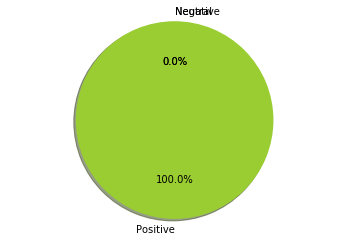

The f1Score is =  0.5791666666666667 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  0  0]
 [ 0  2 15]] 

The accuracy is =  0.85 

The recall is =  0.5163398692810457 

The Precision is =  0.6666666666666666 



/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


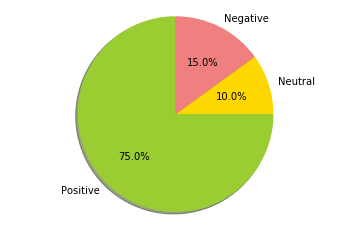

The f1Score is =  0.641025641025641 

The Confusion Matix is = 
 [[2 0 0]
 [0 0 0]
 [0 1 6]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.6190476190476191 

The Precision is =  0.6666666666666666 



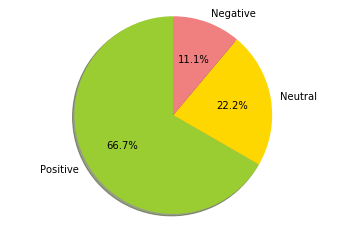

The f1Score is =  0.7529239766081871 

The Confusion Matix is = 
 [[1 1 0]
 [0 8 0]
 [0 2 3]] 

The accuracy is =  0.8 

The recall is =  0.7000000000000001 

The Precision is =  0.9090909090909092 



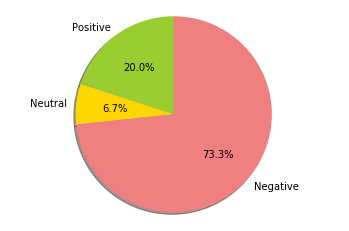

The f1Score is =  0.6190476190476191 

The Confusion Matix is = 
 [[0 1 0]
 [0 3 0]
 [0 0 5]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.6666666666666666 

The Precision is =  0.5833333333333334 



/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


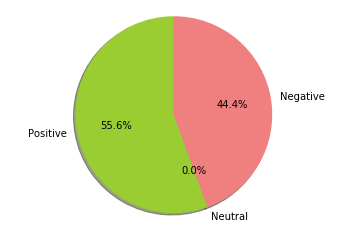

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 7]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



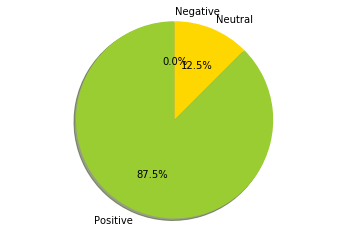

The f1Score is =  0.4 

The Confusion Matix is = 
 [[0 0]
 [3 6]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.3333333333333333 

The Precision is =  0.5 



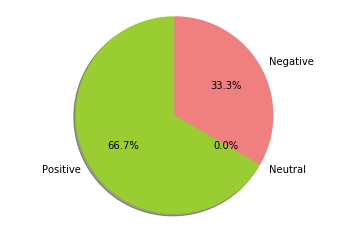

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0]
 [ 0 10]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



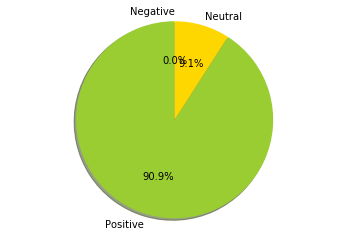

The f1Score is =  0.4666666666666666 

The Confusion Matix is = 
 [[ 1  3  0]
 [ 0  0  0]
 [ 0  0 10]] 

The accuracy is =  0.7857142857142857 

The recall is =  0.4166666666666667 

The Precision is =  0.6666666666666666 



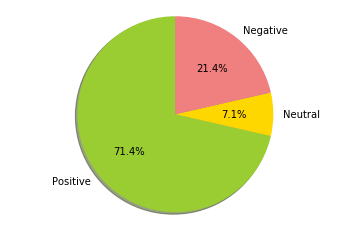

The f1Score is =  0.5492057362671634 

The Confusion Matix is = 
 [[51 55  0]
 [ 0  9  0]
 [ 0 31 73]] 

The accuracy is =  0.6073059360730594 

The recall is =  0.7276850507982583 

The Precision is =  0.6982456140350877 



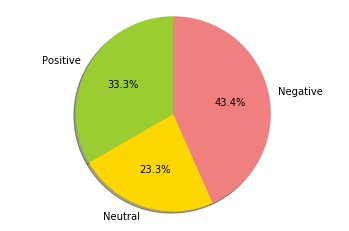

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0]
 [ 0 38]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



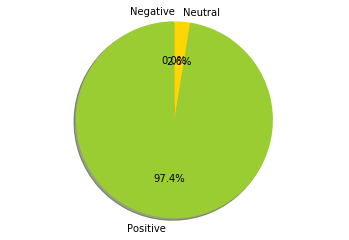

The f1Score is =  0.6310580090071923 

The Confusion Matix is = 
 [[  5  14   0]
 [  0  15   0]
 [  0  13 124]] 

The accuracy is =  0.8421052631578947 

The recall is =  0.7227557945959789 

The Precision is =  0.7857142857142857 



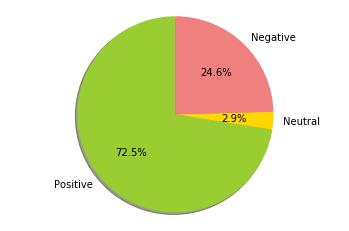

The f1Score is =  0.9765656565656565 

The Confusion Matix is = 
 [[20  0  0]
 [ 0 24  0]
 [ 0  2 32]] 

The accuracy is =  0.9743589743589743 

The recall is =  0.9803921568627452 

The Precision is =  0.9743589743589745 



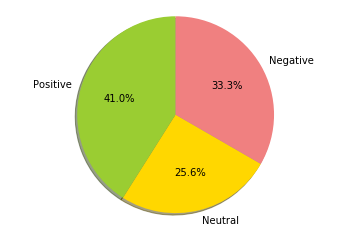

The f1Score is =  0.6234817813765182 

The Confusion Matix is = 
 [[12  2  0]
 [ 0  0  0]
 [ 0  2 18]] 

The accuracy is =  0.8823529411764706 

The recall is =  0.5857142857142857 

The Precision is =  0.6666666666666666 



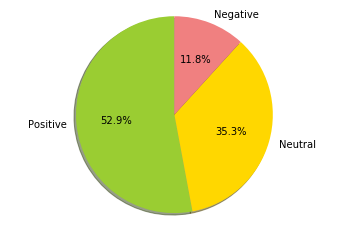

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 3]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



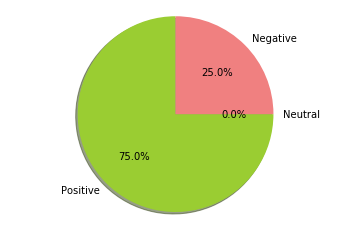

The f1Score is =  0.8721280602636535 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  5  0]
 [ 0  1 29]] 

The accuracy is =  0.9473684210526315 

The recall is =  0.8777777777777778 

The Precision is =  0.9047619047619048 



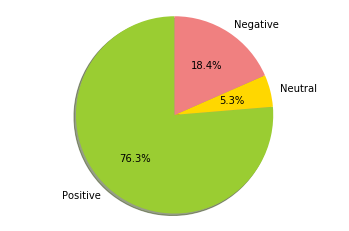

The f1Score is =  0.9584859584859585 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0 10  0]
 [ 0  0 24]] 

The accuracy is =  0.975609756097561 

The recall is =  0.9523809523809524 

The Precision is =  0.9696969696969697 



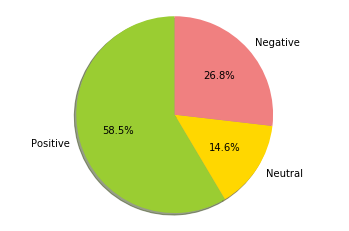

The f1Score is =  0.9407894736842106 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0 18  0]
 [ 0  0 57]] 

The accuracy is =  0.9761904761904762 

The recall is =  0.9259259259259259 

The Precision is =  0.9666666666666667 



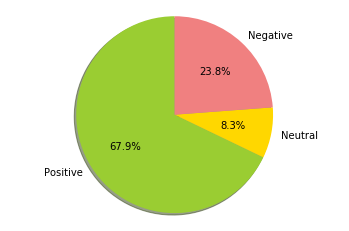

The f1Score is =  0.9408866995073892 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  6  0]
 [ 0  2 28]] 

The accuracy is =  0.9459459459459459 

The recall is =  0.9777777777777779 

The Precision is =  0.9166666666666666 



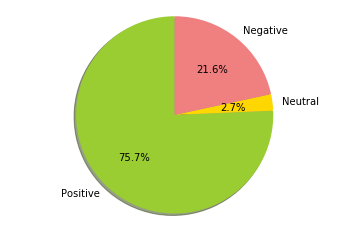

The f1Score is =  0.9665032679738562 

The Confusion Matix is = 
 [[29  0  0]
 [ 0 23  0]
 [ 0  2 16]] 

The accuracy is =  0.9714285714285714 

The recall is =  0.9629629629629629 

The Precision is =  0.9733333333333333 



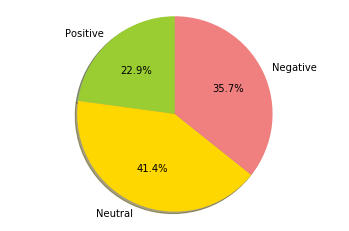

The f1Score is =  0.8957528957528957 

The Confusion Matix is = 
 [[ 6  2  0]
 [ 0  9  0]
 [ 0  1 18]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.8991228070175438 

The Precision is =  0.9166666666666666 



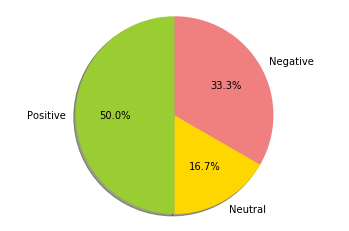

The f1Score is =  0.7598639455782313 

The Confusion Matix is = 
 [[ 6  3  0]
 [ 0  2  0]
 [ 0  1 24]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.8755555555555555 

The Precision is =  0.7777777777777777 



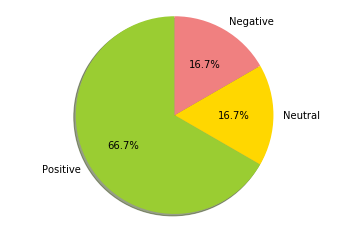

The f1Score is =  0.7793650793650794 

The Confusion Matix is = 
 [[ 5  5  0]
 [ 0  7  0]
 [ 0  1 17]] 

The accuracy is =  0.8285714285714286 

The recall is =  0.8148148148148149 

The Precision is =  0.8461538461538461 



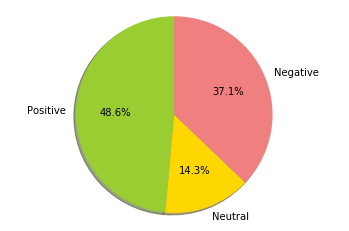

The f1Score is =  0.9029623477297896 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  7  0]
 [ 0  1 21]] 

The accuracy is =  0.9393939393939394 

The recall is =  0.9015151515151515 

The Precision is =  0.9259259259259259 



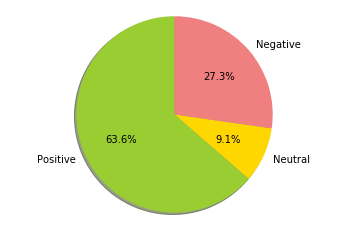

The f1Score is =  0.7565217391304347 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  3  0]
 [ 0  3 10]] 

The accuracy is =  0.7894736842105263 

The recall is =  0.8119658119658119 

The Precision is =  0.8095238095238096 



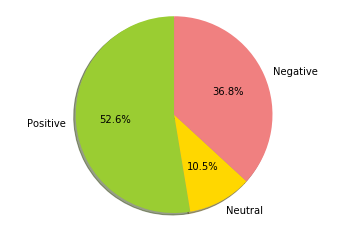

The f1Score is =  0.29629629629629634 

The Confusion Matix is = 
 [[0 1 0]
 [0 0 0]
 [0 1 4]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.26666666666666666 

The Precision is =  0.3333333333333333 



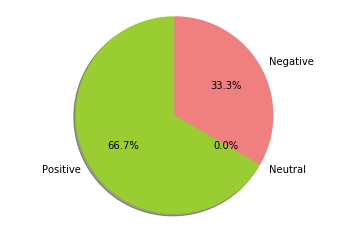

The f1Score is =  0.828956228956229 

The Confusion Matix is = 
 [[ 7  4  0]
 [ 0 10  0]
 [ 0  1  5]] 

The accuracy is =  0.8148148148148148 

The recall is =  0.8232323232323232 

The Precision is =  0.8888888888888888 



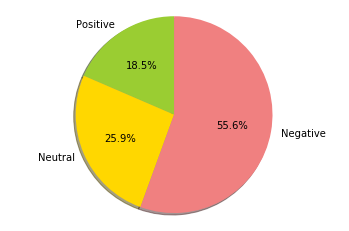

The f1Score is =  0.8397226118123734 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0  9  0]
 [ 0  3 14]] 

The accuracy is =  0.8484848484848485 

The recall is =  0.84593837535014 

The Precision is =  0.8809523809523809 



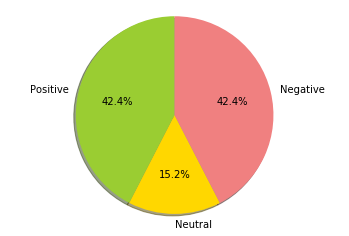

The f1Score is =  0.6912972085385878 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  1  0]
 [ 0  4 27]] 

The accuracy is =  0.8611111111111112 

The recall is =  0.8736559139784946 

The Precision is =  0.7222222222222223 



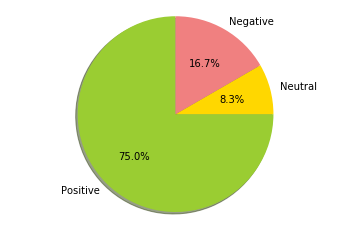

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  6  0]
 [ 0  0 25]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



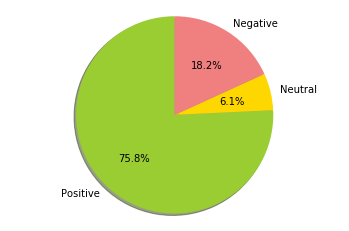

The f1Score is =  0.926530612244898 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  2  0]
 [ 0  1 24]] 

The accuracy is =  0.967741935483871 

The recall is =  0.9866666666666667 

The Precision is =  0.8888888888888888 



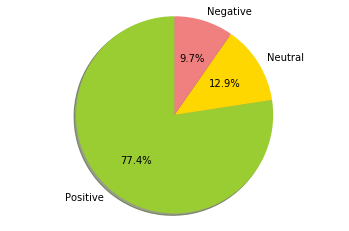

The f1Score is =  0.8531194295900179 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  9  0]
 [ 0  2 16]] 

The accuracy is =  0.8787878787878788 

The recall is =  0.8518518518518517 

The Precision is =  0.8974358974358975 



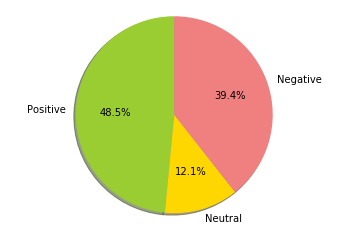

The f1Score is =  0.8564593301435407 

The Confusion Matix is = 
 [[ 4  3  0]
 [ 0  8  0]
 [ 0  0 19]] 

The accuracy is =  0.9117647058823529 

The recall is =  0.8571428571428571 

The Precision is =  0.9090909090909092 



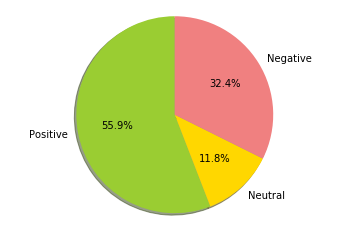

The f1Score is =  0.8601307189542484 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  8  0]
 [ 0  2 50]] 

The accuracy is =  0.9393939393939394 

The recall is =  0.8760683760683761 

The Precision is =  0.8888888888888888 



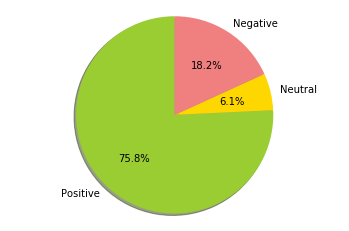

The f1Score is =  0.9130520895226777 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0 10  0]
 [ 0  1  8]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.8962962962962964 

The Precision is =  0.9444444444444445 



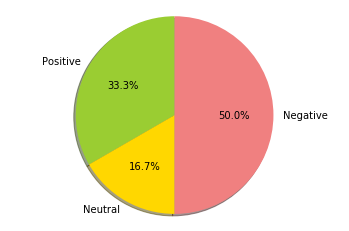

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0 0]
 [0 2 0]
 [0 0 3]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



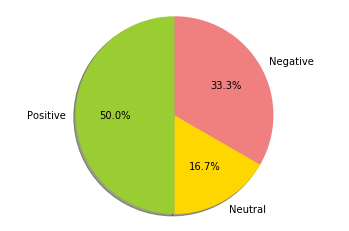

The f1Score is =  0.3333333333333333 

The Confusion Matix is = 
 [[1 0]
 [1 0]] 

The accuracy is =  0.5 

The recall is =  0.5 

The Precision is =  0.25 



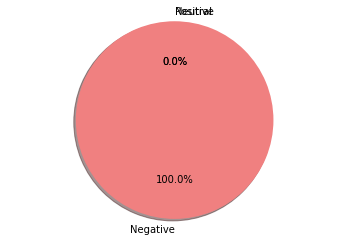

The f1Score is =  0.8755555555555555 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  1  0]
 [ 0  1 12]] 

The accuracy is =  0.9375 

The recall is =  0.9743589743589745 

The Precision is =  0.8333333333333334 



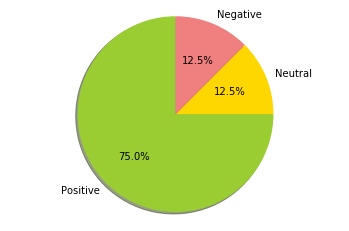

The f1Score is =  0.9076923076923077 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0  4  0]
 [ 0  2 12]] 

The accuracy is =  0.9130434782608695 

The recall is =  0.9523809523809524 

The Precision is =  0.8888888888888888 



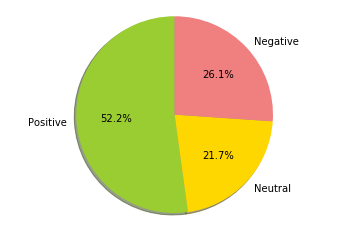

The f1Score is =  0.7559934318555008 

The Confusion Matix is = 
 [[ 6  3  0]
 [ 0  4  0]
 [ 0  3 13]] 

The accuracy is =  0.7931034482758621 

The recall is =  0.8263888888888888 

The Precision is =  0.7999999999999999 



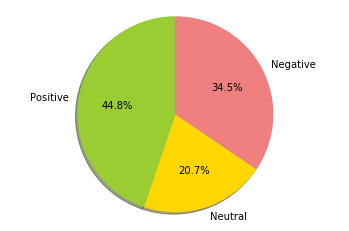

The f1Score is =  0.9645191409897292 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  8  0]
 [ 0  1 10]] 

The accuracy is =  0.95 

The recall is =  0.9696969696969697 

The Precision is =  0.9629629629629629 



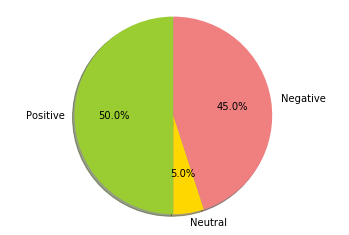

The f1Score is =  0.7464285714285714 

The Confusion Matix is = 
 [[5 4 0]
 [0 5 0]
 [0 2 9]] 

The accuracy is =  0.76 

The recall is =  0.7912457912457912 

The Precision is =  0.8181818181818182 



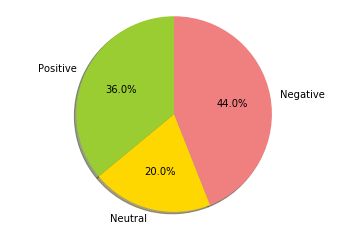

The f1Score is =  0.7225589225589225 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  1  0]
 [ 0  3 26]] 

The accuracy is =  0.8857142857142857 

The recall is =  0.8988505747126437 

The Precision is =  0.7333333333333334 



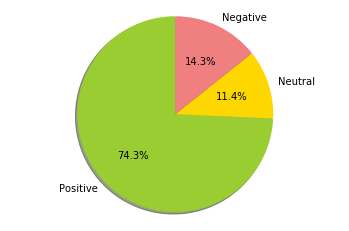

The f1Score is =  0.759041394335512 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  5  0]
 [ 0  5 20]] 

The accuracy is =  0.8055555555555556 

The recall is =  0.8222222222222223 

The Precision is =  0.8055555555555557 



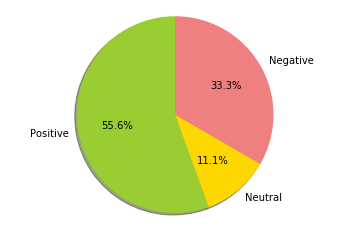

The f1Score is =  0.7501461988304094 

The Confusion Matix is = 
 [[14  4  0]
 [ 0  4  0]
 [ 0  3  8]] 

The accuracy is =  0.7878787878787878 

The recall is =  0.8350168350168351 

The Precision is =  0.787878787878788 



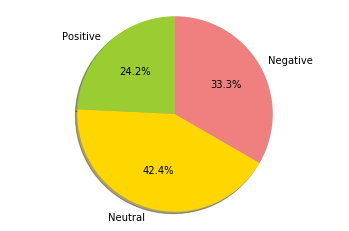

The f1Score is =  0.9 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  9  0]
 [ 0  0 56]] 

The accuracy is =  0.971830985915493 

The recall is =  0.8888888888888888 

The Precision is =  0.9393939393939394 



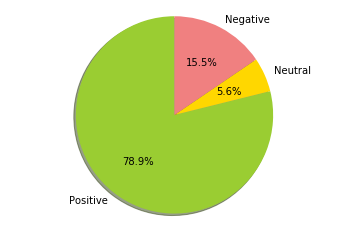

The f1Score is =  0.76520572450805 

The Confusion Matix is = 
 [[ 3  2  0]
 [ 0  4  0]
 [ 0  3 20]] 

The accuracy is =  0.84375 

The recall is =  0.8231884057971014 

The Precision is =  0.8148148148148149 



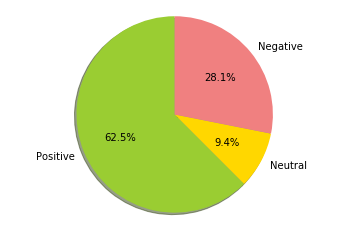

The f1Score is =  0.6598594642072902 

The Confusion Matix is = 
 [[5 2 0]
 [0 2 0]
 [0 5 9]] 

The accuracy is =  0.6956521739130435 

The recall is =  0.7857142857142857 

The Precision is =  0.7407407407407408 



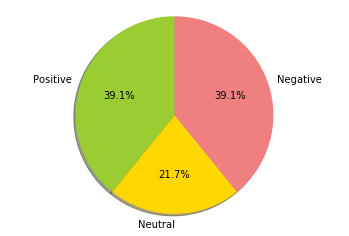

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0 0]
 [0 2 0]
 [0 0 2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



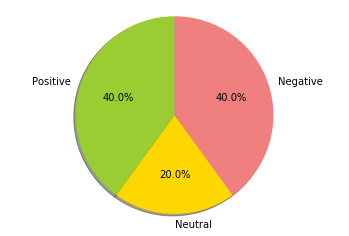

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0 28  0]
 [ 0  0 20]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



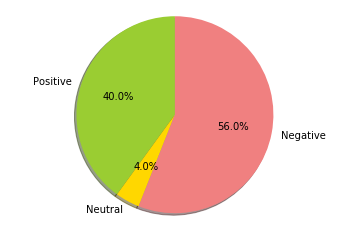

The f1Score is =  0.5048218029350106 

The Confusion Matix is = 
 [[ 0  5  0]
 [ 0  4  0]
 [ 0  2 52]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.6543209876543209 

The Precision is =  0.4545454545454546 



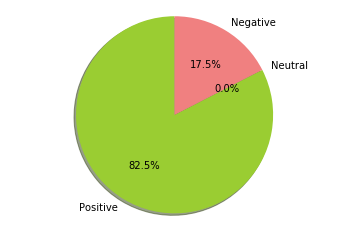

The f1Score is =  0.8803312629399587 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0 10  0]
 [ 0  1 17]] 

The accuracy is =  0.9117647058823529 

The recall is =  0.8703703703703702 

The Precision is =  0.923076923076923 



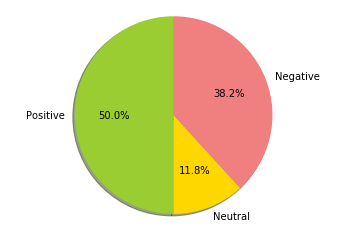

The f1Score is =  0.7470764861026579 

The Confusion Matix is = 
 [[22  6  0]
 [ 0 15  0]
 [ 0 26 93]] 

The accuracy is =  0.8024691358024691 

The recall is =  0.8557422969187675 

The Precision is =  0.7730496453900709 



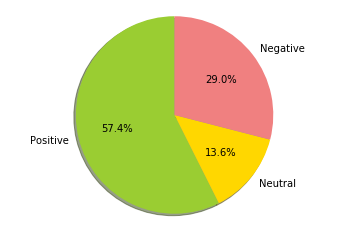

The f1Score is =  0.6163108921729611 

The Confusion Matix is = 
 [[ 4  4  0]
 [ 0  2  0]
 [ 0  6 26]] 

The accuracy is =  0.7619047619047619 

The recall is =  0.7708333333333334 

The Precision is =  0.7222222222222223 



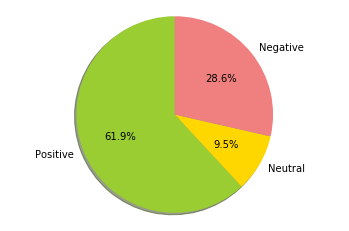

The f1Score is =  0.42857142857142855 

The Confusion Matix is = 
 [[ 0  3  0]
 [ 0  1  0]
 [ 0  1 10]] 

The accuracy is =  0.7333333333333333 

The recall is =  0.6363636363636364 

The Precision is =  0.39999999999999997 



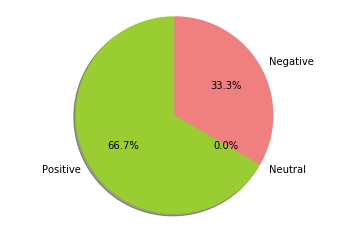

The f1Score is =  0.6702619192006699 

The Confusion Matix is = 
 [[53 13  0]
 [ 0 10  0]
 [ 0 23 37]] 

The accuracy is =  0.7352941176470589 

The recall is =  0.8065656565656566 

The Precision is =  0.7391304347826088 



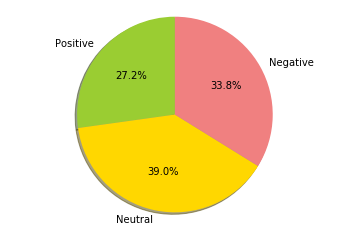

The f1Score is =  0.8584152334152334 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0  4  0]
 [ 0  1 18]] 

The accuracy is =  0.90625 

The recall is =  0.9083820662768031 

The Precision is =  0.8571428571428571 



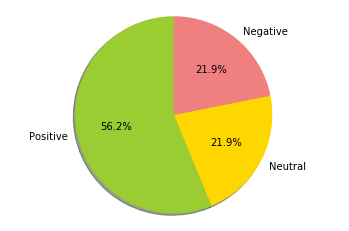

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  3  0]
 [ 0  0 30]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



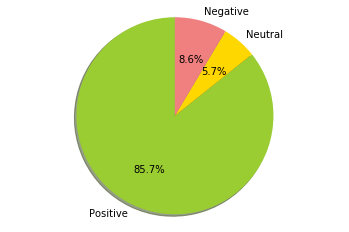

The f1Score is =  0.8000000000000002 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  3  0]
 [ 0  2 14]] 

The accuracy is =  0.8636363636363636 

The recall is =  0.8472222222222222 

The Precision is =  0.8333333333333334 



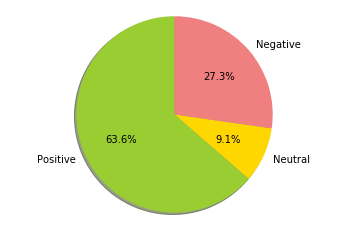

The f1Score is =  0.782010582010582 

The Confusion Matix is = 
 [[8 2 0]
 [0 3 0]
 [0 2 6]] 

The accuracy is =  0.8095238095238095 

The recall is =  0.85 

The Precision is =  0.8095238095238096 



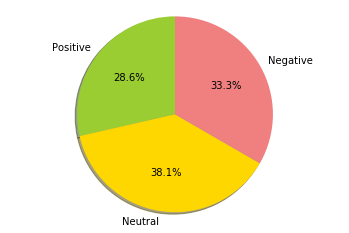

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  6  0]
 [ 0  0 17]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



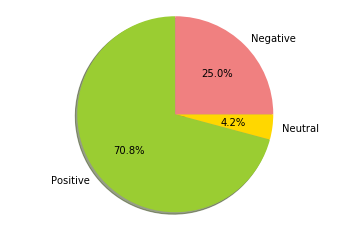

The f1Score is =  0.7460094070589979 

The Confusion Matix is = 
 [[12  7  0]
 [ 0  7  0]
 [ 0  5 31]] 

The accuracy is =  0.8064516129032258 

The recall is =  0.830896686159844 

The Precision is =  0.7894736842105262 



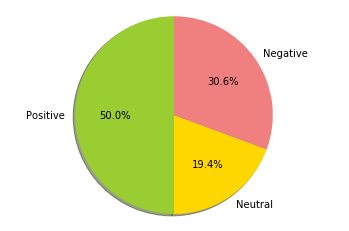

The f1Score is =  0.7642140468227424 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  2  0]
 [ 0  3 10]] 

The accuracy is =  0.8181818181818182 

The recall is =  0.8754578754578755 

The Precision is =  0.7777777777777777 



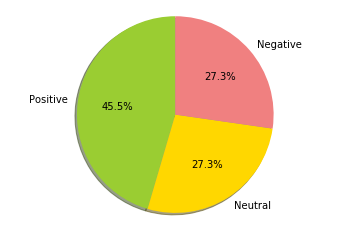

The f1Score is =  0.8789115646258502 

The Confusion Matix is = 
 [[ 6  2  0]
 [ 0  6  0]
 [ 0  1 24]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.9033333333333333 

The Precision is =  0.8888888888888888 



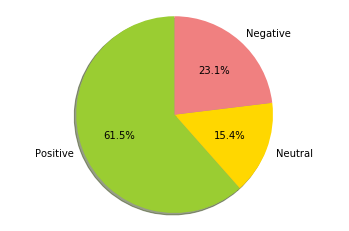

The f1Score is =  0.5851190476190476 

The Confusion Matix is = 
 [[12  6  0]
 [ 0  1  0]
 [ 0  6 13]] 

The accuracy is =  0.6842105263157895 

The recall is =  0.783625730994152 

The Precision is =  0.6923076923076922 



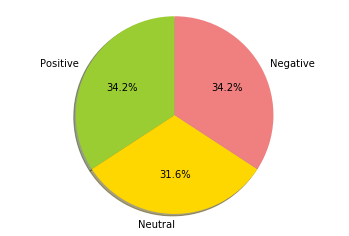

The f1Score is =  0.8582345191040842 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  9  0]
 [ 0  2 22]] 

The accuracy is =  0.8974358974358975 

The recall is =  0.861111111111111 

The Precision is =  0.8974358974358975 



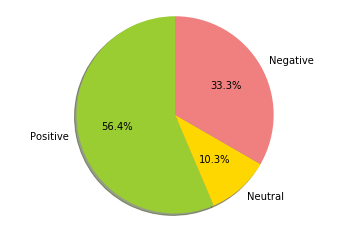

The f1Score is =  0.8376586900348276 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0 10  0]
 [ 0  1 21]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.8181818181818182 

The Precision is =  0.923076923076923 



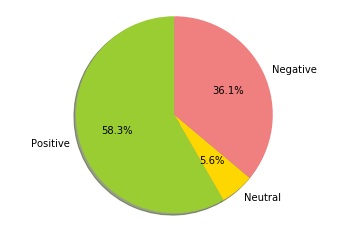

The f1Score is =  0.9279503105590062 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0 10  0]
 [ 0  3 16]] 

The accuracy is =  0.9117647058823529 

The recall is =  0.9473684210526315 

The Precision is =  0.923076923076923 



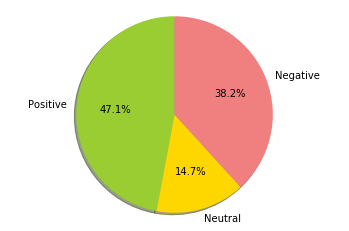

The f1Score is =  0.8901098901098901 

The Confusion Matix is = 
 [[ 9  0]
 [ 3 18]] 

The accuracy is =  0.9 

The recall is =  0.9285714285714286 

The Precision is =  0.875 



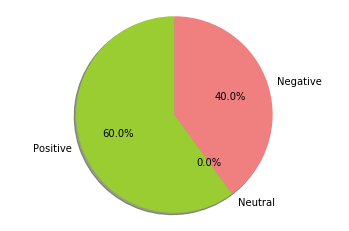

The f1Score is =  0.6312226204699324 

The Confusion Matix is = 
 [[15  1  0]
 [ 0  0  0]
 [ 0  4 25]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.5998563218390804 

The Precision is =  0.6666666666666666 



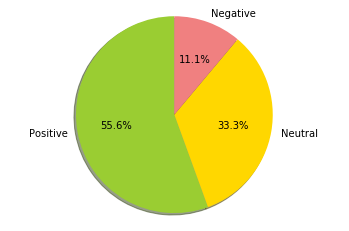

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0]
 [0 3]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



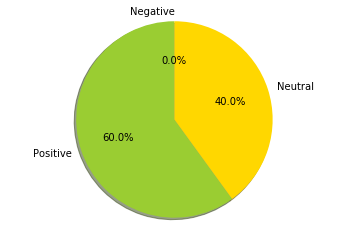

The f1Score is =  0.8888888888888888 

The Confusion Matix is = 
 [[ 2  0]
 [ 1 22]] 

The accuracy is =  0.96 

The recall is =  0.9782608695652174 

The Precision is =  0.8333333333333333 



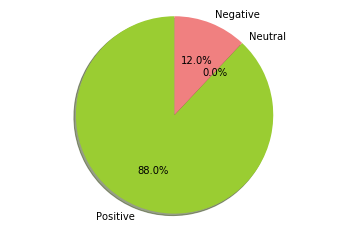

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  2  0]
 [ 0  0 27]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



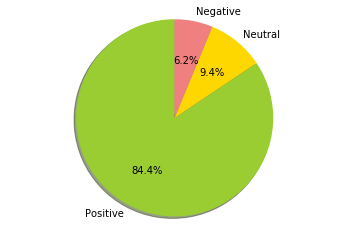

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  5  0]
 [ 0  0 30]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



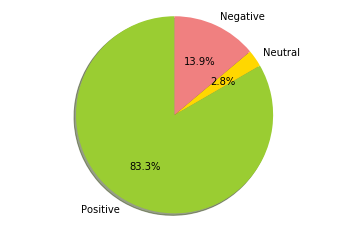

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 6  0]
 [ 0 24]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



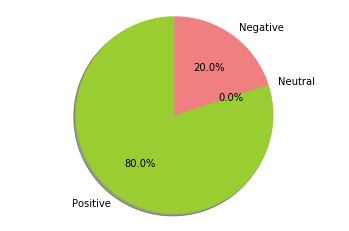

The f1Score is =  0.939047619047619 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  6  0]
 [ 0  2 24]] 

The accuracy is =  0.9393939393939394 

The recall is =  0.9743589743589745 

The Precision is =  0.9166666666666666 



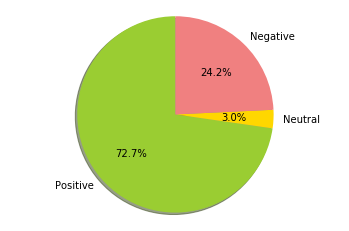

The f1Score is =  0.792572263290691 

The Confusion Matix is = 
 [[ 7  5  0]
 [ 0 10  0]
 [ 0  4 39]] 

The accuracy is =  0.8615384615384616 

The recall is =  0.8301033591731266 

The Precision is =  0.8421052631578947 



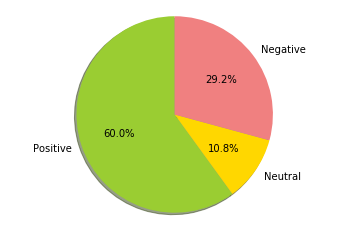

The f1Score is =  0.8536255411255412 

The Confusion Matix is = 
 [[15  2  0]
 [ 0  5  0]
 [ 0  2 10]] 

The accuracy is =  0.8823529411764706 

The recall is =  0.9052287581699346 

The Precision is =  0.8518518518518517 



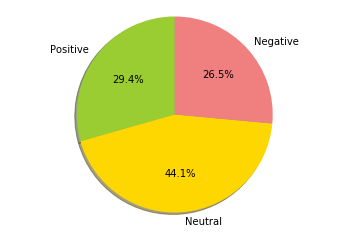

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  8  0]
 [ 0  0 23]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



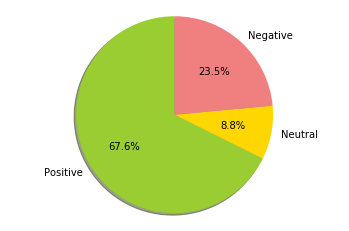

The f1Score is =  0.9047619047619048 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  3  0]
 [ 0  0 15]] 

The accuracy is =  0.9545454545454546 

The recall is =  0.9166666666666666 

The Precision is =  0.9166666666666666 



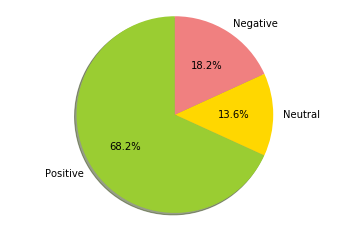

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



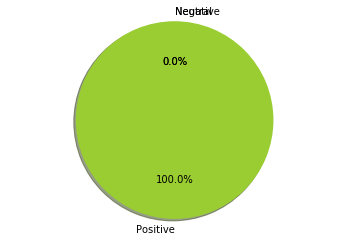

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



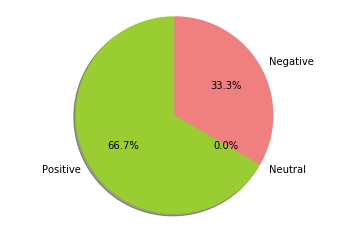

The f1Score is =  0.4777777777777778 

The Confusion Matix is = 
 [[ 1  2  0]
 [ 0  0  0]
 [ 0  2 14]] 

The accuracy is =  0.7894736842105263 

The recall is =  0.40277777777777773 

The Precision is =  0.6666666666666666 



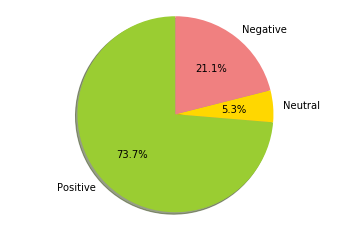

The f1Score is =  0.4289191419141914 

The Confusion Matix is = 
 [[29 43  0]
 [ 0  0  0]
 [ 0 46 57]] 

The accuracy is =  0.49142857142857144 

The recall is =  0.318725278676735 

The Precision is =  0.6666666666666666 



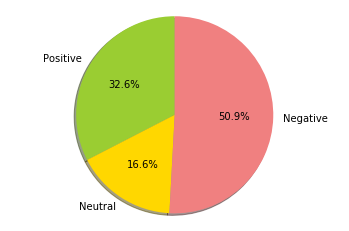

The f1Score is =  0.7751552795031057 

The Confusion Matix is = 
 [[ 9  5  0]
 [ 0  4  0]
 [ 0  1 17]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.8624338624338623 

The Precision is =  0.7999999999999999 



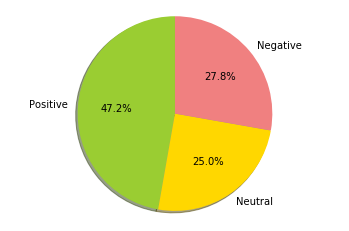

The f1Score is =  0.8606060606060607 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  4  0]
 [ 0  1 27]] 

The accuracy is =  0.9428571428571428 

The recall is =  0.876984126984127 

The Precision is =  0.8888888888888888 



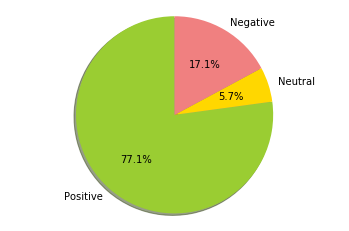

The f1Score is =  0.826199297045692 

The Confusion Matix is = 
 [[25  8  0]
 [ 0 19  0]
 [ 0  9 56]] 

The accuracy is =  0.8547008547008547 

The recall is =  0.873038073038073 

The Precision is =  0.8425925925925926 



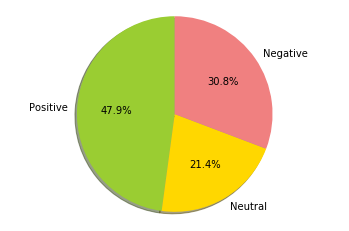

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



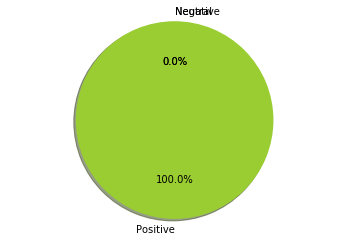

The f1Score is =  0.8811653116531165 

The Confusion Matix is = 
 [[11  2  0]
 [ 0 10  0]
 [ 0  3 19]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.9032634032634034 

The Precision is =  0.8888888888888888 



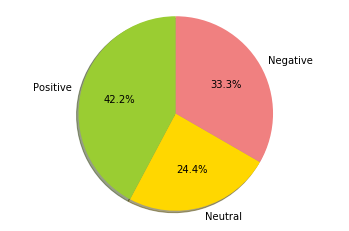

The f1Score is =  0.8157894736842106 

The Confusion Matix is = 
 [[5 2 0]
 [0 3 0]
 [0 1 9]] 

The accuracy is =  0.85 

The recall is =  0.8714285714285714 

The Precision is =  0.8333333333333334 



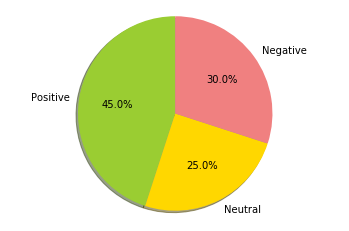

The f1Score is =  0.8015444015444015 

The Confusion Matix is = 
 [[16  3  0]
 [ 0  4  0]
 [ 0  3 17]] 

The accuracy is =  0.8604651162790697 

The recall is =  0.8973684210526316 

The Precision is =  0.7999999999999999 



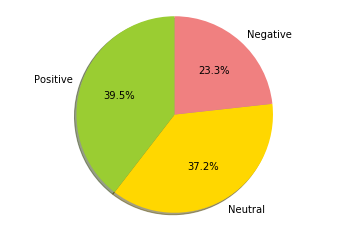

The f1Score is =  0.7804359383306751 

The Confusion Matix is = 
 [[ 4  4  0]
 [ 0  8  0]
 [ 0  2 18]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.7999999999999999 

The Precision is =  0.8571428571428571 



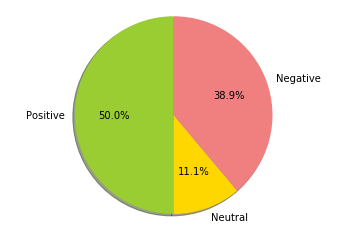

The f1Score is =  0.6131078224101479 

The Confusion Matix is = 
 [[10  2  0]
 [ 0  0  0]
 [ 0  3 20]] 

The accuracy is =  0.8571428571428571 

The recall is =  0.5676328502415459 

The Precision is =  0.6666666666666666 



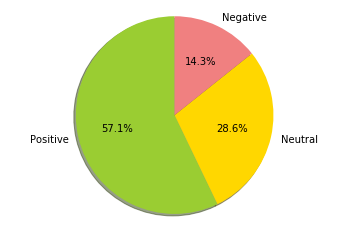

The f1Score is =  0.8244805562292828 

The Confusion Matix is = 
 [[12  4  0]
 [ 0 12  0]
 [ 0  3  8]] 

The accuracy is =  0.8205128205128205 

The recall is =  0.8257575757575758 

The Precision is =  0.8771929824561404 



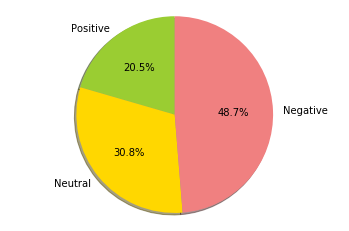

The f1Score is =  0.8735690235690236 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  3  0]
 [ 0  1 27]] 

The accuracy is =  0.9444444444444444 

The recall is =  0.9214285714285714 

The Precision is =  0.8666666666666667 



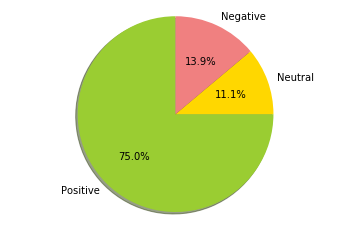

The f1Score is =  0.9042089985486212 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  5  0]
 [ 0  3 25]] 

The accuracy is =  0.918918918918919 

The recall is =  0.9642857142857143 

The Precision is =  0.875 



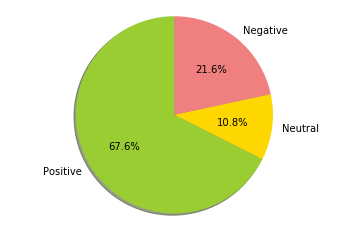

The f1Score is =  0.7521367521367521 

The Confusion Matix is = 
 [[ 5  5  0]
 [ 0  8  0]
 [ 0  3 18]] 

The accuracy is =  0.7948717948717948 

The recall is =  0.7857142857142857 

The Precision is =  0.8333333333333334 



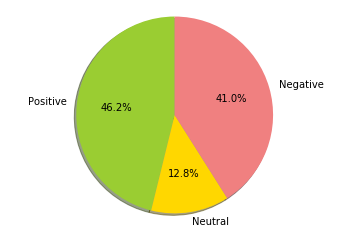

The f1Score is =  0.30303030303030304 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  0  0]
 [ 0  5 25]] 

The accuracy is =  0.8064516129032258 

The recall is =  0.2777777777777778 

The Precision is =  0.3333333333333333 



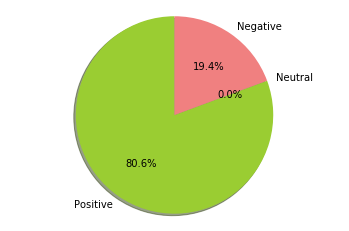

The f1Score is =  0.778215654077723 

The Confusion Matix is = 
 [[13  3  0]
 [ 0  4  0]
 [ 0  4 19]] 

The accuracy is =  0.8372093023255814 

The recall is =  0.8795289855072465 

The Precision is =  0.787878787878788 



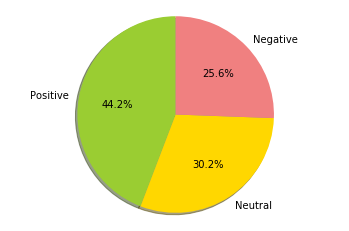

The f1Score is =  0.2222222222222222 

The Confusion Matix is = 
 [[0 1 0]
 [0 0 0]
 [0 1 1]] 

The accuracy is =  0.3333333333333333 

The recall is =  0.16666666666666666 

The Precision is =  0.3333333333333333 



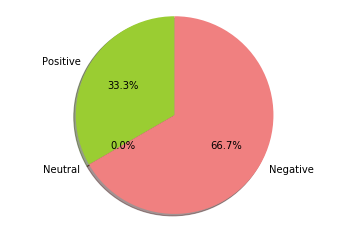

The f1Score is =  0.5291375291375292 

The Confusion Matix is = 
 [[ 9  4  0]
 [ 0  0  0]
 [ 0  6 10]] 

The accuracy is =  0.6551724137931034 

The recall is =  0.4391025641025641 

The Precision is =  0.6666666666666666 



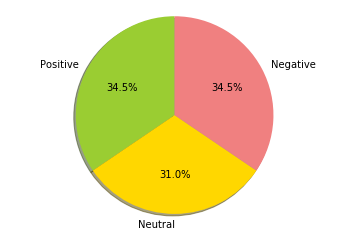

The f1Score is =  0.5494435083526216 

The Confusion Matix is = 
 [[86 61  0]
 [ 0  2  0]
 [ 0 29 95]] 

The accuracy is =  0.6703296703296703 

The recall is =  0.7837210152878354 

The Precision is =  0.6739130434782609 



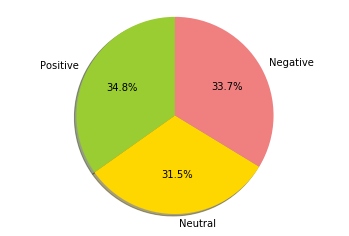

The f1Score is =  0.5492485833949249 

The Confusion Matix is = 
 [[18  5  0]
 [ 0  1  0]
 [ 0  8  7]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.7497584541062802 

The Precision is =  0.6904761904761904 



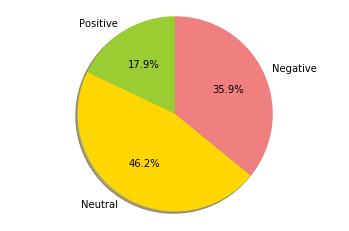

The f1Score is =  0.8962962962962964 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  4  0]
 [ 0  0 14]] 

The accuracy is =  0.9523809523809523 

The recall is =  0.8888888888888888 

The Precision is =  0.9333333333333332 



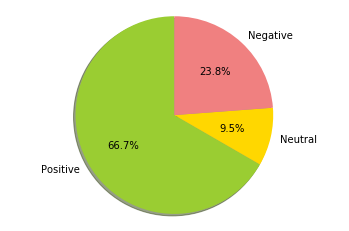

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0 10  0]
 [ 0  0 21]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



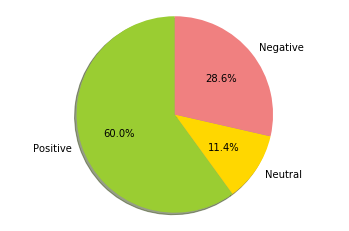

The f1Score is =  0.6571428571428571 

The Confusion Matix is = 
 [[ 5  4  0]
 [ 0  1  0]
 [ 0  1 17]] 

The accuracy is =  0.8214285714285714 

The recall is =  0.8333333333333334 

The Precision is =  0.7222222222222223 



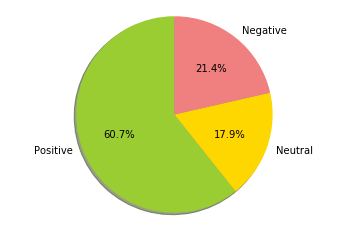

The f1Score is =  0.8285714285714286 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  2  0]
 [ 0  3 16]] 

The accuracy is =  0.875 

The recall is =  0.9473684210526315 

The Precision is =  0.7999999999999999 



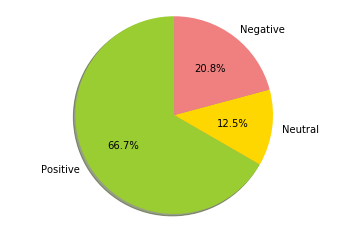

The f1Score is =  0.8687687687687689 

The Confusion Matix is = 
 [[20  8  0]
 [ 0 18  0]
 [ 0  1 18]] 

The accuracy is =  0.8615384615384616 

The recall is =  0.8872180451127819 

The Precision is =  0.8888888888888888 



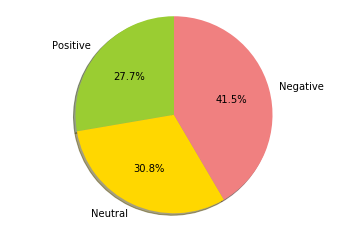

The f1Score is =  0.9632850241545894 

The Confusion Matix is = 
 [[12  0  0]
 [ 0 11  0]
 [ 0  1  7]] 

The accuracy is =  0.967741935483871 

The recall is =  0.9583333333333334 

The Precision is =  0.9722222222222222 



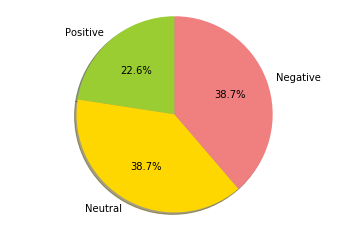

The f1Score is =  0.7774948139911643 

The Confusion Matix is = 
 [[ 9  4  0]
 [ 0 11  0]
 [ 0 11 63]] 

The accuracy is =  0.8469387755102041 

The recall is =  0.8478863478863478 

The Precision is =  0.8076923076923078 



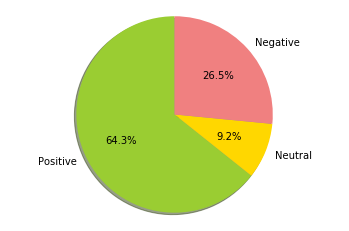

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



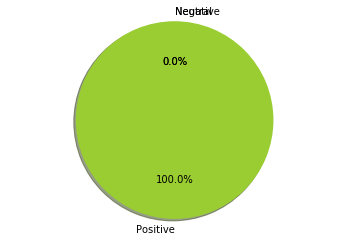

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  3  0]
 [ 0  0 42]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



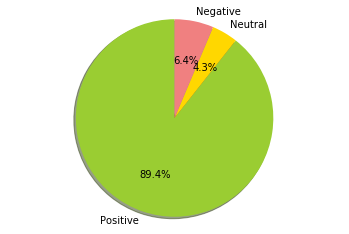

The f1Score is =  1.0 

The Confusion Matix is = 
 [[10  0  0]
 [ 0  3  0]
 [ 0  0 12]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



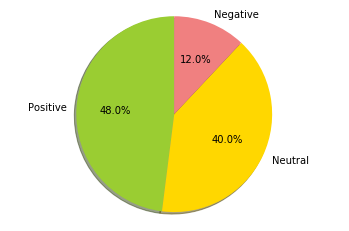

The f1Score is =  0.9488740109555692 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0 14  0]
 [ 0  3 25]] 

The accuracy is =  0.9318181818181818 

The recall is =  0.9642857142857143 

The Precision is =  0.9411764705882352 



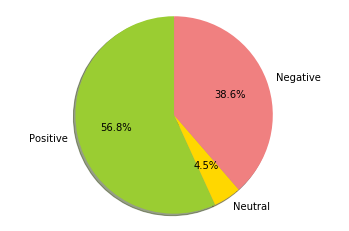

The f1Score is =  0.9244376323544655 

The Confusion Matix is = 
 [[17  2  0]
 [ 0 18  0]
 [ 0  3 29]] 

The accuracy is =  0.927536231884058 

The recall is =  0.9336622807017544 

The Precision is =  0.927536231884058 



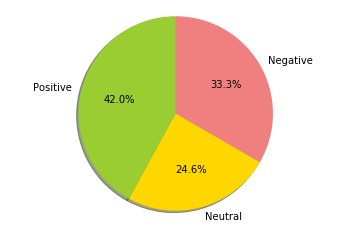

The f1Score is =  0.5634920634920636 

The Confusion Matix is = 
 [[ 5 11  0]
 [ 0  7  0]
 [ 0 11 26]] 

The accuracy is =  0.6333333333333333 

The recall is =  0.6717342342342342 

The Precision is =  0.7471264367816092 



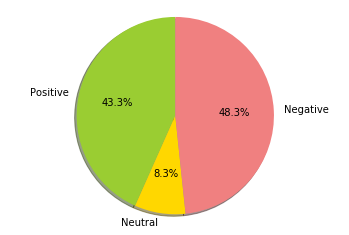

The f1Score is =  0.8970588235294118 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0  3  0]
 [ 0  2 16]] 

The accuracy is =  0.9259259259259259 

The recall is =  0.9629629629629629 

The Precision is =  0.8666666666666667 



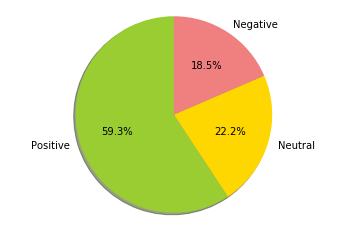

The f1Score is =  0.8237259816207185 

The Confusion Matix is = 
 [[9 1 0]
 [0 3 0]
 [0 2 6]] 

The accuracy is =  0.8571428571428571 

The recall is =  0.8833333333333333 

The Precision is =  0.8333333333333334 



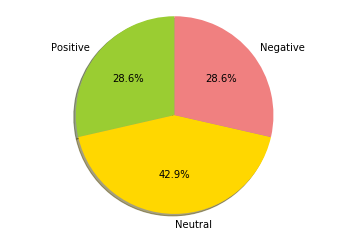

The f1Score is =  0.5808080808080808 

The Confusion Matix is = 
 [[5 2 0]
 [0 0 0]
 [0 1 5]] 

The accuracy is =  0.7692307692307693 

The recall is =  0.5158730158730159 

The Precision is =  0.6666666666666666 



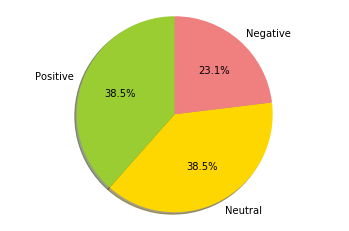

The f1Score is =  0.4523809523809524 

The Confusion Matix is = 
 [[ 1  2  0]
 [ 0  0  0]
 [ 0  4 12]] 

The accuracy is =  0.6842105263157895 

The recall is =  0.3611111111111111 

The Precision is =  0.6666666666666666 



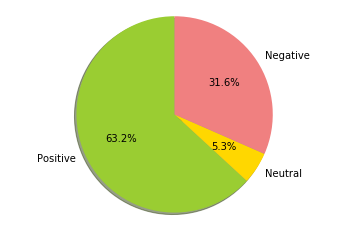

The f1Score is =  0.8480842911877394 

The Confusion Matix is = 
 [[ 6  3  0]
 [ 0 12  0]
 [ 0  2 11]] 

The accuracy is =  0.8529411764705882 

The recall is =  0.8376068376068376 

The Precision is =  0.9019607843137255 



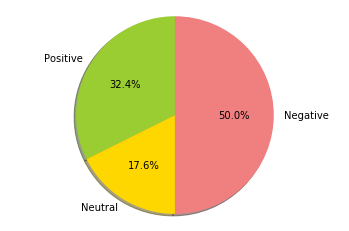

The f1Score is =  0.8202614379084968 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  2  0]
 [ 0  4 49]] 

The accuracy is =  0.9285714285714286 

The recall is =  0.9748427672955975 

The Precision is =  0.7777777777777777 



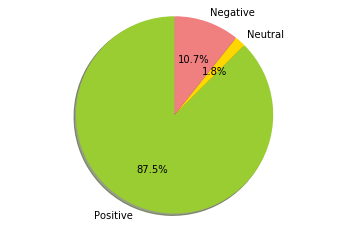

The f1Score is =  0.8501251834585167 

The Confusion Matix is = 
 [[ 5  3  0]
 [ 0  9  0]
 [ 0  1 13]] 

The accuracy is =  0.8709677419354839 

The recall is =  0.8511904761904763 

The Precision is =  0.8974358974358975 



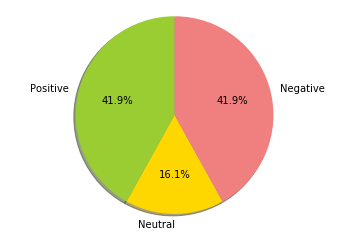

The f1Score is =  0.8040656565656565 

The Confusion Matix is = 
 [[22  6  0]
 [ 0 14  0]
 [ 0 10 43]] 

The accuracy is =  0.8315789473684211 

The recall is =  0.8656783468104222 

The Precision is =  0.8222222222222223 



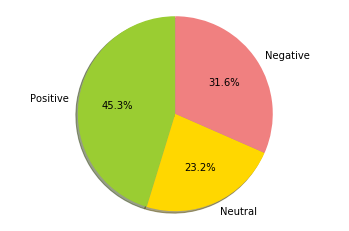

The f1Score is =  0.9072039072039072 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0  5  0]
 [ 0  3 30]] 

The accuracy is =  0.9302325581395349 

The recall is =  0.9696969696969697 

The Precision is =  0.875 



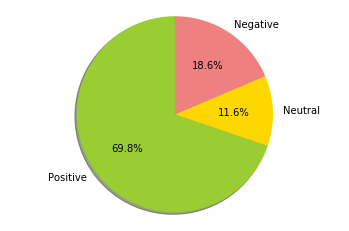

The f1Score is =  0.94541910331384 

The Confusion Matix is = 
 [[4 0 0]
 [0 4 0]
 [0 1 9]] 

The accuracy is =  0.9444444444444444 

The recall is =  0.9666666666666667 

The Precision is =  0.9333333333333332 



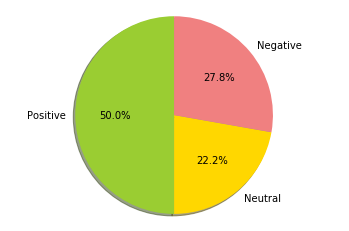

The f1Score is =  0.5979291119076066 

The Confusion Matix is = 
 [[23  8  0]
 [ 0  3  0]
 [ 0 16 23]] 

The accuracy is =  0.6712328767123288 

The recall is =  0.7772263578715192 

The Precision is =  0.7037037037037037 



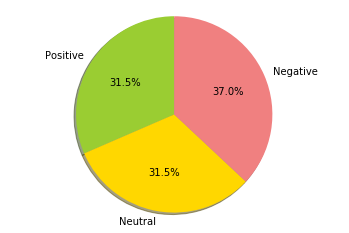

The f1Score is =  0.5642633228840125 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  4  0]
 [ 0  2 28]] 

The accuracy is =  0.9142857142857143 

The recall is =  0.6444444444444445 

The Precision is =  0.5238095238095238 



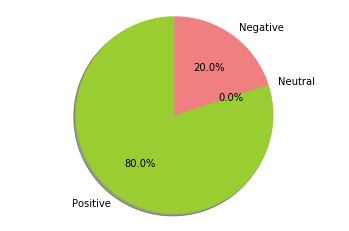

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  6  0]
 [ 0  0 21]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



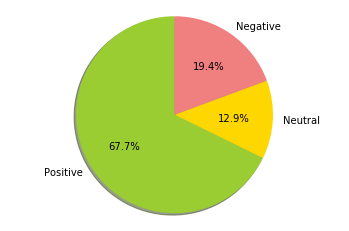

The f1Score is =  0.7954144620811286 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0 11  0]
 [ 0  4 19]] 

The accuracy is =  0.8611111111111112 

The recall is =  0.7753623188405797 

The Precision is =  0.8958333333333334 



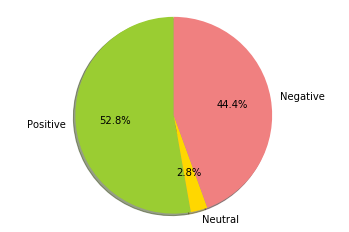

The f1Score is =  0.8507936507936508 

The Confusion Matix is = 
 [[ 9  3  0]
 [ 0  8  0]
 [ 0  2 14]] 

The accuracy is =  0.8611111111111112 

The recall is =  0.875 

The Precision is =  0.8717948717948718 



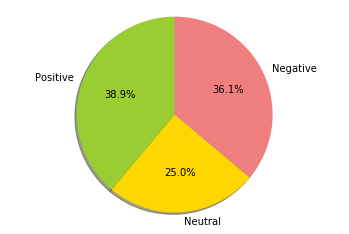

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  4  0]
 [ 0  0 30]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



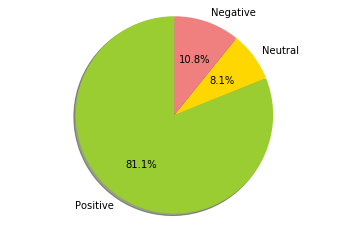

The f1Score is =  0.5733177182452545 

The Confusion Matix is = 
 [[11  5  0]
 [ 0  1  0]
 [ 0 16 36]] 

The accuracy is =  0.6956521739130435 

The recall is =  0.7932692307692308 

The Precision is =  0.6818181818181818 



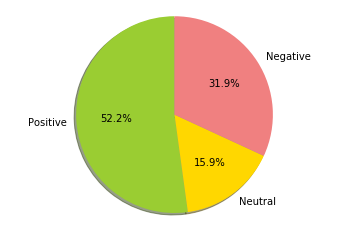

The f1Score is =  0.6926328502415459 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0  2  0]
 [ 0  6 20]] 

The accuracy is =  0.7837837837837838 

The recall is =  0.849002849002849 

The Precision is =  0.7333333333333334 



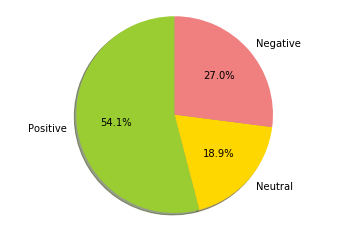

The f1Score is =  0.6161616161616161 

The Confusion Matix is = 
 [[ 8  4  0]
 [ 1  1  0]
 [ 0  4 19]] 

The accuracy is =  0.7567567567567568 

The recall is =  0.6642512077294686 

The Precision is =  0.6666666666666666 



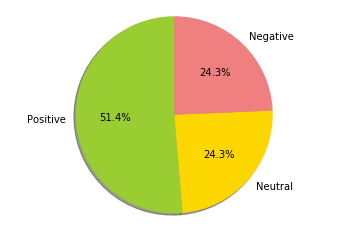

The f1Score is =  0.9243074498393646 

The Confusion Matix is = 
 [[22  3  0]
 [ 0 29  0]
 [ 0  4 34]] 

The accuracy is =  0.9239130434782609 

The recall is =  0.9249122807017544 

The Precision is =  0.9351851851851851 



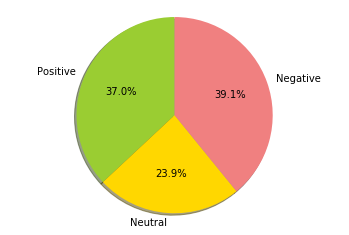

The f1Score is =  0.9514687100893998 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  4  0]
 [ 0  1 14]] 

The accuracy is =  0.9565217391304348 

The recall is =  0.9777777777777779 

The Precision is =  0.9333333333333332 



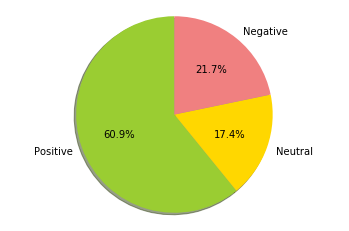

The f1Score is =  0.7784391534391535 

The Confusion Matix is = 
 [[4 1 0]
 [0 2 0]
 [0 2 7]] 

The accuracy is =  0.8125 

The recall is =  0.8592592592592593 

The Precision is =  0.7999999999999999 



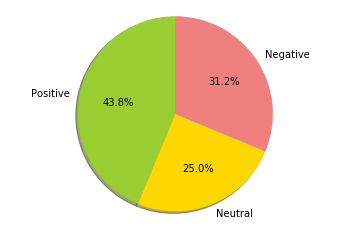

The f1Score is =  0.65 

The Confusion Matix is = 
 [[9 2 0]
 [0 1 0]
 [0 4 8]] 

The accuracy is =  0.75 

The recall is =  0.8282828282828283 

The Precision is =  0.7142857142857143 



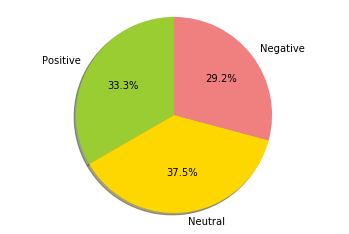

The f1Score is =  0.7627541998231654 

The Confusion Matix is = 
 [[14  4  0]
 [ 0  8  0]
 [ 0  9 28]] 

The accuracy is =  0.7936507936507936 

The recall is =  0.8448448448448449 

The Precision is =  0.7936507936507936 



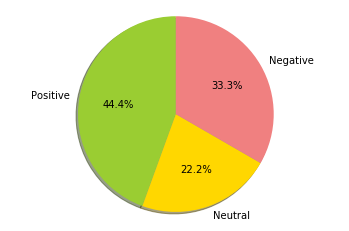

The f1Score is =  0.7928329297820822 

The Confusion Matix is = 
 [[ 6  2  0]
 [ 0  8  0]
 [ 0  7 26]] 

The accuracy is =  0.8163265306122449 

The recall is =  0.845959595959596 

The Precision is =  0.823529411764706 



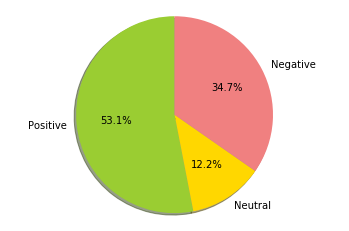

The f1Score is =  0.8952380952380952 

The Confusion Matix is = 
 [[ 6  2  0]
 [ 0  9  0]
 [ 0  1 17]] 

The accuracy is =  0.9142857142857143 

The recall is =  0.8981481481481483 

The Precision is =  0.9166666666666666 



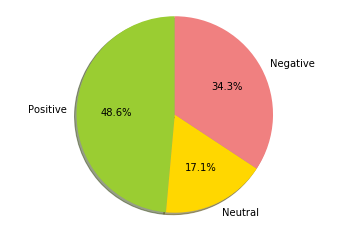

The f1Score is =  0.9087024087024087 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  5  0]
 [ 0  1 16]] 

The accuracy is =  0.9310344827586207 

The recall is =  0.9327731092436974 

The Precision is =  0.9047619047619048 



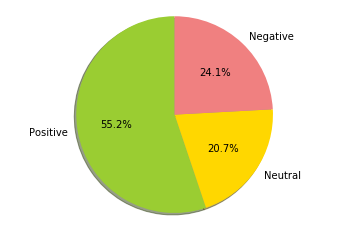

The f1Score is =  0.8437106918238992 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  3  0]
 [ 0  1 26]] 

The accuracy is =  0.9393939393939394 

The recall is =  0.8765432098765431 

The Precision is =  0.8666666666666667 



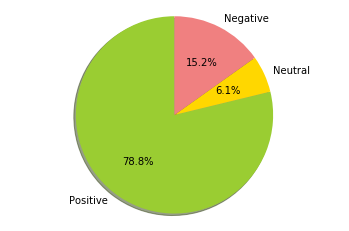

The f1Score is =  0.7484175084175084 

The Confusion Matix is = 
 [[ 9  7  0]
 [ 0 14  0]
 [ 0  9 36]] 

The accuracy is =  0.7866666666666666 

The recall is =  0.7875 

The Precision is =  0.8222222222222223 



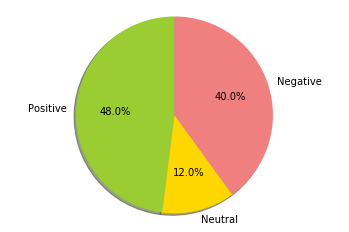

The f1Score is =  0.847943722943723 

The Confusion Matix is = 
 [[21  6  0]
 [ 0 15  0]
 [ 0  6 63]] 

The accuracy is =  0.8918918918918919 

The recall is =  0.8969404186795491 

The Precision is =  0.8518518518518517 



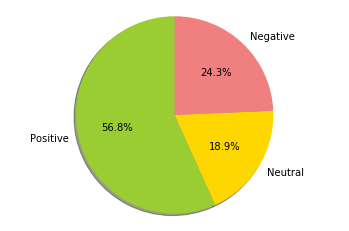

The f1Score is =  0.8941450706156587 

The Confusion Matix is = 
 [[ 8  1  0]
 [ 0  9  0]
 [ 0  3 18]] 

The accuracy is =  0.8974358974358975 

The recall is =  0.9153439153439153 

The Precision is =  0.8974358974358975 



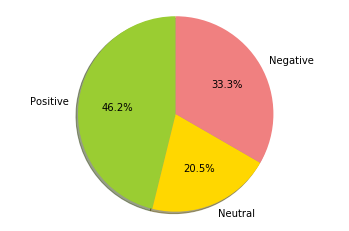

The f1Score is =  0.9506172839506174 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  8  0]
 [ 0  2 26]] 

The accuracy is =  0.9473684210526315 

The recall is =  0.9761904761904763 

The Precision is =  0.9333333333333332 



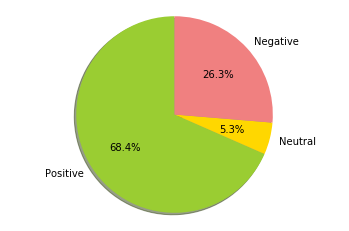

The f1Score is =  0.9496296296296296 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  8  1]
 [ 0  1 24]] 

The accuracy is =  0.9459459459459459 

The recall is =  0.9496296296296296 

The Precision is =  0.9496296296296296 



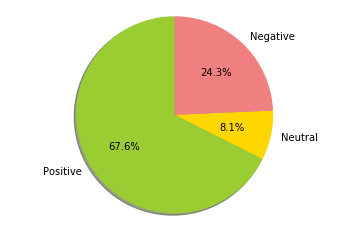

The f1Score is =  0.91514687100894 

The Confusion Matix is = 
 [[24  6  0]
 [ 0 39  0]
 [ 0  3 36]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.9076923076923077 

The Precision is =  0.9375 



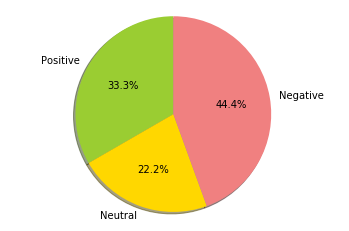

The f1Score is =  0.715873015873016 

The Confusion Matix is = 
 [[11  6  0]
 [ 0  3  0]
 [ 0  2 14]] 

The accuracy is =  0.7777777777777778 

The recall is =  0.8406862745098039 

The Precision is =  0.7575757575757575 



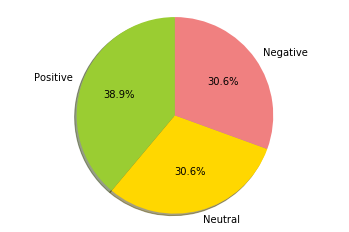

The f1Score is =  0.8237947352854184 

The Confusion Matix is = 
 [[ 3  2  0]
 [ 0  9  0]
 [ 0  3 23]] 

The accuracy is =  0.875 

The recall is =  0.8282051282051283 

The Precision is =  0.8809523809523809 



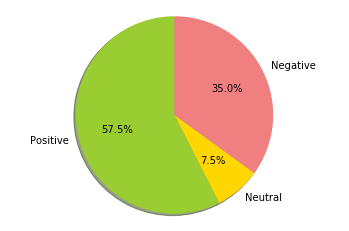

The f1Score is =  0.9127583108715184 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  9  0]
 [ 0  1 26]] 

The accuracy is =  0.95 

The recall is =  0.9043209876543209 

The Precision is =  0.9393939393939394 



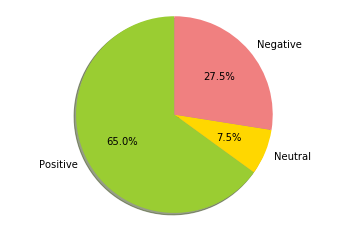

The f1Score is =  0.8844797178130511 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  5  0]
 [ 0  1 13]] 

The accuracy is =  0.9130434782608695 

The recall is =  0.8928571428571429 

The Precision is =  0.9047619047619048 



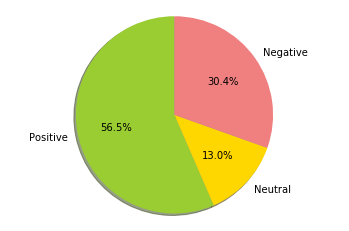

The f1Score is =  0.8502673796791443 

The Confusion Matix is = 
 [[1 0 0]
 [0 4 0]
 [0 3 7]] 

The accuracy is =  0.8 

The recall is =  0.9 

The Precision is =  0.8571428571428571 



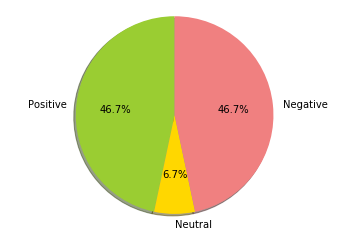

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0 0]
 [0 4 0]
 [0 0 8]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



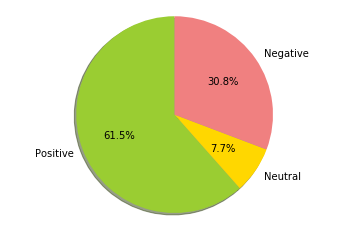

The f1Score is =  0.8585858585858586 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  5  0]
 [ 0  0 13]] 

The accuracy is =  0.95 

The recall is =  0.8333333333333334 

The Precision is =  0.9444444444444445 



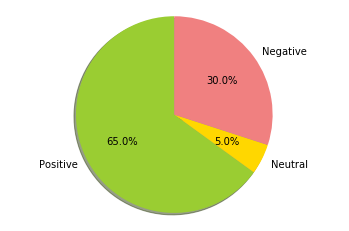

The f1Score is =  0.5948372615039282 

The Confusion Matix is = 
 [[ 0  3  0]
 [ 0 11  0]
 [ 0  2 32]] 

The accuracy is =  0.8958333333333334 

The recall is =  0.6470588235294118 

The Precision is =  0.5625 



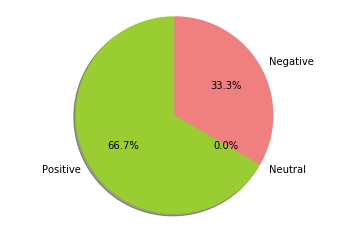

The f1Score is =  0.6086309523809524 

The Confusion Matix is = 
 [[ 2  3  0]
 [ 0  1  0]
 [ 0  2 31]] 

The accuracy is =  0.8717948717948718 

The recall is =  0.7797979797979798 

The Precision is =  0.7222222222222223 



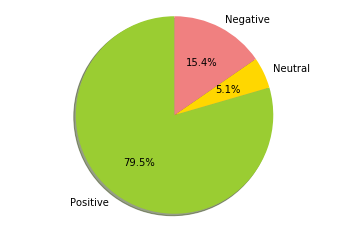

The f1Score is =  0.7833682739343116 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0  2  0]
 [ 0  5 24]] 

The accuracy is =  0.8648648648648649 

The recall is =  0.9425287356321839 

The Precision is =  0.7619047619047619 



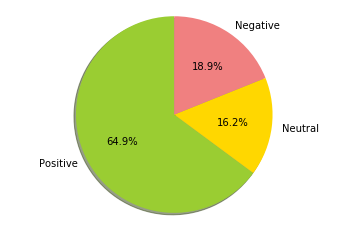

The f1Score is =  0.9566736547868624 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  4  0]
 [ 0  1 26]] 

The accuracy is =  0.9714285714285714 

The recall is =  0.9876543209876543 

The Precision is =  0.9333333333333332 



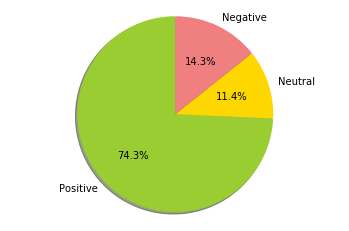

The f1Score is =  0.9152752009894867 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  6  0]
 [ 0  1 24]] 

The accuracy is =  0.9459459459459459 

The recall is =  0.9311111111111111 

The Precision is =  0.9166666666666666 



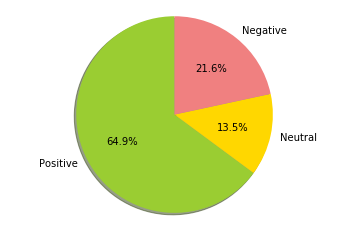

The f1Score is =  0.8020272904483431 

The Confusion Matix is = 
 [[ 8  2  0]
 [ 0  8  0]
 [ 0  7 25]] 

The accuracy is =  0.82 

The recall is =  0.8604166666666666 

The Precision is =  0.823529411764706 



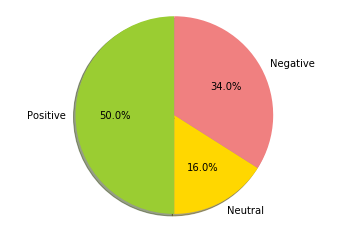

The f1Score is =  0.8602720367426251 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0 16  0]
 [ 0  1 18]] 

The accuracy is =  0.9459459459459459 

The recall is =  0.8157894736842105 

The Precision is =  0.9629629629629629 



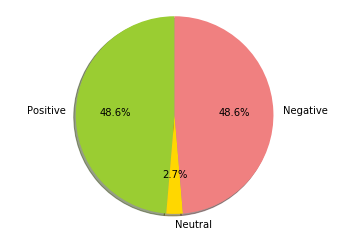

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0 11  0]
 [ 0  0 22]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



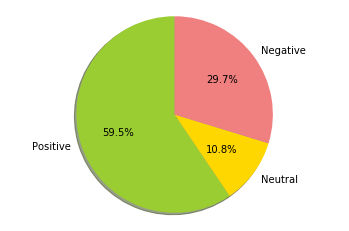

The f1Score is =  0.4 

The Confusion Matix is = 
 [[0 0]
 [1 2]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.3333333333333333 

The Precision is =  0.5 



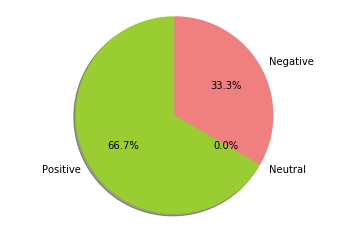

The f1Score is =  0.5462962962962963 

The Confusion Matix is = 
 [[0 0 0]
 [0 4 0]
 [1 1 3]] 

The accuracy is =  0.7777777777777778 

The recall is =  0.5333333333333333 

The Precision is =  0.6 



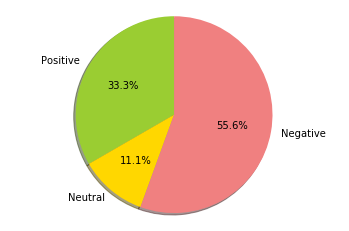

The f1Score is =  0.7544061302681992 

The Confusion Matix is = 
 [[10  4  0]
 [ 0  4  0]
 [ 0  3 13]] 

The accuracy is =  0.7941176470588235 

The recall is =  0.8422619047619048 

The Precision is =  0.787878787878788 



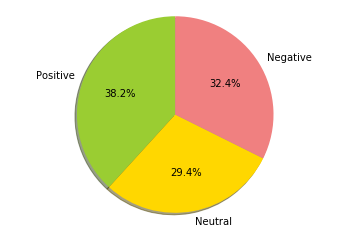

The f1Score is =  0.9743260590500643 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  9  0]
 [ 0  1 20]] 

The accuracy is =  0.9696969696969697 

The recall is =  0.9841269841269842 

The Precision is =  0.9666666666666667 



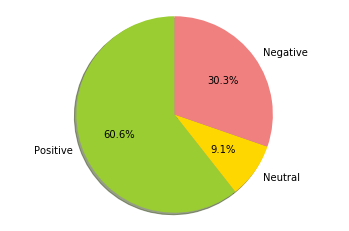

The f1Score is =  0.6592592592592593 

The Confusion Matix is = 
 [[ 3  3  0]
 [ 0  1  0]
 [ 0  1 22]] 

The accuracy is =  0.8666666666666667 

The recall is =  0.8188405797101449 

The Precision is =  0.7333333333333334 



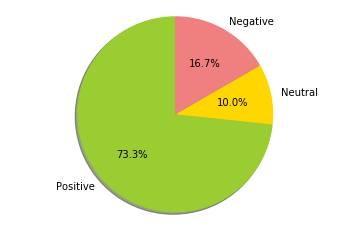

The f1Score is =  0.8904761904761905 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  9  0]
 [ 0  1 17]] 

The accuracy is =  0.9333333333333333 

The recall is =  0.8703703703703702 

The Precision is =  0.9393939393939394 



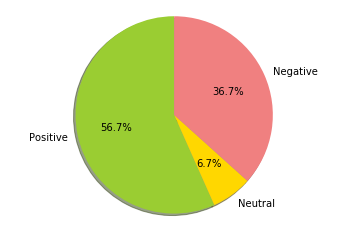

The f1Score is =  0.5919191919191918 

The Confusion Matix is = 
 [[ 4  4  0]
 [ 0  1  0]
 [ 0  4 20]] 

The accuracy is =  0.7575757575757576 

The recall is =  0.7777777777777778 

The Precision is =  0.7037037037037037 



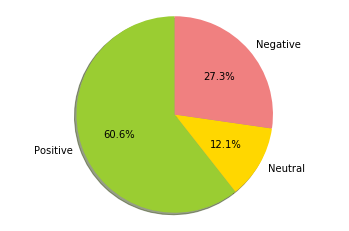

The f1Score is =  0.6125105992085924 

The Confusion Matix is = 
 [[24 13  0]
 [ 0  3  0]
 [ 0 10 27]] 

The accuracy is =  0.7012987012987013 

The recall is =  0.7927927927927928 

The Precision is =  0.7051282051282052 



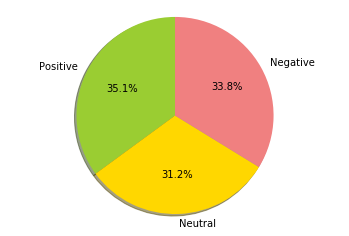

The f1Score is =  0.945226809866937 

The Confusion Matix is = 
 [[24  3  0]
 [ 0 35  0]
 [ 0  3 55]] 

The accuracy is =  0.95 

The recall is =  0.9457215836526182 

The Precision is =  0.9512195121951219 



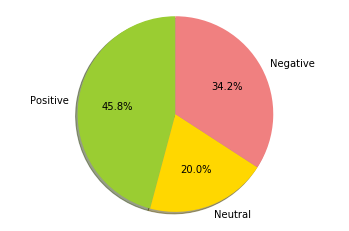

The f1Score is =  0.9500000000000001 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  9  0]
 [ 0  2 19]] 

The accuracy is =  0.9375 

The recall is =  0.9682539682539683 

The Precision is =  0.9393939393939394 



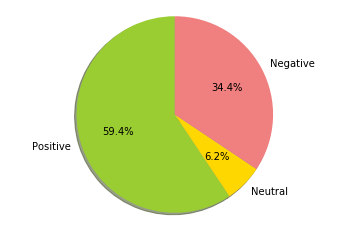

The f1Score is =  0.7652841781874041 

The Confusion Matix is = 
 [[ 5  4  0]
 [ 0 13  0]
 [ 0  5 13]] 

The accuracy is =  0.775 

The recall is =  0.7592592592592592 

The Precision is =  0.8636363636363636 



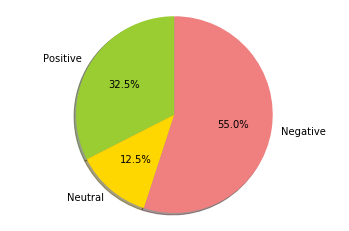

The f1Score is =  0.9777553083923155 

The Confusion Matix is = 
 [[ 7  0  0]
 [ 0 11  0]
 [ 0  1 21]] 

The accuracy is =  0.975 

The recall is =  0.9848484848484849 

The Precision is =  0.9722222222222222 



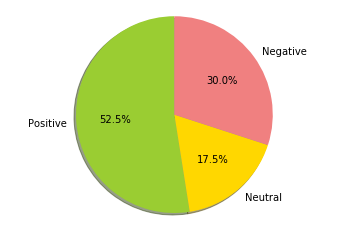

The f1Score is =  0.7988356249225815 

The Confusion Matix is = 
 [[18  3  0]
 [ 0  8  0]
 [ 0  4  7]] 

The accuracy is =  0.825 

The recall is =  0.8311688311688311 

The Precision is =  0.8444444444444444 



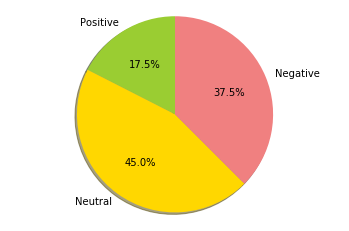

The f1Score is =  0.669011544011544 

The Confusion Matix is = 
 [[16 12  0]
 [ 0  6  0]
 [ 0  8 38]] 

The accuracy is =  0.75 

The recall is =  0.7991718426501034 

The Precision is =  0.7435897435897436 



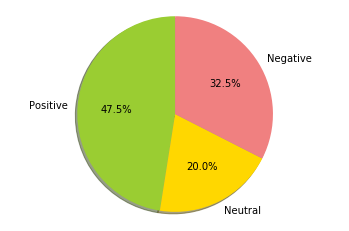

The f1Score is =  0.976960237829803 

The Confusion Matix is = 
 [[ 7  0  0]
 [ 0 11  0]
 [ 0  1 19]] 

The accuracy is =  0.9736842105263158 

The recall is =  0.9833333333333334 

The Precision is =  0.9722222222222222 



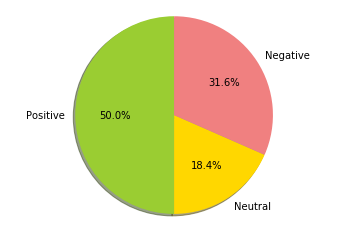

The f1Score is =  0.6909184726522187 

The Confusion Matix is = 
 [[ 2  4  0]
 [ 0  6  0]
 [ 0  3 24]] 

The accuracy is =  0.8205128205128205 

The recall is =  0.7407407407407408 

The Precision is =  0.8205128205128206 



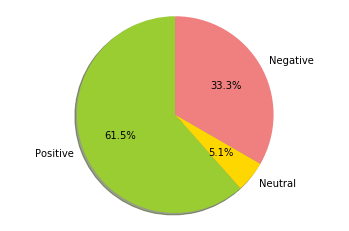

The f1Score is =  0.780737961225766 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  4  0]
 [ 0  3 19]] 

The accuracy is =  0.84375 

The recall is =  0.8434343434343434 

The Precision is =  0.8148148148148149 



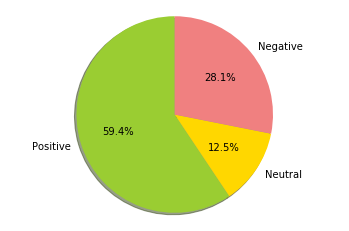

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  2  0]
 [ 0  0 19]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



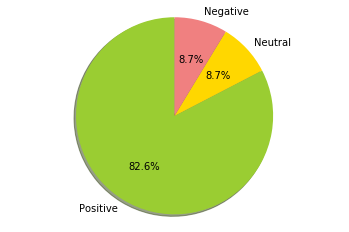

The f1Score is =  0.6041666666666666 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0  0  0]
 [ 0  2 15]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.5533769063180828 

The Precision is =  0.6666666666666666 



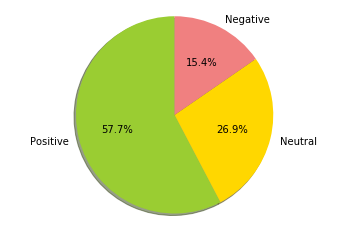

The f1Score is =  0.8968253968253967 

The Confusion Matix is = 
 [[6 2 0]
 [0 5 0]
 [0 0 5]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.9166666666666666 

The Precision is =  0.9047619047619048 



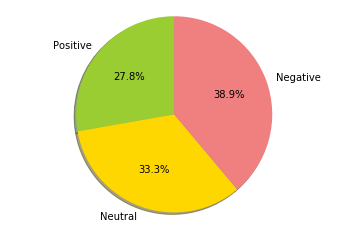

The f1Score is =  0.7529239766081871 

The Confusion Matix is = 
 [[1 1 0]
 [0 6 0]
 [0 3 8]] 

The accuracy is =  0.7894736842105263 

The recall is =  0.7424242424242425 

The Precision is =  0.8666666666666667 



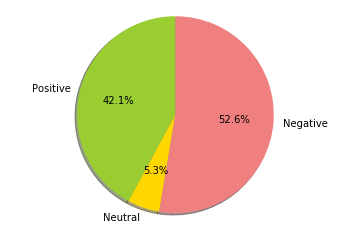

The f1Score is =  0.5965367965367965 

The Confusion Matix is = 
 [[ 9  4  0]
 [ 0  0  0]
 [ 0  1 17]] 

The accuracy is =  0.8387096774193549 

The recall is =  0.5455840455840456 

The Precision is =  0.6666666666666666 



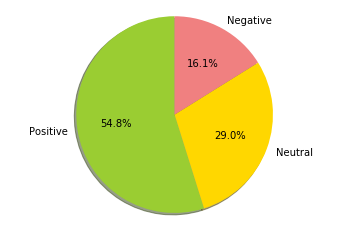

The f1Score is =  0.8180985884580895 

The Confusion Matix is = 
 [[22  3  0]
 [ 0  9  0]
 [ 0  8 35]] 

The accuracy is =  0.8571428571428571 

The recall is =  0.897984496124031 

The Precision is =  0.8166666666666668 



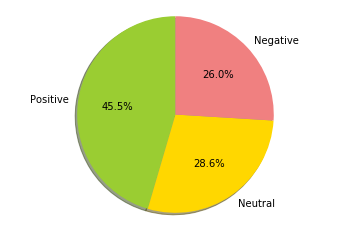

The f1Score is =  0.8231040564373897 

The Confusion Matix is = 
 [[10  5  0]
 [ 0 10  0]
 [ 0  2 13]] 

The accuracy is =  0.825 

The recall is =  0.8444444444444444 

The Precision is =  0.8627450980392157 



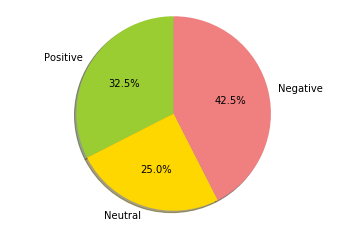

The f1Score is =  0.9119047619047618 

The Confusion Matix is = 
 [[ 6  0]
 [ 2 29]] 

The accuracy is =  0.9459459459459459 

The recall is =  0.967741935483871 

The Precision is =  0.875 



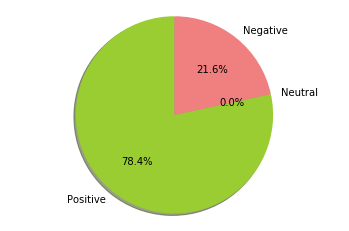

The f1Score is =  0.9647218453188602 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  5  0]
 [ 0  1 33]] 

The accuracy is =  0.975 

The recall is =  0.9901960784313726 

The Precision is =  0.9444444444444445 



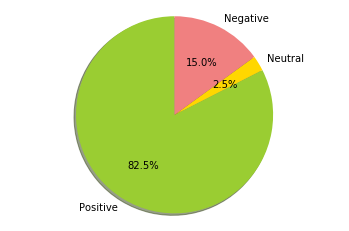

The f1Score is =  0.47222222222222215 

The Confusion Matix is = 
 [[12  8  0]
 [ 0  0  0]
 [ 0 10 10]] 

The accuracy is =  0.55 

The recall is =  0.3666666666666667 

The Precision is =  0.6666666666666666 



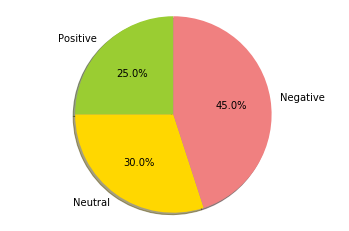

The f1Score is =  0.7023809523809524 

The Confusion Matix is = 
 [[ 6  6  0]
 [ 0  7  0]
 [ 0  4 12]] 

The accuracy is =  0.7142857142857143 

The recall is =  0.75 

The Precision is =  0.8039215686274509 



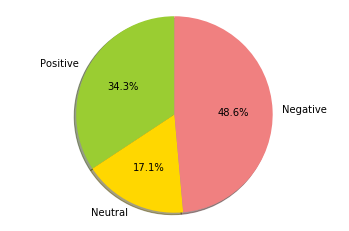

The f1Score is =  0.6247276688453159 

The Confusion Matix is = 
 [[31 10  0]
 [ 0  4  0]
 [ 0 16 28]] 

The accuracy is =  0.7078651685393258 

The recall is =  0.7974870657797487 

The Precision is =  0.7111111111111111 



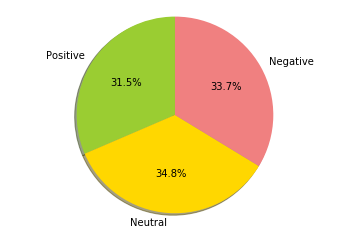

The f1Score is =  0.9521531100478469 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  9  0]
 [ 0  0 25]] 

The accuracy is =  0.975 

The recall is =  0.9444444444444445 

The Precision is =  0.9666666666666667 



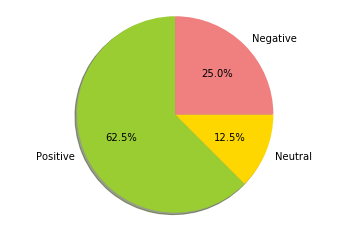

The f1Score is =  0.5657058990392324 

The Confusion Matix is = 
 [[20 14  0]
 [ 0  2  0]
 [ 0 15 38]] 

The accuracy is =  0.6741573033707865 

The recall is =  0.7684054753977062 

The Precision is =  0.6881720430107526 



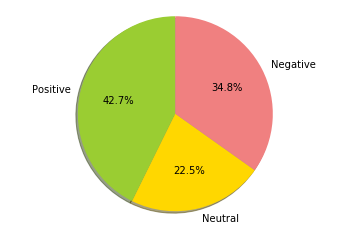

The f1Score is =  0.6425979680696662 

The Confusion Matix is = 
 [[45 14  0]
 [ 0  6  0]
 [ 0 13 20]] 

The accuracy is =  0.7244897959183674 

The recall is =  0.7895908234891286 

The Precision is =  0.7272727272727272 



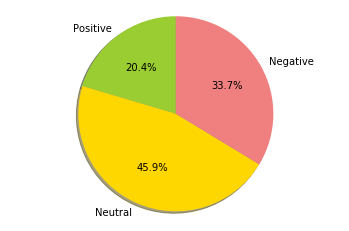

The f1Score is =  0.8713450292397661 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  9  0]
 [ 0  0 25]] 

The accuracy is =  0.9722222222222222 

The recall is =  0.8333333333333334 

The Precision is =  0.9666666666666667 



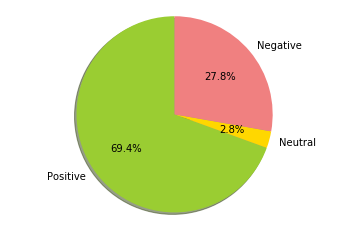

The f1Score is =  0.7547892720306514 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0  1  0]
 [ 0  4 27]] 

The accuracy is =  0.8947368421052632 

The recall is =  0.956989247311828 

The Precision is =  0.7333333333333334 



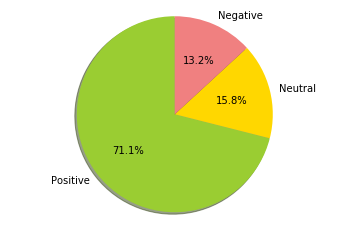

The f1Score is =  0.8994708994708995 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  9  1]
 [ 0  1 20]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.8841269841269842 

The Precision is =  0.9235209235209236 



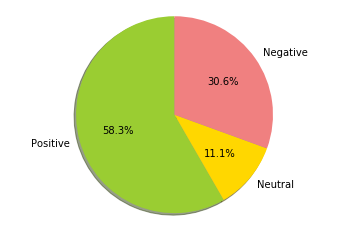

The f1Score is =  0.665266106442577 

The Confusion Matix is = 
 [[11  6  0]
 [ 0  3  0]
 [ 0  5 15]] 

The accuracy is =  0.725 

The recall is =  0.7990196078431372 

The Precision is =  0.7380952380952381 



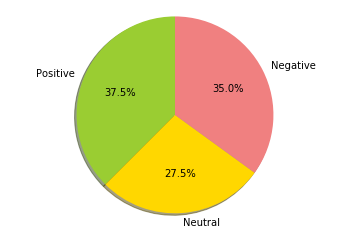

The f1Score is =  0.6967155835080364 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  2  0]
 [ 0  7 23]] 

The accuracy is =  0.7837837837837838 

The recall is =  0.8555555555555556 

The Precision is =  0.7333333333333334 



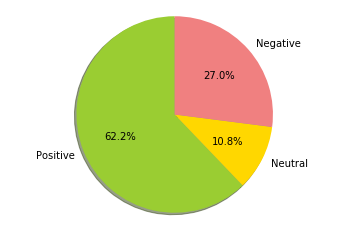

The f1Score is =  0.868050468050468 

The Confusion Matix is = 
 [[ 6  2  0]
 [ 0  5  0]
 [ 0  1 22]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.9021739130434782 

The Precision is =  0.875 



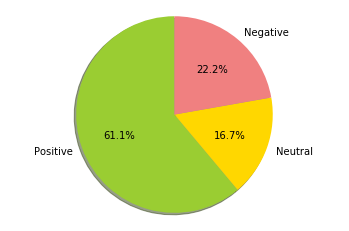

The f1Score is =  0.5555555555555555 

The Confusion Matix is = 
 [[0 1 0]
 [0 1 0]
 [0 0 2]] 

The accuracy is =  0.75 

The recall is =  0.6666666666666666 

The Precision is =  0.5 



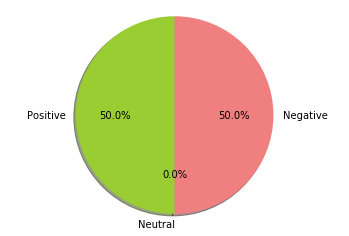

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0]
 [0 2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



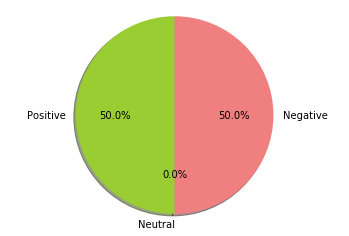

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



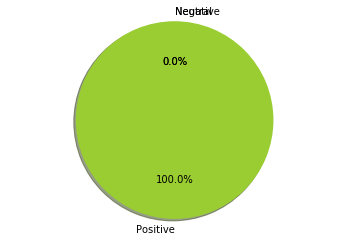

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0 0]
 [0 1 0]
 [0 0 1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



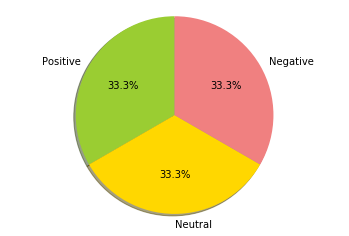

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



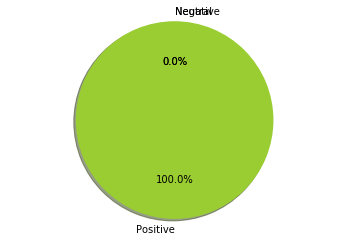

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



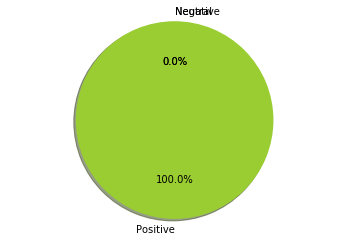

The f1Score is =  1.0 

The Confusion Matix is = 
 [[4 0]
 [0 6]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



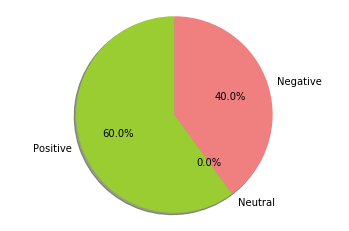

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  1  0]
 [ 0  0 30]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



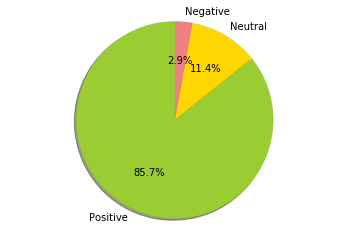

The f1Score is =  0.9803150553150553 

The Confusion Matix is = 
 [[31  1  0]
 [ 0 39  0]
 [ 0  1 27]] 

The accuracy is =  0.9797979797979798 

The recall is =  0.9776785714285715 

The Precision is =  0.983739837398374 



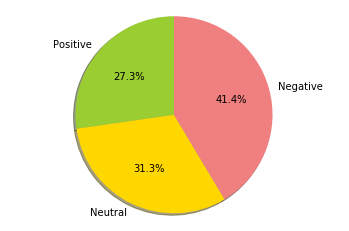

The f1Score is =  0.797979797979798 

The Confusion Matix is = 
 [[ 3  3  0]
 [ 0  4  0]
 [ 0  0 27]] 

The accuracy is =  0.918918918918919 

The recall is =  0.8333333333333334 

The Precision is =  0.8571428571428571 



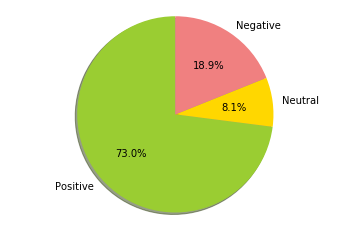

The f1Score is =  0.7045454545454546 

The Confusion Matix is = 
 [[ 4  4  0]
 [ 0  7  0]
 [ 0  6 19]] 

The accuracy is =  0.75 

The recall is =  0.7533333333333333 

The Precision is =  0.8039215686274509 



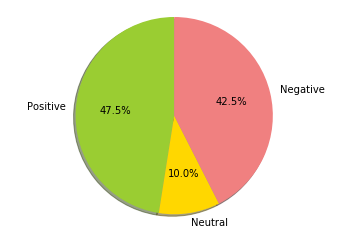

The f1Score is =  0.717391304347826 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  1  0]
 [ 0  1 34]] 

The accuracy is =  0.9473684210526315 

The recall is =  0.8238095238095239 

The Precision is =  0.7777777777777777 



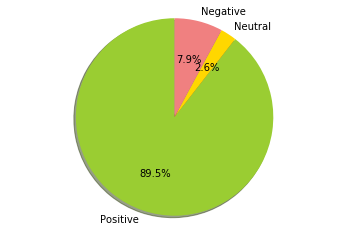

The f1Score is =  0.3919753086419753 

The Confusion Matix is = 
 [[ 1  6  0]
 [ 0  1  0]
 [ 0 10 22]] 

The accuracy is =  0.6 

The recall is =  0.6101190476190476 

The Precision is =  0.6862745098039215 



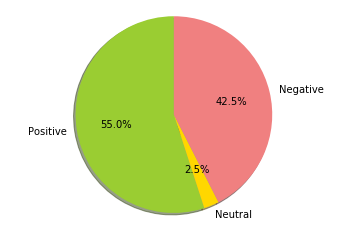

The f1Score is =  0.8796717171717171 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0  9  0]
 [ 0  2 79]] 

The accuracy is =  0.9587628865979382 

The recall is =  0.8965314520870077 

The Precision is =  0.8974358974358975 



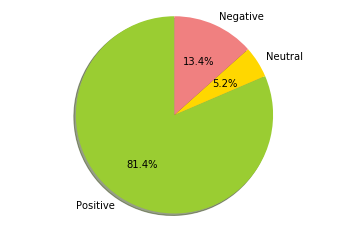

The f1Score is =  0.8507509386733415 

The Confusion Matix is = 
 [[ 3  2  0]
 [ 0  7  0]
 [ 0  1 23]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.8527777777777779 

The Precision is =  0.9 



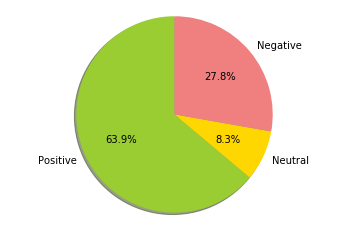

The f1Score is =  0.48461538461538467 

The Confusion Matix is = 
 [[ 0  3  0]
 [ 0  3  0]
 [ 0  3 31]] 

The accuracy is =  0.85 

The recall is =  0.6372549019607843 

The Precision is =  0.4444444444444444 



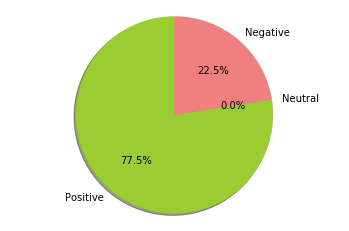

The f1Score is =  0.8015538290788013 

The Confusion Matix is = 
 [[ 7  3  0]
 [ 0  3  0]
 [ 0  1 26]] 

The accuracy is =  0.9 

The recall is =  0.8876543209876543 

The Precision is =  0.8095238095238096 



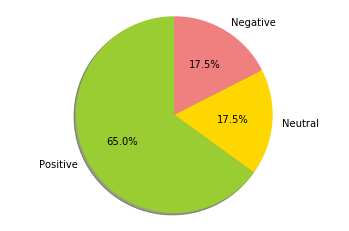

The f1Score is =  0.5813823857302118 

The Confusion Matix is = 
 [[ 0  3  0]
 [ 0  9  0]
 [ 0  2 25]] 

The accuracy is =  0.8717948717948718 

The recall is =  0.6419753086419754 

The Precision is =  0.5476190476190476 



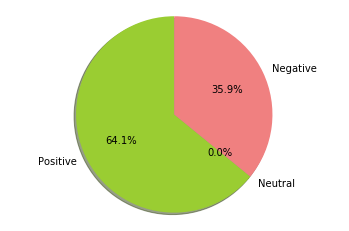

The f1Score is =  0.8242174062607499 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  7  0]
 [ 0  1 28]] 

The accuracy is =  0.925 

The recall is =  0.8218390804597702 

The Precision is =  0.9 



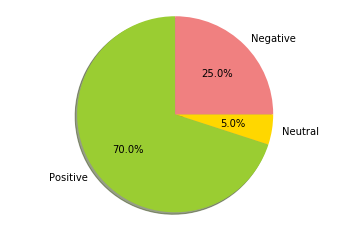

The f1Score is =  0.7351003294399522 

The Confusion Matix is = 
 [[ 1  2  0]
 [ 0  8  0]
 [ 0  3 25]] 

The accuracy is =  0.8717948717948718 

The recall is =  0.7420634920634921 

The Precision is =  0.8717948717948718 



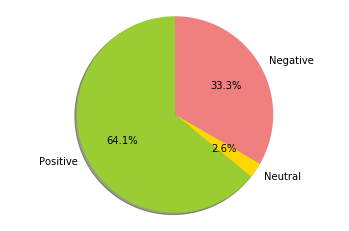

The f1Score is =  0.6986346986346986 

The Confusion Matix is = 
 [[ 4  5  0]
 [ 0  6  0]
 [ 0  4 20]] 

The accuracy is =  0.7692307692307693 

The recall is =  0.7592592592592592 

The Precision is =  0.7999999999999999 



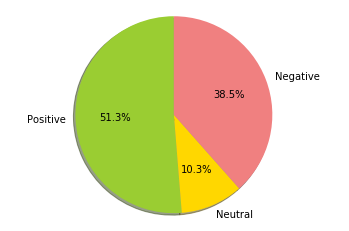

The f1Score is =  0.90625 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  3  0]
 [ 0  2 31]] 

The accuracy is =  0.9459459459459459 

The recall is =  0.9797979797979798 

The Precision is =  0.8666666666666667 



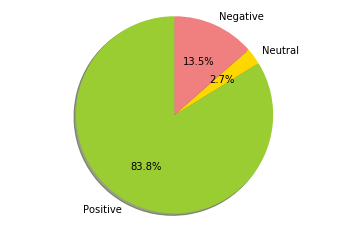

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  9  0]
 [ 0  0 27]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



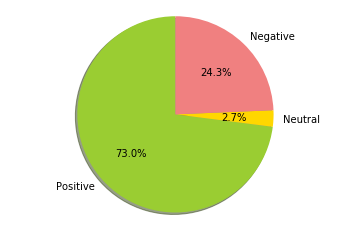

The f1Score is =  0.9220779220779219 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  5  0]
 [ 0  0 19]] 

The accuracy is =  0.9642857142857143 

The recall is =  0.9166666666666666 

The Precision is =  0.9444444444444445 



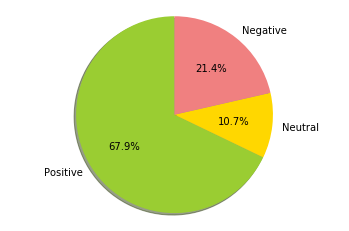

The f1Score is =  0.5631533265406241 

The Confusion Matix is = 
 [[50 21  0]
 [ 0  0  0]
 [ 0 20 63]] 

The accuracy is =  0.7337662337662337 

The recall is =  0.4877538322303298 

The Precision is =  0.6666666666666666 



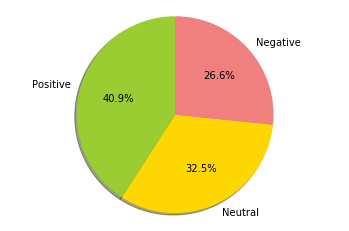

The f1Score is =  0.7942045035068291 

The Confusion Matix is = 
 [[20  2  0]
 [ 0  4  0]
 [ 0  6 40]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.9262187088274044 

The Precision is =  0.7777777777777777 



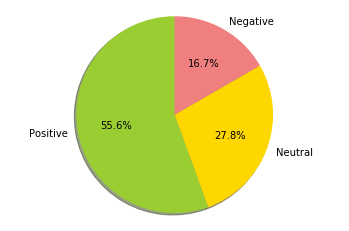

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0 13  0]
 [ 0  0 19]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



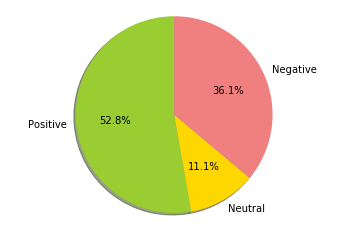

The f1Score is =  0.6983164983164983 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0  1  0]
 [ 0  7 24]] 

The accuracy is =  0.8157894736842105 

The recall is =  0.924731182795699 

The Precision is =  0.7083333333333334 



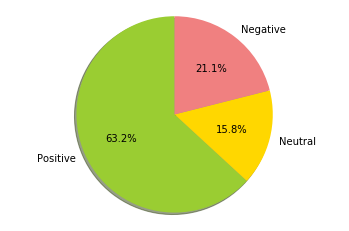

The f1Score is =  0.9206349206349206 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0 13  0]
 [ 0  0 19]] 

The accuracy is =  0.9487179487179487 

The recall is =  0.9047619047619048 

The Precision is =  0.9555555555555556 



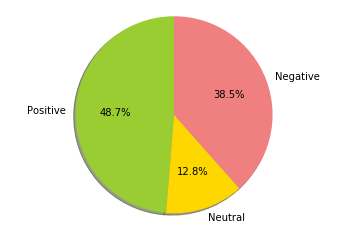

The f1Score is =  0.7993827160493826 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0 11  0]
 [ 0  4 22]] 

The accuracy is =  0.8717948717948718 

The recall is =  0.782051282051282 

The Precision is =  0.8958333333333334 



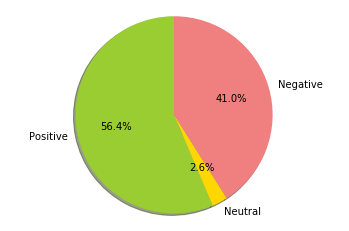

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  4  0]
 [ 0  0 31]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



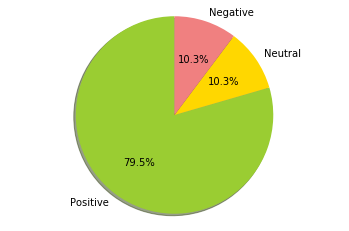

The f1Score is =  0.780672268907563 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  2  0]
 [ 0  2 33]] 

The accuracy is =  0.925 

The recall is =  0.8698412698412697 

The Precision is =  0.7999999999999999 



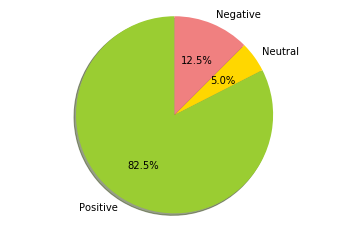

The f1Score is =  0.8934065934065933 

The Confusion Matix is = 
 [[ 6  2  0]
 [ 0 18  0]
 [ 0  2 12]] 

The accuracy is =  0.9 

The recall is =  0.8690476190476191 

The Precision is =  0.9393939393939394 



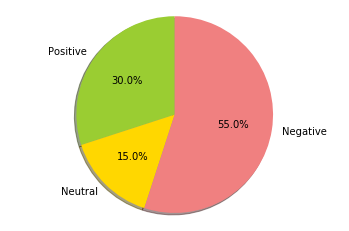

The f1Score is =  0.9280593958013311 

The Confusion Matix is = 
 [[10  1  0]
 [ 0 14  0]
 [ 0  2 13]] 

The accuracy is =  0.925 

The recall is =  0.9252525252525253 

The Precision is =  0.9411764705882352 



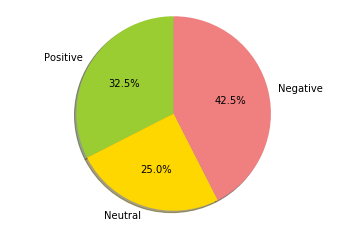

The f1Score is =  0.8373015873015873 

The Confusion Matix is = 
 [[ 6  4  0]
 [ 0 15  0]
 [ 0  2 13]] 

The accuracy is =  0.85 

The recall is =  0.8222222222222223 

The Precision is =  0.9047619047619048 



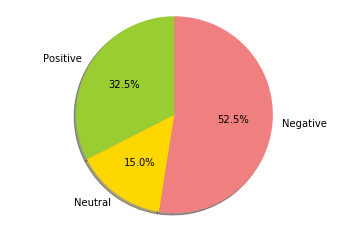

The f1Score is =  0.4264007597340931 

The Confusion Matix is = 
 [[ 7 12  0]
 [ 0  0  0]
 [ 0  7 10]] 

The accuracy is =  0.4722222222222222 

The recall is =  0.31888544891640863 

The Precision is =  0.6666666666666666 



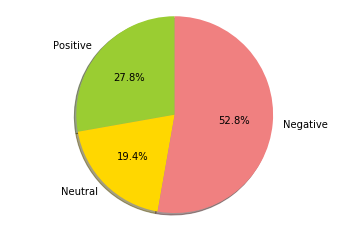

The f1Score is =  0.5918128654970761 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  8  0]
 [ 0  2 14]] 

The accuracy is =  0.88 

The recall is =  0.625 

The Precision is =  0.5757575757575758 



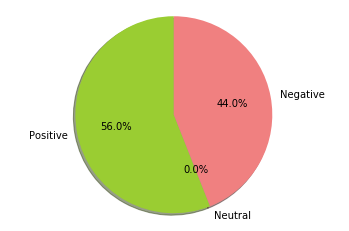

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0 0]
 [0 2 0]
 [0 0 8]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



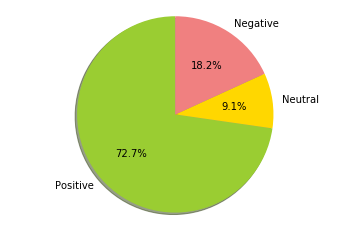

The f1Score is =  0.8706174777603349 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  6  0]
 [ 0  3 23]] 

The accuracy is =  0.8974358974358975 

The recall is =  0.9139194139194139 

The Precision is =  0.8666666666666667 



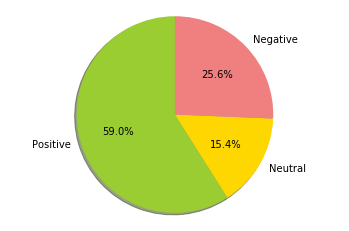

The f1Score is =  0.8132352941176472 

The Confusion Matix is = 
 [[21  6  0]
 [ 0 39  0]
 [ 0 18 36]] 

The accuracy is =  0.8 

The recall is =  0.8148148148148148 

The Precision is =  0.873015873015873 



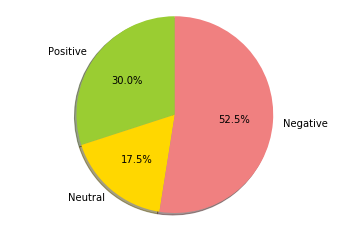

The f1Score is =  0.6570344313155739 

The Confusion Matix is = 
 [[ 82  37   0]
 [  0  24   0]
 [  0  54 115]] 

The accuracy is =  0.7083333333333334 

The recall is =  0.7898496676777219 

The Precision is =  0.7362318840579709 



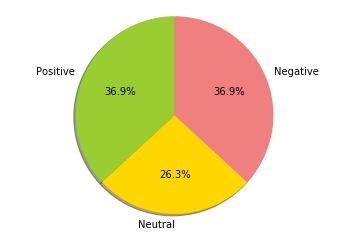

The f1Score is =  1.0 

The Confusion Matix is = 
 [[12  0  0]
 [ 0 24  0]
 [ 0  0 81]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



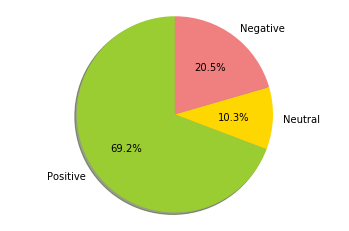

The f1Score is =  0.7940613026819924 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  6  0]
 [ 0  2 28]] 

The accuracy is =  0.9 

The recall is =  0.8111111111111112 

The Precision is =  0.8666666666666667 



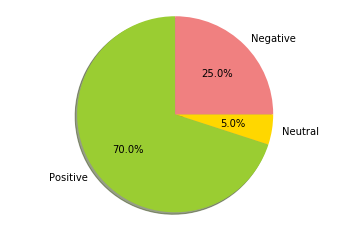

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0 10  0]
 [ 0  0 23]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



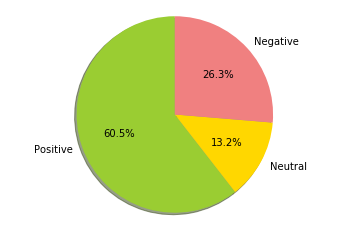

The f1Score is =  0.7680477087256747 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  3  0]
 [ 0  5 27]] 

The accuracy is =  0.85 

The recall is =  0.88125 

The Precision is =  0.7777777777777777 



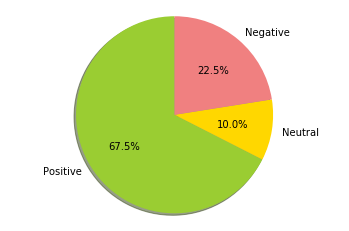

The f1Score is =  0.8554112554112554 

The Confusion Matix is = 
 [[ 6  2  0]
 [ 0  4  0]
 [ 0  1 27]] 

The accuracy is =  0.925 

The recall is =  0.9047619047619048 

The Precision is =  0.8571428571428571 



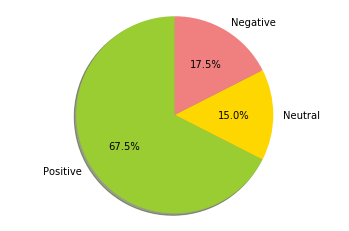

The f1Score is =  0.8121212121212121 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  3  0]
 [ 0  2 32]] 

The accuracy is =  0.925 

The recall is =  0.8692810457516339 

The Precision is =  0.8333333333333334 



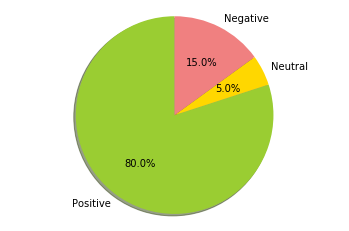

The f1Score is =  0.8243589743589742 

The Confusion Matix is = 
 [[ 3  2  0]
 [ 0  8  0]
 [ 0  2 12]] 

The accuracy is =  0.8518518518518519 

The recall is =  0.8190476190476191 

The Precision is =  0.8888888888888888 



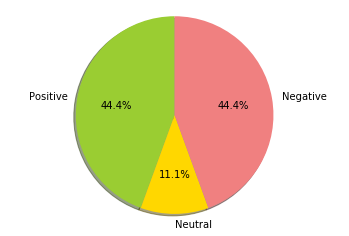

The f1Score is =  1.0 

The Confusion Matix is = 
 [[5]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



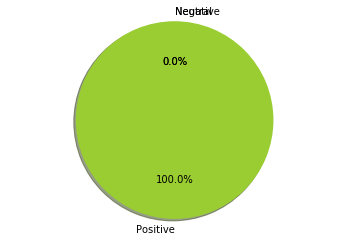

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  2  0]
 [ 0  0 13]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



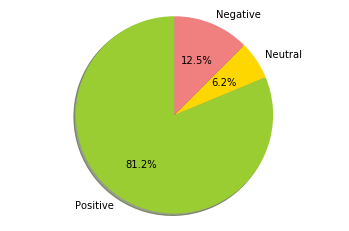

The f1Score is =  0.8034391534391535 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  2  0]
 [ 0  2 19]] 

The accuracy is =  0.8928571428571429 

The recall is =  0.9015873015873016 

The Precision is =  0.7999999999999999 



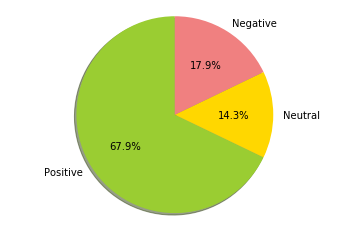

The f1Score is =  0.94541910331384 

The Confusion Matix is = 
 [[2 0 0]
 [0 4 0]
 [0 1 9]] 

The accuracy is =  0.9375 

The recall is =  0.9666666666666667 

The Precision is =  0.9333333333333332 



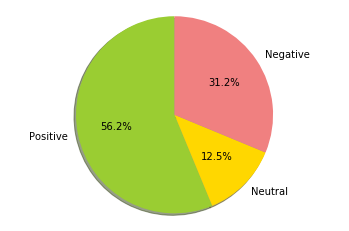

The f1Score is =  0.7326984126984127 

The Confusion Matix is = 
 [[ 2  3  0]
 [ 0  4  0]
 [ 0  1 12]] 

The accuracy is =  0.8181818181818182 

The recall is =  0.7743589743589743 

The Precision is =  0.8333333333333334 



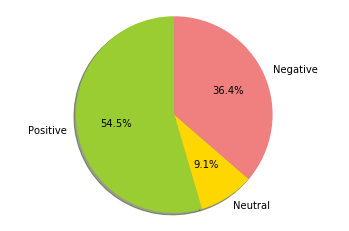

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0 10  0]
 [ 0  0 23]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



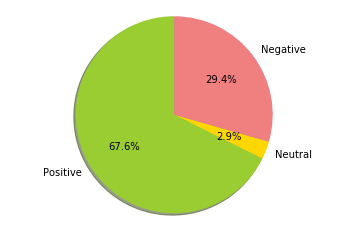

The f1Score is =  0.825925925925926 

The Confusion Matix is = 
 [[ 9  2  0]
 [ 0 12  0]
 [ 0  4  7]] 

The accuracy is =  0.8235294117647058 

The recall is =  0.8181818181818182 

The Precision is =  0.8888888888888888 



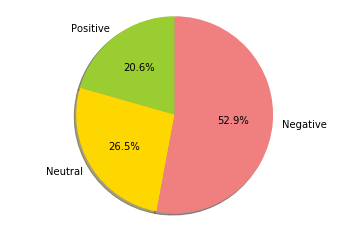

The f1Score is =  0.646049896049896 

The Confusion Matix is = 
 [[25 15  0]
 [ 0  5  0]
 [ 0 15 85]] 

The accuracy is =  0.7931034482758621 

The recall is =  0.8250000000000001 

The Precision is =  0.7142857142857143 



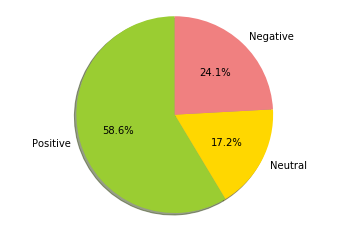

The f1Score is =  0.7777777777777777 

The Confusion Matix is = 
 [[1 1 0]
 [0 1 0]
 [0 0 8]] 

The accuracy is =  0.9090909090909091 

The recall is =  0.8333333333333334 

The Precision is =  0.8333333333333334 



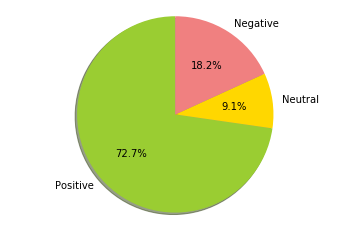

The f1Score is =  0.7666666666666666 

The Confusion Matix is = 
 [[3 0 0]
 [0 1 0]
 [0 2 4]] 

The accuracy is =  0.8 

The recall is =  0.8888888888888888 

The Precision is =  0.7777777777777777 



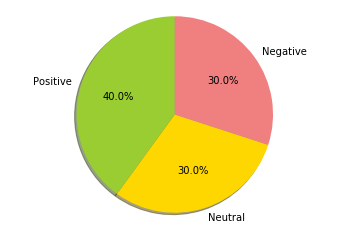

The f1Score is =  0.801025641025641 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  3  0]
 [ 0  3 11]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.8809523809523809 

The Precision is =  0.8095238095238096 



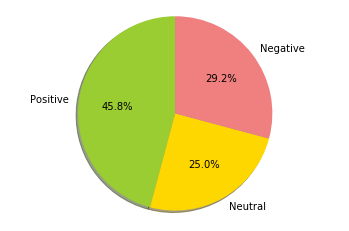

The f1Score is =  0.51084229390681 

The Confusion Matix is = 
 [[ 5  6  0]
 [ 0  1  0]
 [ 0  7 12]] 

The accuracy is =  0.5806451612903226 

The recall is =  0.6953748006379584 

The Precision is =  0.6904761904761904 



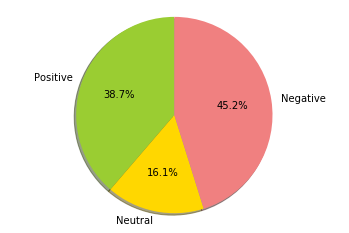

The f1Score is =  0.8248248248248249 

The Confusion Matix is = 
 [[ 8  2  0]
 [ 0  5  0]
 [ 0  3 17]] 

The accuracy is =  0.8571428571428571 

The recall is =  0.8833333333333333 

The Precision is =  0.8333333333333334 



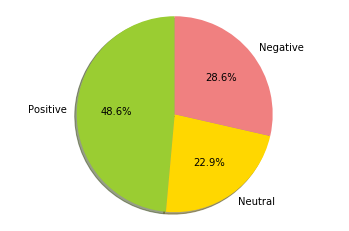

The f1Score is =  0.7774342060056346 

The Confusion Matix is = 
 [[22  5  0]
 [ 0  9  0]
 [ 0 10 40]] 

The accuracy is =  0.8255813953488372 

The recall is =  0.8716049382716049 

The Precision is =  0.7916666666666666 



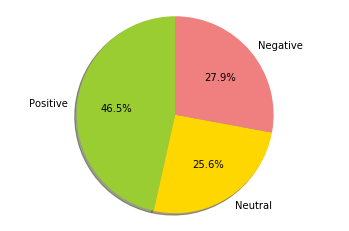

The f1Score is =  0.5997584541062801 

The Confusion Matix is = 
 [[9 6 0]
 [0 2 0]
 [0 5 9]] 

The accuracy is =  0.6451612903225806 

The recall is =  0.7476190476190476 

The Precision is =  0.717948717948718 



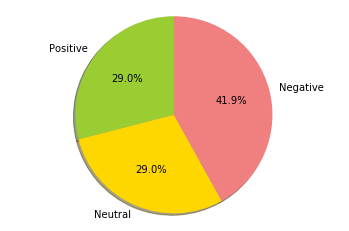

The f1Score is =  0.5590909090909091 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  4  0]
 [ 0  2 19]] 

The accuracy is =  0.8846153846153846 

The recall is =  0.6349206349206349 

The Precision is =  0.5238095238095238 



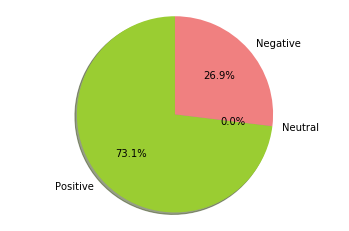

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 5]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



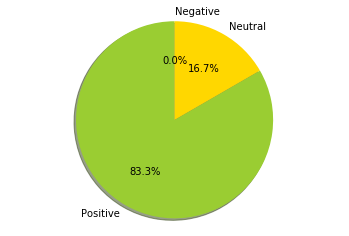

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



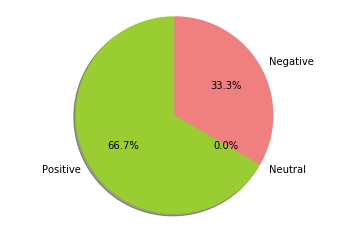

The f1Score is =  0.7682539682539682 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  3  0]
 [ 0  1 17]] 

The accuracy is =  0.88 

The recall is =  0.8148148148148149 

The Precision is =  0.8333333333333334 



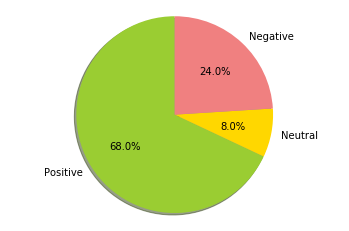

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 8  0]
 [ 0 20]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



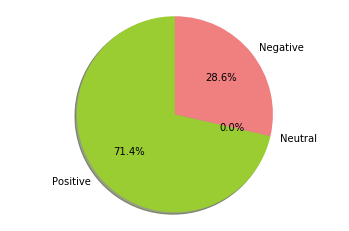

The f1Score is =  0.6891923436041084 

The Confusion Matix is = 
 [[ 7  3  0]
 [ 0  1  0]
 [ 0  2 23]] 

The accuracy is =  0.8611111111111112 

The recall is =  0.8733333333333334 

The Precision is =  0.7222222222222223 



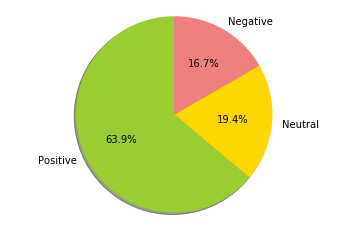

The f1Score is =  0.7477570738440305 

The Confusion Matix is = 
 [[ 4  4  0]
 [ 0 16  0]
 [ 0 10 37]] 

The accuracy is =  0.8028169014084507 

The recall is =  0.7624113475177304 

The Precision is =  0.8444444444444444 



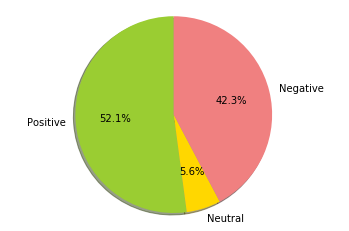

The f1Score is =  0.9019607843137255 

The Confusion Matix is = 
 [[ 8  1  0]
 [ 0  7  0]
 [ 0  2 16]] 

The accuracy is =  0.9117647058823529 

The recall is =  0.9259259259259259 

The Precision is =  0.9 



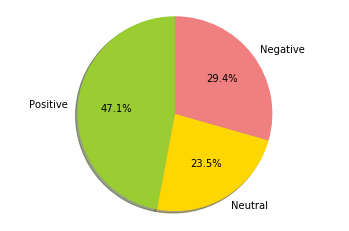

The f1Score is =  0.5777777777777778 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  0  0]
 [ 0  4 28]] 

The accuracy is =  0.8571428571428571 

The recall is =  0.5138888888888888 

The Precision is =  0.6666666666666666 



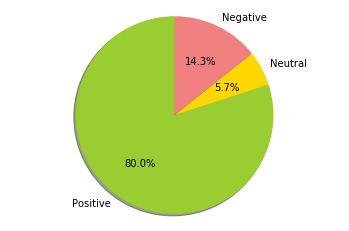

The f1Score is =  0.6823232323232323 

The Confusion Matix is = 
 [[ 6  4  0]
 [ 0  2  0]
 [ 0  3 21]] 

The accuracy is =  0.8055555555555556 

The recall is =  0.8250000000000001 

The Precision is =  0.7407407407407408 



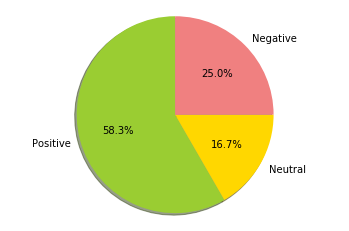

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0]
 [ 0 32]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



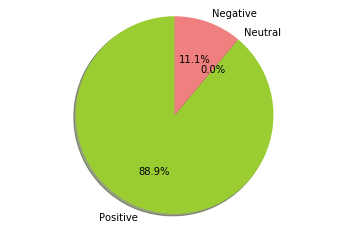

The f1Score is =  0.8692075015124017 

The Confusion Matix is = 
 [[14  1  0]
 [ 0  8  0]
 [ 0  3  8]] 

The accuracy is =  0.8823529411764706 

The recall is =  0.8868686868686869 

The Precision is =  0.8888888888888888 



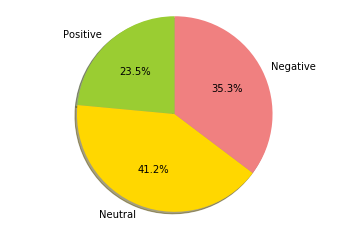

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0 10  0]
 [ 0  0 27]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



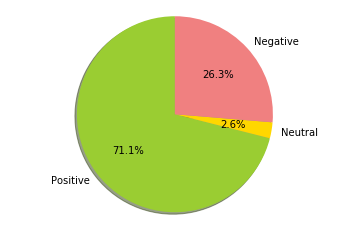

The f1Score is =  0.565533419235471 

The Confusion Matix is = 
 [[14  7  0]
 [ 0  1  0]
 [ 1 10 24]] 

The accuracy is =  0.6842105263157895 

The recall is =  0.784126984126984 

The Precision is =  0.662962962962963 



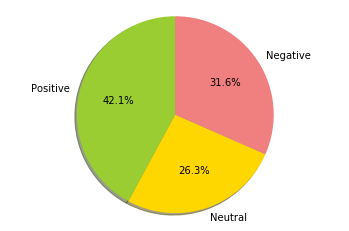

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



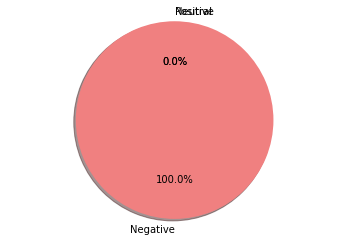

The f1Score is =  0.7895199182839633 

The Confusion Matix is = 
 [[33  9  0]
 [ 0 27  0]
 [ 0 26 97]] 

The accuracy is =  0.8177083333333334 

The recall is =  0.8581107239643825 

The Precision is =  0.8118279569892474 



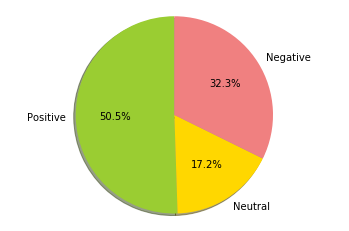

The f1Score is =  0.8812203228869896 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0 11  0]
 [ 0  3 31]] 

The accuracy is =  0.9074074074074074 

The recall is =  0.8965141612200435 

The Precision is =  0.8958333333333334 



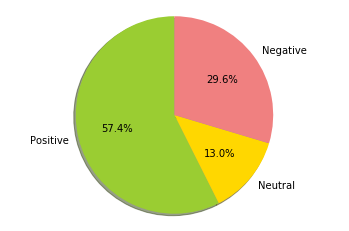

The f1Score is =  0.5071428571428572 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  2  0]
 [ 0  2 19]] 

The accuracy is =  0.875 

The recall is =  0.6349206349206349 

The Precision is =  0.4666666666666666 



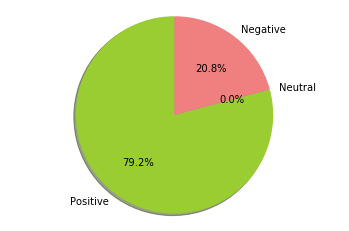

The f1Score is =  0.8518518518518517 

The Confusion Matix is = 
 [[1 1 0]
 [0 4 0]
 [0 0 8]] 

The accuracy is =  0.9285714285714286 

The recall is =  0.8333333333333334 

The Precision is =  0.9333333333333332 



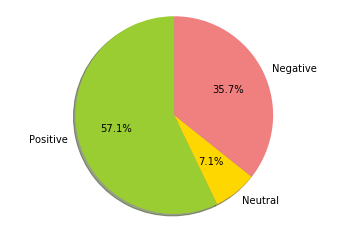

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



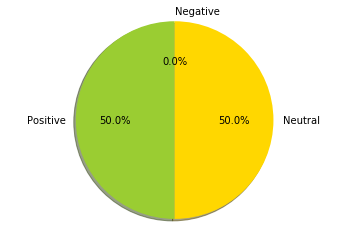

The f1Score is =  1.0 

The Confusion Matix is = 
 [[4]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



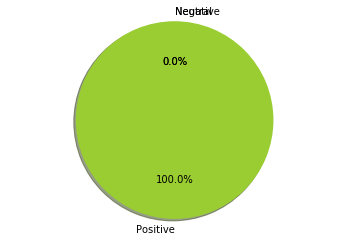

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  4  0]
 [ 0  0 12]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



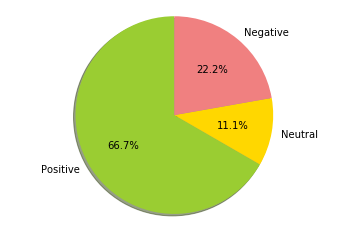

The f1Score is =  0.8642096642096643 

The Confusion Matix is = 
 [[10  5  0]
 [ 0 15  0]
 [ 0  2 54]] 

The accuracy is =  0.9186046511627907 

The recall is =  0.876984126984127 

The Precision is =  0.8939393939393939 



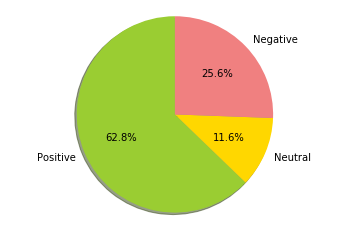

The f1Score is =  0.903030303030303 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0 10  0]
 [ 0  0 55]] 

The accuracy is =  0.971830985915493 

The recall is =  0.8888888888888888 

The Precision is =  0.9444444444444445 



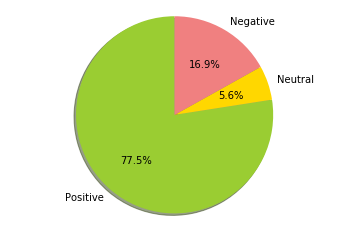

The f1Score is =  0.6753812636165577 

The Confusion Matix is = 
 [[ 4  4  0]
 [ 0  4  0]
 [ 0  5 20]] 

The accuracy is =  0.7567567567567568 

The recall is =  0.7666666666666666 

The Precision is =  0.7692307692307692 



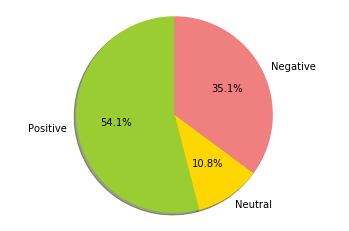

The f1Score is =  0.7221978087456521 

The Confusion Matix is = 
 [[30 11  0]
 [ 0  6  0]
 [ 0  8 57]] 

The accuracy is =  0.8303571428571429 

The recall is =  0.869543464665416 

The Precision is =  0.7466666666666667 



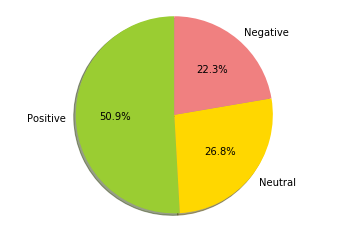

The f1Score is =  0.7626984126984127 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  4  0]
 [ 0  4 22]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.8376068376068376 

The Precision is =  0.7999999999999999 



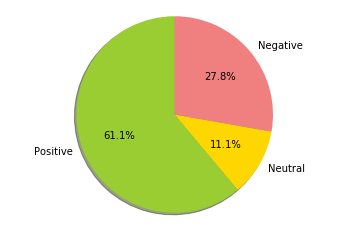

The f1Score is =  0.9319865319865319 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0 10  0]
 [ 0  1 22]] 

The accuracy is =  0.9487179487179487 

The recall is =  0.9299516908212562 

The Precision is =  0.9444444444444445 



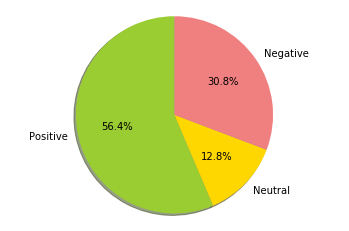

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0  6  0]
 [ 0  0 25]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



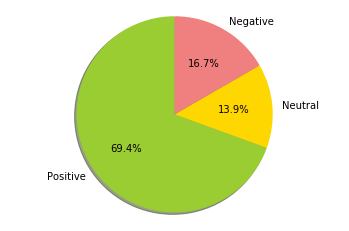

The f1Score is =  0.896969696969697 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  4  0]
 [ 0  1 27]] 

The accuracy is =  0.9473684210526315 

The recall is =  0.9325396825396827 

The Precision is =  0.8888888888888888 



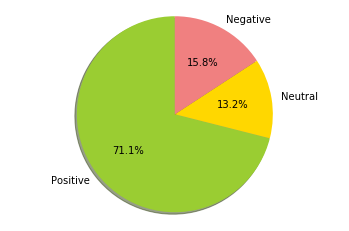

The f1Score is =  0.8410991636798087 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  8  0]
 [ 0  1 15]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.8125 

The Precision is =  0.9333333333333332 



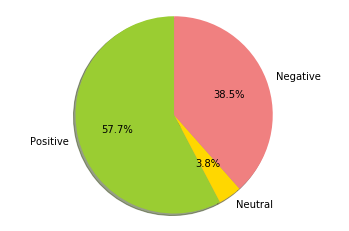

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



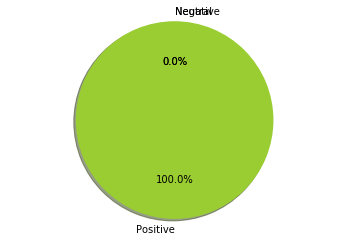

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0 0]
 [0 2 0]
 [0 0 1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



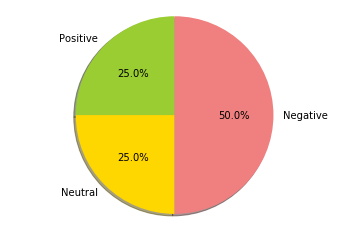

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



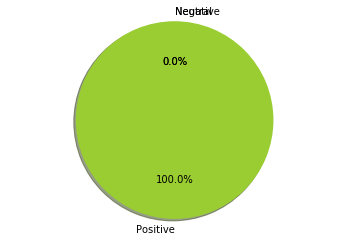

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



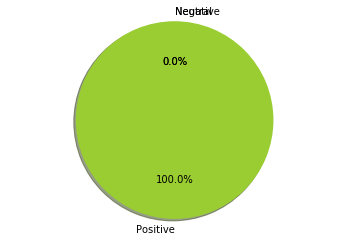

The f1Score is =  0.3333333333333333 

The Confusion Matix is = 
 [[1 0]
 [1 0]] 

The accuracy is =  0.5 

The recall is =  0.5 

The Precision is =  0.25 



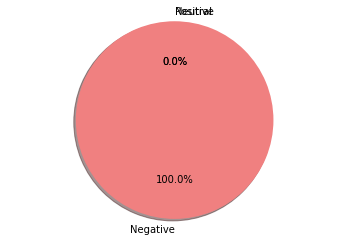

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



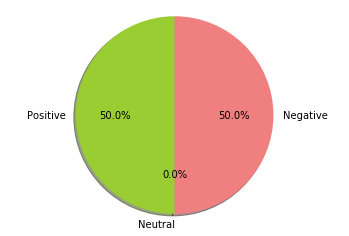

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



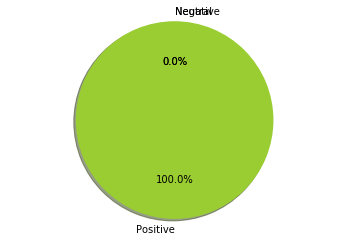

The f1Score is =  0.3333333333333333 

The Confusion Matix is = 
 [[0 2 0]
 [0 0 0]
 [0 0 1]] 

The accuracy is =  0.3333333333333333 

The recall is =  0.3333333333333333 

The Precision is =  0.3333333333333333 



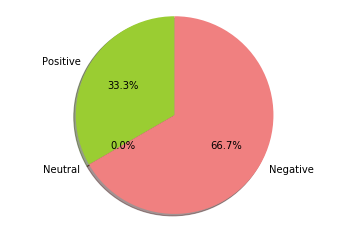

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



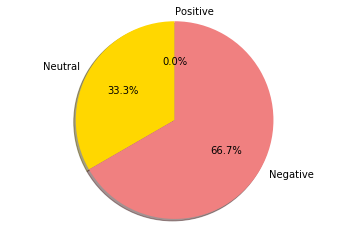

The f1Score is =  0.4 

The Confusion Matix is = 
 [[2 1]
 [0 0]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.3333333333333333 

The Precision is =  0.5 



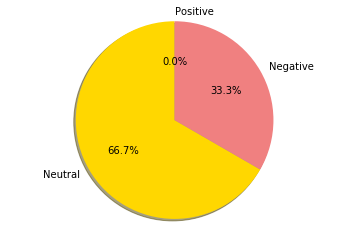

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



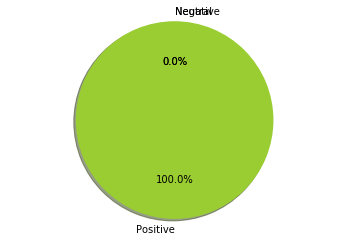

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



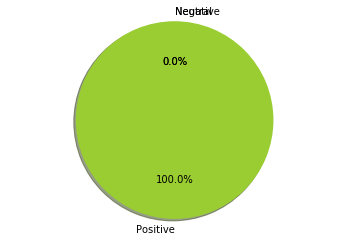

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 5]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



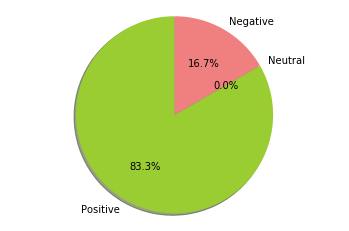

The f1Score is =  0.2222222222222222 

The Confusion Matix is = 
 [[0 1 0]
 [0 0 0]
 [0 1 1]] 

The accuracy is =  0.3333333333333333 

The recall is =  0.16666666666666666 

The Precision is =  0.3333333333333333 



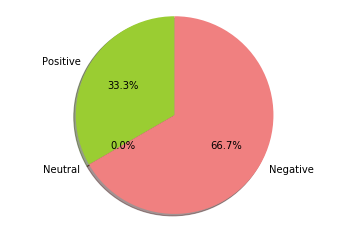

The f1Score is =  0.7320987654320987 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0  2  0]
 [ 0  4 52]] 

The accuracy is =  0.9076923076923077 

The recall is =  0.880952380952381 

The Precision is =  0.75 



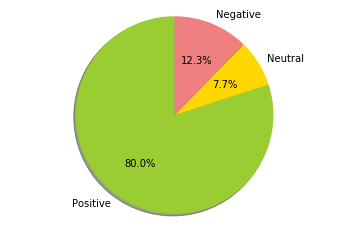

The f1Score is =  0.7537143188003012 

The Confusion Matix is = 
 [[13  4  0]
 [ 0  9  0]
 [ 0 16 93]] 

The accuracy is =  0.8518518518518519 

The recall is =  0.8726389638424177 

The Precision is =  0.7701149425287356 



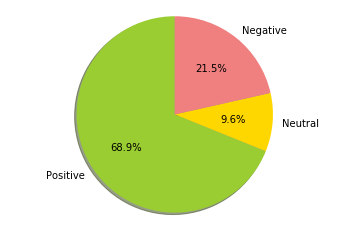

The f1Score is =  0.8730158730158729 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  3  0]
 [ 0  3 30]] 

The accuracy is =  0.918918918918919 

The recall is =  0.9696969696969697 

The Precision is =  0.8333333333333334 



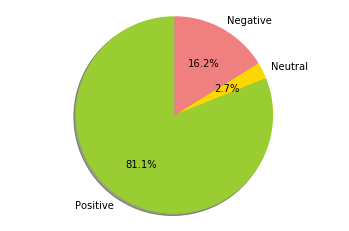

The f1Score is =  0.670414673046252 

The Confusion Matix is = 
 [[ 12   8   0]
 [  0   6   0]
 [  0  18 156]] 

The accuracy is =  0.87 

The recall is =  0.8321839080459771 

The Precision is =  0.7291666666666666 



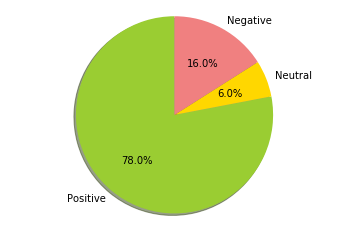

The f1Score is =  0.8173659003831418 

The Confusion Matix is = 
 [[ 35  17   0]
 [  0  33   0]
 [  0  13 156]] 

The accuracy is =  0.8818897637795275 

The recall is =  0.8653846153846154 

The Precision is =  0.8412698412698413 



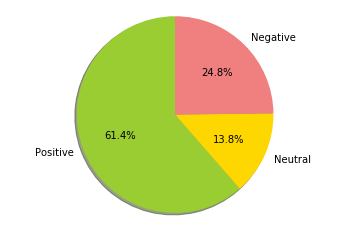

The f1Score is =  0.8468720821661998 

The Confusion Matix is = 
 [[  2   2   0]
 [  0  15   0]
 [  0   2 118]] 

The accuracy is =  0.9712230215827338 

The recall is =  0.8277777777777778 

The Precision is =  0.9298245614035089 



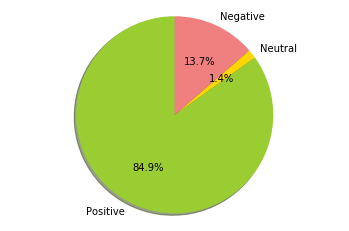

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 8]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



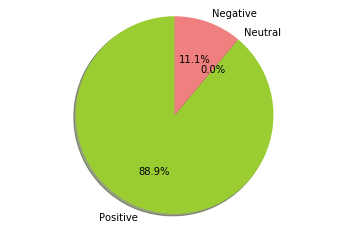

The f1Score is =  0.6929824561403507 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  6  0]
 [ 0 10 52]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.7795698924731184 

The Precision is =  0.7777777777777777 



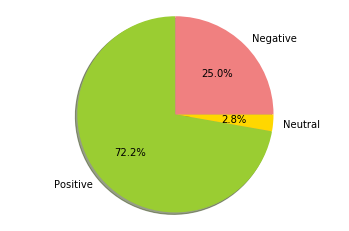

The f1Score is =  0.8689234458196692 

The Confusion Matix is = 
 [[21  3  0]
 [ 0 17  0]
 [ 0  9 64]] 

The accuracy is =  0.8947368421052632 

The recall is =  0.9172374429223744 

The Precision is =  0.8620689655172414 



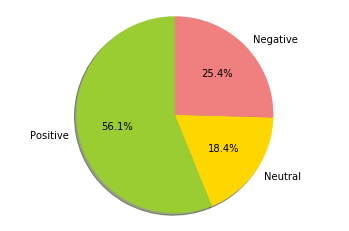

The f1Score is =  0.7153422772617818 

The Confusion Matix is = 
 [[32 12  0]
 [ 0  8  0]
 [ 0  6 15]] 

The accuracy is =  0.7534246575342466 

The recall is =  0.8138528138528138 

The Precision is =  0.7692307692307692 



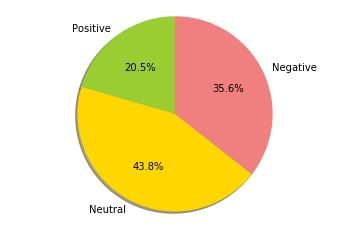

The f1Score is =  0.6629800307219663 

The Confusion Matix is = 
 [[84 42  0]
 [ 0 12  0]
 [ 0 18 84]] 

The accuracy is =  0.75 

The recall is =  0.8300653594771242 

The Precision is =  0.7222222222222223 



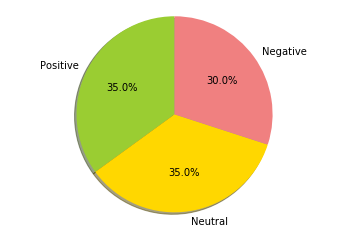

The f1Score is =  0.5764060809447837 

The Confusion Matix is = 
 [[70 26  0]
 [ 0  8  0]
 [ 0 31 31]] 

The accuracy is =  0.6566265060240963 

The recall is =  0.7430555555555555 

The Precision is =  0.7076923076923077 



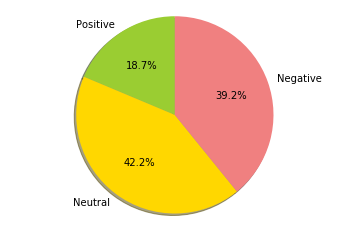

The f1Score is =  0.7845117845117845 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  6  0]
 [ 0  7 19]] 

The accuracy is =  0.7894736842105263 

The recall is =  0.8547008547008548 

The Precision is =  0.8095238095238096 



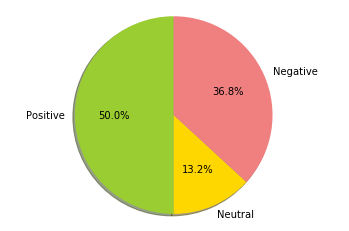

The f1Score is =  0.7859335038363171 

The Confusion Matix is = 
 [[10  3  0]
 [ 0  5  0]
 [ 0  4 18]] 

The accuracy is =  0.825 

The recall is =  0.8624708624708625 

The Precision is =  0.8055555555555557 



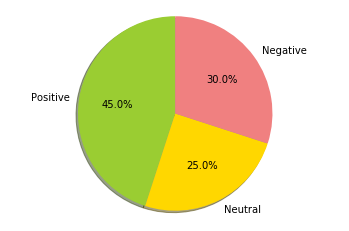

The f1Score is =  0.7418803418803419 

The Confusion Matix is = 
 [[ 5  3  0]
 [ 0  4  0]
 [ 0  4 24]] 

The accuracy is =  0.825 

The recall is =  0.8273809523809524 

The Precision is =  0.787878787878788 



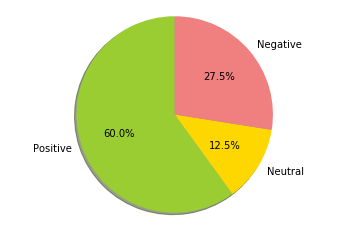

The f1Score is =  0.8504557772850455 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0 10  0]
 [ 0  1 20]] 

The accuracy is =  0.9393939393939394 

The recall is =  0.8174603174603176 

The Precision is =  0.9444444444444445 



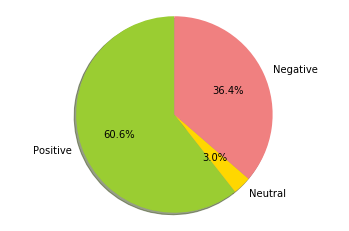

The f1Score is =  0.8585858585858586 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  5  0]
 [ 0  5 25]] 

The accuracy is =  0.868421052631579 

The recall is =  0.9444444444444445 

The Precision is =  0.8333333333333334 



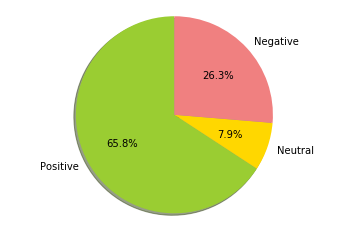

The f1Score is =  0.5555555555555555 

The Confusion Matix is = 
 [[0 1 0]
 [0 1 0]
 [0 0 2]] 

The accuracy is =  0.75 

The recall is =  0.6666666666666666 

The Precision is =  0.5 



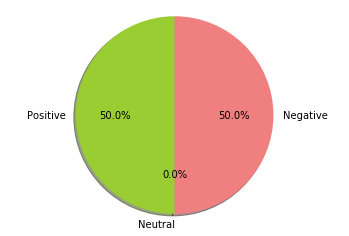

The f1Score is =  0.6718875502008032 

The Confusion Matix is = 
 [[10  4  0]
 [ 0  2  0]
 [ 0  7 38]] 

The accuracy is =  0.819672131147541 

The recall is =  0.852910052910053 

The Precision is =  0.717948717948718 



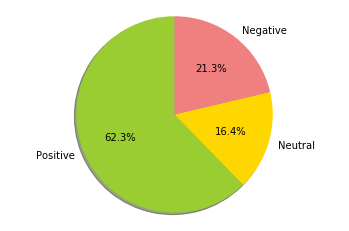

The f1Score is =  0.8551587301587301 

The Confusion Matix is = 
 [[ 6  2  0]
 [ 0  6  0]
 [ 0  2 23]] 

The accuracy is =  0.8974358974358975 

The recall is =  0.89 

The Precision is =  0.8666666666666667 



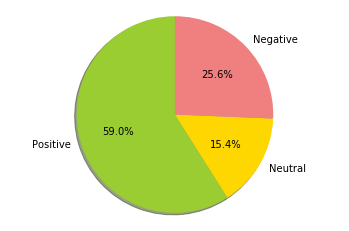

The f1Score is =  0.9235294117647058 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  4  0]
 [ 0  2 33]] 

The accuracy is =  0.95 

The recall is =  0.980952380952381 

The Precision is =  0.8888888888888888 



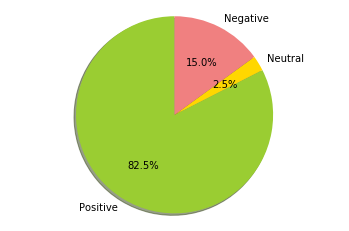

The f1Score is =  0.8493265993265994 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  9  0]
 [ 0  5 20]] 

The accuracy is =  0.85 

The recall is =  0.8777777777777779 

The Precision is =  0.8666666666666667 



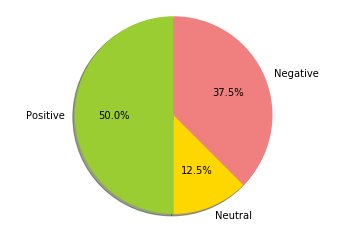

The f1Score is =  0.587287974080427 

The Confusion Matix is = 
 [[ 4  3  0]
 [ 0  1  0]
 [ 0  7 23]] 

The accuracy is =  0.7368421052631579 

The recall is =  0.7793650793650794 

The Precision is =  0.6969696969696969 



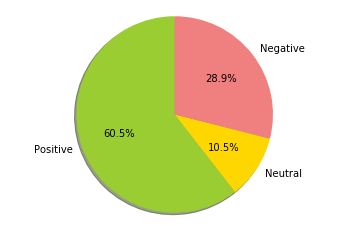

The f1Score is =  0.5677777777777777 

The Confusion Matix is = 
 [[ 9  7  0]
 [ 0  1  0]
 [ 0  6 17]] 

The accuracy is =  0.675 

The recall is =  0.7672101449275361 

The Precision is =  0.6904761904761904 



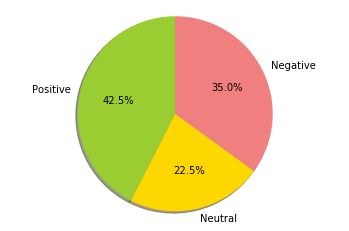

The f1Score is =  0.8310859227411894 

The Confusion Matix is = 
 [[12  4  0]
 [ 0 12  0]
 [ 0  6 40]] 

The accuracy is =  0.8648648648648649 

The recall is =  0.8731884057971014 

The Precision is =  0.8484848484848485 



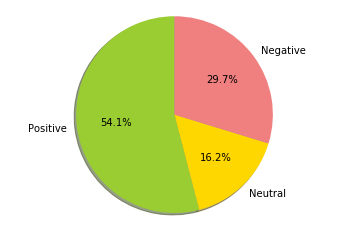

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0 14  0]
 [ 0  0 20]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



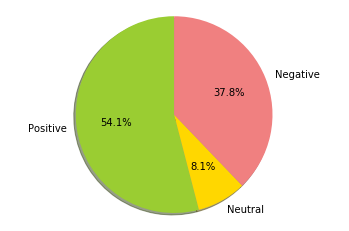

The f1Score is =  0.9302297387403771 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  8  0]
 [ 0  1 23]] 

The accuracy is =  0.9487179487179487 

The recall is =  0.9384920634920636 

The Precision is =  0.9333333333333332 



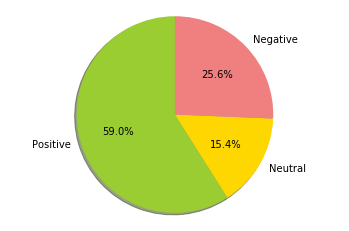

The f1Score is =  0.9784150477952513 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0 11  0]
 [ 0  1 23]] 

The accuracy is =  0.9743589743589743 

The recall is =  0.9861111111111112 

The Precision is =  0.9722222222222222 



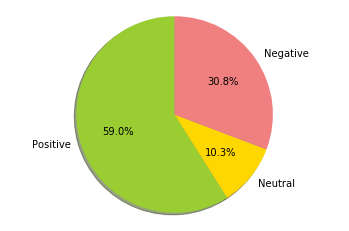

The f1Score is =  0.8967409948542023 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  4  0]
 [ 0  1 26]] 

The accuracy is =  0.9459459459459459 

The recall is =  0.9320987654320988 

The Precision is =  0.8888888888888888 



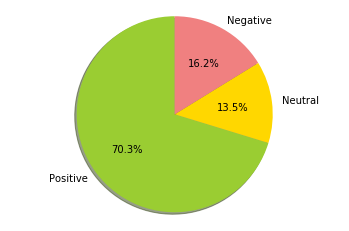

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  7  0]
 [ 0  0 28]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



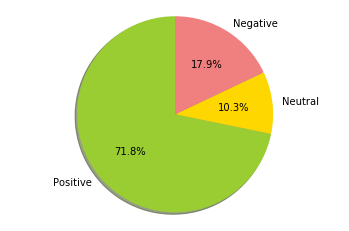

The f1Score is =  0.8222222222222223 

The Confusion Matix is = 
 [[ 3  3  0]
 [ 0  6  0]
 [ 0  0 28]] 

The accuracy is =  0.925 

The recall is =  0.8333333333333334 

The Precision is =  0.8888888888888888 



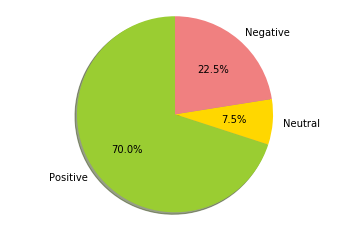

The f1Score is =  0.7118022328548644 

The Confusion Matix is = 
 [[ 7  6  0]
 [ 0  5  0]
 [ 0  3 15]] 

The accuracy is =  0.75 

The recall is =  0.7905982905982906 

The Precision is =  0.7857142857142857 



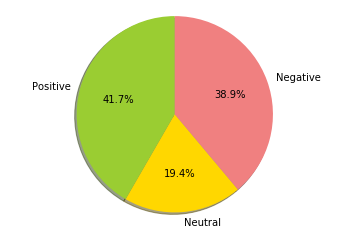

The f1Score is =  0.5168067226890757 

The Confusion Matix is = 
 [[ 1  2  0]
 [ 0  2  0]
 [ 0  8 13]] 

The accuracy is =  0.6153846153846154 

The recall is =  0.6507936507936508 

The Precision is =  0.7222222222222223 



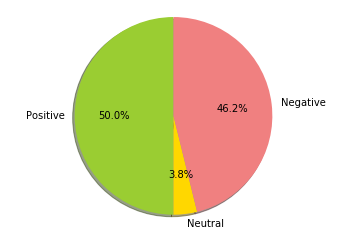

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0 0]
 [0 1 0]
 [0 0 7]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



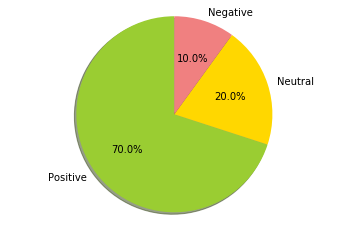

The f1Score is =  0.5158730158730158 

The Confusion Matix is = 
 [[10  8  0]
 [ 0  0  0]
 [ 0  6 15]] 

The accuracy is =  0.6410256410256411 

The recall is =  0.42328042328042326 

The Precision is =  0.6666666666666666 



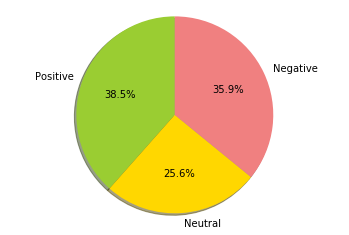

The f1Score is =  0.7062617016850427 

The Confusion Matix is = 
 [[16  6  0]
 [ 0  4  0]
 [ 0  8 42]] 

The accuracy is =  0.8157894736842105 

The recall is =  0.8557575757575758 

The Precision is =  0.7407407407407408 



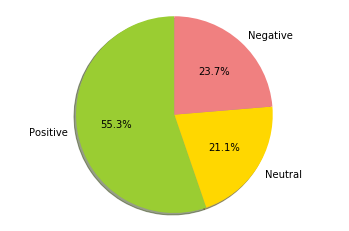

The f1Score is =  0.8039046798736721 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0 11  1]
 [ 0  2 20]] 

The accuracy is =  0.868421052631579 

The recall is =  0.7752525252525252 

The Precision is =  0.8952380952380953 



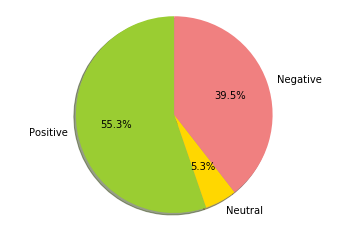

The f1Score is =  0.8154195011337869 

The Confusion Matix is = 
 [[ 3  3  0]
 [ 0  8  0]
 [ 0  1 24]] 

The accuracy is =  0.8974358974358975 

The recall is =  0.82 

The Precision is =  0.8888888888888888 



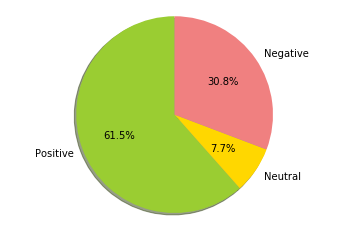

The f1Score is =  0.6912442396313364 

The Confusion Matix is = 
 [[ 4  6  0]
 [ 0 10  0]
 [ 0  5 15]] 

The accuracy is =  0.725 

The recall is =  0.7166666666666667 

The Precision is =  0.8253968253968255 



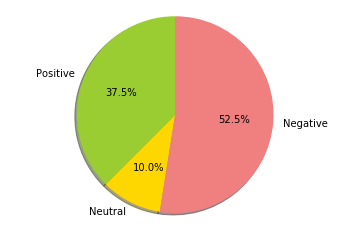

The f1Score is =  0.7713000449842555 

The Confusion Matix is = 
 [[ 8  3  0]
 [ 0  6  0]
 [ 0  5 17]] 

The accuracy is =  0.7948717948717948 

The recall is =  0.8333333333333334 

The Precision is =  0.8095238095238096 



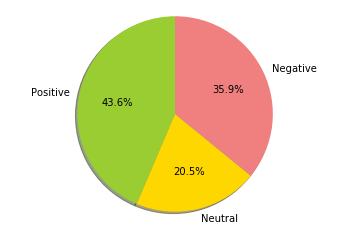

The f1Score is =  0.8481711525189786 

The Confusion Matix is = 
 [[ 9  5  0]
 [ 0  8  0]
 [ 0  0 18]] 

The accuracy is =  0.875 

The recall is =  0.8809523809523809 

The Precision is =  0.8717948717948718 



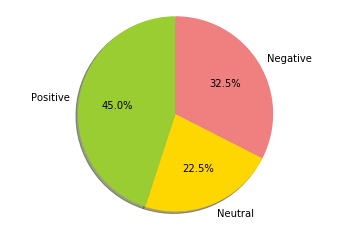

The f1Score is =  0.5840009288285151 

The Confusion Matix is = 
 [[15  3  0]
 [ 0  2  0]
 [ 0 11  9]] 

The accuracy is =  0.65 

The recall is =  0.7611111111111112 

The Precision is =  0.7083333333333334 



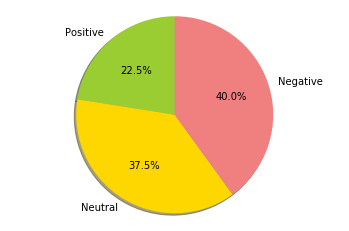

The f1Score is =  0.8845744680851064 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0  6  0]
 [ 0  1 23]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.9120370370370371 

The Precision is =  0.8888888888888888 



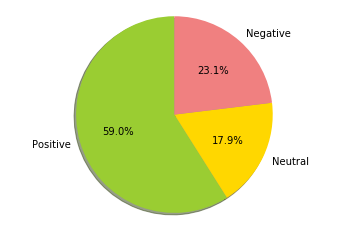

The f1Score is =  0.6576362705394964 

The Confusion Matix is = 
 [[14  5  0]
 [ 0  2  0]
 [ 0  5 13]] 

The accuracy is =  0.7435897435897436 

The recall is =  0.8196881091617935 

The Precision is =  0.7222222222222223 



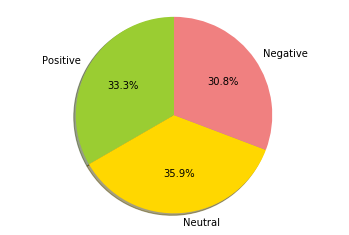

The f1Score is =  0.7926887926887928 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  4  0]
 [ 0  1 31]] 

The accuracy is =  0.925 

The recall is =  0.8229166666666666 

The Precision is =  0.8571428571428571 



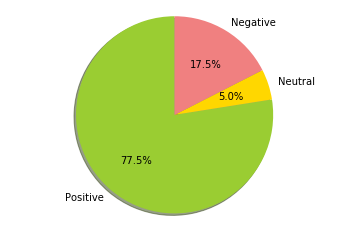

The f1Score is =  0.9733742959549412 

The Confusion Matix is = 
 [[14  0  0]
 [ 0 15  0]
 [ 0  1 10]] 

The accuracy is =  0.975 

The recall is =  0.9696969696969697 

The Precision is =  0.9791666666666666 



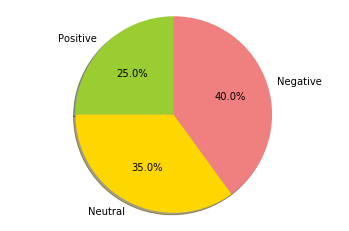

The f1Score is =  0.5153638596915147 

The Confusion Matix is = 
 [[31 27  0]
 [ 0  0  0]
 [ 0 28 79]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.42426683854334507 

The Precision is =  0.6666666666666666 



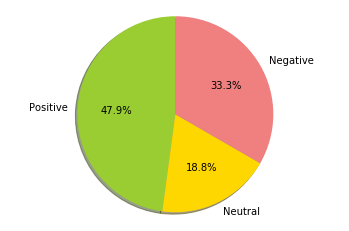

The f1Score is =  0.5376676986584107 

The Confusion Matix is = 
 [[ 7  3  0]
 [ 0  0  0]
 [ 0  8 15]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.4507246376811594 

The Precision is =  0.6666666666666666 



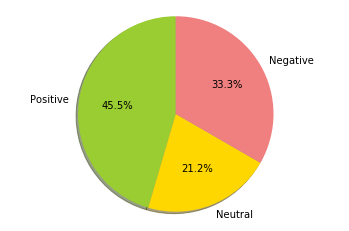

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0 0]
 [0 2 0]
 [0 0 7]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



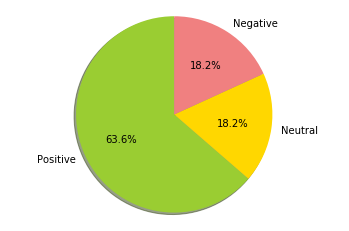

The f1Score is =  0.5206971677559913 

The Confusion Matix is = 
 [[14  8  0]
 [ 0  1  0]
 [ 0  7  7]] 

The accuracy is =  0.5945945945945946 

The recall is =  0.712121212121212 

The Precision is =  0.6875 



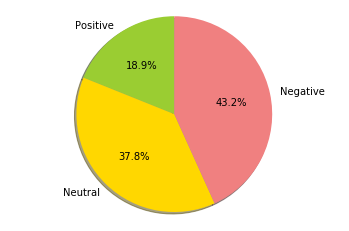

The f1Score is =  0.9537037037037036 

The Confusion Matix is = 
 [[ 8  0  0]
 [ 0 11  0]
 [ 0  2 17]] 

The accuracy is =  0.9473684210526315 

The recall is =  0.9649122807017544 

The Precision is =  0.9487179487179488 



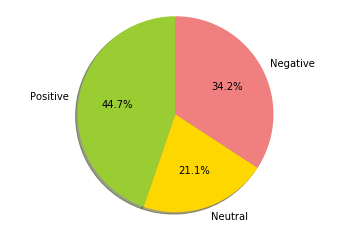

The f1Score is =  0.8697027197975964 

The Confusion Matix is = 
 [[14  3  0]
 [ 0 20  0]
 [ 0  8 47]] 

The accuracy is =  0.8804347826086957 

The recall is =  0.8926916221033867 

The Precision is =  0.8817204301075269 



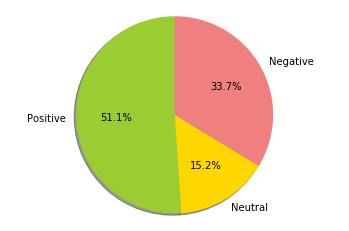

The f1Score is =  0.5917252146760342 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  0  0]
 [ 0  5 28]] 

The accuracy is =  0.8378378378378378 

The recall is =  0.5328282828282829 

The Precision is =  0.6666666666666666 



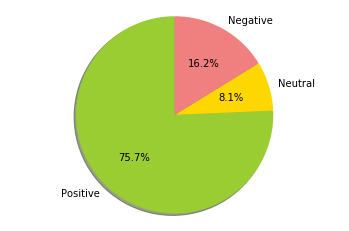

The f1Score is =  0.926241134751773 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0  2  0]
 [ 0  1 23]] 

The accuracy is =  0.96875 

The recall is =  0.9861111111111112 

The Precision is =  0.8888888888888888 



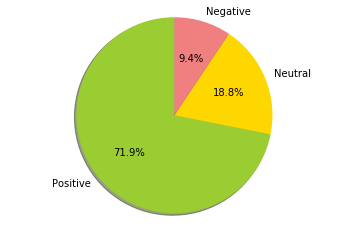

The f1Score is =  0.6820086231850938 

The Confusion Matix is = 
 [[  4   3   0]
 [  0   3   0]
 [  0   8 113]] 

The accuracy is =  0.916030534351145 

The recall is =  0.8351042896497441 

The Precision is =  0.7380952380952381 



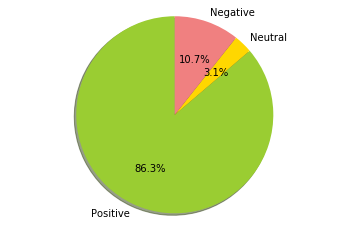

The f1Score is =  0.8467320261437908 

The Confusion Matix is = 
 [[ 8  4  0]
 [ 0 14  0]
 [ 0  2 11]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.8376068376068376 

The Precision is =  0.9 



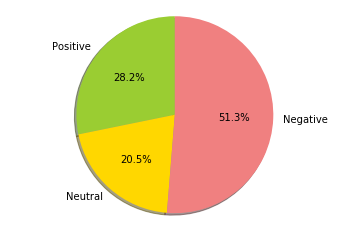

The f1Score is =  0.6249637155297533 

The Confusion Matix is = 
 [[ 5  3  0]
 [ 0  1  0]
 [ 0  5 24]] 

The accuracy is =  0.7894736842105263 

The recall is =  0.8175287356321839 

The Precision is =  0.7037037037037037 



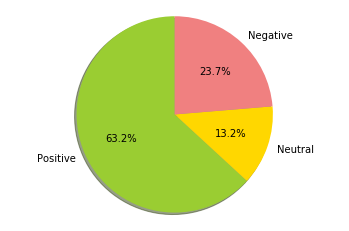

The f1Score is =  0.9547511312217195 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  8  0]
 [ 0  0 17]] 

The accuracy is =  0.96875 

The recall is =  0.9523809523809524 

The Precision is =  0.9629629629629629 



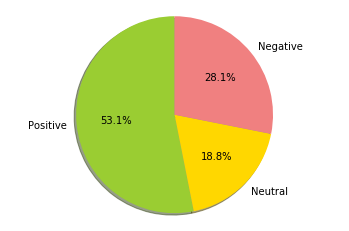

The f1Score is =  0.6595141895916167 

The Confusion Matix is = 
 [[29 16  0]
 [ 0  7  0]
 [ 0 16 65]] 

The accuracy is =  0.7593984962406015 

The recall is =  0.8156378600823045 

The Precision is =  0.7264957264957266 



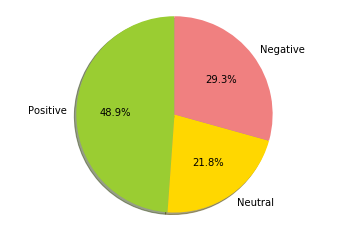

The f1Score is =  0.8313131313131313 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  4  0]
 [ 0  2 29]] 

The accuracy is =  0.9210526315789473 

The recall is =  0.8673835125448028 

The Precision is =  0.8571428571428571 



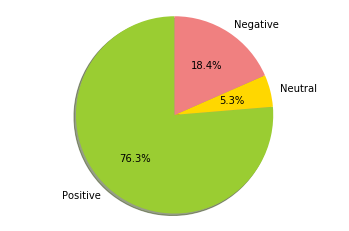

The f1Score is =  1.0 

The Confusion Matix is = 
 [[14  0  0]
 [ 0  4  0]
 [ 0  0 26]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



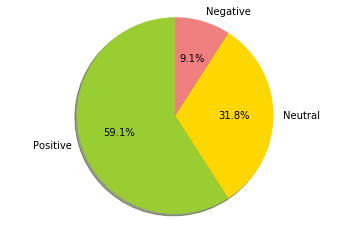

The f1Score is =  0.8539288668320926 

The Confusion Matix is = 
 [[ 8  4  0]
 [ 0 26  0]
 [ 0  6 36]] 

The accuracy is =  0.875 

The recall is =  0.8412698412698413 

The Precision is =  0.9074074074074074 



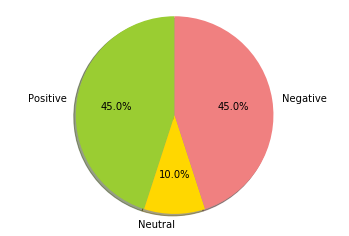

The f1Score is =  0.6190476190476191 

The Confusion Matix is = 
 [[3 1 0]
 [0 0 0]
 [0 0 4]] 

The accuracy is =  0.875 

The recall is =  0.5833333333333334 

The Precision is =  0.6666666666666666 



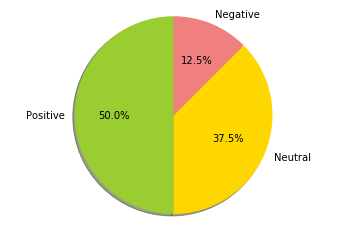

The f1Score is =  0.9187675070028011 

The Confusion Matix is = 
 [[ 3  0]
 [ 1 25]] 

The accuracy is =  0.9655172413793104 

The recall is =  0.9807692307692308 

The Precision is =  0.875 



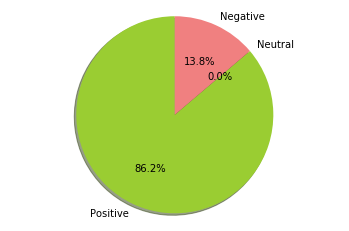

The f1Score is =  0.7182539682539683 

The Confusion Matix is = 
 [[ 2  3  0]
 [ 0  7  0]
 [ 0  4 22]] 

The accuracy is =  0.8157894736842105 

The recall is =  0.7487179487179487 

The Precision is =  0.8333333333333334 



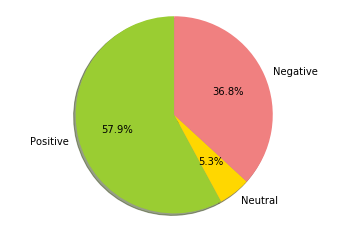

The f1Score is =  0.8115778474399163 

The Confusion Matix is = 
 [[ 9  4  0]
 [ 0  9  0]
 [ 0  3 13]] 

The accuracy is =  0.8157894736842105 

The recall is =  0.8349358974358975 

The Precision is =  0.8541666666666666 



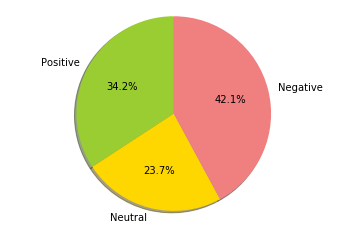

The f1Score is =  0.956876456876457 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0 10  0]
 [ 0  2 25]] 

The accuracy is =  0.9473684210526315 

The recall is =  0.9753086419753086 

The Precision is =  0.9444444444444445 



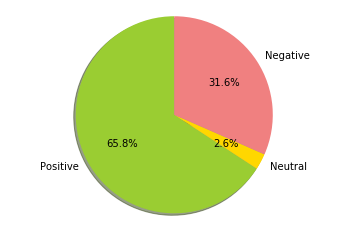

The f1Score is =  0.732248062015504 

The Confusion Matix is = 
 [[ 3  6  0]
 [ 0  9  0]
 [ 0  1 21]] 

The accuracy is =  0.825 

The recall is =  0.7626262626262627 

The Precision is =  0.8541666666666666 



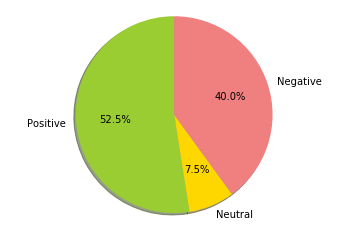

The f1Score is =  0.6153641679957469 

The Confusion Matix is = 
 [[ 3  6  0]
 [ 0  2  0]
 [ 0  1 28]] 

The accuracy is =  0.825 

The recall is =  0.7662835249042145 

The Precision is =  0.7407407407407408 



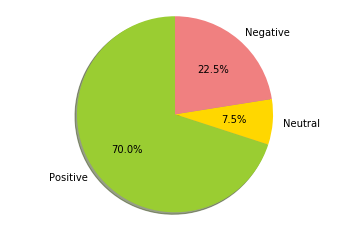

The f1Score is =  0.8927536231884058 

The Confusion Matix is = 
 [[ 2  0]
 [ 1 34]] 

The accuracy is =  0.972972972972973 

The recall is =  0.9857142857142858 

The Precision is =  0.8333333333333333 



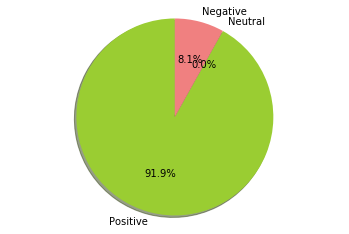

The f1Score is =  0.9267399267399267 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  6  0]
 [ 0  0 29]] 

The accuracy is =  0.9743589743589743 

The recall is =  0.9166666666666666 

The Precision is =  0.9523809523809524 



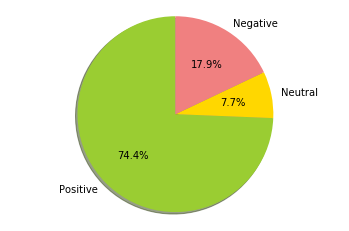

The f1Score is =  0.4767806267806267 

The Confusion Matix is = 
 [[38 41  0]
 [ 0  1  0]
 [ 0 22 33]] 

The accuracy is =  0.5333333333333333 

The recall is =  0.6936708860759494 

The Precision is =  0.671875 



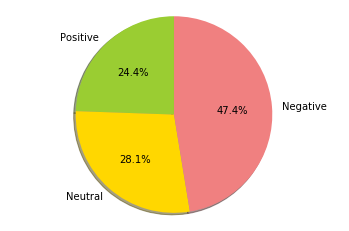

The f1Score is =  0.5503718728870859 

The Confusion Matix is = 
 [[12  5  0]
 [ 0  0  0]
 [ 0  6 14]] 

The accuracy is =  0.7027027027027027 

The recall is =  0.4686274509803921 

The Precision is =  0.6666666666666666 



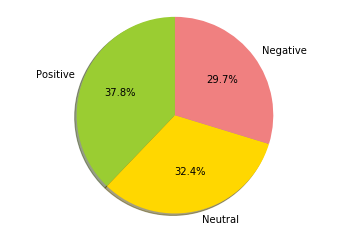

The f1Score is =  0.9267399267399267 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  3  0]
 [ 0  0 26]] 

The accuracy is =  0.9722222222222222 

The recall is =  0.9523809523809524 

The Precision is =  0.9166666666666666 



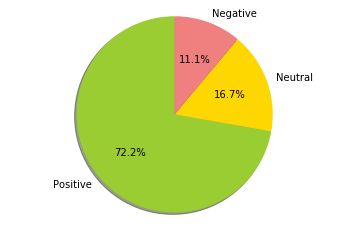

The f1Score is =  0.9157894736842106 

The Confusion Matix is = 
 [[ 9  1  0]
 [ 0  2  0]
 [ 0  0 24]] 

The accuracy is =  0.9722222222222222 

The recall is =  0.9666666666666667 

The Precision is =  0.8888888888888888 



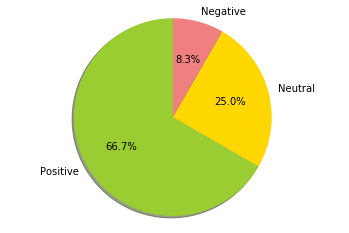

The f1Score is =  0.7375782112624218 

The Confusion Matix is = 
 [[ 8  3  0]
 [ 0  3  0]
 [ 0  4 20]] 

The accuracy is =  0.8157894736842105 

The recall is =  0.8535353535353535 

The Precision is =  0.7666666666666666 



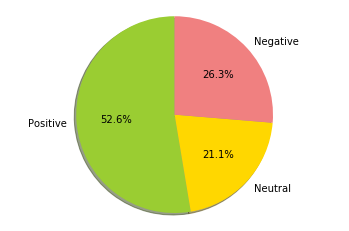

The f1Score is =  0.9286384976525821 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  2  0]
 [ 0  1 35]] 

The accuracy is =  0.975 

The recall is =  0.9907407407407408 

The Precision is =  0.8888888888888888 



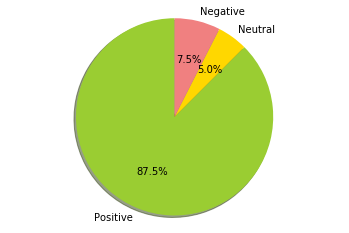

The f1Score is =  0.9223085460599334 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  7  0]
 [ 0  3 25]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.9642857142857143 

The Precision is =  0.9 



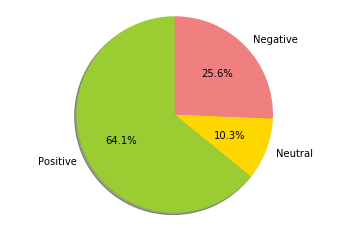

The f1Score is =  0.8365762892078682 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  4  0]
 [ 0  1 28]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.8773946360153256 

The Precision is =  0.8571428571428571 



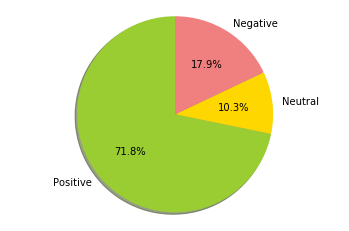

The f1Score is =  0.9301587301587301 

The Confusion Matix is = 
 [[14  2  0]
 [ 0  6  0]
 [ 0  0 56]] 

The accuracy is =  0.9743589743589743 

The recall is =  0.9583333333333334 

The Precision is =  0.9166666666666666 



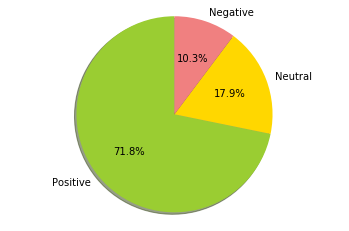

The f1Score is =  1.0 

The Confusion Matix is = 
 [[23]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



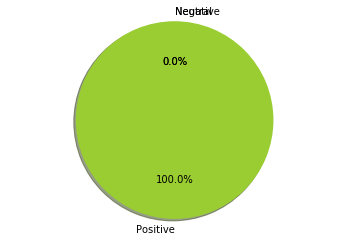

The f1Score is =  0.799266247379455 

The Confusion Matix is = 
 [[ 3  2  0]
 [ 0  3  0]
 [ 0  1 26]] 

The accuracy is =  0.9142857142857143 

The recall is =  0.854320987654321 

The Precision is =  0.8333333333333334 



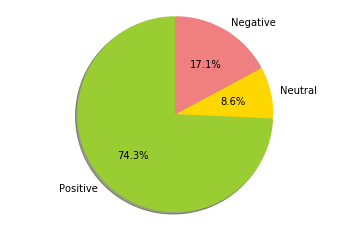

The f1Score is =  0.774919304331069 

The Confusion Matix is = 
 [[ 7  3  0]
 [ 0  7  0]
 [ 0  5 16]] 

The accuracy is =  0.7894736842105263 

The recall is =  0.8206349206349207 

The Precision is =  0.8222222222222223 



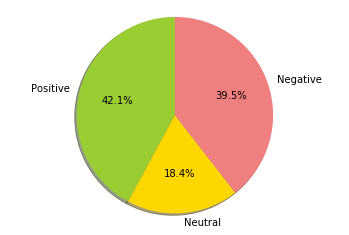

The f1Score is =  0.8509021842355176 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  3  0]
 [ 0  2 26]] 

The accuracy is =  0.9210526315789473 

The recall is =  0.9285714285714285 

The Precision is =  0.8333333333333334 



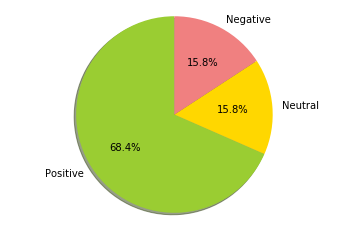

The f1Score is =  0.8793650793650793 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  4  0]
 [ 0  4 68]] 

The accuracy is =  0.95 

The recall is =  0.9814814814814815 

The Precision is =  0.8333333333333334 



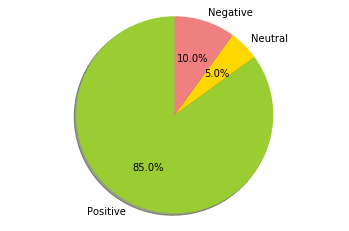

The f1Score is =  0.6177387914230019 

The Confusion Matix is = 
 [[ 8  3  0]
 [ 0  1  0]
 [ 0  7 19]] 

The accuracy is =  0.7368421052631579 

The recall is =  0.8193473193473193 

The Precision is =  0.6969696969696969 



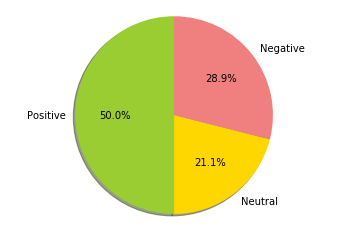

The f1Score is =  0.6414939309056956 

The Confusion Matix is = 
 [[ 9  7  0]
 [ 0  4  0]
 [ 0  6 14]] 

The accuracy is =  0.675 

The recall is =  0.7541666666666668 

The Precision is =  0.7450980392156863 



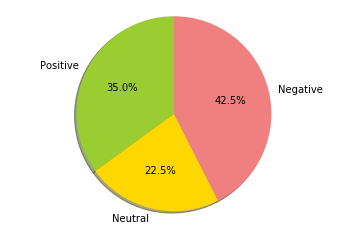

The f1Score is =  0.7132448607858445 

The Confusion Matix is = 
 [[ 6  6  0]
 [ 0 12  0]
 [ 0 12 55]] 

The accuracy is =  0.8021978021978022 

The recall is =  0.7736318407960199 

The Precision is =  0.7999999999999999 



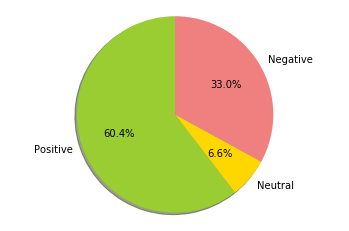

The f1Score is =  0.5341530054644809 

The Confusion Matix is = 
 [[ 9  6  0]
 [ 0  0  0]
 [ 0 27 78]] 

The accuracy is =  0.725 

The recall is =  0.44761904761904764 

The Precision is =  0.6666666666666666 



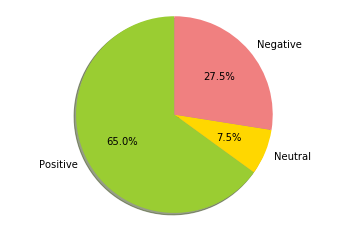

The f1Score is =  0.9076923076923077 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  5  0]
 [ 0  3 31]] 

The accuracy is =  0.925 

The recall is =  0.9705882352941176 

The Precision is =  0.875 



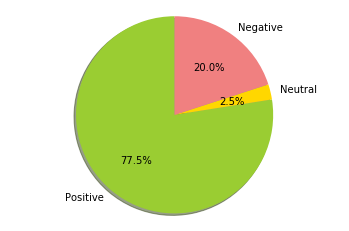

The f1Score is =  0.96870925684485 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  6  0]
 [ 0  1 29]] 

The accuracy is =  0.9736842105263158 

The recall is =  0.9888888888888889 

The Precision is =  0.9523809523809524 



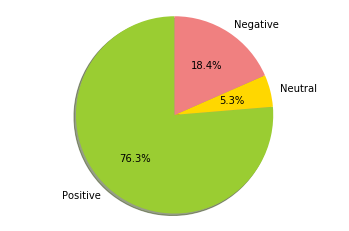

The f1Score is =  0.9211087420042643 

The Confusion Matix is = 
 [[ 3  0]
 [ 1 33]] 

The accuracy is =  0.972972972972973 

The recall is =  0.9852941176470589 

The Precision is =  0.875 



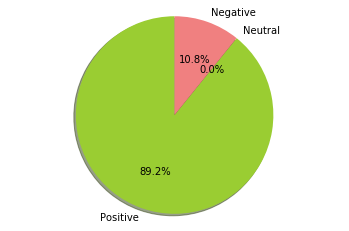

The f1Score is =  0.7554725593941279 

The Confusion Matix is = 
 [[14  5  0]
 [ 0  7  0]
 [ 1  8 55]] 

The accuracy is =  0.8444444444444444 

The recall is =  0.865405701754386 

The Precision is =  0.7611111111111111 



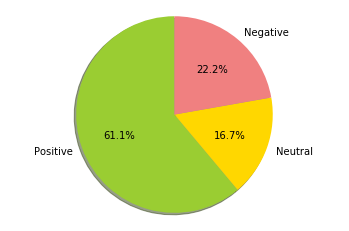

The f1Score is =  0.5542028985507247 

The Confusion Matix is = 
 [[ 9  5  0]
 [ 0  0  0]
 [ 0  3 11]] 

The accuracy is =  0.7142857142857143 

The recall is =  0.4761904761904762 

The Precision is =  0.6666666666666666 



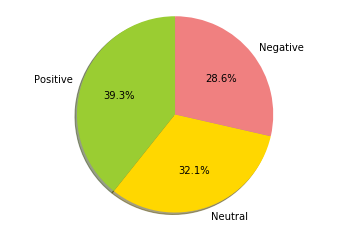

The f1Score is =  0.7777777777777777 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  2  0]
 [ 0  0 19]] 

The accuracy is =  0.92 

The recall is =  0.8333333333333334 

The Precision is =  0.8333333333333334 



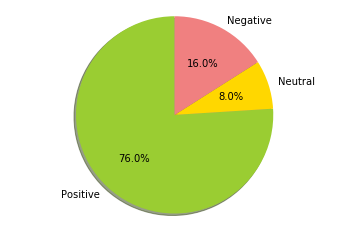

The f1Score is =  0.9378881987577641 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0 15  0]
 [ 0  5 55]] 

The accuracy is =  0.9358974358974359 

The recall is =  0.9722222222222222 

The Precision is =  0.9166666666666666 



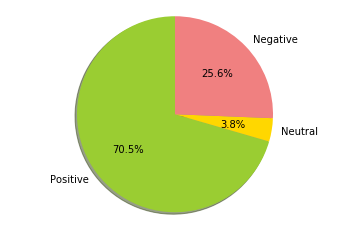

The f1Score is =  0.9398148148148149 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  7  0]
 [ 0  2 17]] 

The accuracy is =  0.9285714285714286 

The recall is =  0.9649122807017544 

The Precision is =  0.9259259259259259 



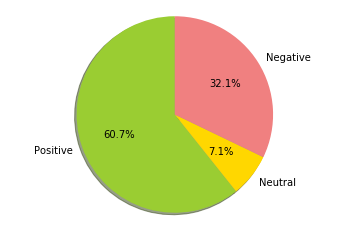

The f1Score is =  0.4948717948717949 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  1  0]
 [ 0  1 32]] 

The accuracy is =  0.9428571428571428 

The recall is =  0.6565656565656566 

The Precision is =  0.4444444444444444 



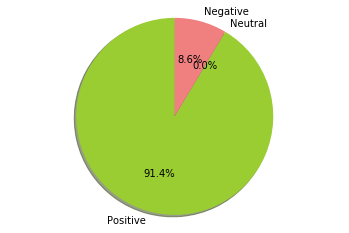

The f1Score is =  0.7824561403508771 

The Confusion Matix is = 
 [[ 9  0  0]
 [ 0  3  0]
 [ 0  9 81]] 

The accuracy is =  0.9117647058823529 

The recall is =  0.9666666666666667 

The Precision is =  0.75 



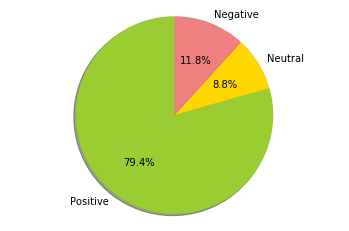

The f1Score is =  0.7758169934640522 

The Confusion Matix is = 
 [[38  9  0]
 [ 0 12  0]
 [ 0 12 54]] 

The accuracy is =  0.832 

The recall is =  0.8755641521598969 

The Precision is =  0.787878787878788 



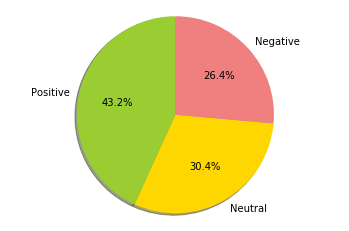

The f1Score is =  1.0 

The Confusion Matix is = 
 [[3]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



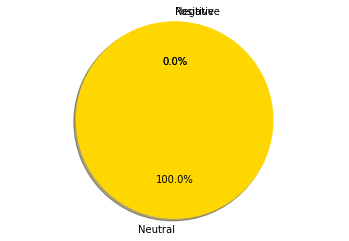

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0]
 [ 0 21]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



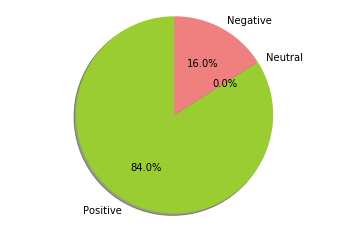

The f1Score is =  0.5353002884867558 

The Confusion Matix is = 
 [[24 14  0]
 [ 0  2  0]
 [ 0 22 30]] 

The accuracy is =  0.6086956521739131 

The recall is =  0.7361673414304993 

The Precision is =  0.6842105263157894 



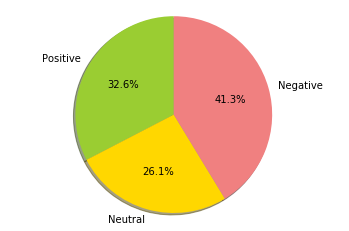

The f1Score is =  0.8161616161616162 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  4  0]
 [ 0  1 27]] 

The accuracy is =  0.9411764705882353 

The recall is =  0.8214285714285715 

The Precision is =  0.8888888888888888 



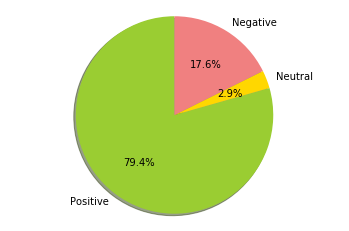

The f1Score is =  0.963407661520869 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  5  0]
 [ 0  1 26]] 

The accuracy is =  0.9696969696969697 

The recall is =  0.9876543209876543 

The Precision is =  0.9444444444444445 



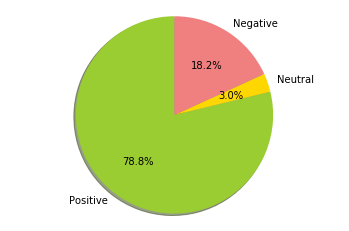

The f1Score is =  0.6798941798941799 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  2  0]
 [ 0  4 26]] 

The accuracy is =  0.8529411764705882 

The recall is =  0.7888888888888889 

The Precision is =  0.7619047619047619 



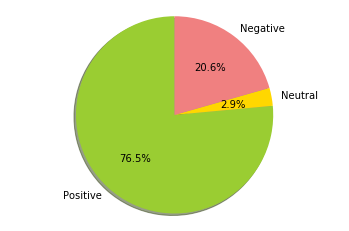

The f1Score is =  0.5274971941638609 

The Confusion Matix is = 
 [[21 18  0]
 [ 0  1  0]
 [ 0 34 93]] 

The accuracy is =  0.688622754491018 

The recall is =  0.7569150010094892 

The Precision is =  0.6729559748427674 



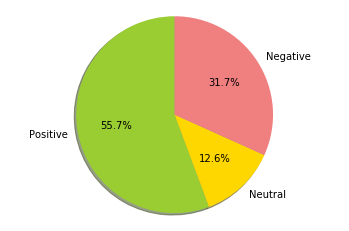

The f1Score is =  0.9670588235294119 

The Confusion Matix is = 
 [[12  1  0]
 [ 0  8  0]
 [ 0  0 17]] 

The accuracy is =  0.9736842105263158 

The recall is =  0.9743589743589745 

The Precision is =  0.9629629629629629 



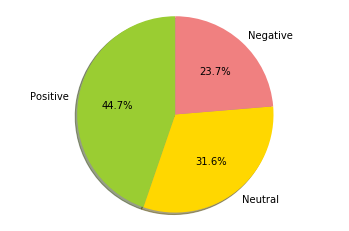

The f1Score is =  0.8488888888888889 

The Confusion Matix is = 
 [[11  3  0]
 [ 0  3  0]
 [ 0  0 22]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.9285714285714285 

The Precision is =  0.8333333333333334 



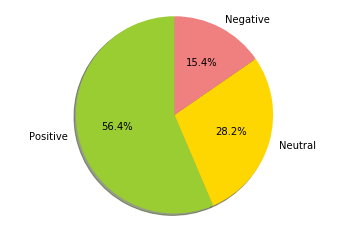

The f1Score is =  0.6502732240437158 

The Confusion Matix is = 
 [[ 8  0  0]
 [ 0  0  0]
 [ 0  3 29]] 

The accuracy is =  0.925 

The recall is =  0.6354166666666666 

The Precision is =  0.6666666666666666 



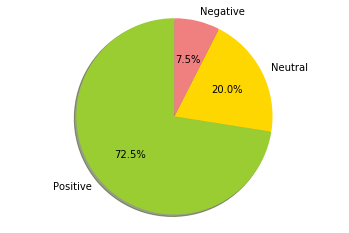

The f1Score is =  0.7611111111111112 

The Confusion Matix is = 
 [[ 7  4  0]
 [ 0  5  0]
 [ 0  4 38]] 

The accuracy is =  0.8620689655172413 

The recall is =  0.8470418470418469 

The Precision is =  0.7948717948717948 



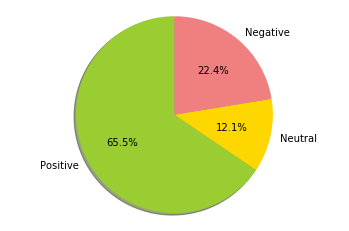

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



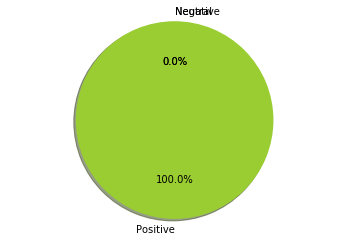

The f1Score is =  0.5380116959064328 

The Confusion Matix is = 
 [[1 1 0]
 [0 0 0]
 [0 1 9]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.4666666666666666 

The Precision is =  0.6666666666666666 



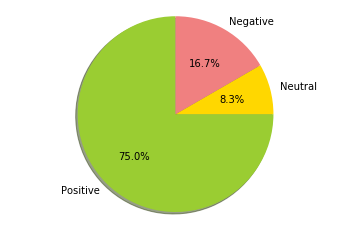

The f1Score is =  0.6 

The Confusion Matix is = 
 [[2 1 0]
 [0 0 0]
 [0 0 1]] 

The accuracy is =  0.75 

The recall is =  0.5555555555555555 

The Precision is =  0.6666666666666666 



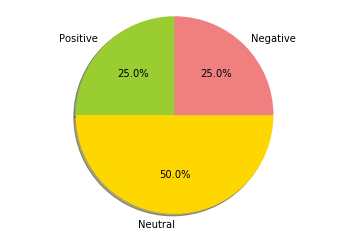

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



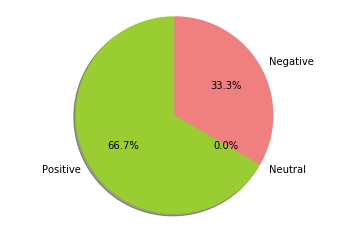

The f1Score is =  0.4 

The Confusion Matix is = 
 [[0 0]
 [1 2]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.3333333333333333 

The Precision is =  0.5 



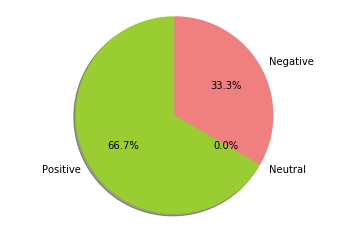

The f1Score is =  0.0 

The Confusion Matix is = 
 [[0 0]
 [1 0]] 

The accuracy is =  0.0 

The recall is =  0.0 

The Precision is =  0.0 



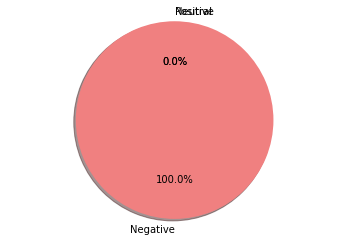

The f1Score is =  0.3333333333333333 

The Confusion Matix is = 
 [[0 1 0]
 [0 0 0]
 [0 0 1]] 

The accuracy is =  0.5 

The recall is =  0.3333333333333333 

The Precision is =  0.3333333333333333 



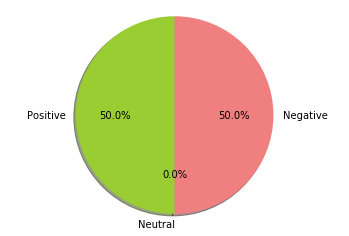

The f1Score is =  1.0 

The Confusion Matix is = 
 [[4 0]
 [0 2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



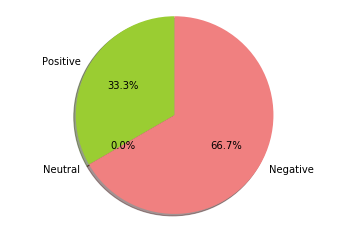

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0]
 [0 5]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



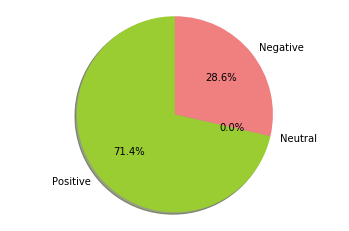

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0]
 [0 3]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



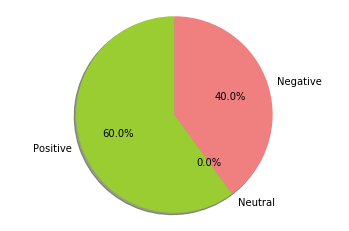

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0 0]
 [0 1 0]
 [0 0 1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



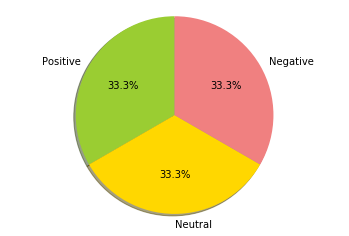

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



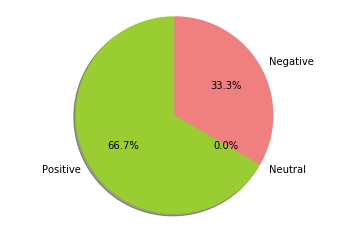

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0 0]
 [0 1 0]
 [0 0 3]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



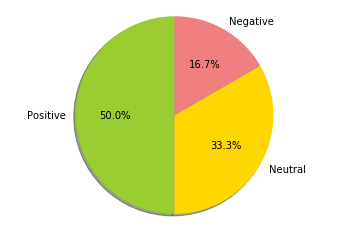

The f1Score is =  0.8046783625730995 

The Confusion Matix is = 
 [[3 3 0]
 [0 8 0]
 [0 1 9]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.7999999999999999 

The Precision is =  0.8888888888888888 



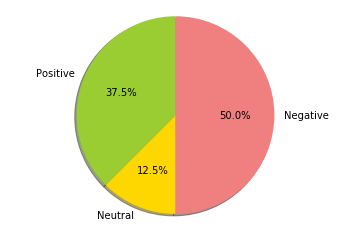

The f1Score is =  0.8302545155993433 

The Confusion Matix is = 
 [[15  5  0]
 [ 0 11  0]
 [ 0  2  7]] 

The accuracy is =  0.825 

The recall is =  0.8425925925925926 

The Precision is =  0.8703703703703703 



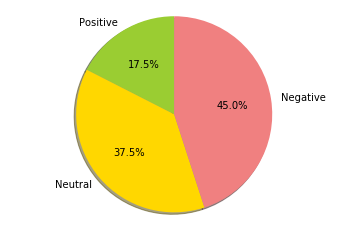

The f1Score is =  0.8855813953488373 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0 11  0]
 [ 0  1 21]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.8737373737373737 

The Precision is =  0.9285714285714285 



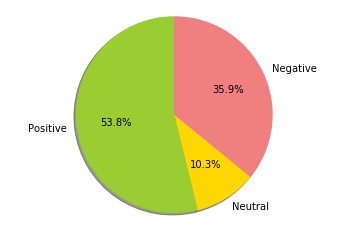

The f1Score is =  0.8632478632478632 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  6  0]
 [ 0  0 23]] 

The accuracy is =  0.967741935483871 

The recall is =  0.8333333333333334 

The Precision is =  0.9523809523809524 



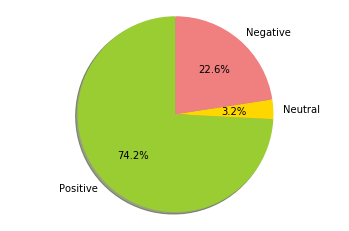

The f1Score is =  0.8682769726247987 

The Confusion Matix is = 
 [[ 7  1  0]
 [ 0  9  0]
 [ 0  4 16]] 

The accuracy is =  0.8648648648648649 

The recall is =  0.8916666666666666 

The Precision is =  0.8809523809523809 



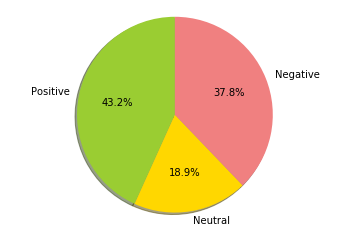

The f1Score is =  0.7356150793650794 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  4  0]
 [ 0  4 62]] 

The accuracy is =  0.918918918918919 

The recall is =  0.8131313131313131 

The Precision is =  0.7999999999999999 



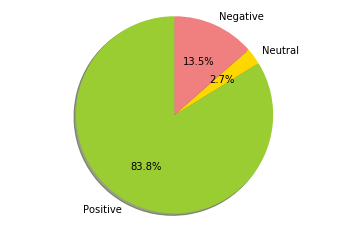

The f1Score is =  0.7619047619047619 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  4  0]
 [ 0  3 30]] 

The accuracy is =  0.8974358974358975 

The recall is =  0.8030303030303031 

The Precision is =  0.8333333333333334 



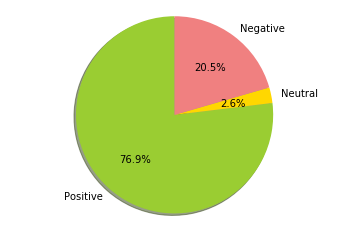

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 8  0  0]
 [ 0  6  0]
 [ 0  0 20]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



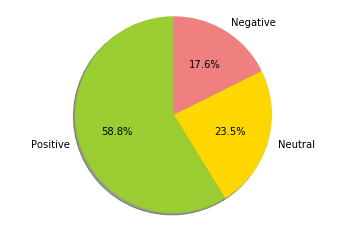

The f1Score is =  0.642570281124498 

The Confusion Matix is = 
 [[ 6  2  2]
 [ 0  2  0]
 [ 0 10 77]] 

The accuracy is =  0.8585858585858586 

The recall is =  0.828352490421456 

The Precision is =  0.7058468957203133 



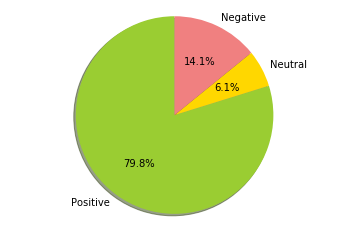

The f1Score is =  0.8613613613613614 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0  7  0]
 [ 0  2 36]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.8872180451127819 

The Precision is =  0.8787878787878788 



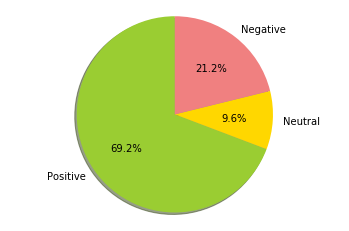

The f1Score is =  0.6363636363636364 

The Confusion Matix is = 
 [[2 0 0]
 [0 0 0]
 [0 1 5]] 

The accuracy is =  0.875 

The recall is =  0.6111111111111112 

The Precision is =  0.6666666666666666 



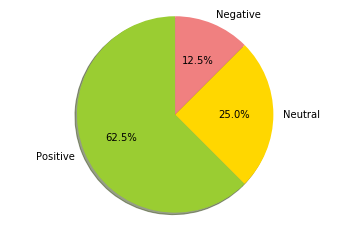

The f1Score is =  0.9301587301587301 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0  6  0]
 [ 0  2 14]] 

The accuracy is =  0.9259259259259259 

The recall is =  0.9583333333333334 

The Precision is =  0.9166666666666666 



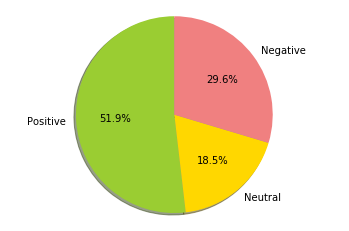

The f1Score is =  0.6389277389277389 

The Confusion Matix is = 
 [[ 7  6  0]
 [ 0  2  0]
 [ 0  3 15]] 

The accuracy is =  0.7272727272727273 

The recall is =  0.7905982905982906 

The Precision is =  0.7272727272727272 



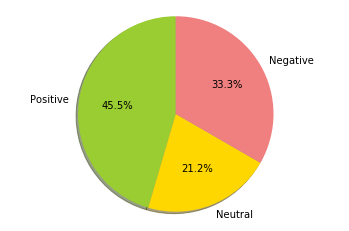

The f1Score is =  0.5079365079365079 

The Confusion Matix is = 
 [[ 1  4  0]
 [ 0  2  0]
 [ 0  4 12]] 

The accuracy is =  0.6521739130434783 

The recall is =  0.65 

The Precision is =  0.7333333333333334 



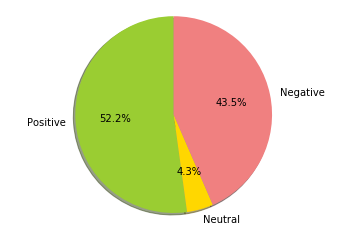

The f1Score is =  0.8460727969348659 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0 13  0]
 [ 0  2 39]] 

The accuracy is =  0.9464285714285714 

The recall is =  0.8170731707317073 

The Precision is =  0.9375 



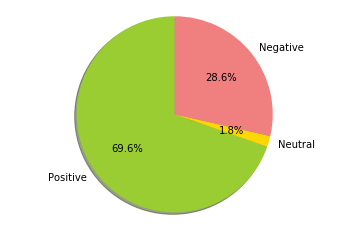

The f1Score is =  0.7343358395989975 

The Confusion Matix is = 
 [[ 2  3  0]
 [ 0  7  0]
 [ 0  4 55]] 

The accuracy is =  0.9014084507042254 

The recall is =  0.7774011299435027 

The Precision is =  0.8333333333333334 



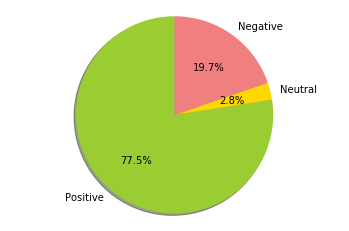

The f1Score is =  0.856521739130435 

The Confusion Matix is = 
 [[ 9  2  0]
 [ 0 10  0]
 [ 0  3 10]] 

The accuracy is =  0.8529411764705882 

The recall is =  0.8624708624708625 

The Precision is =  0.8888888888888888 



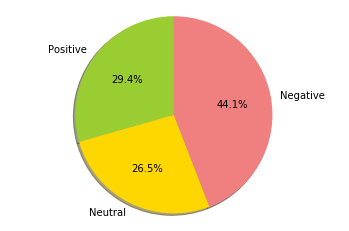

The f1Score is =  0.6821052631578949 

The Confusion Matix is = 
 [[4 2 0]
 [0 5 0]
 [0 7 9]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.7430555555555555 

The Precision is =  0.7857142857142857 



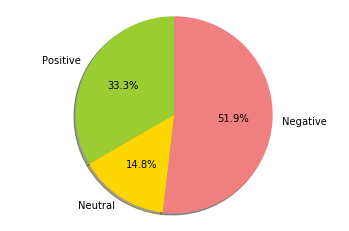

The f1Score is =  0.903030303030303 

The Confusion Matix is = 
 [[5 1 0]
 [0 2 0]
 [0 0 5]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.9444444444444445 

The Precision is =  0.8888888888888888 



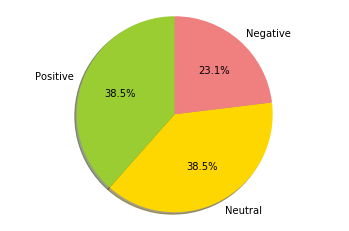

The f1Score is =  0.0 

The Confusion Matix is = 
 [[0 1]
 [0 0]] 

The accuracy is =  0.0 

The recall is =  0.0 

The Precision is =  0.0 



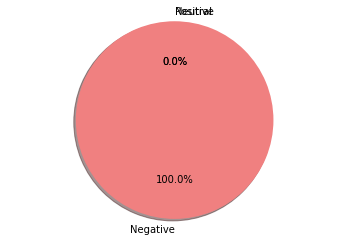

The f1Score is =  0.0 

The Confusion Matix is = 
 [[0 1 0]
 [0 0 0]
 [0 1 0]] 

The accuracy is =  0.0 

The recall is =  0.0 

The Precision is =  0.0 



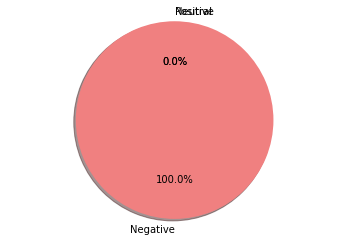

The f1Score is =  0.5471521942110177 

The Confusion Matix is = 
 [[12  4  0]
 [ 0  0  0]
 [ 0 11 20]] 

The accuracy is =  0.6808510638297872 

The recall is =  0.4650537634408602 

The Precision is =  0.6666666666666666 



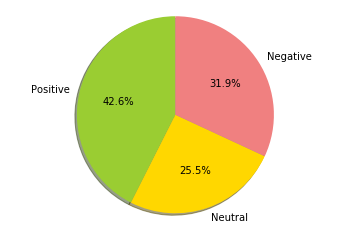

The f1Score is =  0.7362726416540729 

The Confusion Matix is = 
 [[ 8  2  0]
 [ 0  4  0]
 [ 0  9 40]] 

The accuracy is =  0.8253968253968254 

The recall is =  0.8721088435374149 

The Precision is =  0.7555555555555555 



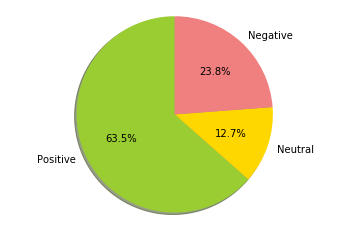

The f1Score is =  0.8572981366459628 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0  9  0]
 [ 0  3 16]] 

The accuracy is =  0.8648648648648649 

The recall is =  0.8732943469785575 

The Precision is =  0.8809523809523809 



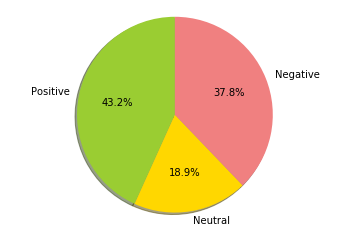

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0 10  0]
 [ 0  0 19]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



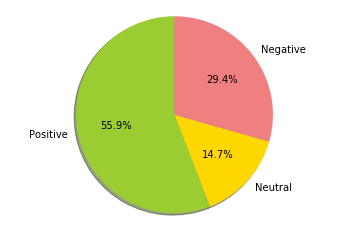

The f1Score is =  0.88693234476367 

The Confusion Matix is = 
 [[11  0  0]
 [ 0 15  0]
 [ 0  9 37]] 

The accuracy is =  0.875 

The recall is =  0.9347826086956522 

The Precision is =  0.875 



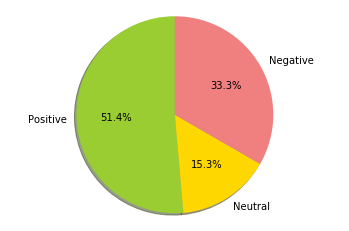

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  6  0]
 [ 0  0 28]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



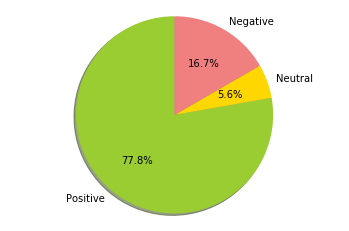

The f1Score is =  0.8026143790849675 

The Confusion Matix is = 
 [[ 6  3  0]
 [ 0  5  0]
 [ 0  2 16]] 

The accuracy is =  0.84375 

The recall is =  0.8518518518518517 

The Precision is =  0.8333333333333334 



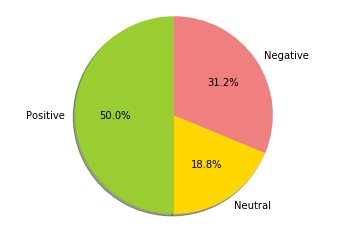

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0  9  0]
 [ 0  0 20]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



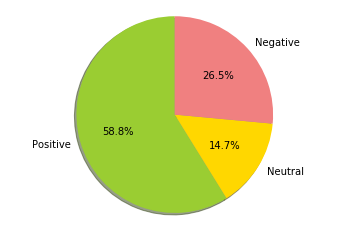

The f1Score is =  0.670563877725003 

The Confusion Matix is = 
 [[ 8  5  0]
 [ 0  4  0]
 [ 0 10 46]] 

The accuracy is =  0.7945205479452054 

The recall is =  0.8122710622710624 

The Precision is =  0.7368421052631579 



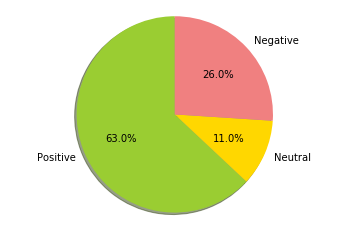

The f1Score is =  0.3333333333333333 

The Confusion Matix is = 
 [[0 2 0]
 [0 0 0]
 [0 0 2]] 

The accuracy is =  0.5 

The recall is =  0.3333333333333333 

The Precision is =  0.3333333333333333 



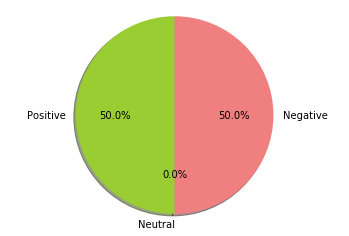

The f1Score is =  0.6312437562437562 

The Confusion Matix is = 
 [[ 5  6  0]
 [ 0  2  0]
 [ 0  3 37]] 

The accuracy is =  0.8301886792452831 

The recall is =  0.7931818181818183 

The Precision is =  0.7272727272727272 



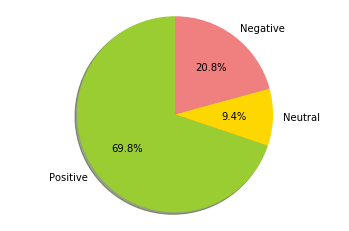

The f1Score is =  0.8498550724637681 

The Confusion Matix is = 
 [[10  3  0]
 [ 0 12  0]
 [ 0  3 11]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.8516483516483516 

The Precision is =  0.8888888888888888 



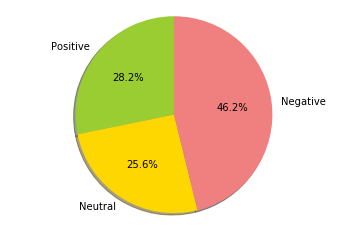

The f1Score is =  0.8656126482213439 

The Confusion Matix is = 
 [[ 4  3  0]
 [ 0 10  0]
 [ 0  0 21]] 

The accuracy is =  0.9210526315789473 

The recall is =  0.8571428571428571 

The Precision is =  0.923076923076923 



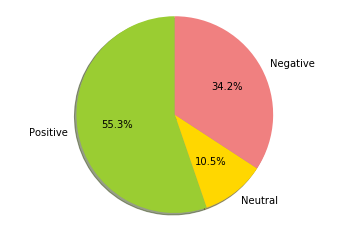

The f1Score is =  0.7738326662854965 

The Confusion Matix is = 
 [[19  6  0]
 [ 0  8  1]
 [ 0  7 49]] 

The accuracy is =  0.8444444444444444 

The recall is =  0.8412962962962963 

The Precision is =  0.786984126984127 



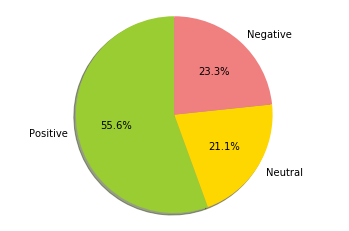

The f1Score is =  0.9587301587301587 

The Confusion Matix is = 
 [[ 7  0]
 [ 1 31]] 

The accuracy is =  0.9743589743589743 

The recall is =  0.984375 

The Precision is =  0.9375 



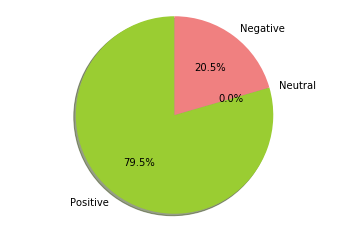

The f1Score is =  0.6344006870322659 

The Confusion Matix is = 
 [[ 9  4  0]
 [ 0  3  0]
 [ 0  9 15]] 

The accuracy is =  0.675 

The recall is =  0.7724358974358975 

The Precision is =  0.7291666666666666 



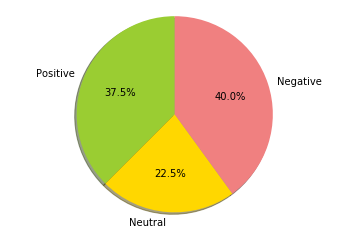

The f1Score is =  0.8232323232323232 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  1  0]
 [ 0  2 32]] 

The accuracy is =  0.9473684210526315 

The recall is =  0.9803921568627452 

The Precision is =  0.7777777777777777 



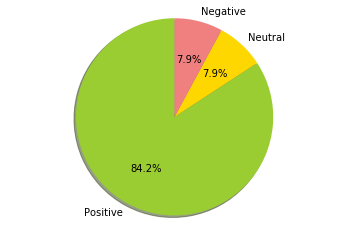

The f1Score is =  0.4736842105263158 

The Confusion Matix is = 
 [[ 0  0]
 [ 4 36]] 

The accuracy is =  0.9 

The recall is =  0.45 

The Precision is =  0.5 



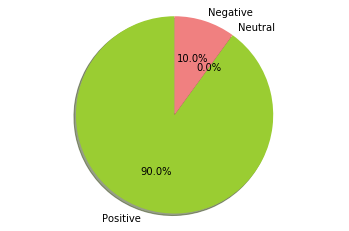

The f1Score is =  0.8171428571428572 

The Confusion Matix is = 
 [[ 2  3  0]
 [ 0 11  0]
 [ 0  0 20]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.7999999999999999 

The Precision is =  0.9285714285714285 



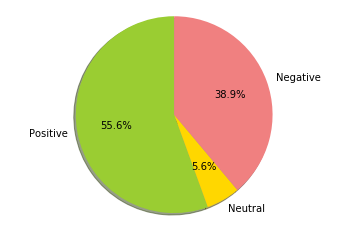

The f1Score is =  0.8076923076923076 

The Confusion Matix is = 
 [[12  0  0]
 [ 0  4  0]
 [ 0  8 48]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.9523809523809524 

The Precision is =  0.7777777777777777 



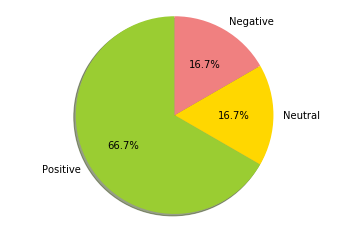

The f1Score is =  0.758747226489162 

The Confusion Matix is = 
 [[13  2  0]
 [ 0  2  0]
 [ 0  3 14]] 

The accuracy is =  0.8529411764705882 

The recall is =  0.8967320261437909 

The Precision is =  0.7619047619047619 



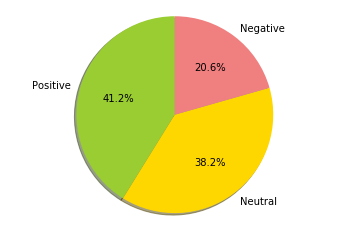

The f1Score is =  0.7545219638242894 

The Confusion Matix is = 
 [[ 8  2  0]
 [ 0  2  0]
 [ 0  3 20]] 

The accuracy is =  0.8571428571428571 

The recall is =  0.8898550724637682 

The Precision is =  0.7619047619047619 



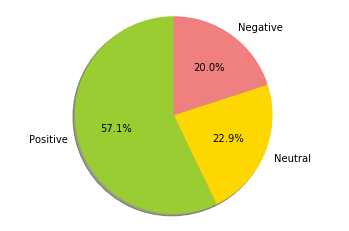

The f1Score is =  0.85 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  3  0]
 [ 0  0 27]] 

The accuracy is =  0.9444444444444444 

The recall is =  0.8888888888888888 

The Precision is =  0.8666666666666667 



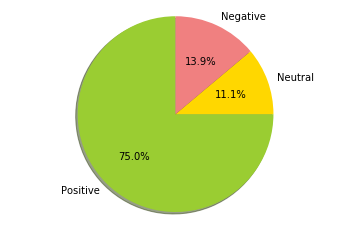

The f1Score is =  0.47222222222222215 

The Confusion Matix is = 
 [[3 2 0]
 [0 0 0]
 [0 5 5]] 

The accuracy is =  0.5333333333333333 

The recall is =  0.3666666666666667 

The Precision is =  0.6666666666666666 



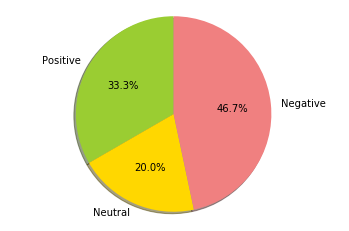

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



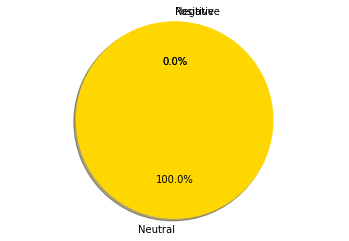

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



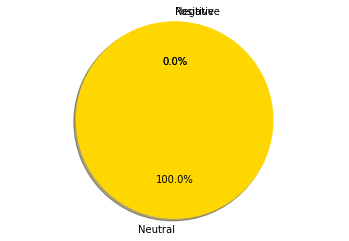

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



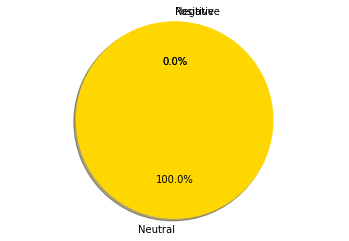

The f1Score is =  0.0 

The Confusion Matix is = 
 [[0 0]
 [1 0]] 

The accuracy is =  0.0 

The recall is =  0.0 

The Precision is =  0.0 



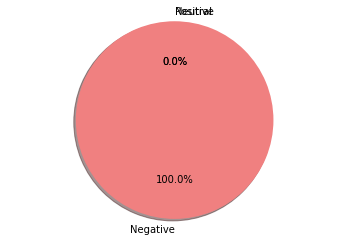

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



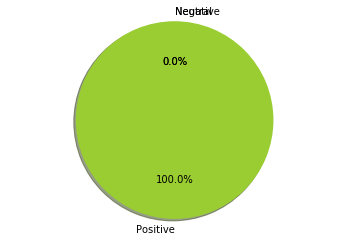

The f1Score is =  0.5555555555555555 

The Confusion Matix is = 
 [[1 0 0]
 [0 0 0]
 [0 1 1]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.5 

The Precision is =  0.6666666666666666 



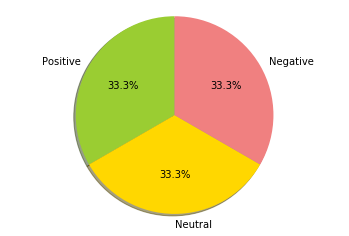

The f1Score is =  0.8916666666666667 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  7  0]
 [ 0  0 21]] 

The accuracy is =  0.9411764705882353 

The recall is =  0.8888888888888888 

The Precision is =  0.9259259259259259 



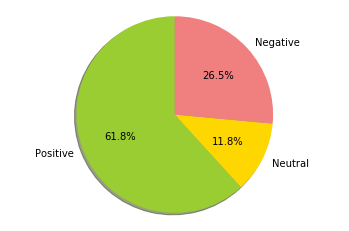

The f1Score is =  1.0 

The Confusion Matix is = 
 [[20  0  0]
 [ 0 22  0]
 [ 0  0 24]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



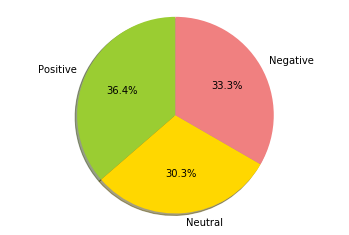

The f1Score is =  0.6363636363636364 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  5  0]
 [ 0  0 23]] 

The accuracy is =  0.9655172413793104 

The recall is =  0.6666666666666666 

The Precision is =  0.6111111111111112 



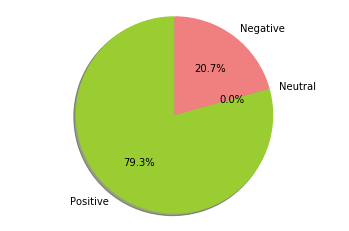

The f1Score is =  0.8916042141848594 

The Confusion Matix is = 
 [[15  1  0]
 [ 0  9  0]
 [ 0  3 12]] 

The accuracy is =  0.9 

The recall is =  0.9125 

The Precision is =  0.8974358974358975 



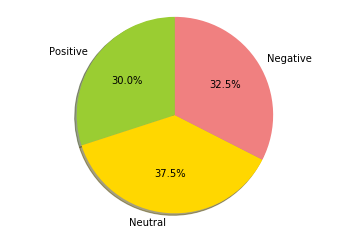

The f1Score is =  0.9393939393939394 

The Confusion Matix is = 
 [[10  2  0]
 [ 0 10  0]
 [ 0  0 17]] 

The accuracy is =  0.9487179487179487 

The recall is =  0.9444444444444445 

The Precision is =  0.9444444444444445 



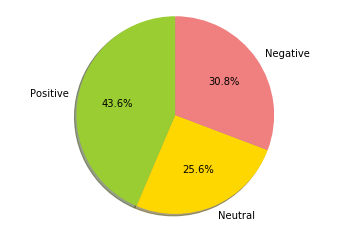

The f1Score is =  0.9367441860465116 

The Confusion Matix is = 
 [[ 8  0  0]
 [ 0 22  0]
 [ 0  6 40]] 

The accuracy is =  0.9210526315789473 

The recall is =  0.9565217391304347 

The Precision is =  0.9285714285714285 



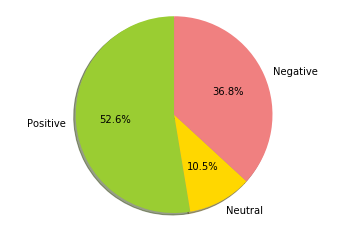

The f1Score is =  0.7829059829059828 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  4  0]
 [ 0  4 28]] 

The accuracy is =  0.8717948717948718 

The recall is =  0.8472222222222222 

The Precision is =  0.8148148148148149 



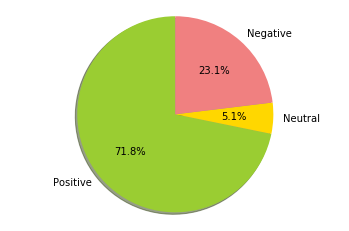

The f1Score is =  0.7032373032373033 

The Confusion Matix is = 
 [[15  7  0]
 [ 0  5  0]
 [ 0  9 48]] 

The accuracy is =  0.8095238095238095 

The recall is =  0.8413078149920254 

The Precision is =  0.746031746031746 



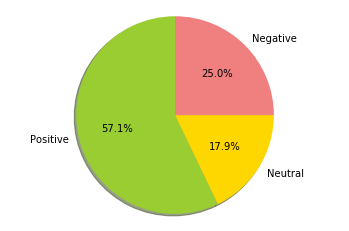

The f1Score is =  0.8214245014245014 

The Confusion Matix is = 
 [[12  1  0]
 [ 0  4  0]
 [ 0  4 16]] 

The accuracy is =  0.8648648648648649 

The recall is =  0.9076923076923077 

The Precision is =  0.8148148148148149 



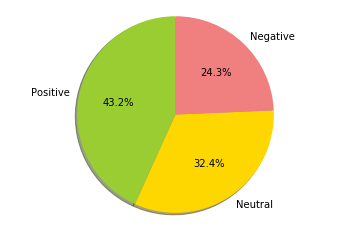

The f1Score is =  0.8290598290598291 

The Confusion Matix is = 
 [[14  0  0]
 [ 0  4  0]
 [ 0  5 17]] 

The accuracy is =  0.875 

The recall is =  0.9242424242424242 

The Precision is =  0.8148148148148149 



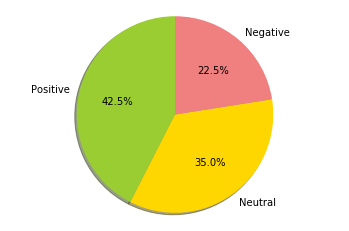

The f1Score is =  0.7019214703425231 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  3  0]
 [ 0  7 25]] 

The accuracy is =  0.7894736842105263 

The recall is =  0.8159722222222222 

The Precision is =  0.7575757575757575 



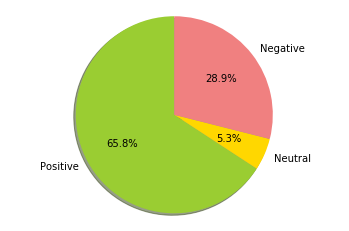

The f1Score is =  0.6554491982066153 

The Confusion Matix is = 
 [[ 20  14   0]
 [  0   6   0]
 [  0  18 182]] 

The accuracy is =  0.8666666666666667 

The recall is =  0.8327450980392158 

The Precision is =  0.7192982456140351 



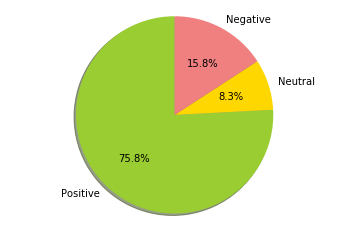

The f1Score is =  0.8375 

The Confusion Matix is = 
 [[11  0  0]
 [ 0 13  0]
 [ 0  6  7]] 

The accuracy is =  0.8378378378378378 

The recall is =  0.8461538461538461 

The Precision is =  0.8947368421052632 



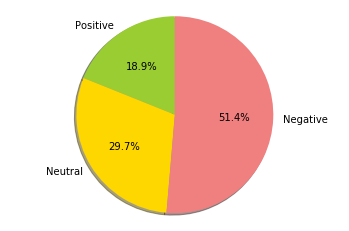

The f1Score is =  0.6620370370370371 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0  3  0]
 [ 0  8 14]] 

The accuracy is =  0.6875 

The recall is =  0.7835497835497836 

The Precision is =  0.7435897435897436 



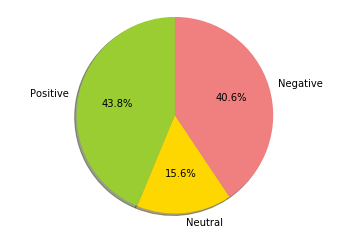

The f1Score is =  0.8996505939902167 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0 13  0]
 [ 0  3 25]] 

The accuracy is =  0.9130434782608695 

The recall is =  0.8976190476190476 

The Precision is =  0.9215686274509803 



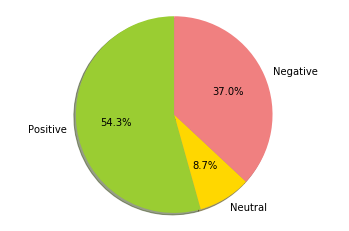

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  6  0]
 [ 0  0 23]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



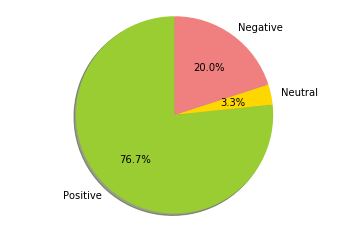

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0]
 [ 0 25]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



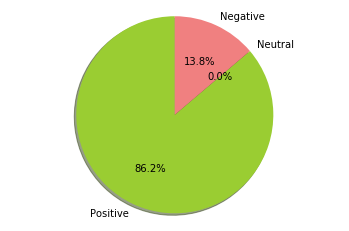

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 8  0  0]
 [ 0 23  0]
 [ 0  0  8]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



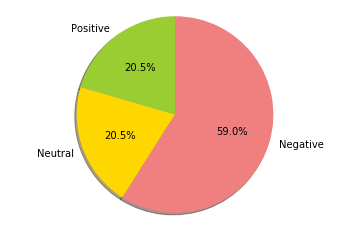

The f1Score is =  0.9164730933023616 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0 11  0]
 [ 0  1 20]] 

The accuracy is =  0.9444444444444444 

The recall is =  0.9007936507936508 

The Precision is =  0.9487179487179488 



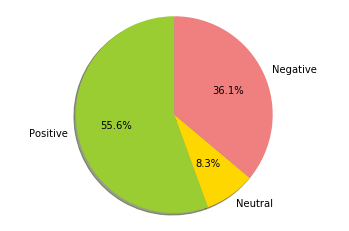

The f1Score is =  0.8539340776182881 

The Confusion Matix is = 
 [[ 8  3  0]
 [ 0  6  0]
 [ 0  1 16]] 

The accuracy is =  0.8823529411764706 

The recall is =  0.8894830659536542 

The Precision is =  0.8666666666666667 



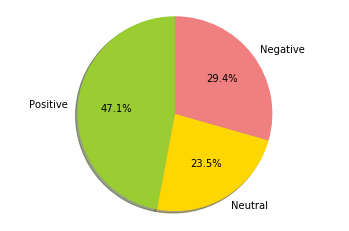

The f1Score is =  0.9299145299145298 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0 12  0]
 [ 0  1 22]] 

The accuracy is =  0.95 

The recall is =  0.918840579710145 

The Precision is =  0.9523809523809524 



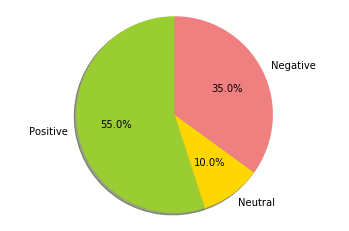

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0]
 [ 0 36]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



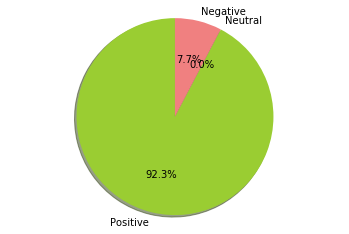

The f1Score is =  0.9241638579206638 

The Confusion Matix is = 
 [[ 9  1  0]
 [ 0 13  0]
 [ 0  2 13]] 

The accuracy is =  0.9210526315789473 

The recall is =  0.9222222222222222 

The Precision is =  0.9375 



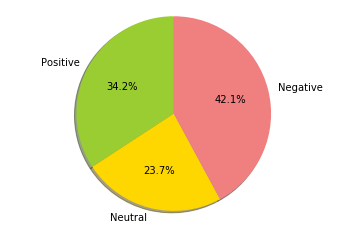

The f1Score is =  0.9234824884357594 

The Confusion Matix is = 
 [[19  2  0]
 [ 0 14  0]
 [ 0  3 52]] 

The accuracy is =  0.9444444444444444 

The recall is =  0.95007215007215 

The Precision is =  0.912280701754386 



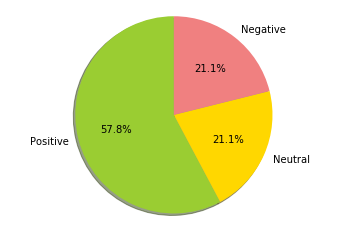

The f1Score is =  0.9444444444444445 

The Confusion Matix is = 
 [[ 8  0  0]
 [ 0  7  0]
 [ 0  2 23]] 

The accuracy is =  0.95 

The recall is =  0.9733333333333333 

The Precision is =  0.9259259259259259 



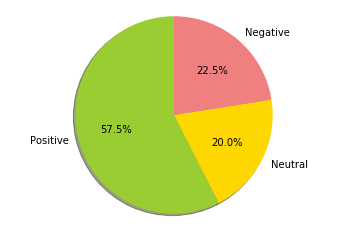

The f1Score is =  0.9119047619047618 

The Confusion Matix is = 
 [[ 6  0]
 [ 2 29]] 

The accuracy is =  0.9459459459459459 

The recall is =  0.967741935483871 

The Precision is =  0.875 



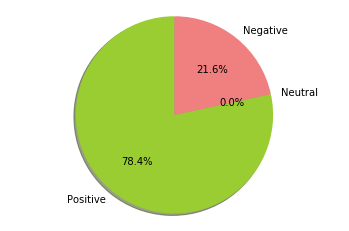

The f1Score is =  0.7560902255639098 

The Confusion Matix is = 
 [[ 2  3  0]
 [ 0  7  0]
 [ 0  2 24]] 

The accuracy is =  0.868421052631579 

The recall is =  0.7743589743589743 

The Precision is =  0.8611111111111112 



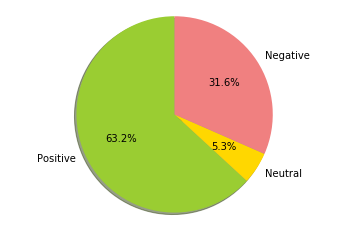

The f1Score is =  0.7574656981436642 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  3  0]
 [ 0  5 27]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.8645833333333334 

The Precision is =  0.7777777777777777 



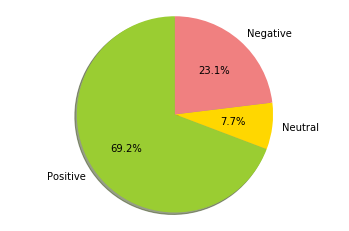

The f1Score is =  0.7241539822184984 

The Confusion Matix is = 
 [[12  7  0]
 [ 0  3  0]
 [ 0  1 16]] 

The accuracy is =  0.7948717948717948 

The recall is =  0.8575851393188855 

The Precision is =  0.7575757575757575 



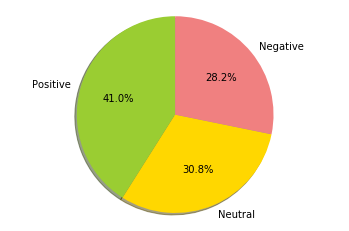

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  7  0]
 [ 0  0 27]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



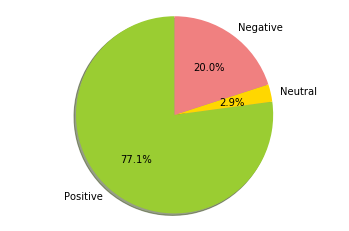

The f1Score is =  0.8222222222222223 

The Confusion Matix is = 
 [[ 6  3  0]
 [ 0  3  0]
 [ 0  0 26]] 

The accuracy is =  0.9210526315789473 

The recall is =  0.8888888888888888 

The Precision is =  0.8333333333333334 



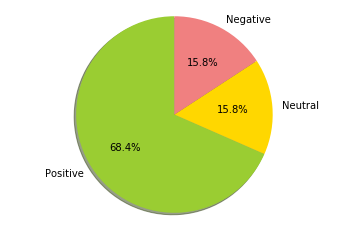

The f1Score is =  0.8192450824029772 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  3  1]
 [ 0  4 26]] 

The accuracy is =  0.8611111111111112 

The recall is =  0.8722222222222222 

The Precision is =  0.7971781305114639 



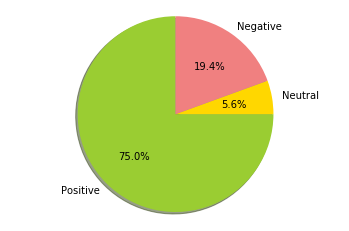

The f1Score is =  0.7846153846153847 

The Confusion Matix is = 
 [[6 0]
 [3 5]] 

The accuracy is =  0.7857142857142857 

The recall is =  0.8125 

The Precision is =  0.8333333333333333 



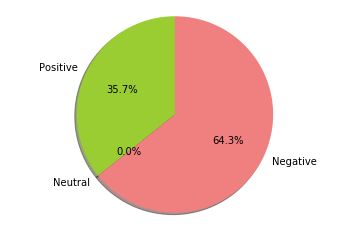

The f1Score is =  0.4444444444444444 

The Confusion Matix is = 
 [[0 1 0]
 [0 3 0]
 [0 2 2]] 

The accuracy is =  0.625 

The recall is =  0.5 

The Precision is =  0.5 



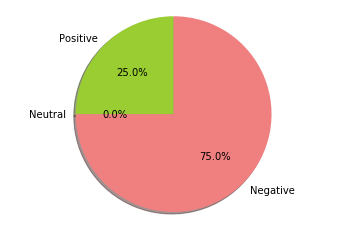

The f1Score is =  0.6444444444444445 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  7  0]
 [ 0  0 30]] 

The accuracy is =  0.9736842105263158 

The recall is =  0.6666666666666666 

The Precision is =  0.625 



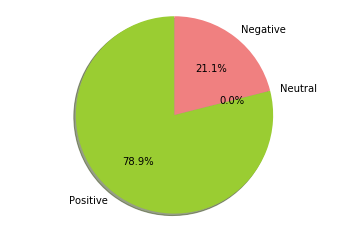

The f1Score is =  0.8504594820384295 

The Confusion Matix is = 
 [[ 8  5  0]
 [ 0 16  0]
 [ 0  1  9]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.8384615384615385 

The Precision is =  0.9090909090909092 



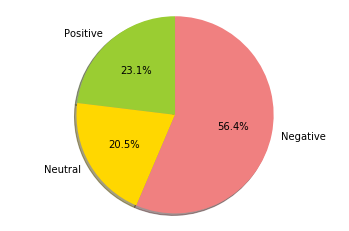

The f1Score is =  0.7884593057006849 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  3  0]
 [ 0  4 27]] 

The accuracy is =  0.8717948717948718 

The recall is =  0.8903225806451612 

The Precision is =  0.7916666666666666 



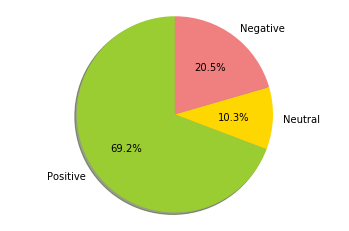

The f1Score is =  0.7542942654053766 

The Confusion Matix is = 
 [[40  8  0]
 [ 0 18  0]
 [ 0 26 68]] 

The accuracy is =  0.7875 

The recall is =  0.8522458628841608 

The Precision is =  0.782051282051282 



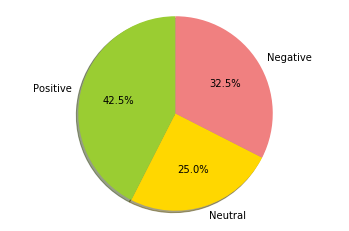

The f1Score is =  0.9082934609250398 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  5  0]
 [ 0  1 28]] 

The accuracy is =  0.95 

The recall is =  0.9329501915708813 

The Precision is =  0.9047619047619048 



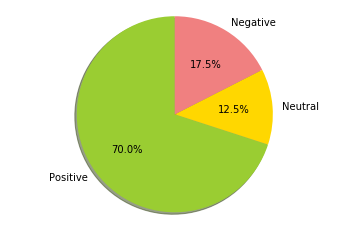

The f1Score is =  0.6934607020813918 

The Confusion Matix is = 
 [[28  2  0]
 [ 0  2  0]
 [ 0 10 32]] 

The accuracy is =  0.8378378378378378 

The recall is =  0.8984126984126984 

The Precision is =  0.7142857142857143 



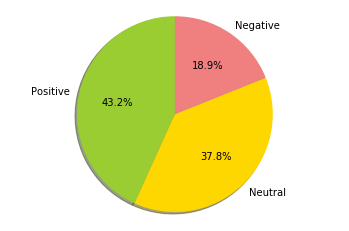

The f1Score is =  0.4188034188034188 

The Confusion Matix is = 
 [[ 2  8  0]
 [ 0  0  0]
 [ 0 10 60]] 

The accuracy is =  0.775 

The recall is =  0.3523809523809524 

The Precision is =  0.6666666666666666 



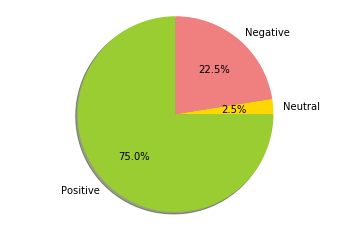

The f1Score is =  0.7178266178266178 

The Confusion Matix is = 
 [[ 2  3  0]
 [ 0  4  0]
 [ 0  2 29]] 

The accuracy is =  0.875 

The recall is =  0.7784946236559139 

The Precision is =  0.8148148148148149 



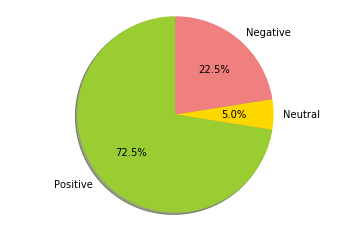

The f1Score is =  0.8668831168831169 

The Confusion Matix is = 
 [[10  2  0]
 [ 0  8  0]
 [ 0  4 54]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.921455938697318 

The Precision is =  0.8571428571428571 



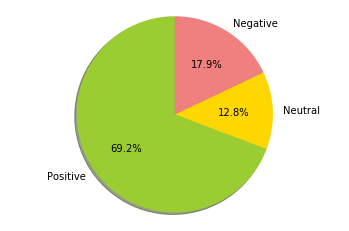

The f1Score is =  0.9464285714285715 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  7  0]
 [ 0  2 27]] 

The accuracy is =  0.9487179487179487 

The recall is =  0.9770114942528735 

The Precision is =  0.9259259259259259 



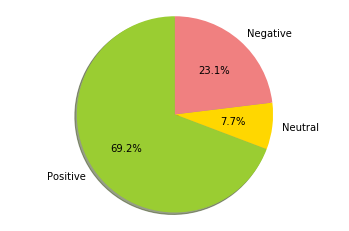

The f1Score is =  0.7927350427350427 

The Confusion Matix is = 
 [[11  2  0]
 [ 0  9  0]
 [ 0  6 10]] 

The accuracy is =  0.7894736842105263 

The recall is =  0.8237179487179488 

The Precision is =  0.8431372549019608 



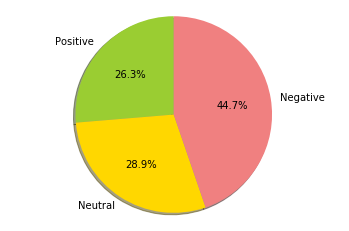

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0]
 [ 0 24]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



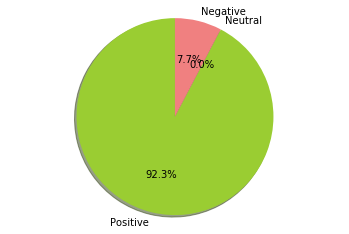

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0 0]
 [0 4 0]
 [0 0 9]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



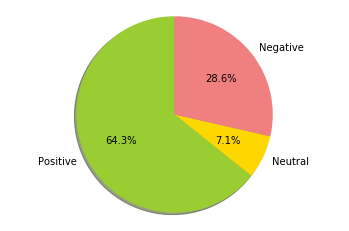

The f1Score is =  0.4902902902902903 

The Confusion Matix is = 
 [[12 13  0]
 [ 0  0  0]
 [ 0 16 37]] 

The accuracy is =  0.6282051282051282 

The recall is =  0.3927044025157233 

The Precision is =  0.6666666666666666 



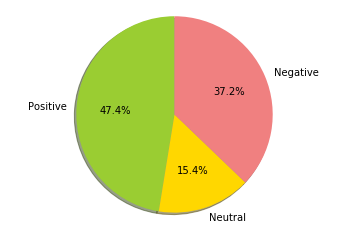

The f1Score is =  0.5380116959064328 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  0  0]
 [ 0  3 27]] 

The accuracy is =  0.875 

The recall is =  0.4666666666666666 

The Precision is =  0.6666666666666666 



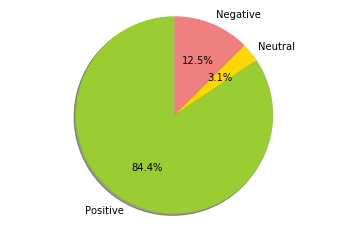

The f1Score is =  0.6327526132404181 

The Confusion Matix is = 
 [[ 2  3  0]
 [ 0  2  0]
 [ 0  3 19]] 

The accuracy is =  0.7931034482758621 

The recall is =  0.7545454545454545 

The Precision is =  0.75 



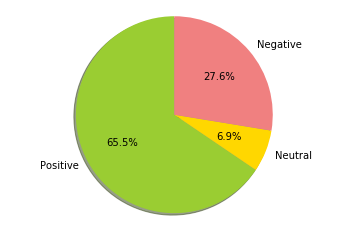

The f1Score is =  0.8325428194993413 

The Confusion Matix is = 
 [[45 10  0]
 [ 0 15  0]
 [ 0  6 52]] 

The accuracy is =  0.875 

The recall is =  0.9049111807732498 

The Precision is =  0.8279569892473119 



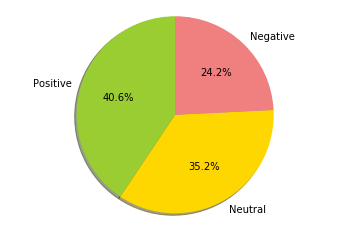

The f1Score is =  0.84 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  3  0]
 [ 0  4 23]] 

The accuracy is =  0.8709677419354839 

The recall is =  0.9506172839506174 

The Precision is =  0.8095238095238096 



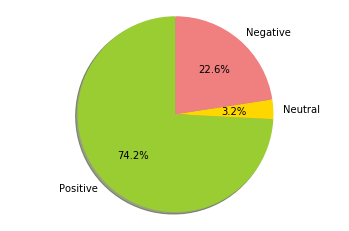

The f1Score is =  0.710727969348659 

The Confusion Matix is = 
 [[ 3  3  0]
 [ 0  2  0]
 [ 0  1 14]] 

The accuracy is =  0.8260869565217391 

The recall is =  0.8111111111111112 

The Precision is =  0.7777777777777777 



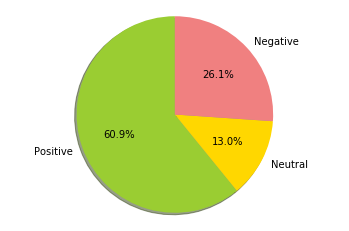

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



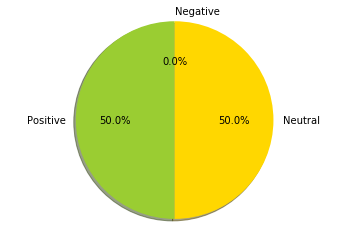

The f1Score is =  0.7619047619047619 

The Confusion Matix is = 
 [[3 1 0]
 [0 2 0]
 [0 2 6]] 

The accuracy is =  0.7857142857142857 

The recall is =  0.8333333333333334 

The Precision is =  0.7999999999999999 



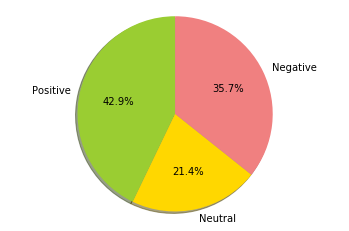

The f1Score is =  0.7314398996641988 

The Confusion Matix is = 
 [[10  8  0]
 [ 0  9  0]
 [ 0  7 50]] 

The accuracy is =  0.8214285714285714 

The recall is =  0.8109161793372319 

The Precision is =  0.7916666666666666 



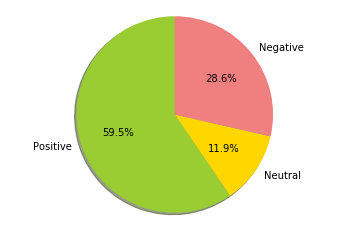

The f1Score is =  0.9102255639097745 

The Confusion Matix is = 
 [[12  1  0]
 [ 0  8  0]
 [ 0  2 13]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.9299145299145298 

The Precision is =  0.9090909090909092 



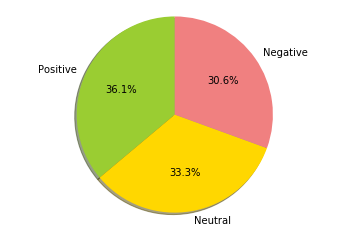

The f1Score is =  0.7949776401788786 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0 14  0]
 [ 0  4 17]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.7698412698412698 

The Precision is =  0.9 



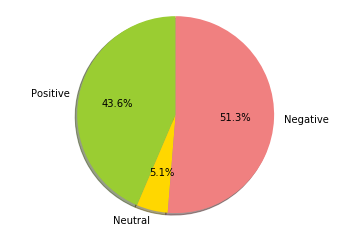

The f1Score is =  0.7833333333333332 

The Confusion Matix is = 
 [[ 3  4  0]
 [ 0  6  0]
 [ 0  0 24]] 

The accuracy is =  0.8918918918918919 

The recall is =  0.8095238095238096 

The Precision is =  0.8666666666666667 



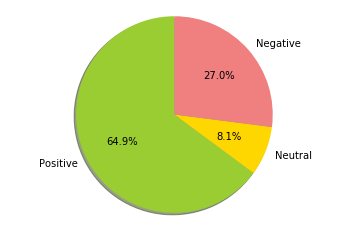

The f1Score is =  0.7662835249042145 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  4  0]
 [ 0  2 28]] 

The accuracy is =  0.8947368421052632 

The recall is =  0.8111111111111112 

The Precision is =  0.8333333333333334 



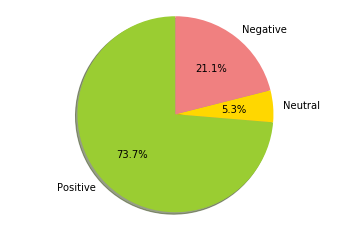

The f1Score is =  0.6959876543209876 

The Confusion Matix is = 
 [[ 2  4  0]
 [ 0  5  0]
 [ 0  2 26]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.753968253968254 

The Precision is =  0.8181818181818182 



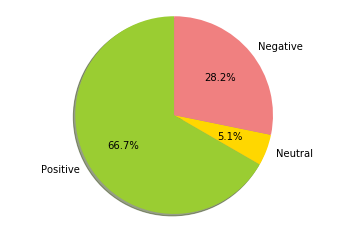

The f1Score is =  0.6999355254674403 

The Confusion Matix is = 
 [[ 8  4  0]
 [ 0  2  0]
 [ 0  3 22]] 

The accuracy is =  0.8205128205128205 

The recall is =  0.8488888888888888 

The Precision is =  0.7407407407407408 



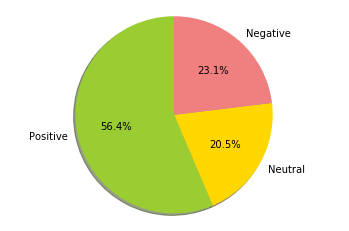

The f1Score is =  0.8090909090909091 

The Confusion Matix is = 
 [[12  8  0]
 [ 0 16  2]
 [ 0  2 38]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.812962962962963 

The Precision is =  0.8551282051282051 



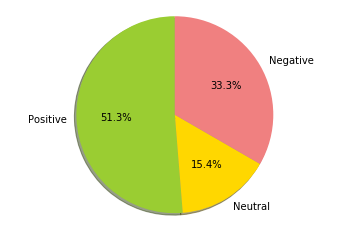

The f1Score is =  0.5753623188405798 

The Confusion Matix is = 
 [[ 9  2  0]
 [ 0  0  0]
 [ 0  8 19]] 

The accuracy is =  0.7368421052631579 

The recall is =  0.5072951739618407 

The Precision is =  0.6666666666666666 



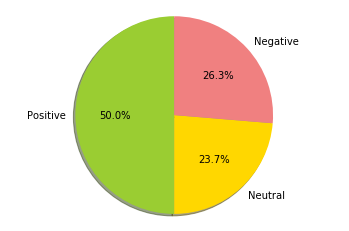

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0 16  0]
 [ 0  0 16]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



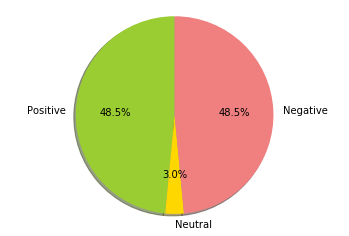

The f1Score is =  0.8425925925925926 

The Confusion Matix is = 
 [[14  8  0]
 [ 0 12  0]
 [ 0  0 44]] 

The accuracy is =  0.8974358974358975 

The recall is =  0.8787878787878788 

The Precision is =  0.8666666666666667 



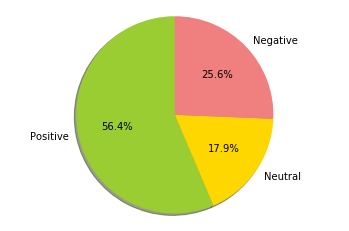

The f1Score is =  0.8008658008658008 

The Confusion Matix is = 
 [[30 10  0]
 [ 0 12  0]
 [ 0  6 52]] 

The accuracy is =  0.8545454545454545 

The recall is =  0.882183908045977 

The Precision is =  0.8095238095238096 



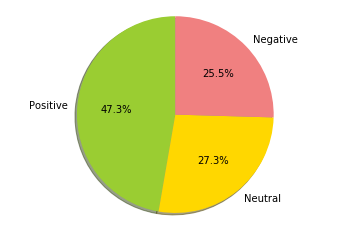

The f1Score is =  0.9365079365079364 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0  6  0]
 [ 0  2 20]] 

The accuracy is =  0.9393939393939394 

The recall is =  0.9696969696969697 

The Precision is =  0.9166666666666666 



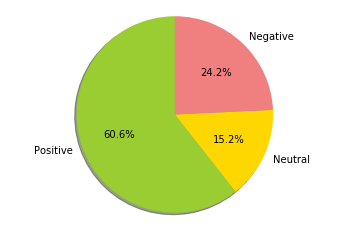

The f1Score is =  1.0 

The Confusion Matix is = 
 [[6 0]
 [0 5]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



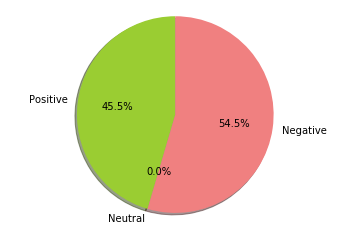

The f1Score is =  1.0 

The Confusion Matix is = 
 [[5 0]
 [0 7]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



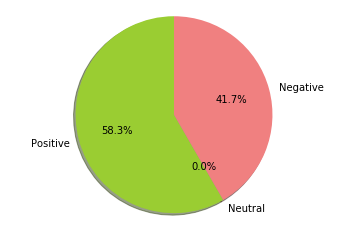

The f1Score is =  0.46507936507936504 

The Confusion Matix is = 
 [[ 0  6  0]
 [ 0  3  0]
 [ 0  2 29]] 

The accuracy is =  0.8 

The recall is =  0.6451612903225806 

The Precision is =  0.42424242424242425 



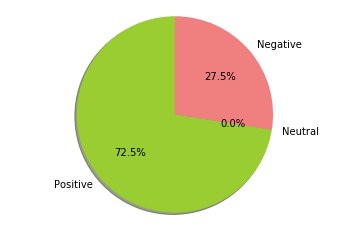

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  4  0]
 [ 0  0 10]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



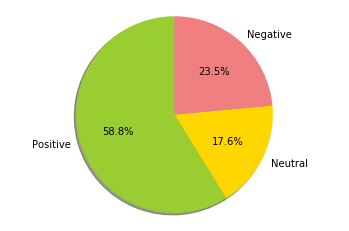

The f1Score is =  0.6840006172562957 

The Confusion Matix is = 
 [[41 19  0]
 [ 0 19  0]
 [ 0 21 32]] 

The accuracy is =  0.696969696969697 

The recall is =  0.7623689727463313 

The Precision is =  0.7740112994350282 



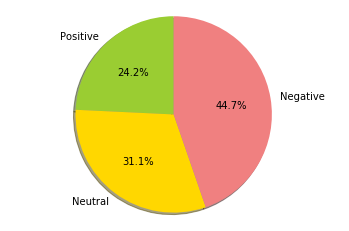

The f1Score is =  0.9290524290524291 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0 13  0]
 [ 0  1 16]] 

The accuracy is =  0.9428571428571428 

The recall is =  0.9137254901960784 

The Precision is =  0.9555555555555556 



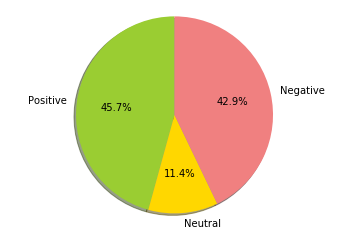

The f1Score is =  0.6056853363354912 

The Confusion Matix is = 
 [[8 6 0]
 [0 3 0]
 [0 5 7]] 

The accuracy is =  0.6206896551724138 

The recall is =  0.7182539682539683 

The Precision is =  0.7380952380952381 



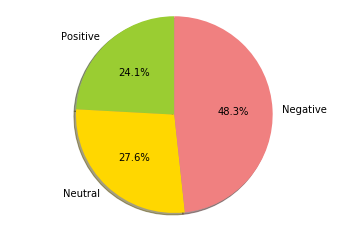

The f1Score is =  0.774122807017544 

The Confusion Matix is = 
 [[ 6  4  0]
 [ 0  5  0]
 [ 0  2 18]] 

The accuracy is =  0.8285714285714286 

The recall is =  0.8333333333333334 

The Precision is =  0.8181818181818182 



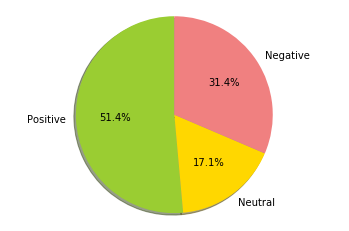

The f1Score is =  0.8850408850408851 

The Confusion Matix is = 
 [[10  2  0]
 [ 0 12  0]
 [ 0  2  8]] 

The accuracy is =  0.8823529411764706 

The recall is =  0.8777777777777779 

The Precision is =  0.9166666666666666 



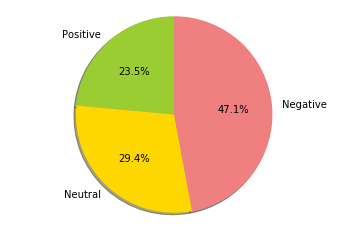

The f1Score is =  0.8911680911680913 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  4  0]
 [ 0  1 32]] 

The accuracy is =  0.9523809523809523 

The recall is =  0.9232323232323232 

The Precision is =  0.8888888888888888 



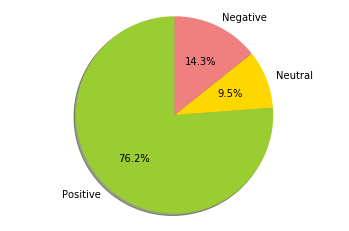

The f1Score is =  0.9031385281385281 

The Confusion Matix is = 
 [[ 6  2  0]
 [ 0 14  0]
 [ 0  2 43]] 

The accuracy is =  0.9402985074626866 

The recall is =  0.9018518518518519 

The Precision is =  0.9259259259259259 



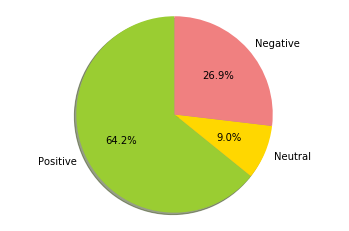

The f1Score is =  0.47257683215130025 

The Confusion Matix is = 
 [[ 1  3  0]
 [ 0  1  0]
 [ 0  7 20]] 

The accuracy is =  0.6875 

The recall is =  0.6635802469135802 

The Precision is =  0.6969696969696969 



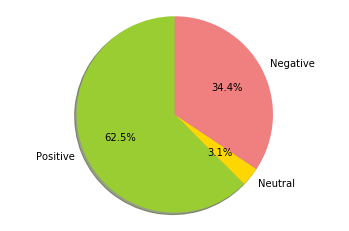

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  4  0]
 [ 0  0 33]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



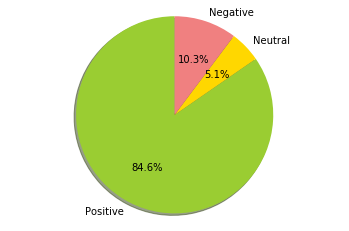

The f1Score is =  0.8464285714285715 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0  5  0]
 [ 0  2 19]] 

The accuracy is =  0.8857142857142857 

The recall is =  0.8941798941798941 

The Precision is =  0.8518518518518517 



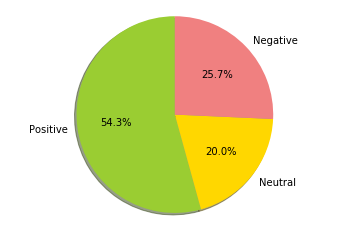

The f1Score is =  0.9717171717171716 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  7  0]
 [ 0  1 27]] 

The accuracy is =  0.972972972972973 

The recall is =  0.9880952380952381 

The Precision is =  0.9583333333333334 



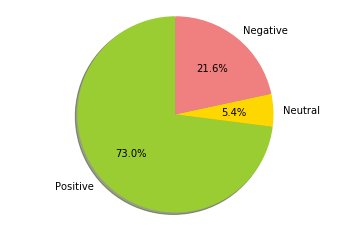

The f1Score is =  0.8847006651884701 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0  4  0]
 [ 0  3 19]] 

The accuracy is =  0.90625 

The recall is =  0.9545454545454546 

The Precision is =  0.8571428571428571 



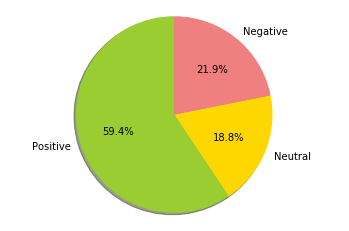

The f1Score is =  0.9363301164475045 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0 13  0]
 [ 0  2 93]] 

The accuracy is =  0.9739130434782609 

The recall is =  0.9453634085213033 

The Precision is =  0.9375 



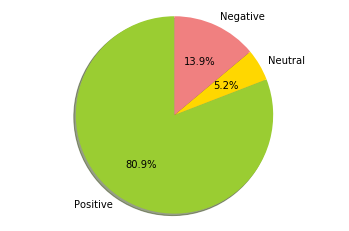

The f1Score is =  0.8974358974358974 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  5  0]
 [ 0  3 18]] 

The accuracy is =  0.9 

The recall is =  0.9523809523809524 

The Precision is =  0.875 



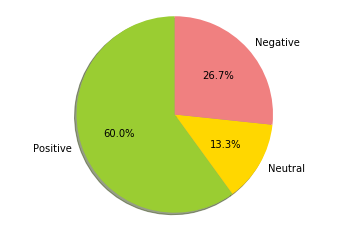

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0 0]
 [0 2 0]
 [0 0 8]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



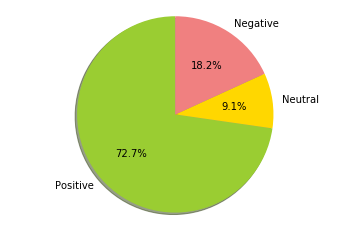

The f1Score is =  0.5866666666666668 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  0  0]
 [ 0  1 12]] 

The accuracy is =  0.875 

The recall is =  0.5299145299145299 

The Precision is =  0.6666666666666666 



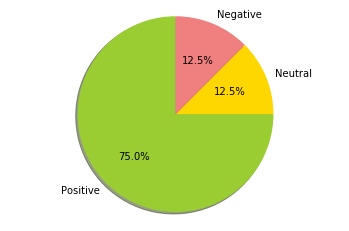

The f1Score is =  0.788235294117647 

The Confusion Matix is = 
 [[15  0  0]
 [ 0  4  0]
 [ 0  9 38]] 

The accuracy is =  0.8636363636363636 

The recall is =  0.9361702127659575 

The Precision is =  0.7692307692307692 



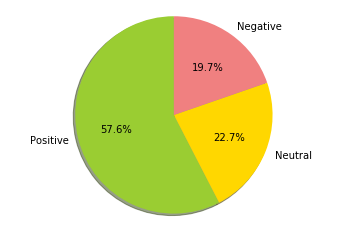

The f1Score is =  0.7197327044025158 

The Confusion Matix is = 
 [[11 10  0]
 [ 0 17  0]
 [ 0  9 22]] 

The accuracy is =  0.7246376811594203 

The recall is =  0.7444956477214543 

The Precision is =  0.8240740740740741 



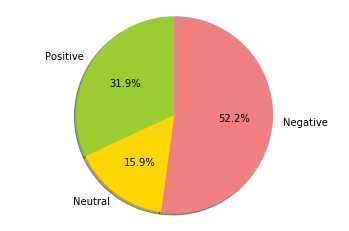

The f1Score is =  0.7658730158730158 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  3  0]
 [ 0  2 27]] 

The accuracy is =  0.9117647058823529 

The recall is =  0.8103448275862069 

The Precision is =  0.8333333333333334 



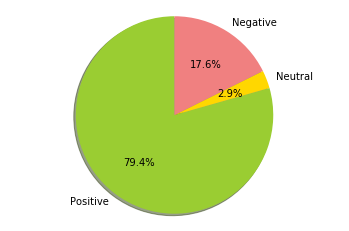

The f1Score is =  0.9111111111111111 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  7  0]
 [ 0  0 24]] 

The accuracy is =  0.9705882352941176 

The recall is =  0.8888888888888888 

The Precision is =  0.9583333333333334 



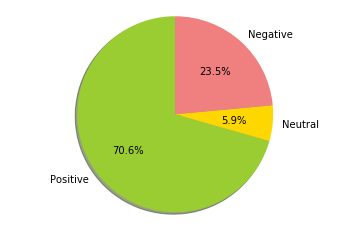

The f1Score is =  0.808080808080808 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  6  0]
 [ 0  5 14]] 

The accuracy is =  0.8064516129032258 

The recall is =  0.8567251461988304 

The Precision is =  0.8333333333333334 



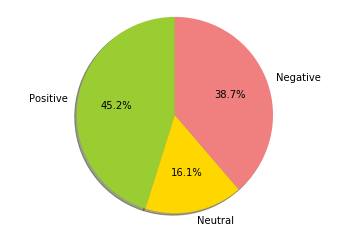

The f1Score is =  0.7892849794238684 

The Confusion Matix is = 
 [[38  5  0]
 [ 0 21  0]
 [ 0 17 29]] 

The accuracy is =  0.8 

The recall is =  0.8380519042804179 

The Precision is =  0.8294573643410853 



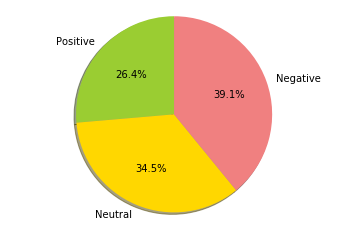

The f1Score is =  0.4473684210526316 

The Confusion Matix is = 
 [[2 4 0]
 [0 0 0]
 [0 3 8]] 

The accuracy is =  0.5882352941176471 

The recall is =  0.35353535353535354 

The Precision is =  0.6666666666666666 



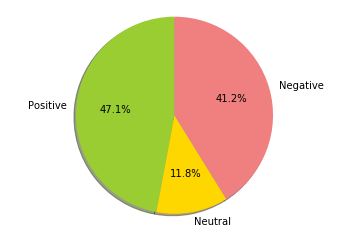

The f1Score is =  0.6615159319295056 

The Confusion Matix is = 
 [[10  3  0]
 [ 0  2  0]
 [ 0  7 17]] 

The accuracy is =  0.7435897435897436 

The recall is =  0.8258547008547009 

The Precision is =  0.7222222222222223 



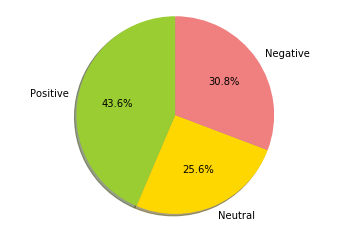

The f1Score is =  0.8854381025934875 

The Confusion Matix is = 
 [[23  9  0]
 [ 0 35  0]
 [ 0  3 43]] 

The accuracy is =  0.8938053097345132 

The recall is =  0.8845108695652174 

The Precision is =  0.9148936170212766 



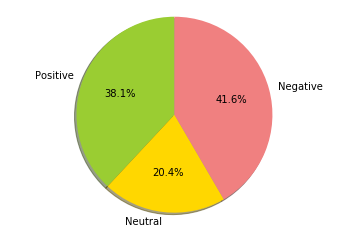

The f1Score is =  0.8777777777777778 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0  4  0]
 [ 0  0 28]] 

The accuracy is =  0.9487179487179487 

The recall is =  0.9047619047619048 

The Precision is =  0.8888888888888888 



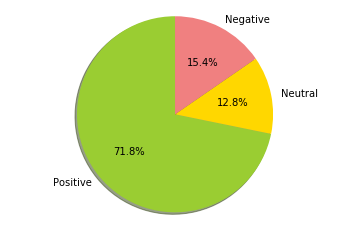

The f1Score is =  0.9733187134502924 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0 15  0]
 [ 0  2 56]] 

The accuracy is =  0.972972972972973 

The recall is =  0.9885057471264368 

The Precision is =  0.9607843137254902 



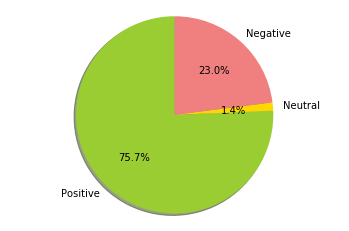

The f1Score is =  0.9416922933556985 

The Confusion Matix is = 
 [[ 9  2  0]
 [ 0 23  0]
 [ 0  1 36]] 

The accuracy is =  0.9577464788732394 

The recall is =  0.9303849303849304 

The Precision is =  0.9615384615384616 



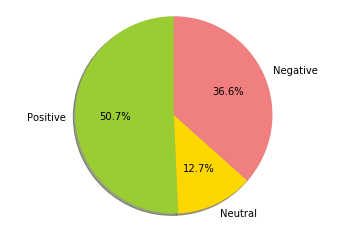

The f1Score is =  0.7947214076246333 

The Confusion Matix is = 
 [[ 3  5  0]
 [ 0 13  0]
 [ 0  0 54]] 

The accuracy is =  0.9333333333333333 

The recall is =  0.7916666666666666 

The Precision is =  0.9074074074074074 



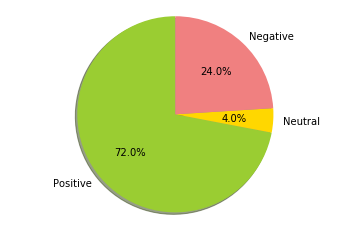

The f1Score is =  0.7595744680851064 

The Confusion Matix is = 
 [[ 9  2  0]
 [ 0  1  0]
 [ 0  1 23]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.9255050505050506 

The Precision is =  0.75 



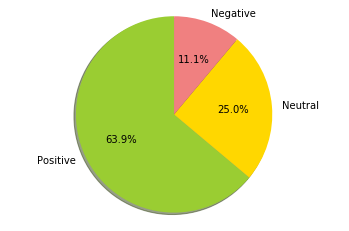

The f1Score is =  0.38047138047138046 

The Confusion Matix is = 
 [[2 7 0]
 [0 0 0]
 [0 4 7]] 

The accuracy is =  0.45 

The recall is =  0.28619528619528617 

The Precision is =  0.6666666666666666 



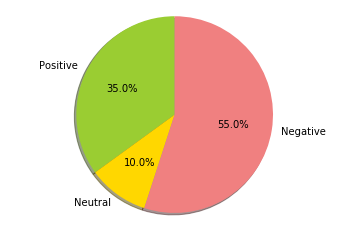

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0 0]
 [0 3 0]
 [0 0 6]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



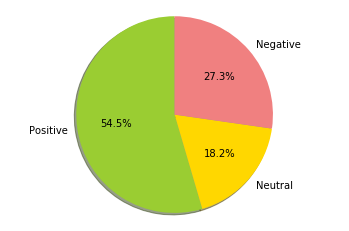

The f1Score is =  1.0 

The Confusion Matix is = 
 [[3 0 0]
 [0 2 0]
 [0 0 7]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



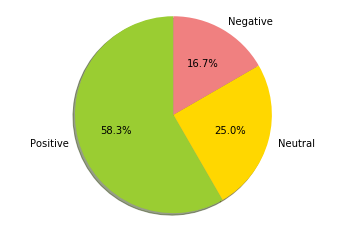

The f1Score is =  0.8662835249042146 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  5  1]
 [ 0  0 14]] 

The accuracy is =  0.9130434782608695 

The recall is =  0.8333333333333334 

The Precision is =  0.9222222222222222 



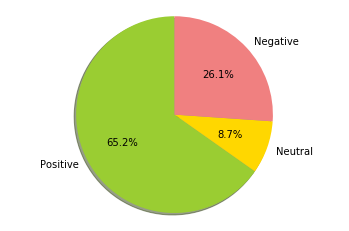

The f1Score is =  0.903030303030303 

The Confusion Matix is = 
 [[2 1 0]
 [0 5 0]
 [0 0 3]] 

The accuracy is =  0.9090909090909091 

The recall is =  0.8888888888888888 

The Precision is =  0.9444444444444445 



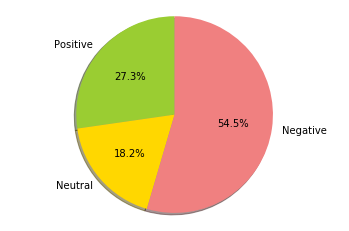

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0 11  0]
 [ 0  0 10]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



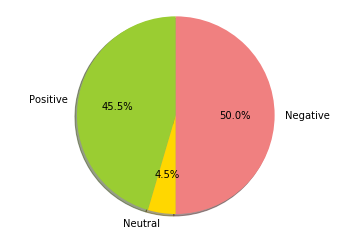

The f1Score is =  0.4002818886539816 

The Confusion Matix is = 
 [[ 2  7  0]
 [ 0  0  0]
 [ 0  7 18]] 

The accuracy is =  0.5882352941176471 

The recall is =  0.31407407407407406 

The Precision is =  0.6666666666666666 



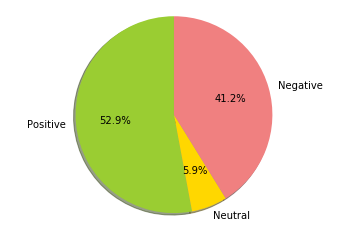

The f1Score is =  0.7947999712705595 

The Confusion Matix is = 
 [[ 8  1  0]
 [ 0  4  0]
 [ 0  5 17]] 

The accuracy is =  0.8285714285714286 

The recall is =  0.8872053872053872 

The Precision is =  0.7999999999999999 



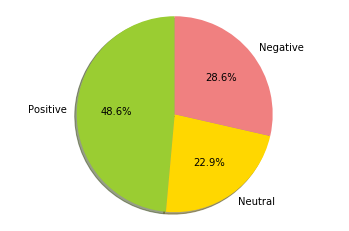

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0 13  0]
 [ 0  0 13]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



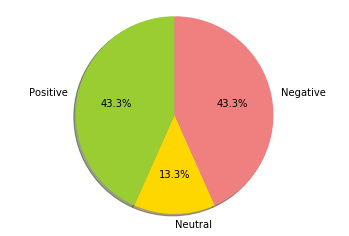

The f1Score is =  0.9495647721454171 

The Confusion Matix is = 
 [[15  1  0]
 [ 0 16  0]
 [ 0  2 29]] 

The accuracy is =  0.9523809523809523 

The recall is =  0.9576612903225806 

The Precision is =  0.9473684210526315 



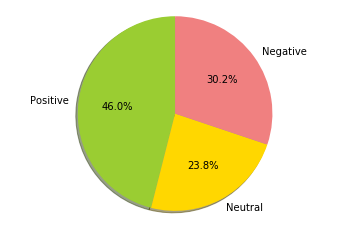

The f1Score is =  0.5413756613756614 

The Confusion Matix is = 
 [[8 9 0]
 [0 2 0]
 [0 5 8]] 

The accuracy is =  0.5625 

The recall is =  0.6953242835595778 

The Precision is =  0.7083333333333334 



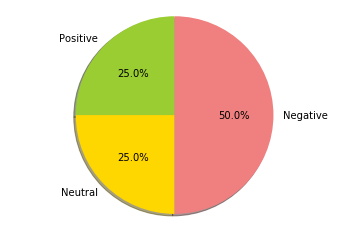

The f1Score is =  0.7407407407407408 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  6  0]
 [ 0  4 16]] 

The accuracy is =  0.8 

The recall is =  0.7666666666666666 

The Precision is =  0.8333333333333334 



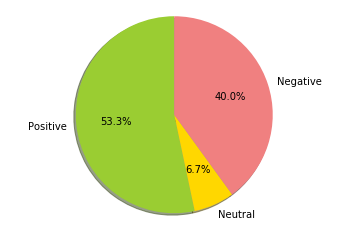

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 6]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



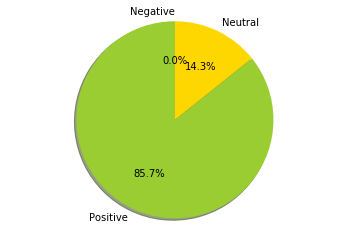

The f1Score is =  0.5769459298871064 

The Confusion Matix is = 
 [[ 5  5  0]
 [ 0  1  0]
 [ 0  4 15]] 

The accuracy is =  0.7 

The recall is =  0.7631578947368421 

The Precision is =  0.7000000000000001 



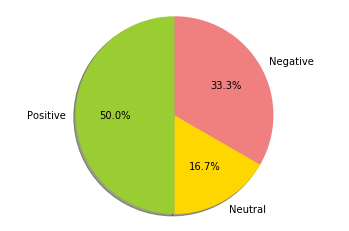

The f1Score is =  0.582010582010582 

The Confusion Matix is = 
 [[ 2  5  0]
 [ 0  4  0]
 [ 0  5 15]] 

The accuracy is =  0.6774193548387096 

The recall is =  0.6785714285714285 

The Precision is =  0.7619047619047619 



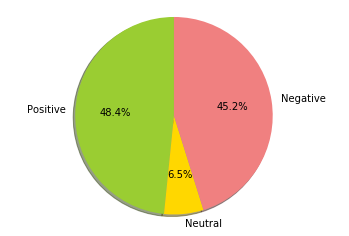

The f1Score is =  0.7205636812929942 

The Confusion Matix is = 
 [[ 5  4  0]
 [ 0  7  0]
 [ 0  5 13]] 

The accuracy is =  0.7352941176470589 

The recall is =  0.7592592592592592 

The Precision is =  0.8125 



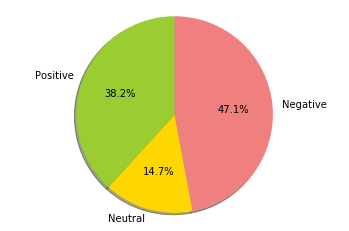

The f1Score is =  0.40903540903540897 

The Confusion Matix is = 
 [[ 4 13  0]
 [ 0  0  0]
 [ 0 12 33]] 

The accuracy is =  0.5967741935483871 

The recall is =  0.322875816993464 

The Precision is =  0.6666666666666666 



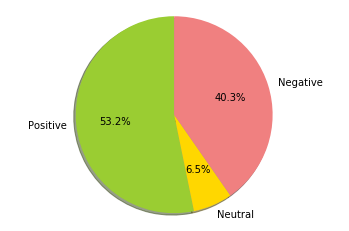

The f1Score is =  0.7359477124183007 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  6  0]
 [ 0  6 48]] 

The accuracy is =  0.875 

The recall is =  0.7962962962962963 

The Precision is =  0.8095238095238096 



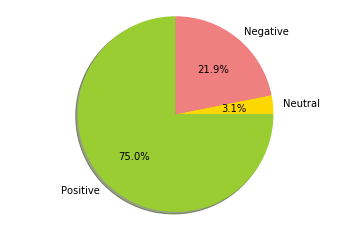

The f1Score is =  0.4859038142620233 

The Confusion Matix is = 
 [[21 21  0]
 [ 0  0  0]
 [ 0 28 53]] 

The accuracy is =  0.6016260162601627 

The recall is =  0.38477366255144035 

The Precision is =  0.6666666666666666 



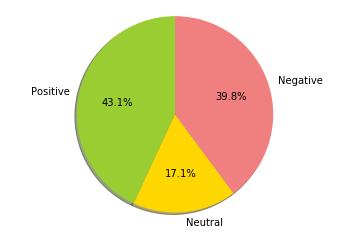

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 5]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



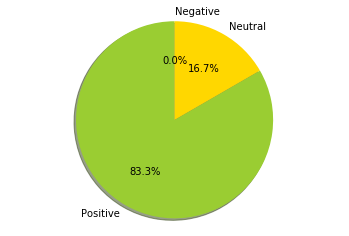

The f1Score is =  0.9569023569023569 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  4  0]
 [ 0  1 27]] 

The accuracy is =  0.9714285714285714 

The recall is =  0.9880952380952381 

The Precision is =  0.9333333333333332 



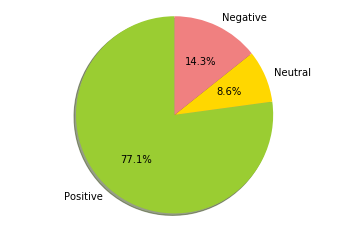

The f1Score is =  1.0 

The Confusion Matix is = 
 [[15  0]
 [ 0 10]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



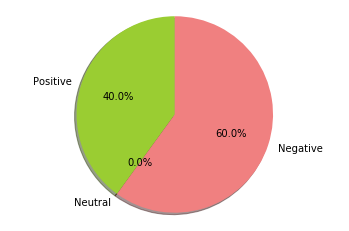

The f1Score is =  0.9696476964769648 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  7  0]
 [ 0  1 20]] 

The accuracy is =  0.9666666666666667 

The recall is =  0.9841269841269842 

The Precision is =  0.9583333333333334 



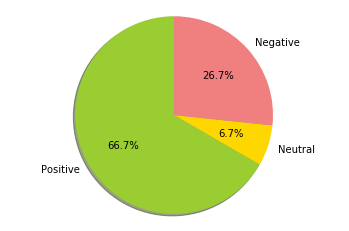

The f1Score is =  0.8205128205128206 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  1  0]
 [ 0  2 25]] 

The accuracy is =  0.9310344827586207 

The recall is =  0.9753086419753086 

The Precision is =  0.7777777777777777 



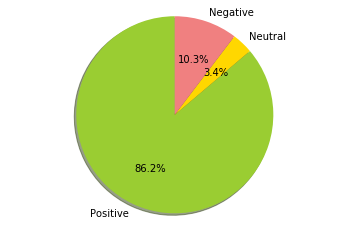

The f1Score is =  0.860576923076923 

The Confusion Matix is = 
 [[13  6  0]
 [ 0 10  0]
 [ 0  0 35]] 

The accuracy is =  0.90625 

The recall is =  0.8947368421052632 

The Precision is =  0.875 



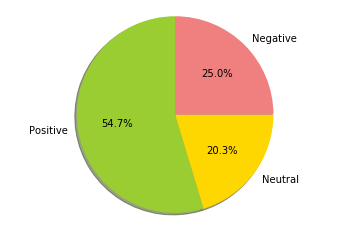

The f1Score is =  0.9440559440559441 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  6  0]
 [ 0  0 21]] 

The accuracy is =  0.9696969696969697 

The recall is =  0.9444444444444445 

The Precision is =  0.9523809523809524 



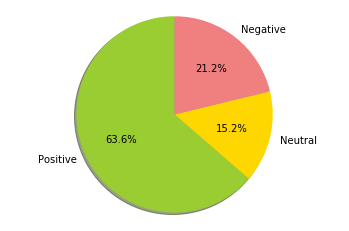

The f1Score is =  0.7537619699042408 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  4  0]
 [ 0  9 17]] 

The accuracy is =  0.71875 

The recall is =  0.8846153846153846 

The Precision is =  0.7692307692307692 



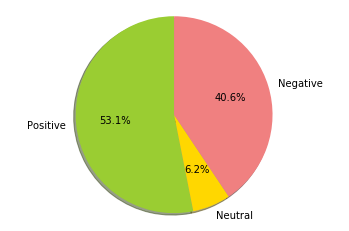

The f1Score is =  0.9103313840155945 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  8  0]
 [ 0  3 12]] 

The accuracy is =  0.8846153846153846 

The recall is =  0.9333333333333332 

The Precision is =  0.9090909090909092 



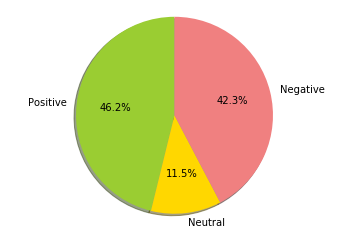

The f1Score is =  0.4678362573099415 

The Confusion Matix is = 
 [[7 5 0]
 [0 0 0]
 [0 7 7]] 

The accuracy is =  0.5384615384615384 

The recall is =  0.36111111111111116 

The Precision is =  0.6666666666666666 



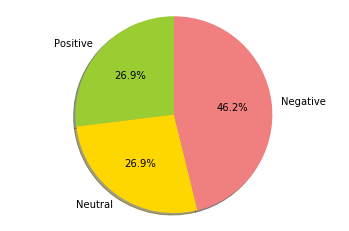

The f1Score is =  1.0 

The Confusion Matix is = 
 [[4]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



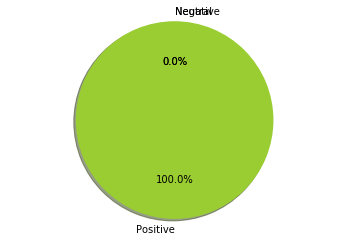

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0]
 [ 0 10]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



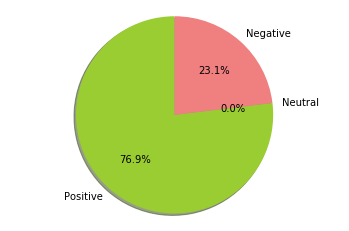

The f1Score is =  0.9259259259259259 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  5  0]
 [ 0  2 17]] 

The accuracy is =  0.9285714285714286 

The recall is =  0.9649122807017544 

The Precision is =  0.9047619047619048 



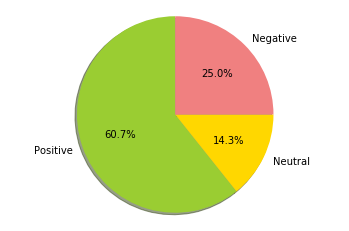

The f1Score is =  0.5436507936507936 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  0  0]
 [ 0  2 27]] 

The accuracy is =  0.9032258064516129 

The recall is =  0.47701149425287354 

The Precision is =  0.6666666666666666 



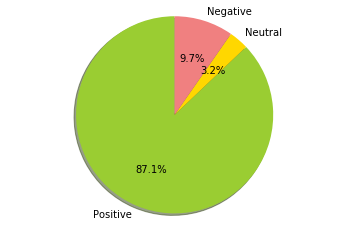

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 8  0]
 [ 0 26]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



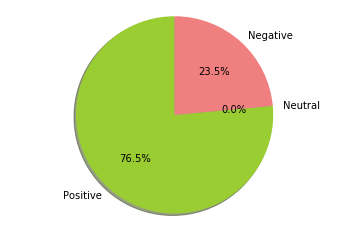

The f1Score is =  0.6481481481481481 

The Confusion Matix is = 
 [[ 0  2  0]
 [ 0 17  0]
 [ 0  0 51]] 

The accuracy is =  0.9714285714285714 

The recall is =  0.6666666666666666 

The Precision is =  0.6315789473684211 



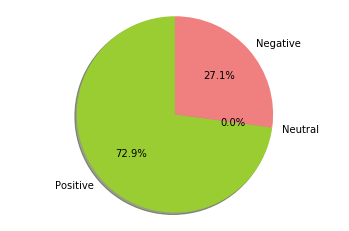

The f1Score is =  0.9738562091503268 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  8  0]
 [ 0  1 25]] 

The accuracy is =  0.972972972972973 

The recall is =  0.9871794871794872 

The Precision is =  0.9629629629629629 



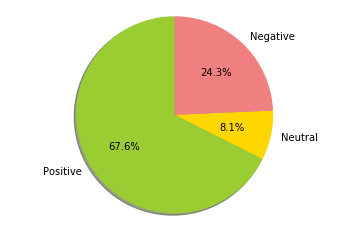

The f1Score is =  0.5356672022411733 

The Confusion Matix is = 
 [[23 26  0]
 [ 0  4  0]
 [ 0 28 73]] 

The accuracy is =  0.6493506493506493 

The recall is =  0.7307200107765879 

The Precision is =  0.689655172413793 



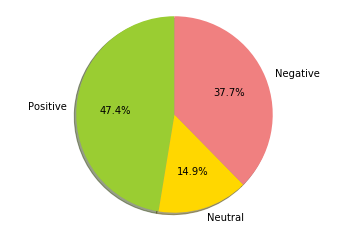

The f1Score is =  0.9722620755619321 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  8  0]
 [ 0  1 20]] 

The accuracy is =  0.9696969696969697 

The recall is =  0.9841269841269842 

The Precision is =  0.9629629629629629 



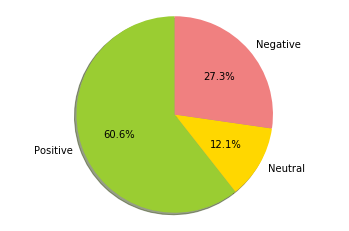

The f1Score is =  0.8949181739879414 

The Confusion Matix is = 
 [[10  0  0]
 [ 0 14  0]
 [ 0  8 39]] 

The accuracy is =  0.8873239436619719 

The recall is =  0.9432624113475176 

The Precision is =  0.8787878787878788 



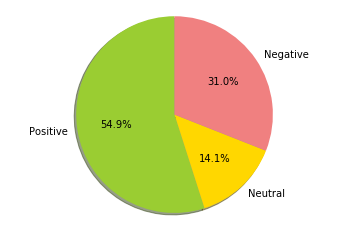

The f1Score is =  0.6199701937406855 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  0  0]
 [ 0  3 29]] 

The accuracy is =  0.8947368421052632 

The recall is =  0.5798611111111112 

The Precision is =  0.6666666666666666 



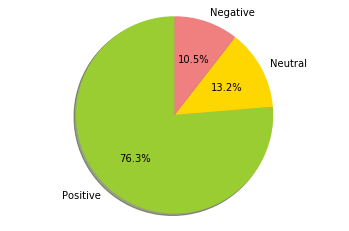

The f1Score is =  0.5704607046070461 

The Confusion Matix is = 
 [[ 5  5  0]
 [ 0  1  0]
 [ 0  5 18]] 

The accuracy is =  0.7058823529411765 

The recall is =  0.7608695652173912 

The Precision is =  0.6969696969696969 



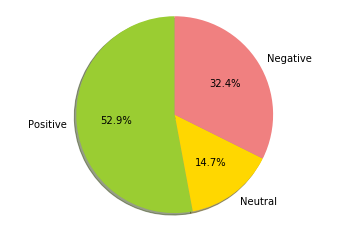

The f1Score is =  0.9797235023041475 

The Confusion Matix is = 
 [[ 8  0  0]
 [ 0 17  0]
 [ 0  1 15]] 

The accuracy is =  0.975609756097561 

The recall is =  0.9791666666666666 

The Precision is =  0.9814814814814815 



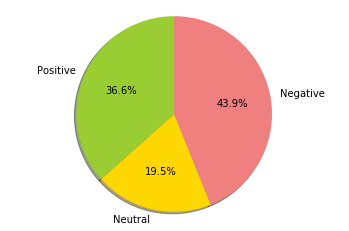

The f1Score is =  0.869912272245252 

The Confusion Matix is = 
 [[22  2  0]
 [ 0 16  0]
 [ 0  7 24]] 

The accuracy is =  0.8732394366197183 

The recall is =  0.896953405017921 

The Precision is =  0.88 



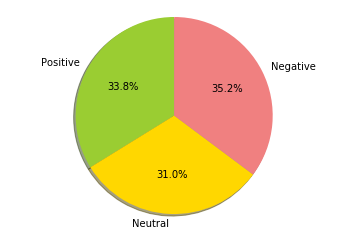

The f1Score is =  0.9640472521828455 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  5  0]
 [ 0  1 29]] 

The accuracy is =  0.972972972972973 

The recall is =  0.9888888888888889 

The Precision is =  0.9444444444444445 



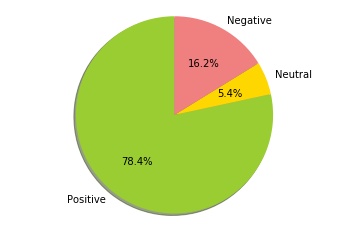

The f1Score is =  0.8611764705882353 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  7  0]
 [ 0  2 24]] 

The accuracy is =  0.9166666666666666 

The recall is =  0.8632478632478632 

The Precision is =  0.9 



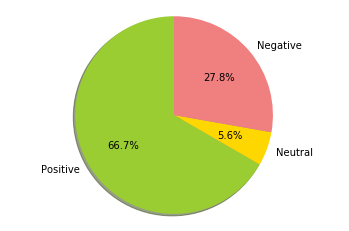

The f1Score is =  0.8161616161616162 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  4  0]
 [ 0  1 27]] 

The accuracy is =  0.9411764705882353 

The recall is =  0.8214285714285715 

The Precision is =  0.8888888888888888 



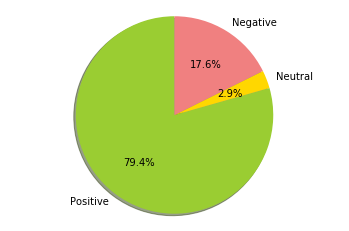

The f1Score is =  0.717032967032967 

The Confusion Matix is = 
 [[ 2  3  0]
 [ 0  4  0]
 [ 0  2 27]] 

The accuracy is =  0.868421052631579 

The recall is =  0.7770114942528735 

The Precision is =  0.8148148148148149 



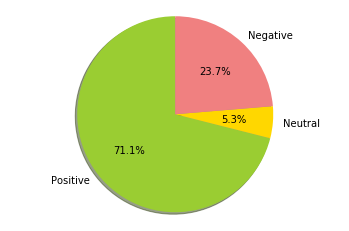

The f1Score is =  0.8268398268398268 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  3  0]
 [ 0  5 36]] 

The accuracy is =  0.8958333333333334 

The recall is =  0.959349593495935 

The Precision is =  0.7916666666666666 



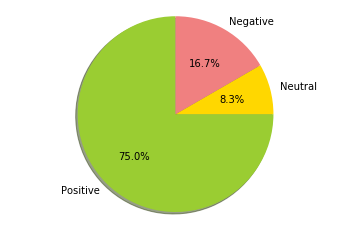

The f1Score is =  0.6998389694041868 

The Confusion Matix is = 
 [[ 3  3  0]
 [ 0  6  0]
 [ 0  8 41]] 

The accuracy is =  0.819672131147541 

The recall is =  0.7789115646258503 

The Precision is =  0.7843137254901961 



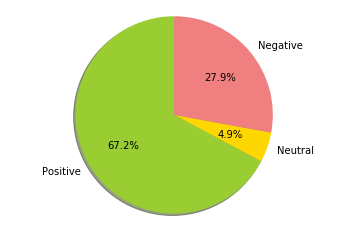

The f1Score is =  0.8558500323206205 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  5  0]
 [ 0  2 16]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.8796296296296297 

The Precision is =  0.875 



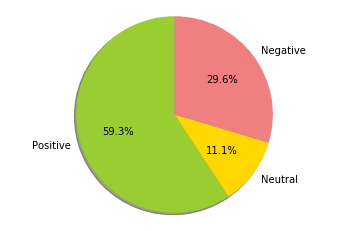

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0  7  0]
 [ 0  0 15]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



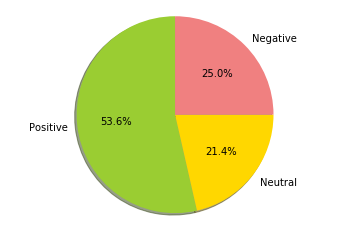

The f1Score is =  0.8974575476123464 

The Confusion Matix is = 
 [[10  2  0]
 [ 0  8  0]
 [ 0  1  8]] 

The accuracy is =  0.896551724137931 

The recall is =  0.9074074074074074 

The Precision is =  0.9090909090909092 



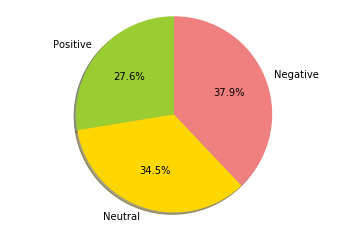

The f1Score is =  0.7361111111111112 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0  3  0]
 [ 0  5 17]] 

The accuracy is =  0.7941176470588235 

The recall is =  0.85016835016835 

The Precision is =  0.7666666666666666 



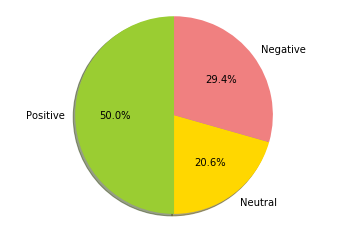

The f1Score is =  0.7487330538876931 

The Confusion Matix is = 
 [[36  6  0]
 [ 0  8  0]
 [ 0 13 42]] 

The accuracy is =  0.819047619047619 

The recall is =  0.8735930735930736 

The Precision is =  0.7654320987654321 



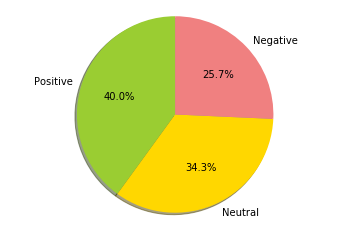

The f1Score is =  0.8743961352657005 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0  2  0]
 [ 0  2 22]] 

The accuracy is =  0.9354838709677419 

The recall is =  0.9722222222222222 

The Precision is =  0.8333333333333334 



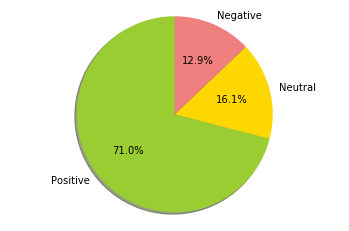

The f1Score is =  0.8835365853658538 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  7  0]
 [ 0  1 20]] 

The accuracy is =  0.9354838709677419 

The recall is =  0.8730158730158729 

The Precision is =  0.9259259259259259 



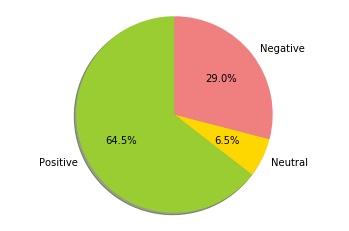

The f1Score is =  0.9726327312534209 

The Confusion Matix is = 
 [[10  1  0]
 [ 0 14  0]
 [ 0  0 10]] 

The accuracy is =  0.9714285714285714 

The recall is =  0.9696969696969697 

The Precision is =  0.9777777777777779 



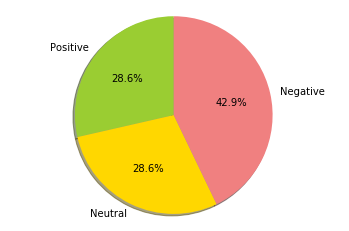

The f1Score is =  0.8585858585858586 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0 10  0]
 [ 0  0 18]] 

The accuracy is =  0.9375 

The recall is =  0.8333333333333334 

The Precision is =  0.9444444444444445 



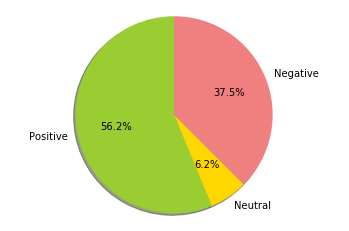

The f1Score is =  0.9440559440559441 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  6  0]
 [ 0  0 21]] 

The accuracy is =  0.9696969696969697 

The recall is =  0.9444444444444445 

The Precision is =  0.9523809523809524 



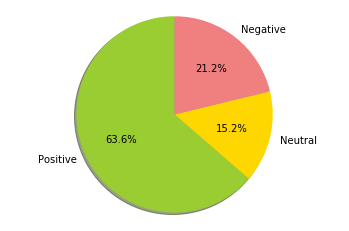

The f1Score is =  0.8801096709870387 

The Confusion Matix is = 
 [[28  3  0]
 [ 0  9  0]
 [ 0  3 24]] 

The accuracy is =  0.9104477611940298 

The recall is =  0.9307048984468339 

The Precision is =  0.8666666666666667 



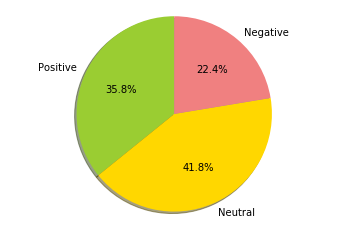

The f1Score is =  0.9071428571428571 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0 14  0]
 [ 0  2 34]] 

The accuracy is =  0.9322033898305084 

The recall is =  0.9074074074074074 

The Precision is =  0.9259259259259259 



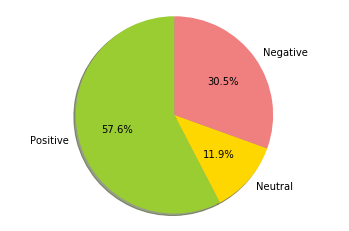

The f1Score is =  0.8290499936069556 

The Confusion Matix is = 
 [[10  2  0]
 [ 0  9  0]
 [ 0  7 36]] 

The accuracy is =  0.859375 

The recall is =  0.8901808785529717 

The Precision is =  0.8333333333333334 



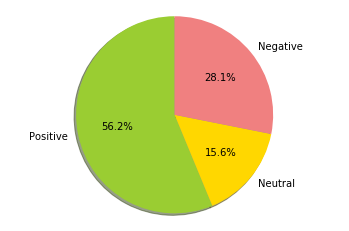

The f1Score is =  0.9143942477275809 

The Confusion Matix is = 
 [[13  1  0]
 [ 0  9  0]
 [ 0  2 12]] 

The accuracy is =  0.918918918918919 

The recall is =  0.9285714285714285 

The Precision is =  0.9166666666666666 



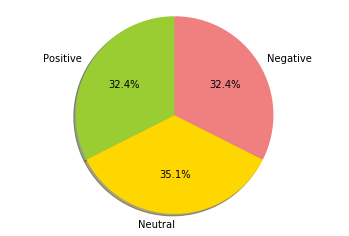

The f1Score is =  0.27777777777777773 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  0  0]
 [ 0  4 10]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.2380952380952381 

The Precision is =  0.3333333333333333 



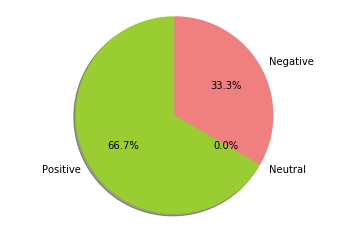

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



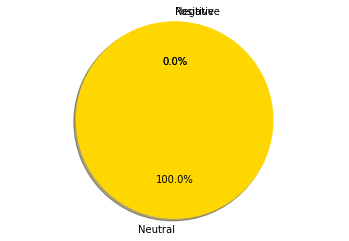

The f1Score is =  1.0 

The Confusion Matix is = 
 [[3 0]
 [0 3]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



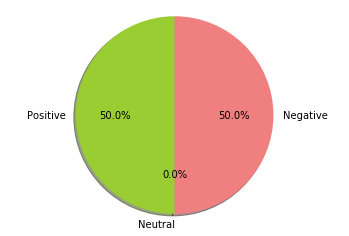

The f1Score is =  0.7277088502894955 

The Confusion Matix is = 
 [[ 3  4  0]
 [ 0  4  0]
 [ 0  1 15]] 

The accuracy is =  0.8148148148148148 

The recall is =  0.7886904761904763 

The Precision is =  0.8148148148148149 



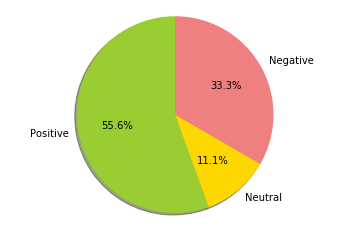

The f1Score is =  0.8902229845626072 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0  4  0]
 [ 0  3 25]] 

The accuracy is =  0.918918918918919 

The recall is =  0.9642857142857143 

The Precision is =  0.8571428571428571 



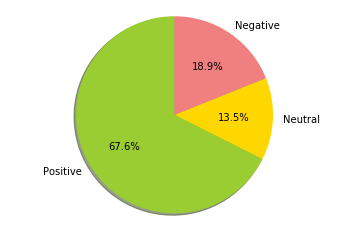

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  6  0]
 [ 0  0 26]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



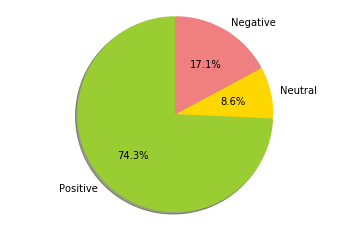

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  7  0]
 [ 0  0 29]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



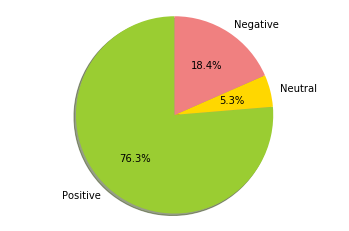

The f1Score is =  0.9008895866038724 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  4  0]
 [ 0  1 24]] 

The accuracy is =  0.9444444444444444 

The recall is =  0.939047619047619 

The Precision is =  0.8888888888888888 



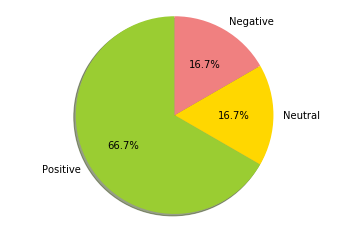

The f1Score is =  0.7777777777777777 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  1  0]
 [ 0  0 33]] 

The accuracy is =  0.9722222222222222 

The recall is =  0.8333333333333334 

The Precision is =  0.8333333333333334 



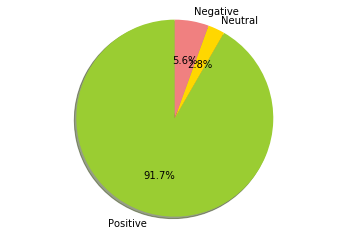

The f1Score is =  0.9329729729729729 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0 11  0]
 [ 0  3 17]] 

The accuracy is =  0.90625 

The recall is =  0.9500000000000001 

The Precision is =  0.9285714285714285 



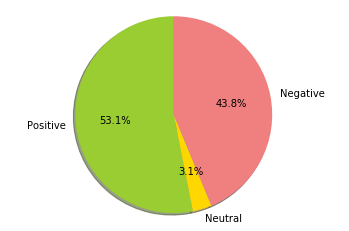

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0  8  0]
 [ 0  0 22]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



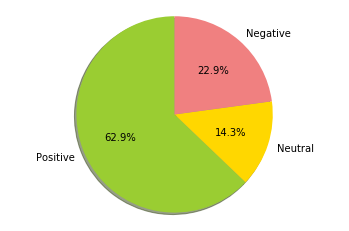

The f1Score is =  0.9357142857142858 

The Confusion Matix is = 
 [[ 7  0  0]
 [ 0  6  0]
 [ 0  2 19]] 

The accuracy is =  0.9411764705882353 

The recall is =  0.9682539682539683 

The Precision is =  0.9166666666666666 



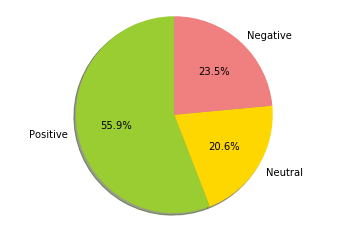

The f1Score is =  0.8670550249497619 

The Confusion Matix is = 
 [[18  2  0]
 [ 0 16  0]
 [ 0  8 33]] 

The accuracy is =  0.8701298701298701 

The recall is =  0.9016260162601627 

The Precision is =  0.8717948717948718 



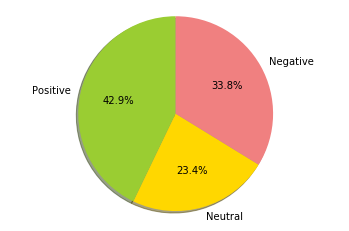

The f1Score is =  0.9279810298102982 

The Confusion Matix is = 
 [[ 7  1  0]
 [ 0  7  0]
 [ 0  1 20]] 

The accuracy is =  0.9444444444444444 

The recall is =  0.9424603174603176 

The Precision is =  0.9259259259259259 



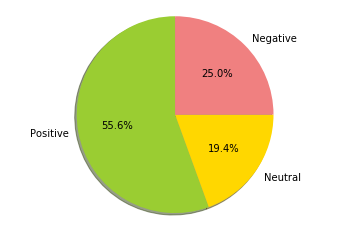

The f1Score is =  0.6940357538364182 

The Confusion Matix is = 
 [[18  7  0]
 [ 0  6  0]
 [ 0  9 20]] 

The accuracy is =  0.7333333333333333 

The recall is =  0.8032183908045978 

The Precision is =  0.7575757575757575 



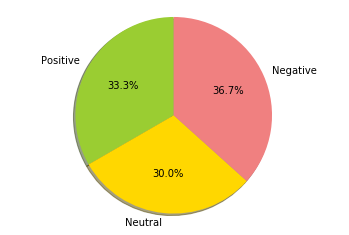

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



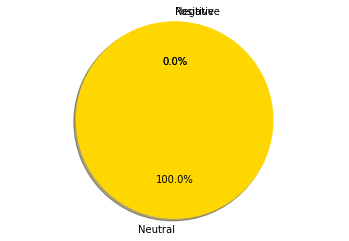

The f1Score is =  0.676068376068376 

The Confusion Matix is = 
 [[ 3  3  0]
 [ 0  3  0]
 [ 0  4 18]] 

The accuracy is =  0.7741935483870968 

The recall is =  0.7727272727272728 

The Precision is =  0.7666666666666666 



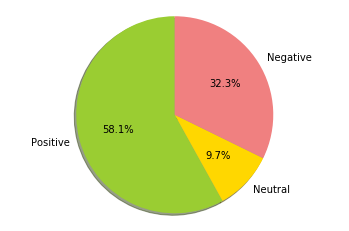

The f1Score is =  0.6666666666666666 

The Confusion Matix is = 
 [[ 6  6  0]
 [ 0  8  0]
 [ 0 13 46]] 

The accuracy is =  0.759493670886076 

The recall is =  0.7598870056497176 

The Precision is =  0.7654320987654321 



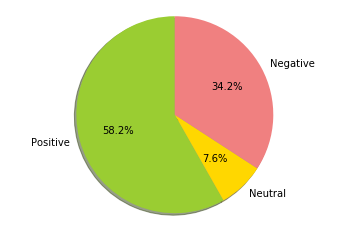

The f1Score is =  0.9697293447293447 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0 12  0]
 [ 0  2 71]] 

The accuracy is =  0.9772727272727273 

The recall is =  0.9908675799086758 

The Precision is =  0.9523809523809524 



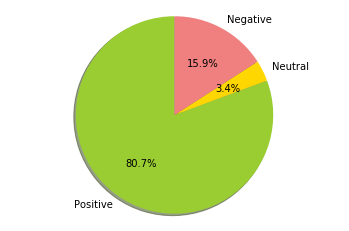

The f1Score is =  0.9500000000000001 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  9  0]
 [ 0  2 19]] 

The accuracy is =  0.9354838709677419 

The recall is =  0.9682539682539683 

The Precision is =  0.9393939393939394 



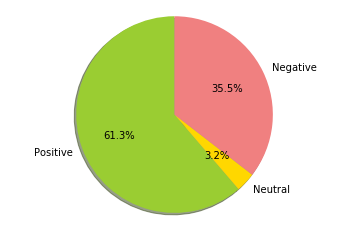

The f1Score is =  0.9626047711154094 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  5  0]
 [ 0  1 23]] 

The accuracy is =  0.9696969696969697 

The recall is =  0.9861111111111112 

The Precision is =  0.9444444444444445 



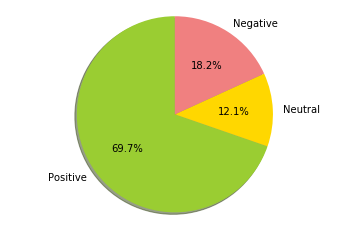

The f1Score is =  0.7561771561771562 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  3  0]
 [ 0  3 18]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.8412698412698413 

The Precision is =  0.7916666666666666 



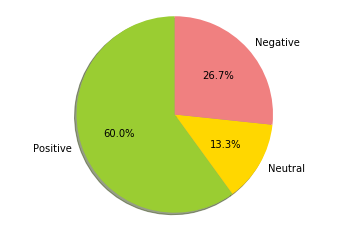

The f1Score is =  0.6390217969165338 

The Confusion Matix is = 
 [[ 9  1  0]
 [ 0  0  0]
 [ 0  1 16]] 

The accuracy is =  0.9259259259259259 

The recall is =  0.6137254901960785 

The Precision is =  0.6666666666666666 



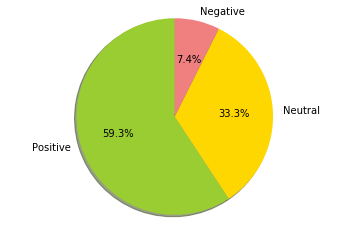

The f1Score is =  0.8755555555555555 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  1  0]
 [ 0  1 12]] 

The accuracy is =  0.9333333333333333 

The recall is =  0.9743589743589745 

The Precision is =  0.8333333333333334 



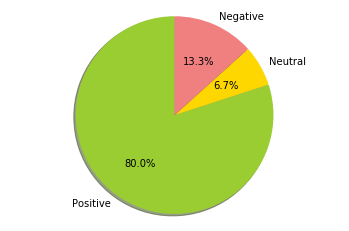

The f1Score is =  0.4473684210526316 

The Confusion Matix is = 
 [[1 2 0]
 [0 0 0]
 [0 3 8]] 

The accuracy is =  0.6428571428571429 

The recall is =  0.35353535353535354 

The Precision is =  0.6666666666666666 



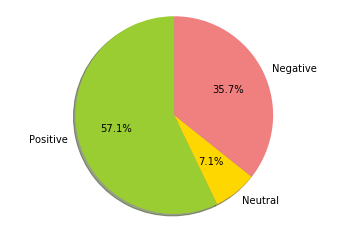

The f1Score is =  0.7378881987577639 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  1  0]
 [ 0  2 22]] 

The accuracy is =  0.896551724137931 

The recall is =  0.8888888888888888 

The Precision is =  0.75 



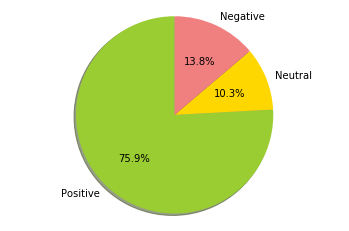

The f1Score is =  0.9700258397932817 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  7  0]
 [ 0  1 21]] 

The accuracy is =  0.967741935483871 

The recall is =  0.9848484848484849 

The Precision is =  0.9583333333333334 



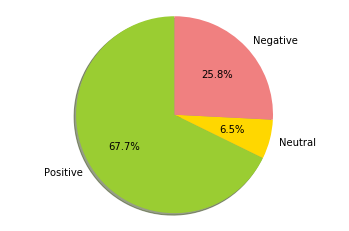

The f1Score is =  0.9670250896057349 

The Confusion Matix is = 
 [[ 7  1  0]
 [ 0 15  0]
 [ 0  0 10]] 

The accuracy is =  0.9696969696969697 

The recall is =  0.9583333333333334 

The Precision is =  0.9791666666666666 



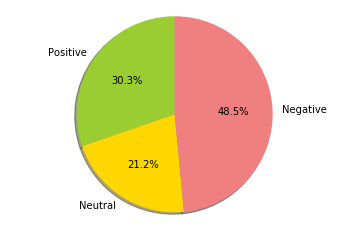

The f1Score is =  0.4077380952380952 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  1  0]
 [ 0  4 30]] 

The accuracy is =  0.8611111111111112 

The recall is =  0.6274509803921569 

The Precision is =  0.3888888888888889 



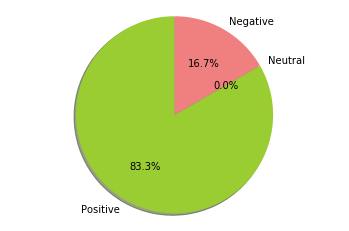

The f1Score is =  0.8412698412698413 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  6  0]
 [ 0  0 24]] 

The accuracy is =  0.9411764705882353 

The recall is =  0.8333333333333334 

The Precision is =  0.9166666666666666 



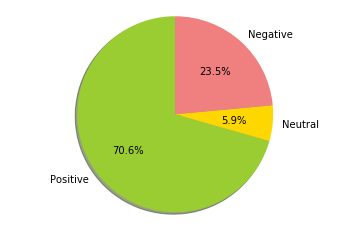

The f1Score is =  0.9555555555555556 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  4  0]
 [ 0  1 22]] 

The accuracy is =  0.9666666666666667 

The recall is =  0.9855072463768115 

The Precision is =  0.9333333333333332 



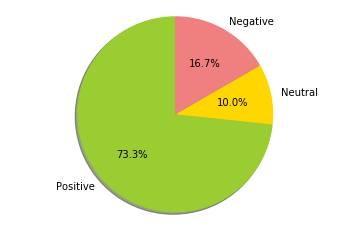

The f1Score is =  0.6313628899835796 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0 13  0]
 [ 0  1 14]] 

The accuracy is =  0.9310344827586207 

The recall is =  0.6444444444444445 

The Precision is =  0.6222222222222222 



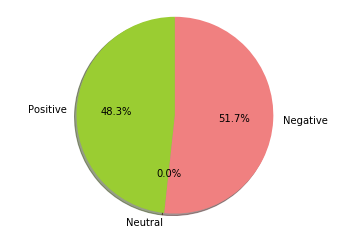

The f1Score is =  0.8327228327228328 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  9  0]
 [ 0  1 19]] 

The accuracy is =  0.9090909090909091 

The recall is =  0.8166666666666668 

The Precision is =  0.9166666666666666 



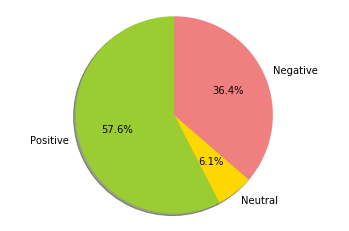

The f1Score is =  0.6666666666666666 

The Confusion Matix is = 
 [[ 4  4  0]
 [ 0  5  0]
 [ 0  6 15]] 

The accuracy is =  0.7058823529411765 

The recall is =  0.7380952380952381 

The Precision is =  0.7777777777777777 



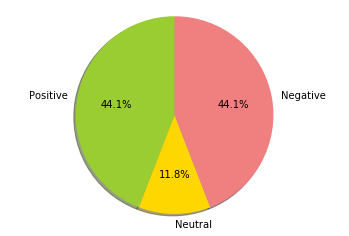

The f1Score is =  0.8005050505050505 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  9  0]
 [ 0  2 11]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.782051282051282 

The Precision is =  0.8974358974358975 



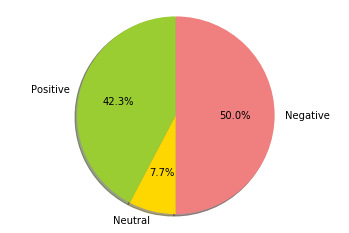

The f1Score is =  0.87336860670194 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  4  0]
 [ 0  1 13]] 

The accuracy is =  0.9090909090909091 

The recall is =  0.8928571428571429 

The Precision is =  0.8888888888888888 



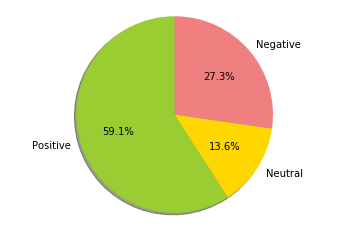

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



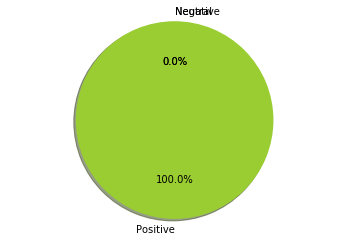

The f1Score is =  1.0 

The Confusion Matix is = 
 [[4]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



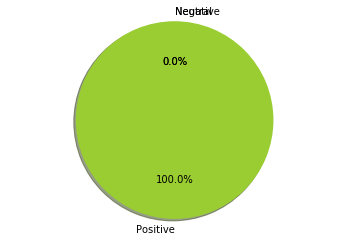

The f1Score is =  0.9153439153439153 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  3  0]
 [ 0  0 24]] 

The accuracy is =  0.96875 

The recall is =  0.9333333333333332 

The Precision is =  0.9166666666666666 



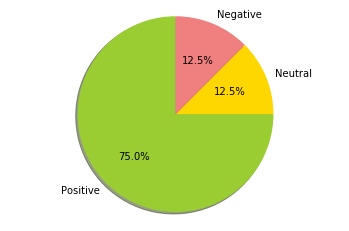

The f1Score is =  0.8791783380018674 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  6  0]
 [ 0  1 25]] 

The accuracy is =  0.9428571428571428 

The recall is =  0.8760683760683761 

The Precision is =  0.9166666666666666 



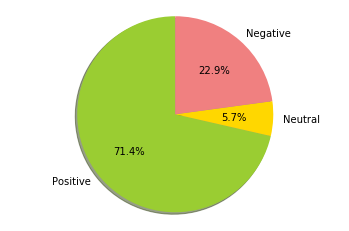

The f1Score is =  0.742612293144208 

The Confusion Matix is = 
 [[ 3  3  0]
 [ 0  5  0]
 [ 0  3 22]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.7933333333333333 

The Precision is =  0.8181818181818182 



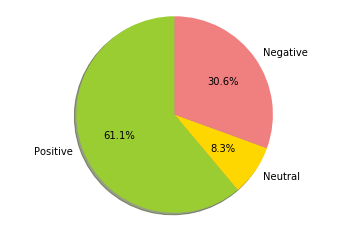

The f1Score is =  0.776844070961718 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  4  0]
 [ 0  5 23]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.8571428571428571 

The Precision is =  0.7999999999999999 



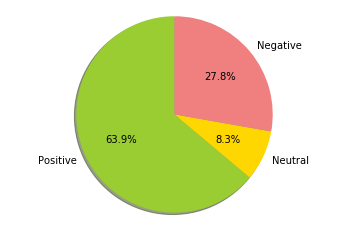

The f1Score is =  0.6444444444444445 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  7  0]
 [ 0  0 28]] 

The accuracy is =  0.9722222222222222 

The recall is =  0.6666666666666666 

The Precision is =  0.625 



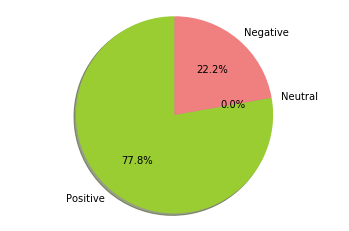

The f1Score is =  0.9644059644059645 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  5  0]
 [ 0  1 31]] 

The accuracy is =  0.9743589743589743 

The recall is =  0.9895833333333334 

The Precision is =  0.9444444444444445 



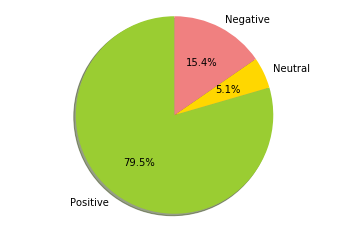

The f1Score is =  0.981117230527144 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0 15  0]
 [ 0  1 20]] 

The accuracy is =  0.9736842105263158 

The recall is =  0.9841269841269842 

The Precision is =  0.9791666666666666 



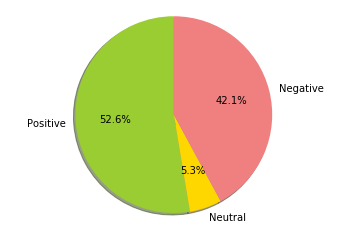

The f1Score is =  0.780205415499533 

The Confusion Matix is = 
 [[10  1  0]
 [ 0  5  0]
 [ 0  6 12]] 

The accuracy is =  0.7941176470588235 

The recall is =  0.8585858585858586 

The Precision is =  0.8055555555555557 



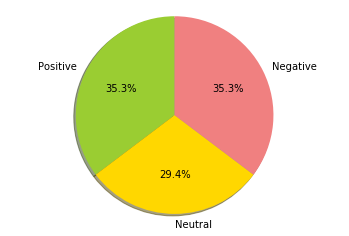

The f1Score is =  0.8518518518518517 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  1  0]
 [ 0  0 30]] 

The accuracy is =  0.9722222222222222 

The recall is =  0.9333333333333332 

The Precision is =  0.8333333333333334 



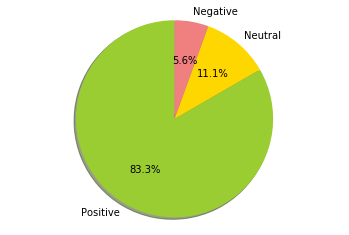

The f1Score is =  0.7322119428090833 

The Confusion Matix is = 
 [[39  4  0]
 [ 0  8  0]
 [ 0 21 62]] 

The accuracy is =  0.8134328358208955 

The recall is =  0.884654898664425 

The Precision is =  0.7474747474747474 



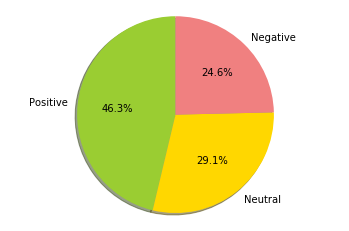

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0 0]
 [0 1 0]
 [0 0 6]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



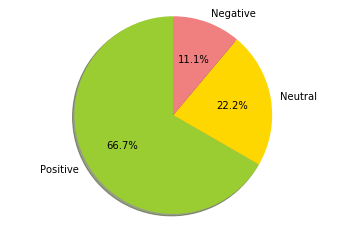

The f1Score is =  0.6821983273596177 

The Confusion Matix is = 
 [[ 1  1  0]
 [ 0  2  0]
 [ 0  4 29]] 

The accuracy is =  0.8648648648648649 

The recall is =  0.7929292929292929 

The Precision is =  0.7619047619047619 



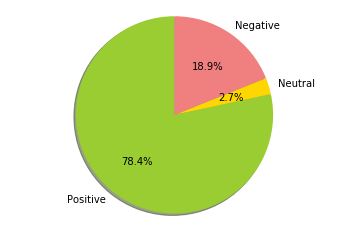

The f1Score is =  0.7583214038120448 

The Confusion Matix is = 
 [[ 4  6  0]
 [ 0 16  0]
 [ 0  5 59]] 

The accuracy is =  0.8777777777777778 

The recall is =  0.7739583333333333 

The Precision is =  0.8641975308641975 



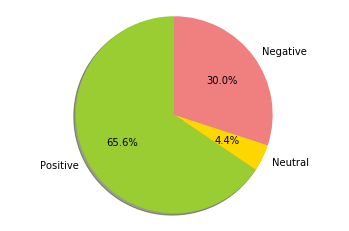

The f1Score is =  0.6419753086419754 

The Confusion Matix is = 
 [[ 4  4  0]
 [ 0  2  0]
 [ 0  4 25]] 

The accuracy is =  0.7948717948717948 

The recall is =  0.7873563218390803 

The Precision is =  0.7333333333333334 



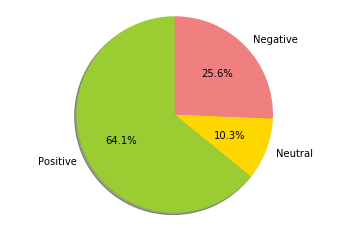

The f1Score is =  0.9365079365079364 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0 10  0]
 [ 0  0 25]] 

The accuracy is =  0.9743589743589743 

The recall is =  0.9166666666666666 

The Precision is =  0.9696969696969697 



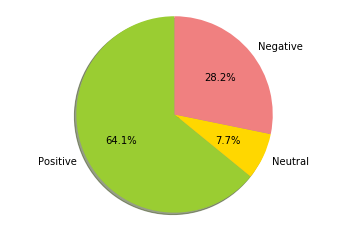

The f1Score is =  0.45912437039907017 

The Confusion Matix is = 
 [[26 37  0]
 [ 0  0  0]
 [ 0 24 46]] 

The accuracy is =  0.5413533834586466 

The recall is =  0.3566137566137566 

The Precision is =  0.6666666666666666 



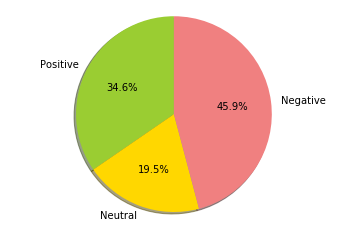

The f1Score is =  0.5452892814756899 

The Confusion Matix is = 
 [[ 41  40   0]
 [  0   5   0]
 [  0  36 100]] 

The accuracy is =  0.6576576576576577 

The recall is =  0.7471556523844106 

The Precision is =  0.6872427983539096 



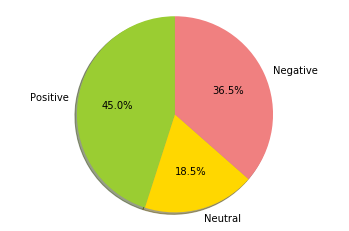

The f1Score is =  0.7511111111111112 

The Confusion Matix is = 
 [[ 6  3  0]
 [ 0  4  0]
 [ 0  4 23]] 

The accuracy is =  0.825 

The recall is =  0.839506172839506 

The Precision is =  0.787878787878788 



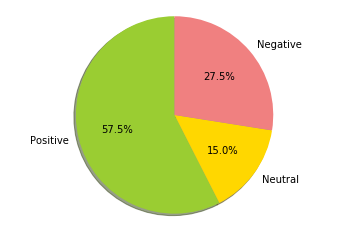

The f1Score is =  0.8450660450660451 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0  4  0]
 [ 0  3 26]] 

The accuracy is =  0.9 

The recall is =  0.9178981937602627 

The Precision is =  0.8333333333333334 



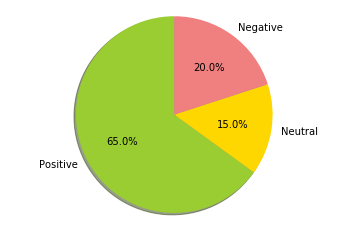

The f1Score is =  1.0 

The Confusion Matix is = 
 [[16  0  0]
 [ 0 12  0]
 [ 0  0 50]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



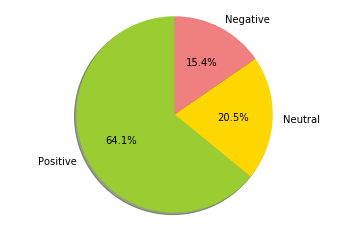

The f1Score is =  0.554074074074074 

The Confusion Matix is = 
 [[16 18  0]
 [ 0  2  0]
 [ 0  8 32]] 

The accuracy is =  0.6578947368421053 

The recall is =  0.7568627450980392 

The Precision is =  0.6904761904761904 



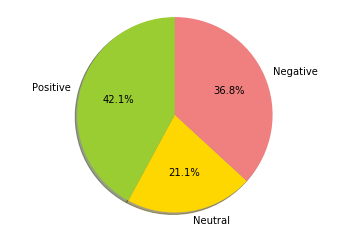

The f1Score is =  0.7896825396825395 

The Confusion Matix is = 
 [[ 4  4  0]
 [ 0  9  0]
 [ 0  2 20]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.8030303030303031 

The Precision is =  0.8666666666666667 



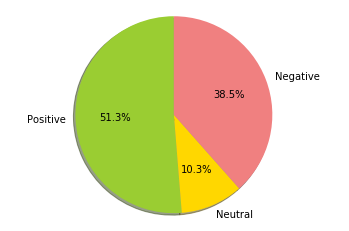

The f1Score is =  0.48412698412698413 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  1  0]
 [ 0  1 10]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.6363636363636364 

The Precision is =  0.4444444444444444 



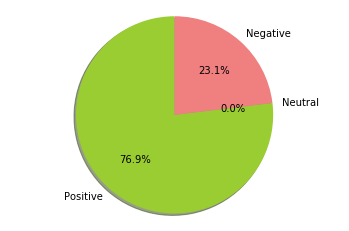

The f1Score is =  0.7113895850737956 

The Confusion Matix is = 
 [[14  8  0]
 [ 0  9  0]
 [ 0  9 24]] 

The accuracy is =  0.734375 

The recall is =  0.7878787878787877 

The Precision is =  0.782051282051282 



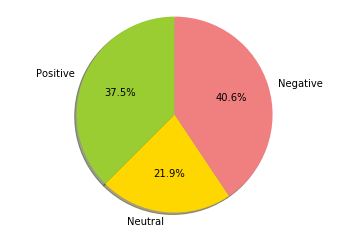

The f1Score is =  0.730990990990991 

The Confusion Matix is = 
 [[ 9  7  0]
 [ 0  4  0]
 [ 0  1 18]] 

The accuracy is =  0.7948717948717948 

The recall is =  0.8366228070175438 

The Precision is =  0.7777777777777777 



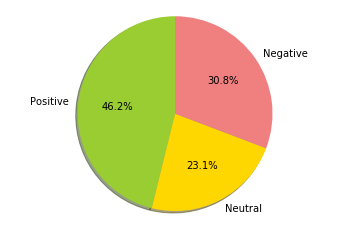

The f1Score is =  0.5211733472603038 

The Confusion Matix is = 
 [[14  9  0]
 [ 0  1  0]
 [ 0  7  8]] 

The accuracy is =  0.5897435897435898 

The recall is =  0.7140096618357488 

The Precision is =  0.6862745098039215 



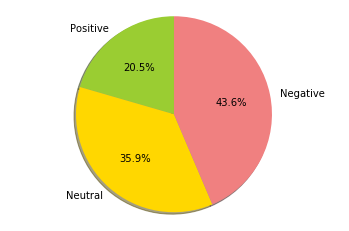

The f1Score is =  0.7295985060690944 

The Confusion Matix is = 
 [[ 5  4  0]
 [ 0  4  0]
 [ 0  3 24]] 

The accuracy is =  0.825 

The recall is =  0.8148148148148149 

The Precision is =  0.787878787878788 



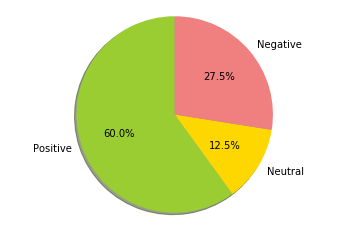

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0  7  0]
 [ 0  0 27]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



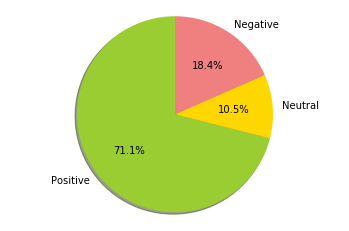

The f1Score is =  0.9527777777777778 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  9  0]
 [ 0  2 23]] 

The accuracy is =  0.9428571428571428 

The recall is =  0.9733333333333333 

The Precision is =  0.9393939393939394 



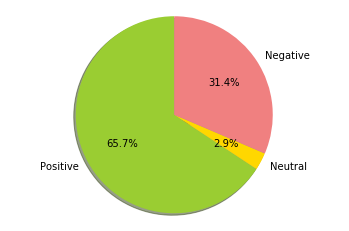

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  6  0]
 [ 0  0 30]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



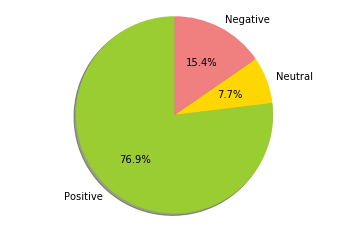

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  9  0]
 [ 0  0 25]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



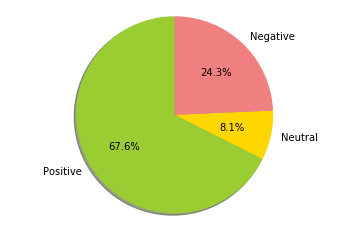

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  6  0]
 [ 0  0 31]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



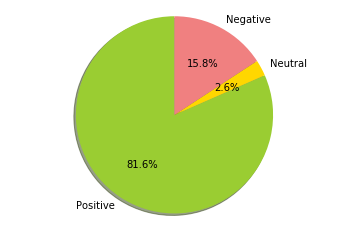

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0]
 [ 0 38]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



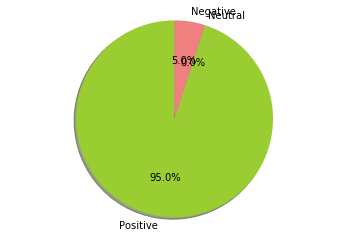

The f1Score is =  0.8258585858585858 

The Confusion Matix is = 
 [[14  5  0]
 [ 0  9  0]
 [ 0  2 10]] 

The accuracy is =  0.825 

The recall is =  0.8567251461988304 

The Precision is =  0.8541666666666666 



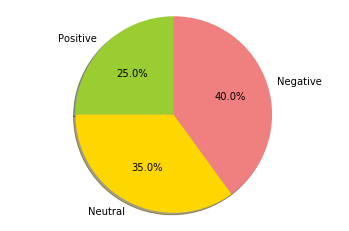

The f1Score is =  0.7615232787646581 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  2  0]
 [ 0  4 27]] 

The accuracy is =  0.8717948717948718 

The recall is =  0.9014336917562725 

The Precision is =  0.7619047619047619 



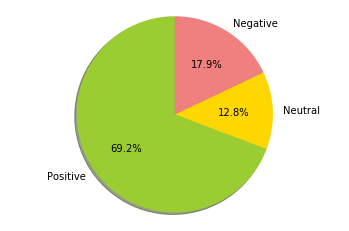

The f1Score is =  0.6307814992025519 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0  1  0]
 [ 0  7 25]] 

The accuracy is =  0.775 

The recall is =  0.8318452380952381 

The Precision is =  0.7000000000000001 



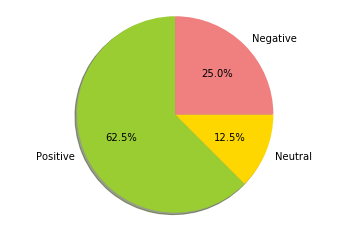

The f1Score is =  0.5574712643678161 

The Confusion Matix is = 
 [[11  7  0]
 [ 0  6  0]
 [ 0 10  5]] 

The accuracy is =  0.5641025641025641 

The recall is =  0.6481481481481481 

The Precision is =  0.7536231884057972 



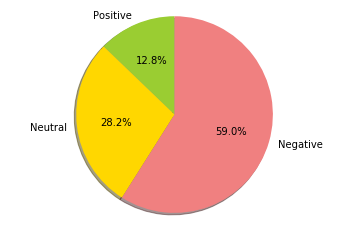

The f1Score is =  0.7223996129656506 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0  3  0]
 [ 0  5 24]] 

The accuracy is =  0.8157894736842105 

The recall is =  0.8314176245210727 

The Precision is =  0.7666666666666666 



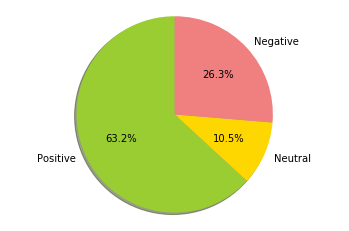

The f1Score is =  0.7688600864074443 

The Confusion Matix is = 
 [[ 1  2  0]
 [ 0  7  0]
 [ 0  1 29]] 

The accuracy is =  0.925 

The recall is =  0.7666666666666666 

The Precision is =  0.9 



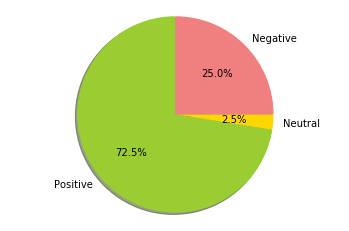

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0 14  0]
 [ 0  0 60]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



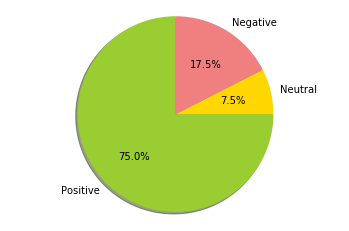

The f1Score is =  0.9552042160737813 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0 10  0]
 [ 0  2 22]] 

The accuracy is =  0.9459459459459459 

The recall is =  0.9722222222222222 

The Precision is =  0.9444444444444445 



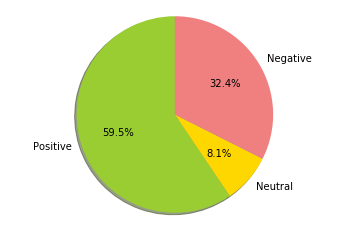

The f1Score is =  0.9223085460599334 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  7  0]
 [ 0  3 25]] 

The accuracy is =  0.9210526315789473 

The recall is =  0.9642857142857143 

The Precision is =  0.9 



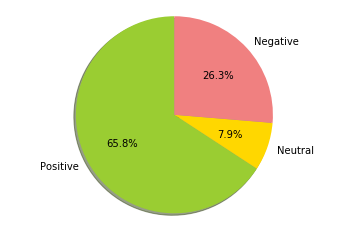

The f1Score is =  0.828832702671712 

The Confusion Matix is = 
 [[16  2  0]
 [ 0 13  0]
 [ 0 10 31]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.8816621499548329 

The Precision is =  0.84 



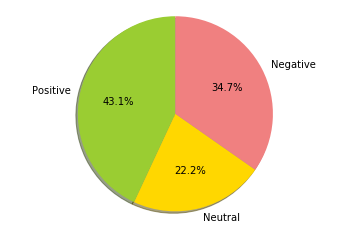

The f1Score is =  0.8773946360153256 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  1  0]
 [ 0  1 14]] 

The accuracy is =  0.9444444444444444 

The recall is =  0.9777777777777779 

The Precision is =  0.8333333333333334 



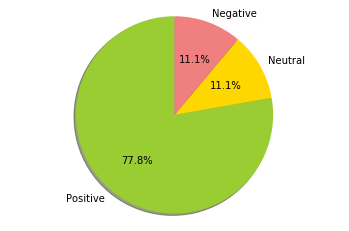

The f1Score is =  0.7146807440925088 

The Confusion Matix is = 
 [[ 7  3  0]
 [ 0  5  0]
 [ 0  7 16]] 

The accuracy is =  0.7368421052631579 

The recall is =  0.7985507246376811 

The Precision is =  0.7777777777777777 



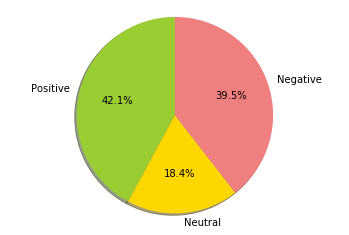

The f1Score is =  0.7861360718870346 

The Confusion Matix is = 
 [[ 8  4  0]
 [ 0  6  0]
 [ 0  3 19]] 

The accuracy is =  0.825 

The recall is =  0.8434343434343434 

The Precision is =  0.8205128205128206 



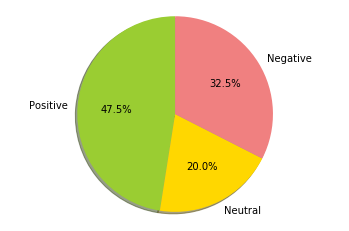

The f1Score is =  0.9457875457875456 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0 16  0]
 [ 0  3 18]] 

The accuracy is =  0.9210526315789473 

The recall is =  0.9523809523809524 

The Precision is =  0.9473684210526315 



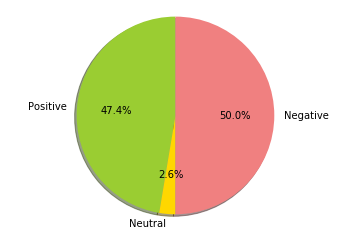

The f1Score is =  0.7368906332741488 

The Confusion Matix is = 
 [[24  6  0]
 [ 0  9  0]
 [ 0 17 64]] 

The accuracy is =  0.8083333333333333 

The recall is =  0.8633744855967077 

The Precision is =  0.7604166666666666 



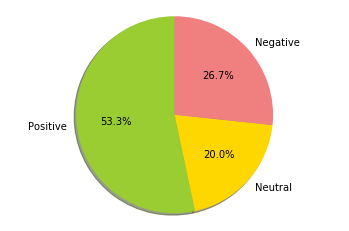

The f1Score is =  0.9802469135802468 

The Confusion Matix is = 
 [[ 9  0  0]
 [ 0 39  0]
 [ 0  3 66]] 

The accuracy is =  0.9743589743589743 

The recall is =  0.9855072463768115 

The Precision is =  0.9761904761904763 



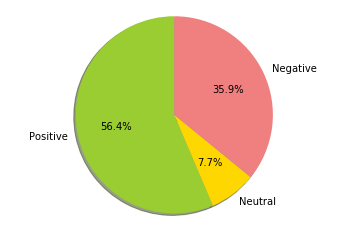

The f1Score is =  0.5363636363636364 

The Confusion Matix is = 
 [[21 18  0]
 [ 0  0  0]
 [ 0 13 65]] 

The accuracy is =  0.7350427350427351 

The recall is =  0.45726495726495725 

The Precision is =  0.6666666666666666 



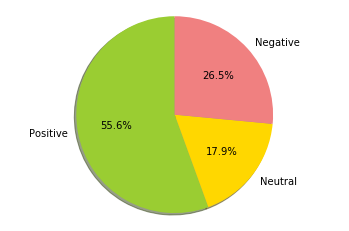

The f1Score is =  0.8545571245186135 

The Confusion Matix is = 
 [[18  4  0]
 [ 0 14  0]
 [ 0  6 38]] 

The accuracy is =  0.875 

The recall is =  0.893939393939394 

The Precision is =  0.8611111111111112 



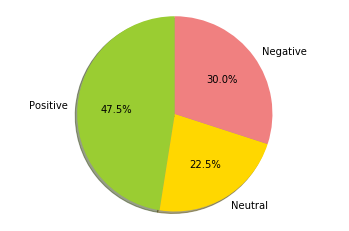

The f1Score is =  0.608695652173913 

The Confusion Matix is = 
 [[18 12  0]
 [ 0  6  0]
 [ 0 24 57]] 

The accuracy is =  0.6923076923076923 

The recall is =  0.7679012345679013 

The Precision is =  0.7142857142857143 



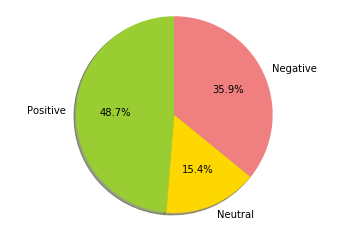

The f1Score is =  0.5520349830260566 

The Confusion Matix is = 
 [[ 27  20   0]
 [  0   1   0]
 [  0  29 114]] 

The accuracy is =  0.743455497382199 

The recall is =  0.7905569607697268 

The Precision is =  0.6733333333333333 



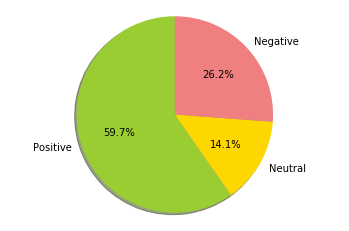

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



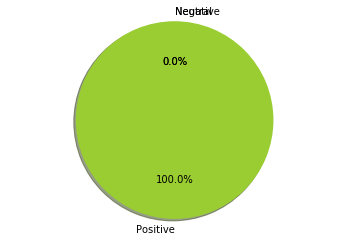

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



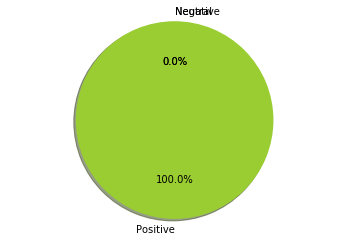

The f1Score is =  1.0 

The Confusion Matix is = 
 [[3 0]
 [0 1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



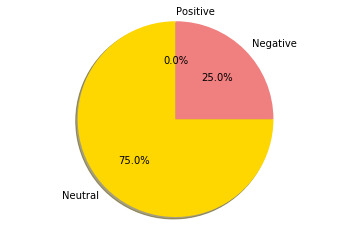

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



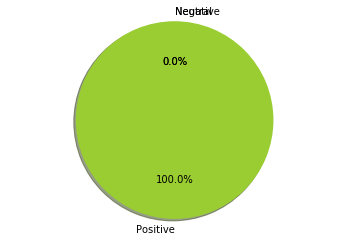

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



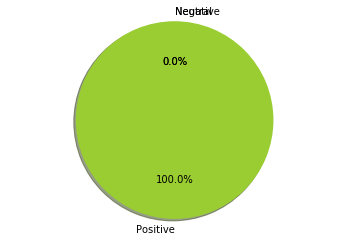

The f1Score is =  1.0 

The Confusion Matix is = 
 [[4 0]
 [0 4]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



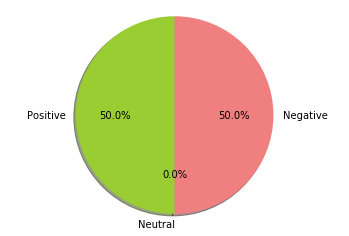

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



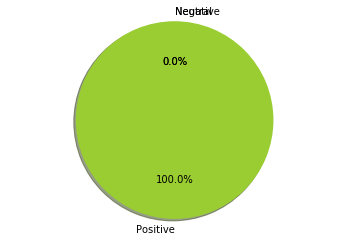

The f1Score is =  0.49444444444444446 

The Confusion Matix is = 
 [[ 6  4  0]
 [ 0  0  0]
 [ 0  8 11]] 

The accuracy is =  0.5862068965517241 

The recall is =  0.39298245614035093 

The Precision is =  0.6666666666666666 



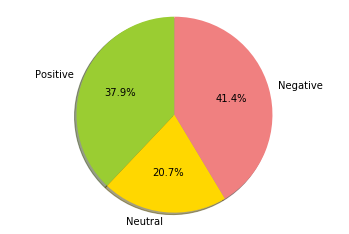

The f1Score is =  0.9118161816181618 

The Confusion Matix is = 
 [[11  2  0]
 [ 0 14  0]
 [ 0  3 49]] 

The accuracy is =  0.9367088607594937 

The recall is =  0.9294871794871794 

The Precision is =  0.912280701754386 



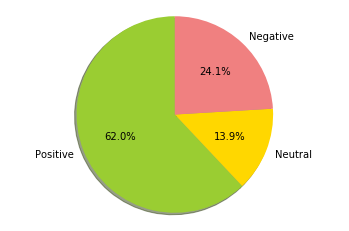

The f1Score is =  0.47678018575851394 

The Confusion Matix is = 
 [[ 4  9  0]
 [ 0  1  0]
 [ 0  6 16]] 

The accuracy is =  0.5833333333333334 

The recall is =  0.6783216783216783 

The Precision is =  0.6875 



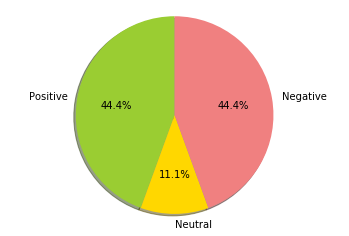

The f1Score is =  0.6555330634278003 

The Confusion Matix is = 
 [[ 5  3  0]
 [ 0  1  0]
 [ 0  3 27]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.8416666666666667 

The Precision is =  0.7142857142857143 



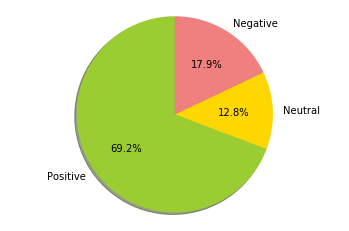

The f1Score is =  0.5740350877192982 

The Confusion Matix is = 
 [[ 8  3  0]
 [ 0  0  0]
 [ 0  6 22]] 

The accuracy is =  0.7692307692307693 

The recall is =  0.5043290043290044 

The Precision is =  0.6666666666666666 



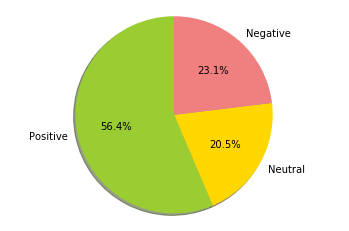

The f1Score is =  0.7690378476972185 

The Confusion Matix is = 
 [[ 7  3  0]
 [ 0 15  0]
 [ 0 18 77]] 

The accuracy is =  0.825 

The recall is =  0.8368421052631579 

The Precision is =  0.8055555555555557 



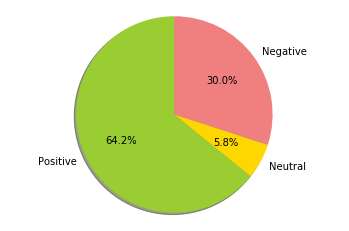

The f1Score is =  0.9368720947668318 

The Confusion Matix is = 
 [[18  2  0]
 [ 0 16  0]
 [ 0  2 38]] 

The accuracy is =  0.9473684210526315 

The recall is =  0.9499999999999998 

The Precision is =  0.9333333333333332 



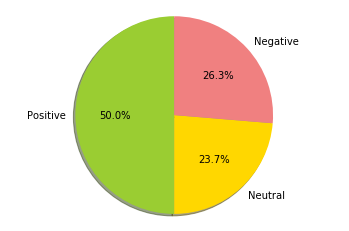

The f1Score is =  0.691005291005291 

The Confusion Matix is = 
 [[22  1  0]
 [ 0  3  0]
 [ 0  7  7]] 

The accuracy is =  0.8 

The recall is =  0.8188405797101449 

The Precision is =  0.7575757575757575 



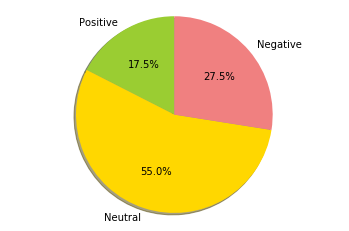

The f1Score is =  0.7559934318555008 

The Confusion Matix is = 
 [[39  9  0]
 [ 0 18  0]
 [ 0 18 36]] 

The accuracy is =  0.775 

The recall is =  0.8263888888888888 

The Precision is =  0.7999999999999999 



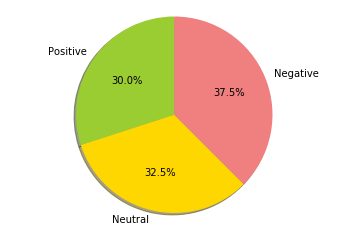

The f1Score is =  0.9436061015008383 

The Confusion Matix is = 
 [[ 9  1  0]
 [ 0 10  0]
 [ 0  1 19]] 

The accuracy is =  0.95 

The recall is =  0.9499999999999998 

The Precision is =  0.9444444444444445 



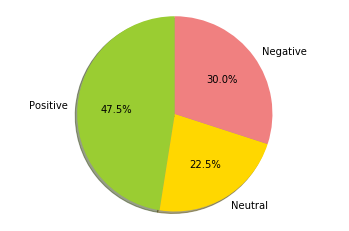

The f1Score is =  0.9583333333333334 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0 11  0]
 [ 0  2 23]] 

The accuracy is =  0.9487179487179487 

The recall is =  0.9733333333333333 

The Precision is =  0.9487179487179488 



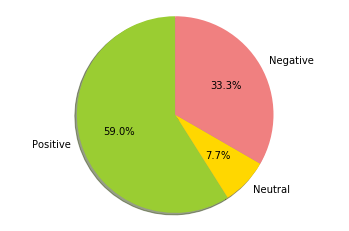

The f1Score is =  0.666094666094666 

The Confusion Matix is = 
 [[12  4  0]
 [ 0  1  0]
 [ 0  3 17]] 

The accuracy is =  0.8108108108108109 

The recall is =  0.8666666666666667 

The Precision is =  0.7083333333333334 



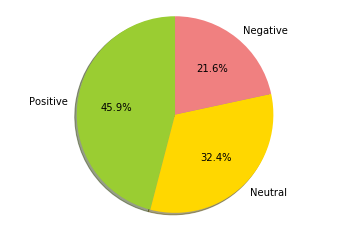

The f1Score is =  0.6888888888888888 

The Confusion Matix is = 
 [[13  4  0]
 [ 0  2  0]
 [ 0  2  4]] 

The accuracy is =  0.76 

The recall is =  0.8104575163398692 

The Precision is =  0.75 



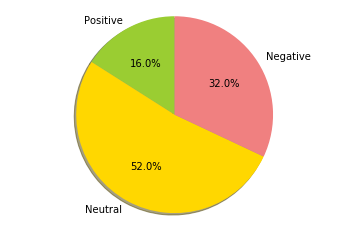

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



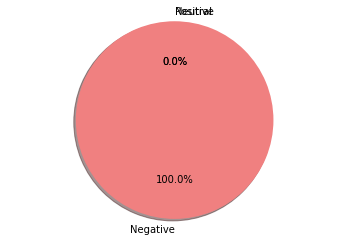

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0 0]
 [0 2 0]
 [0 0 8]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



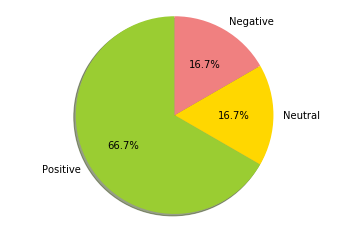

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 4  0]
 [ 0 13]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



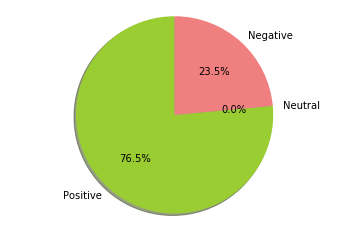

The f1Score is =  0.8585858585858586 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  1  0]
 [ 0  0 10]] 

The accuracy is =  0.9411764705882353 

The recall is =  0.9444444444444445 

The Precision is =  0.8333333333333334 



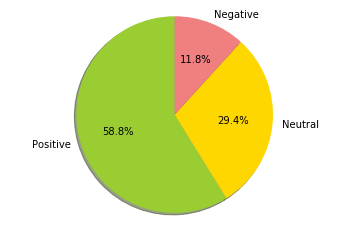

The f1Score is =  0.57 

The Confusion Matix is = 
 [[ 3  2  0]
 [ 0  0  0]
 [ 0  1 12]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.5076923076923077 

The Precision is =  0.6666666666666666 



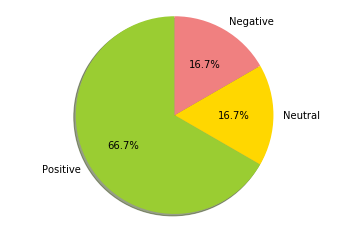

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0 10  0]
 [ 0  0 40]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



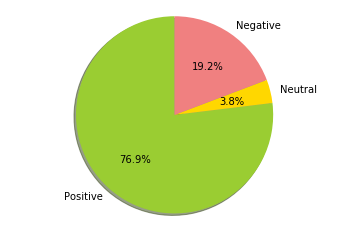

The f1Score is =  0.8722222222222222 

The Confusion Matix is = 
 [[ 8  0  0]
 [ 0  2  0]
 [ 0  2 19]] 

The accuracy is =  0.9354838709677419 

The recall is =  0.9682539682539683 

The Precision is =  0.8333333333333334 



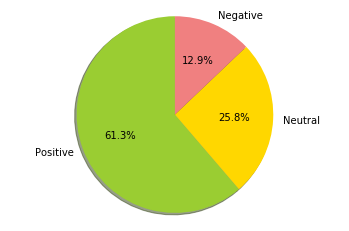

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 5  0  0]
 [ 0 15  0]
 [ 0  0 18]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



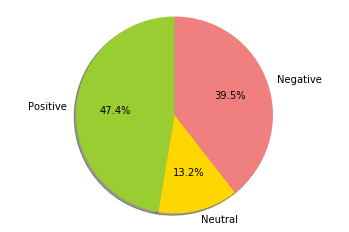

The f1Score is =  0.5 

The Confusion Matix is = 
 [[ 3  5  0]
 [ 0  0  0]
 [ 0  2 21]] 

The accuracy is =  0.7741935483870968 

The recall is =  0.42934782608695654 

The Precision is =  0.6666666666666666 



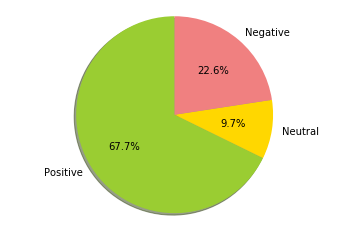

The f1Score is =  0.5815295815295816 

The Confusion Matix is = 
 [[ 5  4  0]
 [ 0  1  0]
 [ 0  6 19]] 

The accuracy is =  0.7142857142857143 

The recall is =  0.7718518518518519 

The Precision is =  0.6969696969696969 



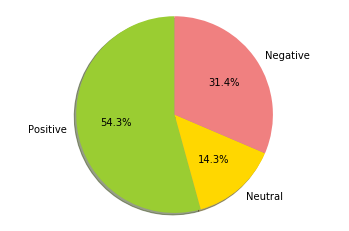

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  6  0]
 [ 0  0 23]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



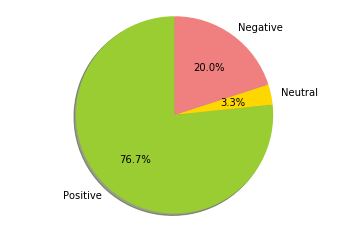

The f1Score is =  0.7968936678614097 

The Confusion Matix is = 
 [[10  0  0]
 [ 0  2  0]
 [ 0  5 44]] 

The accuracy is =  0.9180327868852459 

The recall is =  0.9659863945578232 

The Precision is =  0.7619047619047619 



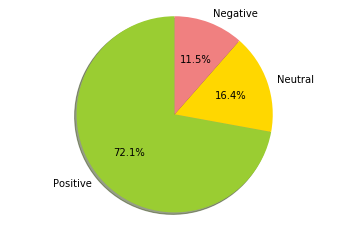

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0]
 [0 1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



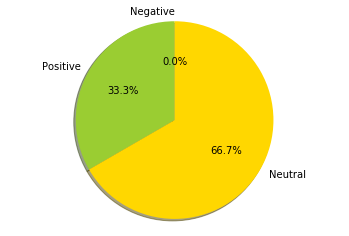

The f1Score is =  0.9209876543209877 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0 13  0]
 [ 0  0  5]] 

The accuracy is =  0.9523809523809523 

The recall is =  0.8888888888888888 

The Precision is =  0.9761904761904763 



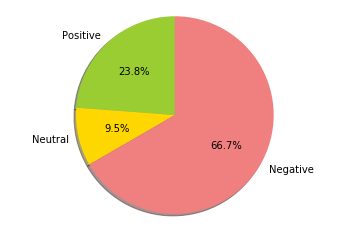

The f1Score is =  0.7415547415547415 

The Confusion Matix is = 
 [[ 9  3  0]
 [ 0  2  0]
 [ 0  2 12]] 

The accuracy is =  0.8214285714285714 

The recall is =  0.8690476190476191 

The Precision is =  0.7619047619047619 



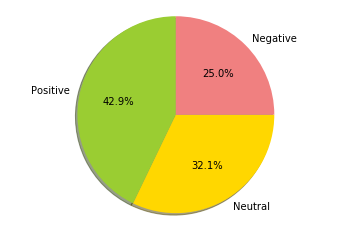

The f1Score is =  0.8551587301587302 

The Confusion Matix is = 
 [[ 7  2  0]
 [ 0 15  0]
 [ 0  4 12]] 

The accuracy is =  0.85 

The recall is =  0.8425925925925926 

The Precision is =  0.9047619047619048 



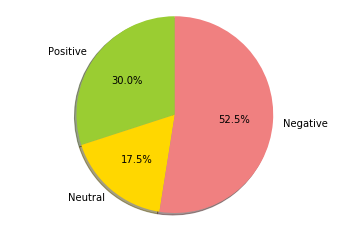

The f1Score is =  0.779828940748481 

The Confusion Matix is = 
 [[10  7  0]
 [ 0 10  0]
 [ 0  2 10]] 

The accuracy is =  0.7692307692307693 

The recall is =  0.8071895424836603 

The Precision is =  0.8421052631578947 



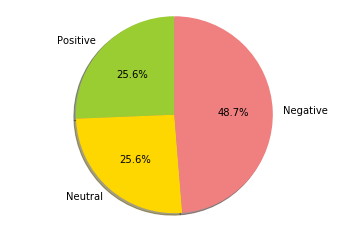

The f1Score is =  0.6797385620915032 

The Confusion Matix is = 
 [[ 6  5  0]
 [ 0  5  0]
 [ 0  6 18]] 

The accuracy is =  0.725 

The recall is =  0.7651515151515151 

The Precision is =  0.7708333333333334 



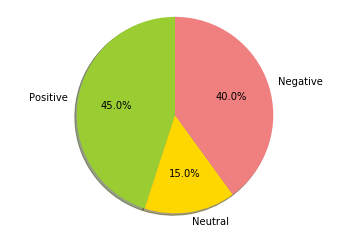

The f1Score is =  0.9495313881520778 

The Confusion Matix is = 
 [[12  1  0]
 [ 0 12  0]
 [ 0  1 14]] 

The accuracy is =  0.95 

The recall is =  0.9521367521367522 

The Precision is =  0.9523809523809524 



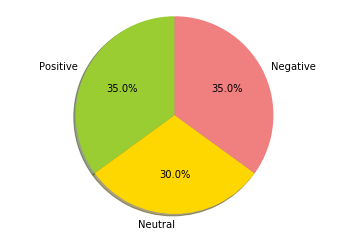

The f1Score is =  0.9528619528619529 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0 16  0]
 [ 0  0 19]] 

The accuracy is =  0.975 

The recall is =  0.9333333333333332 

The Precision is =  0.9803921568627452 



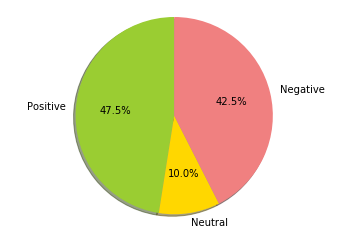

The f1Score is =  0.8638753747112881 

The Confusion Matix is = 
 [[ 9  1  0]
 [ 0  8  0]
 [ 0  4 15]] 

The accuracy is =  0.8648648648648649 

The recall is =  0.8964912280701753 

The Precision is =  0.8717948717948718 



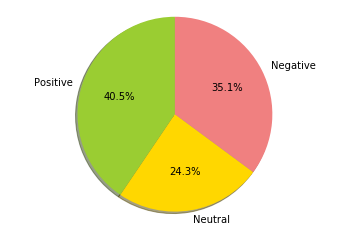

The f1Score is =  0.713773681515617 

The Confusion Matix is = 
 [[14  3  0]
 [ 0  1  0]
 [ 0  2 20]] 

The accuracy is =  0.875 

The recall is =  0.9108734402852049 

The Precision is =  0.7222222222222223 



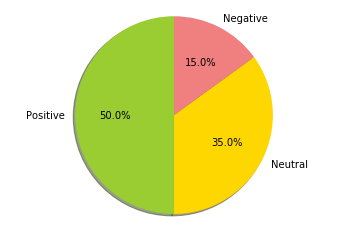

The f1Score is =  0.7592592592592592 

The Confusion Matix is = 
 [[16  4  0]
 [ 0  5  0]
 [ 0  4 10]] 

The accuracy is =  0.7948717948717948 

The recall is =  0.8380952380952381 

The Precision is =  0.7948717948717948 



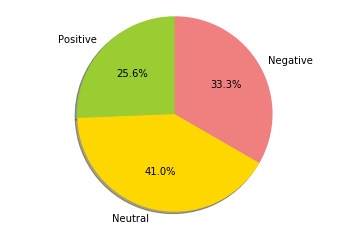

The f1Score is =  0.8464696223316913 

The Confusion Matix is = 
 [[ 9  3  0]
 [ 0 11  0]
 [ 0  3 13]] 

The accuracy is =  0.8461538461538461 

The recall is =  0.8541666666666666 

The Precision is =  0.8823529411764706 



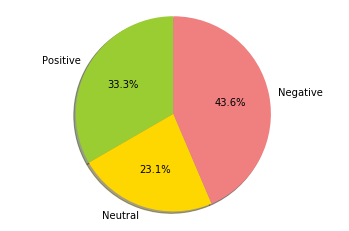

The f1Score is =  0.8747325631151047 

The Confusion Matix is = 
 [[ 9  1  0]
 [ 0  6  0]
 [ 0  3 19]] 

The accuracy is =  0.8947368421052632 

The recall is =  0.9212121212121213 

The Precision is =  0.8666666666666667 



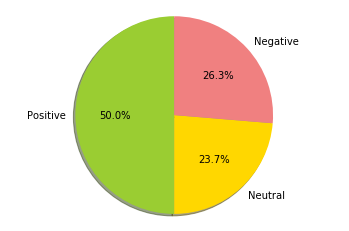

The f1Score is =  0.6045548654244306 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  0  0]
 [ 0  3 33]] 

The accuracy is =  0.9 

The recall is =  0.5555555555555555 

The Precision is =  0.6666666666666666 



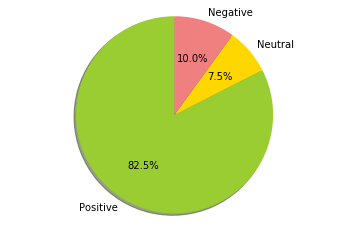

The f1Score is =  0.9816207184628237 

The Confusion Matix is = 
 [[ 4  0  0]
 [ 0 10  0]
 [ 0  1 66]] 

The accuracy is =  0.9876543209876543 

The recall is =  0.9950248756218905 

The Precision is =  0.9696969696969697 



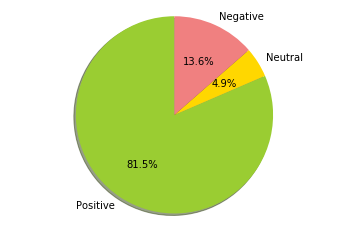

The f1Score is =  0.8342941611234295 

The Confusion Matix is = 
 [[ 4  3  0]
 [ 0  8  0]
 [ 0  1 20]] 

The accuracy is =  0.8888888888888888 

The recall is =  0.8412698412698413 

The Precision is =  0.8888888888888888 



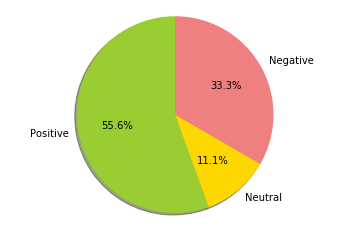

The f1Score is =  0.8098009974182583 

The Confusion Matix is = 
 [[ 6  6  0]
 [ 0 16  0]
 [ 0  3 83]] 

The accuracy is =  0.9210526315789473 

The recall is =  0.8217054263565892 

The Precision is =  0.88 



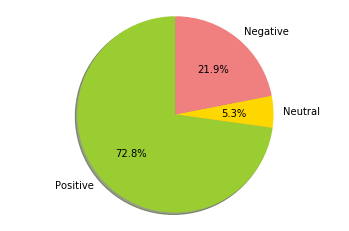

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1 0]
 [0 3]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



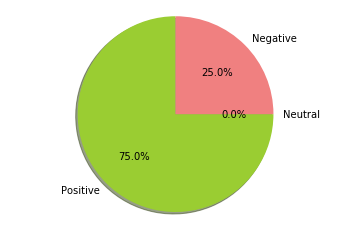

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  1  0]
 [ 0  0 14]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



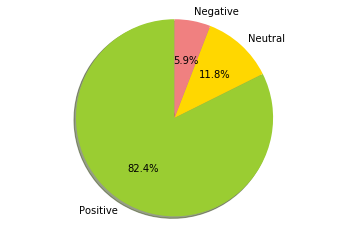

The f1Score is =  0.9166666666666666 

The Confusion Matix is = 
 [[ 7  0  0]
 [ 0  5  0]
 [ 0  2 11]] 

The accuracy is =  0.92 

The recall is =  0.9487179487179488 

The Precision is =  0.9047619047619048 



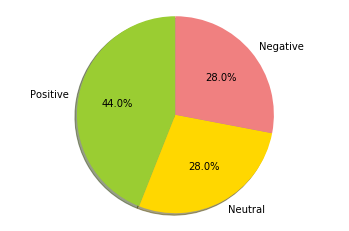

The f1Score is =  0.5503496503496503 

The Confusion Matix is = 
 [[5 3 0]
 [0 1 0]
 [0 6 7]] 

The accuracy is =  0.5909090909090909 

The recall is =  0.7211538461538461 

The Precision is =  0.7000000000000001 



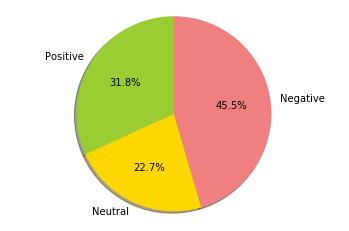

The f1Score is =  0.8484848484848485 

The Confusion Matix is = 
 [[ 5  1  0]
 [ 0  4  0]
 [ 0  2 10]] 

The accuracy is =  0.8636363636363636 

The recall is =  0.888888888888889 

The Precision is =  0.8571428571428571 



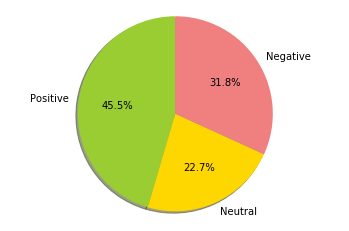

The f1Score is =  0.4587813620071685 

The Confusion Matix is = 
 [[ 7  7  0]
 [ 0  0  0]
 [ 0 18 22]] 

The accuracy is =  0.5370370370370371 

The recall is =  0.35000000000000003 

The Precision is =  0.6666666666666666 



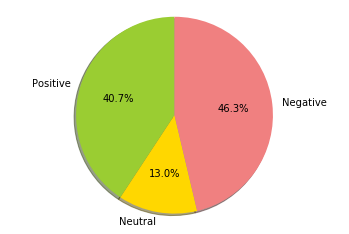

The f1Score is =  0.9339248504402771 

The Confusion Matix is = 
 [[ 9  1  0]
 [ 0  8  0]
 [ 0  1 14]] 

The accuracy is =  0.9393939393939394 

The recall is =  0.9444444444444443 

The Precision is =  0.9333333333333332 



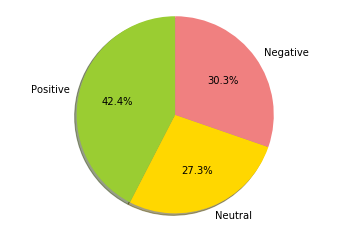

The f1Score is =  0.5952861952861953 

The Confusion Matix is = 
 [[16  8  0]
 [ 0  3  0]
 [ 0 13 21]] 

The accuracy is =  0.6557377049180327 

The recall is =  0.761437908496732 

The Precision is =  0.7083333333333334 



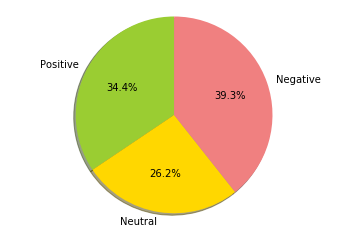

The f1Score is =  0.8800000000000001 

The Confusion Matix is = 
 [[ 2  0]
 [ 1 12]] 

The accuracy is =  0.9333333333333333 

The recall is =  0.9615384615384616 

The Precision is =  0.8333333333333333 



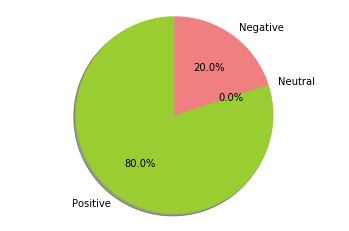

The f1Score is =  1.0 

The Confusion Matix is = 
 [[2 0]
 [0 9]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



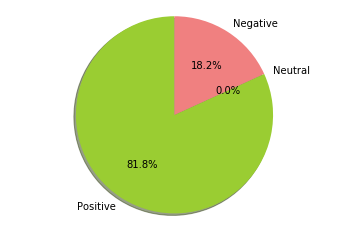

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0 18  0]
 [ 0  0 88]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



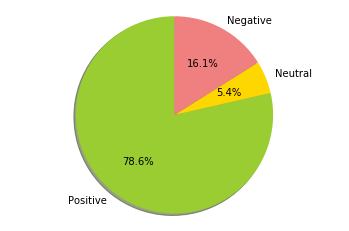

The f1Score is =  0.9276081562196569 

The Confusion Matix is = 
 [[11  1  0]
 [ 0 14  0]
 [ 0  2 12]] 

The accuracy is =  0.925 

The recall is =  0.9246031746031745 

The Precision is =  0.9411764705882352 



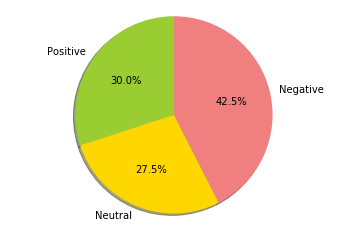

The f1Score is =  0.6195355191256832 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  7  0]
 [ 0  1 30]] 

The accuracy is =  0.9487179487179487 

The recall is =  0.6559139784946236 

The Precision is =  0.5925925925925926 



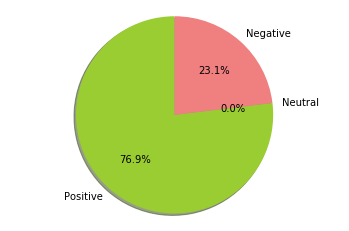

The f1Score is =  0.5074398871329536 

The Confusion Matix is = 
 [[ 24  34   0]
 [  0   6   0]
 [  0  62 147]] 

The accuracy is =  0.6483516483516484 

The recall is =  0.7057141285816422 

The Precision is =  0.6862745098039215 



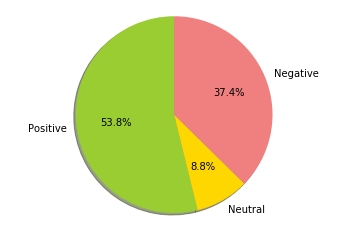

The f1Score is =  0.6898809523809524 

The Confusion Matix is = 
 [[ 9  3  0]
 [ 0  3  0]
 [ 0  6 13]] 

The accuracy is =  0.7352941176470589 

The recall is =  0.8114035087719298 

The Precision is =  0.75 



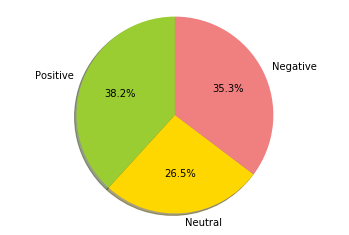

The f1Score is =  0.524731182795699 

The Confusion Matix is = 
 [[18  9  0]
 [ 0  0  0]
 [ 0 14 24]] 

The accuracy is =  0.6461538461538462 

The recall is =  0.43274853801169594 

The Precision is =  0.6666666666666666 



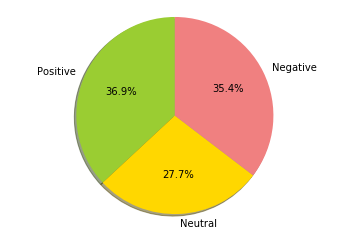

The f1Score is =  0.8811016569637259 

The Confusion Matix is = 
 [[13  3  0]
 [ 0 11  0]
 [ 0  3 37]] 

The accuracy is =  0.9104477611940298 

The recall is =  0.9125 

The Precision is =  0.8823529411764706 



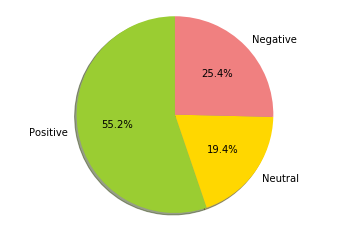

The f1Score is =  0.3333333333333333 

The Confusion Matix is = 
 [[0 1 0]
 [0 0 0]
 [0 0 2]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.3333333333333333 

The Precision is =  0.3333333333333333 



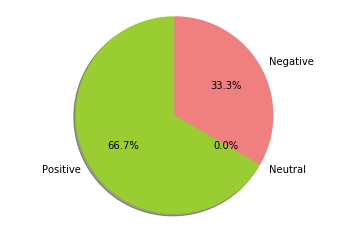

The f1Score is =  0.6183150183150183 

The Confusion Matix is = 
 [[ 8  4  0]
 [ 0  2  0]
 [ 0  6 10]] 

The accuracy is =  0.6666666666666666 

The recall is =  0.7638888888888888 

The Precision is =  0.7222222222222223 



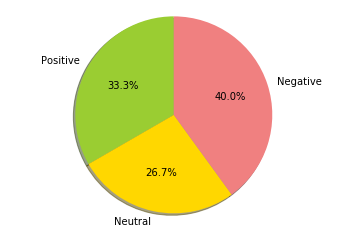

The f1Score is =  0.8063063063063063 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0  5  0]
 [ 0  3 17]] 

The accuracy is =  0.84375 

The recall is =  0.8547619047619048 

The Precision is =  0.8333333333333334 



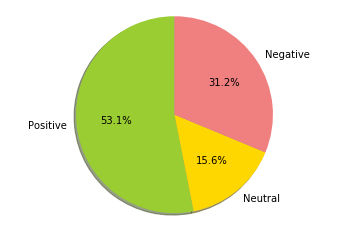

The f1Score is =  0.8585365853658536 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  4  0]
 [ 0  1 20]] 

The accuracy is =  0.9285714285714286 

The recall is =  0.8730158730158729 

The Precision is =  0.8888888888888888 



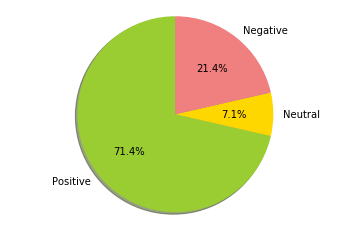

The f1Score is =  0.8621212121212122 

The Confusion Matix is = 
 [[20  4  0]
 [ 0  8  0]
 [ 0  2 19]] 

The accuracy is =  0.8867924528301887 

The recall is =  0.9126984126984127 

The Precision is =  0.8571428571428571 



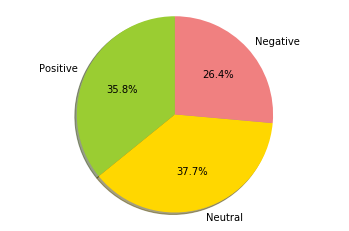

The f1Score is =  0.8553872053872055 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  4  0]
 [ 0  2 19]] 

The accuracy is =  0.9 

The recall is =  0.9015873015873016 

The Precision is =  0.8571428571428571 



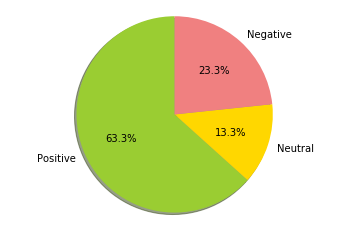

The f1Score is =  0.8236024844720496 

The Confusion Matix is = 
 [[ 5  4  0]
 [ 0 10  0]
 [ 0  1 11]] 

The accuracy is =  0.8387096774193549 

The recall is =  0.8240740740740741 

The Precision is =  0.8888888888888888 



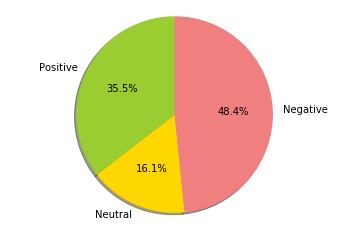

The f1Score is =  0.8902356902356904 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  4  0]
 [ 0  1 27]] 

The accuracy is =  0.9459459459459459 

The recall is =  0.9214285714285714 

The Precision is =  0.8888888888888888 



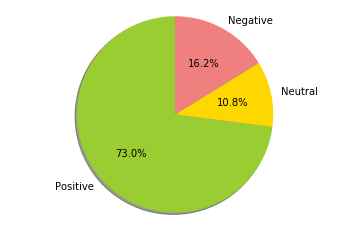

The f1Score is =  0.975363941769317 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  9  0]
 [ 0  1 23]] 

The accuracy is =  0.9705882352941176 

The recall is =  0.9861111111111112 

The Precision is =  0.9666666666666667 



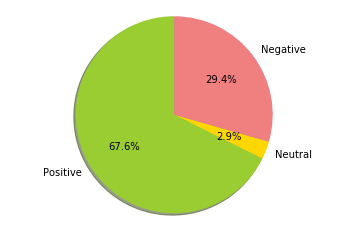

The f1Score is =  0.8761904761904762 

The Confusion Matix is = 
 [[ 2  1  0]
 [ 0  6  0]
 [ 0  1 17]] 

The accuracy is =  0.9259259259259259 

The recall is =  0.8703703703703702 

The Precision is =  0.9166666666666666 



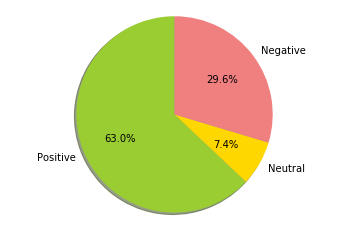

The f1Score is =  0.4988662131519275 

The Confusion Matix is = 
 [[ 8  5  0]
 [ 0  0  0]
 [ 0 13 18]] 

The accuracy is =  0.5909090909090909 

The recall is =  0.3986765922249793 

The Precision is =  0.6666666666666666 



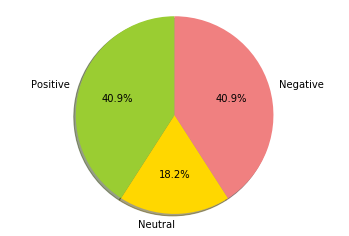

The f1Score is =  0.7719522591645354 

The Confusion Matix is = 
 [[ 9  2  0]
 [ 0  6  0]
 [ 0  9 38]] 

The accuracy is =  0.828125 

The recall is =  0.8755641521598969 

The Precision is =  0.7843137254901961 



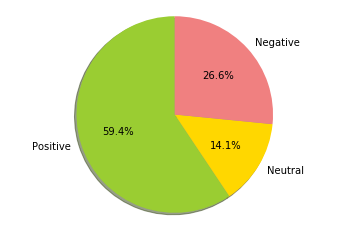

The f1Score is =  0.7908661809577184 

The Confusion Matix is = 
 [[21  8  0]
 [ 0 17  0]
 [ 0 11 45]] 

The accuracy is =  0.8137254901960784 

The recall is =  0.8425697865353037 

The Precision is =  0.8240740740740741 



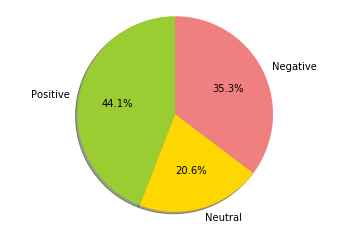

The f1Score is =  0.6631172839506173 

The Confusion Matix is = 
 [[ 4  7  0]
 [ 0  7  0]
 [ 0  6 45]] 

The accuracy is =  0.8115942028985508 

The recall is =  0.7486631016042781 

The Precision is =  0.7833333333333333 



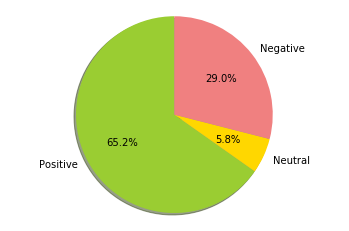

The f1Score is =  0.8425316496839095 

The Confusion Matix is = 
 [[17  9  0]
 [ 0 21  0]
 [ 0  2 17]] 

The accuracy is =  0.8333333333333334 

The recall is =  0.849527665317139 

The Precision is =  0.8854166666666666 



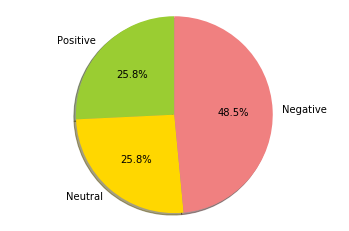

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0  0]
 [ 0  4  0]
 [ 0  0 30]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



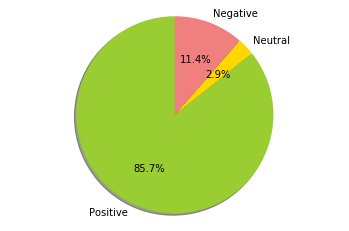

The f1Score is =  0.611111111111111 

The Confusion Matix is = 
 [[5 2 0]
 [0 0 0]
 [0 0 2]] 

The accuracy is =  0.7777777777777778 

The recall is =  0.5714285714285715 

The Precision is =  0.6666666666666666 



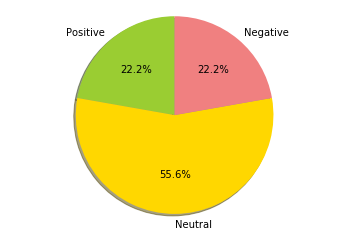

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 1  0]
 [ 0 18]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



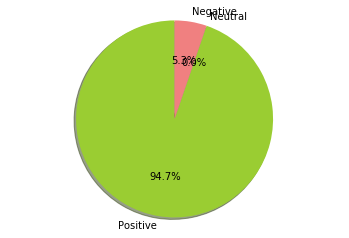

The f1Score is =  0.9259259259259259 

The Confusion Matix is = 
 [[ 4  1  0]
 [ 0  4  0]
 [ 0  0 16]] 

The accuracy is =  0.96 

The recall is =  0.9333333333333332 

The Precision is =  0.9333333333333332 



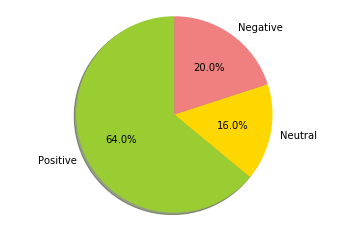

The f1Score is =  0.9305555555555555 

The Confusion Matix is = 
 [[12  0  0]
 [ 0  7  0]
 [ 0  2 11]] 

The accuracy is =  0.9375 

The recall is =  0.9487179487179488 

The Precision is =  0.9259259259259259 



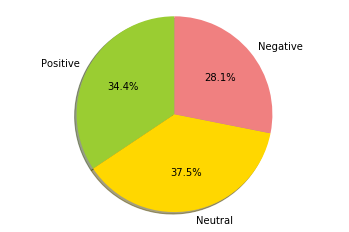

The f1Score is =  0.8761904761904762 

The Confusion Matix is = 
 [[ 3  1  0]
 [ 0  4  0]
 [ 0  1 17]] 

The accuracy is =  0.9230769230769231 

The recall is =  0.8981481481481483 

The Precision is =  0.8888888888888888 



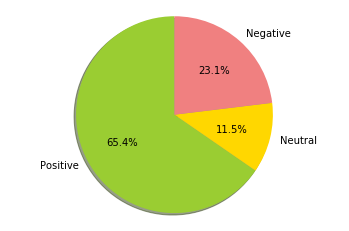

The f1Score is =  0.6769895753877448 

The Confusion Matix is = 
 [[10  3  0]
 [ 0  2  0]
 [ 0  8 34]] 

The accuracy is =  0.8070175438596491 

The recall is =  0.8595848595848595 

The Precision is =  0.717948717948718 



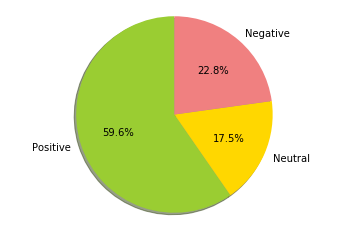

The f1Score is =  0.4521739130434783 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0  1  0]
 [ 0  2 22]] 

The accuracy is =  0.8846153846153846 

The recall is =  0.6388888888888888 

The Precision is =  0.4166666666666667 



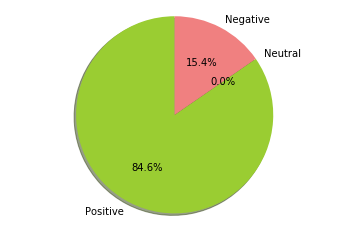

The f1Score is =  0.9328165374677003 

The Confusion Matix is = 
 [[ 4  0]
 [ 1 21]] 

The accuracy is =  0.9615384615384616 

The recall is =  0.9772727272727273 

The Precision is =  0.9 



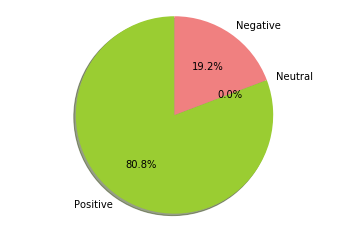

The f1Score is =  0.42857142857142855 

The Confusion Matix is = 
 [[0 0]
 [2 6]] 

The accuracy is =  0.75 

The recall is =  0.375 

The Precision is =  0.5 



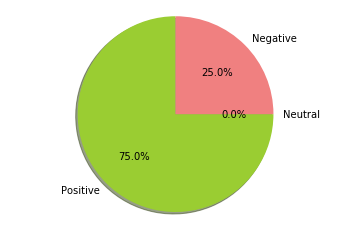

The f1Score is =  1.0 

The Confusion Matix is = 
 [[1]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



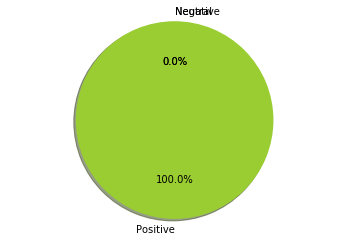

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0  7  0]
 [ 0  0 11]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



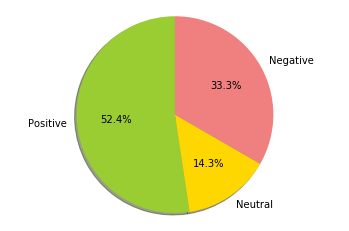

The f1Score is =  0.42453260373917007 

The Confusion Matix is = 
 [[ 9 16  0]
 [ 0  0  0]
 [ 0 11 16]] 

The accuracy is =  0.4807692307692308 

The recall is =  0.31753086419753085 

The Precision is =  0.6666666666666666 



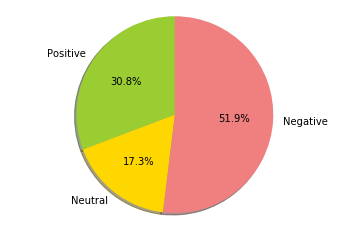

The f1Score is =  0.9561602418745275 

The Confusion Matix is = 
 [[ 6  0  0]
 [ 0  4  0]
 [ 0  1 24]] 

The accuracy is =  0.9714285714285714 

The recall is =  0.9866666666666667 

The Precision is =  0.9333333333333332 



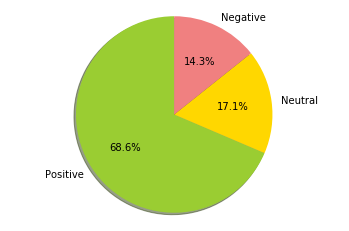

The f1Score is =  0.8365079365079365 

The Confusion Matix is = 
 [[ 5  2  0]
 [ 0  8  0]
 [ 0  3 16]] 

The accuracy is =  0.8529411764705882 

The recall is =  0.8521303258145364 

The Precision is =  0.8717948717948718 



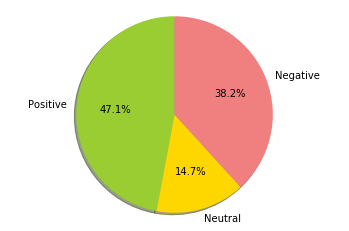

The f1Score is =  0.5396825396825397 

The Confusion Matix is = 
 [[ 2  2  0]
 [ 0  0  0]
 [ 0  3 30]] 

The accuracy is =  0.8648648648648649 

The recall is =  0.4696969696969697 

The Precision is =  0.6666666666666666 



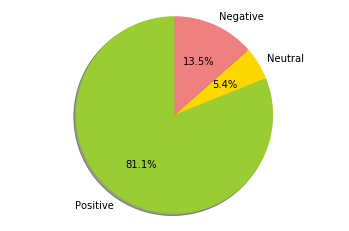

The f1Score is =  0.4004329004329004 

The Confusion Matix is = 
 [[ 6 16  0]
 [ 0  0  0]
 [ 0 20 34]] 

The accuracy is =  0.5263157894736842 

The recall is =  0.30078563411896747 

The Precision is =  0.6666666666666666 



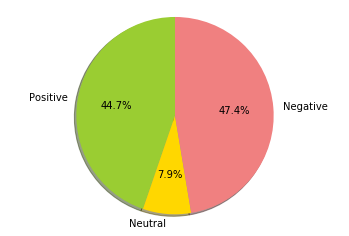

The f1Score is =  0.7788461538461539 

The Confusion Matix is = 
 [[14  4  0]
 [ 0  4  0]
 [ 0  4 50]] 

The accuracy is =  0.8947368421052632 

The recall is =  0.9012345679012346 

The Precision is =  0.7777777777777777 



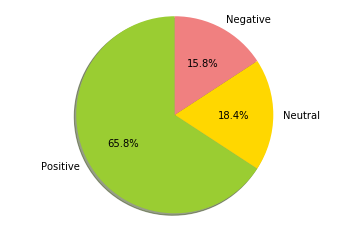

The f1Score is =  0.5965811965811966 

The Confusion Matix is = 
 [[ 0  1  0]
 [ 0 13  0]
 [ 0  3 18]] 

The accuracy is =  0.8857142857142857 

The recall is =  0.6190476190476191 

The Precision is =  0.5882352941176471 



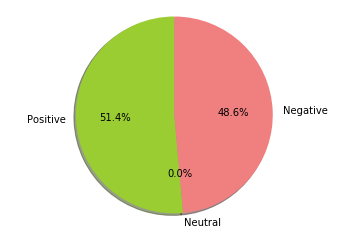

The f1Score is =  1.0 

The Confusion Matix is = 
 [[ 2  0  0]
 [ 0  9  0]
 [ 0  0 22]] 

The accuracy is =  1.0 

The recall is =  1.0 

The Precision is =  1.0 



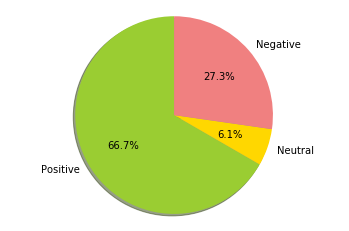

The f1Score is =  0.9419191919191919 

The Confusion Matix is = 
 [[10  2  0]
 [ 0 11  0]
 [ 0  0 42]] 

The accuracy is =  0.9692307692307692 

The recall is =  0.9444444444444445 

The Precision is =  0.9487179487179488 



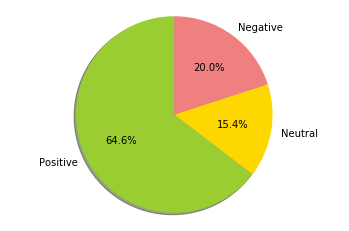

The f1Score is =  0.5454545454545454 

The Confusion Matix is = 
 [[5 1 0]
 [0 0 0]
 [0 6 8]] 

The accuracy is =  0.65 

The recall is =  0.4682539682539682 

The Precision is =  0.6666666666666666 



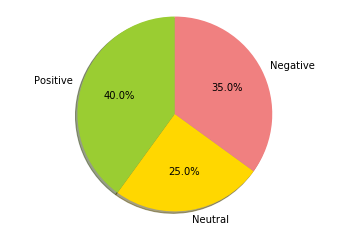

The f1Score is =  0.911018711018711 

The Confusion Matix is = 
 [[13  4  0]
 [ 0 17  0]
 [ 0  1 92]] 

The accuracy is =  0.9606299212598425 

The recall is =  0.9179843980602994 

The Precision is =  0.9242424242424242 



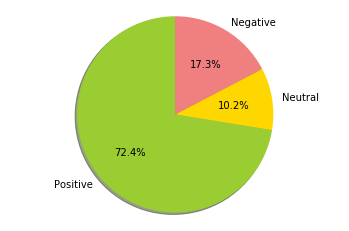

The f1Score is =  0.9628647214854111 

The Confusion Matix is = 
 [[ 6  1  0]
 [ 0 14  0]
 [ 0  0 15]] 

The accuracy is =  0.9722222222222222 

The recall is =  0.9523809523809524 

The Precision is =  0.9777777777777779 



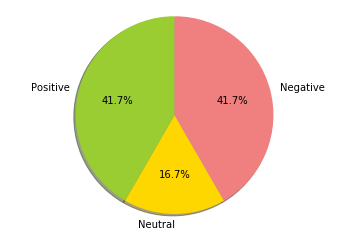

The f1Score is =  0.6158444158444158 

The Confusion Matix is = 
 [[ 6 15  0]
 [ 0  8  0]
 [ 0  4 35]] 

The accuracy is =  0.7205882352941176 

The recall is =  0.7277167277167277 

The Precision is =  0.7654320987654321 



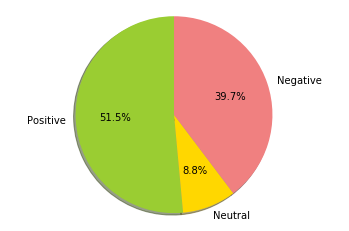

The f1Score is =  0.9784047370254267 

The Confusion Matix is = 
 [[ 3  0  0]
 [ 0 14  0]
 [ 0  1 16]] 

The accuracy is =  0.9705882352941176 

The recall is =  0.9803921568627452 

The Precision is =  0.9777777777777779 



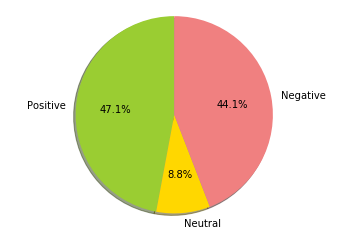

The f1Score is =  0.9086419753086421 

The Confusion Matix is = 
 [[13  1  0]
 [ 0  4  0]
 [ 0  1 13]] 

The accuracy is =  0.9375 

The recall is =  0.9523809523809524 

The Precision is =  0.8888888888888888 



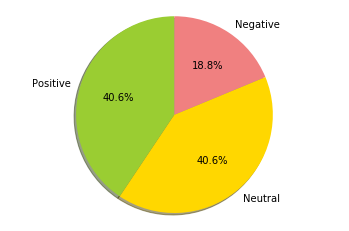

The f1Score is =  0.9055555555555556 

The Confusion Matix is = 
 [[ 4  2  0]
 [ 0 11  0]
 [ 0  0 16]] 

The accuracy is =  0.9393939393939394 

The recall is =  0.8888888888888888 

The Precision is =  0.9487179487179488 



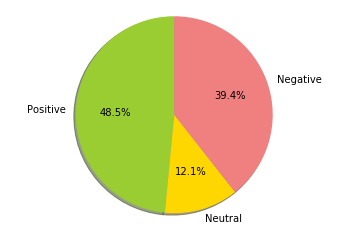

The f1Score is =  0.8296296296296296 

The Confusion Matix is = 
 [[8 2 0]
 [0 3 0]
 [0 1 7]] 

The accuracy is =  0.8571428571428571 

The recall is =  0.8916666666666666 

The Precision is =  0.8333333333333334 



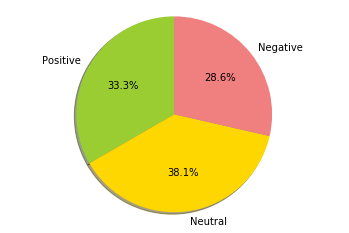

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 25214 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 24037 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 20316 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 25171 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 20860 missing from c

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 34315 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 26524 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 21205 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 32862 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 127942 missing from 

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 127968 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 25214 missing from current font.
  font.set_text(s, 0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 24037 missing from current font.
  font.set_text(s, 0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 20316 missing from current font.
  font.set_text(s, 0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 25171 missing from curren

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 34315 missing from current font.
  font.set_text(s, 0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 26524 missing from current font.
  font.set_text(s, 0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 21205 missing from current font.
  font.set_text(s, 0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 32862 missing from current font.
  font.set_text(s, 0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 127942 missing from current 

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 65293 missing from current font.
  font.set_text(s, 0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 127968 missing from current font.
  font.set_text(s, 0, flags=flags)


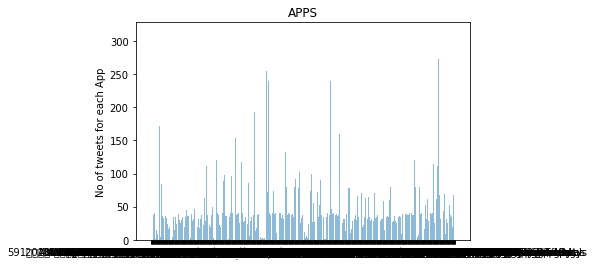

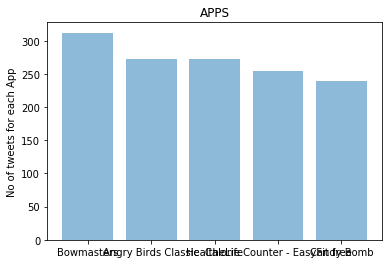

In [39]:
forEachApp(tweets)

In [28]:
s=input("Enter Your Tweet Here\n")
output= tweetAsAnInput(s)
print("The Sentiment of the tweet is = ",output)

Enter Your Tweet Here
I am not happy with you 
The Sentiment of the tweet is =  negative


In [165]:
kMeans(actualSentiment,tweets)

The f1Score is =  0.25712699457404603 

The Confusion Matix is = 
 [[   0  236  928]
 [   0    2  663]
 [   3  201 2967]] 

The accuracy is =  0.5938 

The recall is =  0.3128915002738635 

The Precision is =  0.21849973496081718 

